In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from collections import Counter
import random


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
!unzip -q "/content/drive/MyDrive/flowers.zip" -d "/content/"

In [5]:
# Specify the path to the directory containing your images
data_dir = "/content/flowers"

# Get a list of image file names in the directory
image_files = [f for f in os.listdir(data_dir) if f.endswith(('.jpg', '.jpeg'))]

# All Functions

In [26]:
# Choose a range of cluster numbers to test
def find_Keams_Cluster(features_array):
  cluster_range = range(3, 8)
  distortions = []

  # Find the optimal number of clusters using Silhouette Score
  best_score = -1
  best_n_clusters = -1

  for n_clusters in cluster_range:
      kmeans = KMeans(n_clusters=n_clusters, random_state=42)
      cluster_labels = kmeans.fit_predict(features_array)
      silhouette_avg = silhouette_score(features_array, cluster_labels)
      distortions.append(kmeans.inertia_)
      print(f"For n_clusters={n_clusters}, the silhouette score is {silhouette_avg}")

      if silhouette_avg > best_score:
          best_score = silhouette_avg
          best_n_clusters = n_clusters

  print(f"Best number of clusters: {best_n_clusters} with silhouette score: {best_score}")
  return best_n_clusters,distortions;


In [27]:
# Plot the Elbow curve
# Adjust this visualization based on your specific needs
def PlotElowCurve(distortions, best_n_clusters):
  # Plot the elbow method graph
  plt.plot(range(3, 8), distortions, marker='o')
  plt.xlabel('Number of Clusters')
  plt.ylabel('Inertia')
  plt.title('Elbow Method for Optimal K')
  plt.show()
  print(distortions)
  # Choose the optimal number of clusters based on the Elbow curve
  optimal_k = distortions.index(min(distortions)) + 1
  print(f"Optimal number of clusters: {best_n_clusters}")


In [28]:
def Get_ClusterItems(feature_array,best_n_clusters):
  # Apply K-means with the optimal number of clusters
  kmeans = KMeans(n_clusters=best_n_clusters, random_state=42)
  kmeans_labels = kmeans.fit_predict(feature_array)

  # Count the number of images in each cluster
  cluster_counts = Counter(kmeans_labels)

  # Print the count of images in each cluster
  for cluster, count in cluster_counts.items():
      print(f"Cluster {cluster + 1}: {count} images")
  return kmeans_labels;

In [29]:
# Visualize the clusters in a scatter plot
def ShowClusters(feature_array):
  plt.scatter(feature_array[:, 0], feature_array[:, 1], c=cluster_labels, cmap='viridis')
  plt.title('K-Means Clustering with ResNet50 Features')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.show()

In [30]:
# Organize items by cluster label
def cluster_image_mappping(cluster_labels):
  cluster_items = {}
  for idx, cluster_label in enumerate(cluster_labels):
      if cluster_label not in cluster_items:
          cluster_items[cluster_label] = []
      cluster_items[cluster_label].append(image_files[idx])
  return cluster_items;

In [31]:
def PlotImages(dic_Clusters_images):
  for cluster_label, items in dic_Clusters_images.items():
      print(f"Cluster {cluster_label}: {len(items)} items")

      # Select a random subset of 10 images
      random_subset = random.sample(items, min(10, len(items)))

      # Display images
      plt.figure(figsize=(15, 1.5))
      for i, img_name in enumerate(random_subset):
          img_path = os.path.join(data_dir, img_name)
          img = image.load_img(img_path, target_size=(224, 224))
          plt.subplot(1, 10, i + 1)
          plt.imshow(img)
          plt.axis('off')
      plt.show()
      print()

In [32]:
def PlotPCAVariance(pca_obj):
  # Plot the explained variance
  fig, ax = plt.subplots()
  plt.plot(np.cumsum(pca_obj.explained_variance_ratio_))
  plt.axhline(y=0.95, color='r', linestyle='-')
  plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)
  plt.xlabel('Number of Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title('Explained Variance vs. Number of Components')
  ax.grid(axis='x')
  plt.show()

# VGG16

In [6]:
from keras.applications.vgg16 import VGG16, preprocess_input

In [7]:
# Load the pre-trained VGG16 model (without the top layer)
vgg_model = VGG16(weights='imagenet', include_top=False)

x_vgg16 = vgg_model.output
x_vgg16 = GlobalAveragePooling2D()(x_vgg16)
model_vgg16 = Model(inputs=vgg_model.input, outputs=x_vgg16)

58889256/58889256 [==============================] - 0s 0us/step


In [22]:
# Function to extract features using VGG16
def extract_features_vgg16(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_preprocessed = preprocess_input(img_array)
    # Use VGG16 to extract features
    features = model_vgg16.predict(img_preprocessed)
    # Flatten the features to use as input to other models or algorithms
    features_flattened = features.flatten()
    return features_flattened

In [13]:
# Load images and extract features
# Initialize an array to store features for all images
all_features_vgg16 = []

# Extract features for each image
for img_file in tqdm(image_files, desc="Extracting features"):
    img_path = os.path.join(data_dir, img_file)
    features = extract_features_vgg16(img_path)
    all_features_vgg16.append(features)

# Convert the features to a numpy array
features_vgg16 = np.array(all_features_vgg16)
np.save("/content/features_vgg16.npy", features_vgg16)

Extracting features:   0%|          | 0/3669 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   0%|          | 2/3669 [00:00<03:50, 15.91it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   0%|          | 4/3669 [00:00<03:53, 15.72it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   0%|          | 6/3669 [00:00<03:56, 15.52it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   0%|          | 8/3669 [00:00<04:03, 15.02it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   0%|          | 10/3669 [00:00<04:03, 15.00it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   0%|          | 12/3669 [00:00<03:59, 15.26it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   0%|          | 14/3669 [00:00<03:58, 15.33it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   0%|          | 16/3669 [00:01<03:59, 15.26it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   0%|          | 18/3669 [00:01<04:11, 14.52it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 20/3669 [00:01<04:12, 14.44it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   1%|          | 22/3669 [00:01<04:05, 14.88it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 24/3669 [00:01<04:08, 14.68it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   1%|          | 26/3669 [00:01<04:07, 14.73it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 28/3669 [00:01<04:01, 15.09it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   1%|          | 30/3669 [00:01<03:57, 15.30it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 32/3669 [00:02<03:54, 15.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   1%|          | 34/3669 [00:02<03:57, 15.30it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   1%|          | 36/3669 [00:02<03:57, 15.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   1%|          | 38/3669 [00:02<04:02, 14.96it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 40/3669 [00:02<03:59, 15.13it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   1%|          | 42/3669 [00:02<04:03, 14.88it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   1%|          | 44/3669 [00:02<04:02, 14.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   1%|▏         | 46/3669 [00:03<04:00, 15.05it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   1%|▏         | 48/3669 [00:03<03:56, 15.32it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   1%|▏         | 50/3669 [00:03<03:57, 15.21it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   1%|▏         | 52/3669 [00:03<03:56, 15.28it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   1%|▏         | 54/3669 [00:03<04:04, 14.79it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   2%|▏         | 56/3669 [00:03<04:03, 14.85it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 58/3669 [00:03<03:55, 15.32it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 60/3669 [00:03<03:53, 15.46it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   2%|▏         | 62/3669 [00:04<03:54, 15.35it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   2%|▏         | 64/3669 [00:04<03:58, 15.11it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 66/3669 [00:04<03:54, 15.34it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 68/3669 [00:04<03:50, 15.63it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   2%|▏         | 70/3669 [00:04<03:49, 15.71it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   2%|▏         | 72/3669 [00:04<03:57, 15.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   2%|▏         | 74/3669 [00:04<03:51, 15.50it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 76/3669 [00:05<03:52, 15.44it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 78/3669 [00:05<03:51, 15.50it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   2%|▏         | 80/3669 [00:05<04:04, 14.69it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   2%|▏         | 82/3669 [00:05<04:02, 14.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   2%|▏         | 84/3669 [00:05<03:57, 15.08it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   2%|▏         | 86/3669 [00:05<03:52, 15.38it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   2%|▏         | 88/3669 [00:05<03:57, 15.09it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   2%|▏         | 90/3669 [00:05<03:56, 15.10it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 92/3669 [00:06<03:51, 15.47it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 94/3669 [00:06<03:55, 15.17it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   3%|▎         | 96/3669 [00:06<03:54, 15.24it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   3%|▎         | 98/3669 [00:06<04:02, 14.73it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   3%|▎         | 100/3669 [00:06<04:01, 14.77it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   3%|▎         | 102/3669 [00:06<03:58, 14.93it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   3%|▎         | 104/3669 [00:06<03:52, 15.36it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   3%|▎         | 106/3669 [00:07<04:05, 14.53it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   3%|▎         | 108/3669 [00:07<04:04, 14.56it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   3%|▎         | 110/3669 [00:07<04:01, 14.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 112/3669 [00:07<04:03, 14.60it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 114/3669 [00:07<03:56, 15.06it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   3%|▎         | 116/3669 [00:07<03:56, 15.05it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 118/3669 [00:07<03:59, 14.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 120/3669 [00:07<03:53, 15.17it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   3%|▎         | 122/3669 [00:08<03:51, 15.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 124/3669 [00:08<03:47, 15.58it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   3%|▎         | 126/3669 [00:08<03:57, 14.95it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   3%|▎         | 128/3669 [00:08<03:58, 14.87it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   4%|▎         | 130/3669 [00:08<03:57, 14.89it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   4%|▎         | 132/3669 [00:08<03:58, 14.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▎         | 134/3669 [00:08<03:56, 14.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▎         | 136/3669 [00:09<03:57, 14.88it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   4%|▍         | 138/3669 [00:09<03:53, 15.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▍         | 140/3669 [00:09<03:55, 15.00it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   4%|▍         | 142/3669 [00:09<03:59, 14.73it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   4%|▍         | 144/3669 [00:09<04:01, 14.59it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   4%|▍         | 146/3669 [00:09<03:59, 14.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▍         | 148/3669 [00:09<03:58, 14.78it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   4%|▍         | 150/3669 [00:09<04:01, 14.54it/s]

1/1 [==============================] - 0s 170ms/step


Extracting features:   4%|▍         | 152/3669 [00:10<07:35,  7.72it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   4%|▍         | 154/3669 [00:11<10:41,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   4%|▍         | 156/3669 [00:11<09:06,  6.43it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   4%|▍         | 158/3669 [00:11<08:30,  6.88it/s]

1/1 [==============================] - 0s 142ms/step


Extracting features:   4%|▍         | 159/3669 [00:11<11:03,  5.29it/s]

1/1 [==============================] - 0s 173ms/step


Extracting features:   4%|▍         | 160/3669 [00:12<14:34,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   4%|▍         | 161/3669 [00:12<14:23,  4.06it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   4%|▍         | 162/3669 [00:12<12:24,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   4%|▍         | 164/3669 [00:12<09:35,  6.09it/s]

1/1 [==============================] - 0s 173ms/step


Extracting features:   4%|▍         | 165/3669 [00:13<13:00,  4.49it/s]

1/1 [==============================] - 0s 150ms/step


Extracting features:   5%|▍         | 166/3669 [00:13<15:32,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▍         | 167/3669 [00:13<14:25,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▍         | 169/3669 [00:14<10:23,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   5%|▍         | 171/3669 [00:14<08:37,  6.76it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:   5%|▍         | 173/3669 [00:14<07:48,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▍         | 175/3669 [00:14<07:00,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▍         | 177/3669 [00:14<06:23,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▍         | 179/3669 [00:15<05:59,  9.72it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▍         | 181/3669 [00:15<05:57,  9.74it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▍         | 183/3669 [00:15<05:37, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   5%|▌         | 185/3669 [00:15<05:32, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▌         | 187/3669 [00:15<05:22, 10.79it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   5%|▌         | 189/3669 [00:16<05:15, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▌         | 191/3669 [00:16<05:24, 10.73it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▌         | 193/3669 [00:16<05:13, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   5%|▌         | 195/3669 [00:16<05:19, 10.87it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▌         | 197/3669 [00:16<05:14, 11.03it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   5%|▌         | 199/3669 [00:16<04:50, 11.96it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   5%|▌         | 201/3669 [00:16<04:28, 12.89it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   6%|▌         | 203/3669 [00:17<04:19, 13.37it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 205/3669 [00:17<04:11, 13.77it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   6%|▌         | 207/3669 [00:17<04:07, 13.97it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 209/3669 [00:17<03:56, 14.62it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 211/3669 [00:17<03:55, 14.70it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 213/3669 [00:17<03:54, 14.76it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 215/3669 [00:17<03:48, 15.10it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 217/3669 [00:18<03:48, 15.08it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   6%|▌         | 219/3669 [00:18<03:45, 15.31it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   6%|▌         | 221/3669 [00:18<03:51, 14.87it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 223/3669 [00:18<03:49, 15.04it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▌         | 225/3669 [00:18<03:51, 14.90it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   6%|▌         | 227/3669 [00:18<05:44,  9.99it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   6%|▌         | 229/3669 [00:19<05:13, 10.98it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   6%|▋         | 231/3669 [00:19<04:52, 11.75it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   6%|▋         | 233/3669 [00:19<04:32, 12.60it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   6%|▋         | 235/3669 [00:19<04:22, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   6%|▋         | 237/3669 [00:19<04:22, 13.06it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 239/3669 [00:19<04:15, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   7%|▋         | 241/3669 [00:19<04:07, 13.83it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   7%|▋         | 243/3669 [00:20<04:08, 13.80it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 245/3669 [00:20<04:01, 14.21it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   7%|▋         | 247/3669 [00:20<03:51, 14.80it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   7%|▋         | 249/3669 [00:20<03:52, 14.73it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 251/3669 [00:20<03:52, 14.69it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   7%|▋         | 253/3669 [00:20<03:56, 14.46it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   7%|▋         | 255/3669 [00:20<03:58, 14.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 257/3669 [00:21<03:52, 14.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 259/3669 [00:21<03:45, 15.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 261/3669 [00:21<03:49, 14.86it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 263/3669 [00:21<03:45, 15.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 265/3669 [00:21<03:44, 15.15it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   7%|▋         | 267/3669 [00:21<03:44, 15.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 269/3669 [00:21<03:48, 14.88it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 271/3669 [00:21<03:53, 14.57it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 273/3669 [00:22<03:47, 14.91it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 275/3669 [00:22<03:47, 14.93it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   8%|▊         | 277/3669 [00:22<03:44, 15.11it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   8%|▊         | 279/3669 [00:22<03:43, 15.14it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   8%|▊         | 281/3669 [00:22<03:49, 14.75it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   8%|▊         | 283/3669 [00:22<03:50, 14.69it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   8%|▊         | 285/3669 [00:22<03:50, 14.67it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   8%|▊         | 287/3669 [00:23<03:42, 15.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   8%|▊         | 289/3669 [00:23<03:42, 15.18it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   8%|▊         | 291/3669 [00:23<03:40, 15.34it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   8%|▊         | 293/3669 [00:23<03:37, 15.55it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   8%|▊         | 295/3669 [00:23<03:34, 15.71it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   8%|▊         | 297/3669 [00:23<03:39, 15.38it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   8%|▊         | 299/3669 [00:23<03:41, 15.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   8%|▊         | 301/3669 [00:23<03:45, 14.94it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   8%|▊         | 303/3669 [00:24<03:43, 15.03it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   8%|▊         | 305/3669 [00:24<03:44, 15.01it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   8%|▊         | 307/3669 [00:24<03:48, 14.72it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   8%|▊         | 309/3669 [00:24<03:43, 15.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   8%|▊         | 311/3669 [00:24<03:41, 15.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▊         | 313/3669 [00:24<03:40, 15.19it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▊         | 315/3669 [00:24<03:47, 14.76it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   9%|▊         | 317/3669 [00:25<03:44, 14.90it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   9%|▊         | 319/3669 [00:25<03:39, 15.26it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   9%|▊         | 321/3669 [00:25<03:39, 15.26it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   9%|▉         | 323/3669 [00:25<03:34, 15.63it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   9%|▉         | 325/3669 [00:25<03:38, 15.34it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   9%|▉         | 327/3669 [00:25<03:38, 15.26it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▉         | 329/3669 [00:25<03:41, 15.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▉         | 331/3669 [00:25<03:39, 15.20it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   9%|▉         | 333/3669 [00:26<03:39, 15.21it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   9%|▉         | 335/3669 [00:26<03:39, 15.18it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   9%|▉         | 337/3669 [00:26<03:37, 15.33it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   9%|▉         | 339/3669 [00:26<03:33, 15.62it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   9%|▉         | 341/3669 [00:26<03:35, 15.41it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   9%|▉         | 343/3669 [00:26<03:46, 14.71it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   9%|▉         | 345/3669 [00:26<04:16, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   9%|▉         | 347/3669 [00:27<04:27, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|▉         | 349/3669 [00:27<04:34, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|▉         | 351/3669 [00:27<04:46, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|▉         | 353/3669 [00:27<04:53, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|▉         | 355/3669 [00:27<04:54, 11.25it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  10%|▉         | 357/3669 [00:28<05:18, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|▉         | 359/3669 [00:28<05:10, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  10%|▉         | 361/3669 [00:28<05:09, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|▉         | 363/3669 [00:28<05:03, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|▉         | 365/3669 [00:28<04:59, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  10%|█         | 367/3669 [00:28<05:03, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|█         | 369/3669 [00:29<05:09, 10.68it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  10%|█         | 371/3669 [00:29<05:03, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|█         | 373/3669 [00:29<05:21, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  10%|█         | 375/3669 [00:29<05:17, 10.38it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  10%|█         | 377/3669 [00:29<05:19, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  10%|█         | 379/3669 [00:30<05:25, 10.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|█         | 381/3669 [00:30<05:12, 10.52it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|█         | 383/3669 [00:30<05:07, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  10%|█         | 385/3669 [00:30<05:08, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  11%|█         | 387/3669 [00:30<05:32,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  11%|█         | 389/3669 [00:31<05:27, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  11%|█         | 391/3669 [00:31<05:21, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  11%|█         | 393/3669 [00:31<05:21, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  11%|█         | 395/3669 [00:31<05:19, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  11%|█         | 397/3669 [00:31<05:17, 10.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█         | 399/3669 [00:32<05:09, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  11%|█         | 401/3669 [00:32<05:14, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  11%|█         | 403/3669 [00:32<05:09, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  11%|█         | 405/3669 [00:32<05:14, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  11%|█         | 407/3669 [00:32<05:08, 10.58it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  11%|█         | 409/3669 [00:32<05:01, 10.83it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  11%|█         | 411/3669 [00:33<04:51, 11.18it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  11%|█▏        | 413/3669 [00:33<04:25, 12.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█▏        | 415/3669 [00:33<04:14, 12.79it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  11%|█▏        | 417/3669 [00:33<03:57, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  11%|█▏        | 419/3669 [00:33<03:52, 14.00it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  11%|█▏        | 421/3669 [00:33<03:45, 14.43it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 423/3669 [00:33<03:44, 14.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 425/3669 [00:34<03:37, 14.88it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  12%|█▏        | 427/3669 [00:34<03:40, 14.68it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 429/3669 [00:34<03:39, 14.77it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 431/3669 [00:34<03:36, 14.95it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  12%|█▏        | 433/3669 [00:34<03:45, 14.36it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 435/3669 [00:34<03:43, 14.45it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 437/3669 [00:34<03:40, 14.65it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 439/3669 [00:35<03:58, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  12%|█▏        | 441/3669 [00:35<04:03, 13.28it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 443/3669 [00:35<03:57, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  12%|█▏        | 445/3669 [00:35<03:49, 14.02it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 447/3669 [00:35<03:42, 14.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 449/3669 [00:35<03:38, 14.71it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  12%|█▏        | 451/3669 [00:35<03:38, 14.73it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  12%|█▏        | 453/3669 [00:36<03:35, 14.95it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 455/3669 [00:36<03:30, 15.28it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 457/3669 [00:36<03:33, 15.02it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  13%|█▎        | 459/3669 [00:36<03:33, 15.03it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  13%|█▎        | 461/3669 [00:36<03:39, 14.65it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  13%|█▎        | 463/3669 [00:36<03:38, 14.67it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  13%|█▎        | 465/3669 [00:36<03:34, 14.93it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  13%|█▎        | 467/3669 [00:36<03:37, 14.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  13%|█▎        | 469/3669 [00:37<03:53, 13.72it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  13%|█▎        | 471/3669 [00:37<03:47, 14.07it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  13%|█▎        | 473/3669 [00:37<03:41, 14.42it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  13%|█▎        | 475/3669 [00:37<03:33, 14.95it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  13%|█▎        | 477/3669 [00:37<03:36, 14.71it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  13%|█▎        | 479/3669 [00:37<03:33, 14.91it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  13%|█▎        | 481/3669 [00:37<03:36, 14.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  13%|█▎        | 483/3669 [00:38<03:32, 14.98it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  13%|█▎        | 485/3669 [00:38<03:36, 14.73it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  13%|█▎        | 487/3669 [00:38<04:21, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  13%|█▎        | 489/3669 [00:38<06:43,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  13%|█▎        | 491/3669 [00:39<06:29,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  13%|█▎        | 493/3669 [00:39<05:32,  9.57it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  13%|█▎        | 495/3669 [00:39<04:56, 10.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  14%|█▎        | 497/3669 [00:39<04:36, 11.47it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  14%|█▎        | 499/3669 [00:39<04:17, 12.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  14%|█▎        | 501/3669 [00:39<04:03, 13.01it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  14%|█▎        | 503/3669 [00:39<03:51, 13.65it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  14%|█▍        | 505/3669 [00:40<03:44, 14.11it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  14%|█▍        | 507/3669 [00:40<03:42, 14.19it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  14%|█▍        | 509/3669 [00:40<03:44, 14.09it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  14%|█▍        | 511/3669 [00:40<03:44, 14.08it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  14%|█▍        | 513/3669 [00:40<03:42, 14.17it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  14%|█▍        | 515/3669 [00:40<03:43, 14.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  14%|█▍        | 517/3669 [00:40<03:37, 14.51it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  14%|█▍        | 519/3669 [00:41<03:28, 15.08it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  14%|█▍        | 521/3669 [00:41<03:23, 15.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  14%|█▍        | 523/3669 [00:41<03:26, 15.25it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  14%|█▍        | 525/3669 [00:41<03:28, 15.06it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  14%|█▍        | 527/3669 [00:41<03:22, 15.52it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  14%|█▍        | 529/3669 [00:41<03:21, 15.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  14%|█▍        | 531/3669 [00:41<03:21, 15.59it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  15%|█▍        | 533/3669 [00:41<03:27, 15.14it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  15%|█▍        | 535/3669 [00:42<03:23, 15.36it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  15%|█▍        | 537/3669 [00:42<03:24, 15.29it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  15%|█▍        | 539/3669 [00:42<03:26, 15.14it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▍        | 541/3669 [00:42<03:37, 14.37it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▍        | 543/3669 [00:42<03:34, 14.55it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  15%|█▍        | 545/3669 [00:42<03:39, 14.26it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  15%|█▍        | 547/3669 [00:42<03:40, 14.16it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  15%|█▍        | 549/3669 [00:43<03:33, 14.60it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  15%|█▌        | 551/3669 [00:43<03:54, 13.29it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  15%|█▌        | 553/3669 [00:43<04:41, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  15%|█▌        | 555/3669 [00:43<04:46, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  15%|█▌        | 557/3669 [00:43<04:46, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  15%|█▌        | 559/3669 [00:44<04:47, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  15%|█▌        | 561/3669 [00:44<04:48, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  15%|█▌        | 563/3669 [00:44<04:48, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  15%|█▌        | 565/3669 [00:44<05:12,  9.93it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  15%|█▌        | 567/3669 [00:44<05:01, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  16%|█▌        | 569/3669 [00:44<04:55, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▌        | 571/3669 [00:45<04:57, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▌        | 573/3669 [00:45<04:50, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  16%|█▌        | 575/3669 [00:45<05:11,  9.92it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  16%|█▌        | 577/3669 [00:45<05:02, 10.24it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  16%|█▌        | 579/3669 [00:45<04:56, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 581/3669 [00:46<04:55, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  16%|█▌        | 583/3669 [00:46<04:52, 10.55it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  16%|█▌        | 585/3669 [00:46<04:49, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  16%|█▌        | 587/3669 [00:46<04:59, 10.29it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 589/3669 [00:46<04:49, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▌        | 591/3669 [00:47<04:40, 10.98it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  16%|█▌        | 593/3669 [00:47<04:40, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 595/3669 [00:47<04:41, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  16%|█▋        | 597/3669 [00:47<04:51, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▋        | 599/3669 [00:47<04:45, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▋        | 601/3669 [00:47<04:43, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▋        | 603/3669 [00:48<04:44, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▋        | 605/3669 [00:48<04:50, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  17%|█▋        | 607/3669 [00:48<04:50, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  17%|█▋        | 609/3669 [00:48<04:49, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  17%|█▋        | 611/3669 [00:48<04:45, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  17%|█▋        | 613/3669 [00:49<04:37, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  17%|█▋        | 615/3669 [00:49<04:42, 10.81it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  17%|█▋        | 617/3669 [00:49<04:44, 10.75it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  17%|█▋        | 619/3669 [00:49<04:38, 10.96it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 621/3669 [00:49<04:16, 11.90it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 623/3669 [00:49<03:59, 12.72it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 625/3669 [00:50<03:44, 13.53it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 627/3669 [00:50<03:35, 14.08it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 629/3669 [00:50<03:38, 13.90it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  17%|█▋        | 631/3669 [00:50<03:30, 14.45it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 633/3669 [00:50<03:28, 14.58it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  17%|█▋        | 635/3669 [00:50<03:30, 14.44it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 637/3669 [00:50<03:24, 14.84it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 639/3669 [00:50<03:20, 15.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 641/3669 [00:51<03:22, 14.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 643/3669 [00:51<03:21, 15.01it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  18%|█▊        | 645/3669 [00:51<03:17, 15.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 647/3669 [00:51<03:17, 15.28it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 649/3669 [00:51<03:17, 15.27it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  18%|█▊        | 651/3669 [00:51<03:25, 14.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 653/3669 [00:51<03:20, 15.05it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 655/3669 [00:52<03:17, 15.24it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 657/3669 [00:52<03:19, 15.12it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 659/3669 [00:52<03:24, 14.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 661/3669 [00:52<03:22, 14.84it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  18%|█▊        | 663/3669 [00:52<03:25, 14.62it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  18%|█▊        | 665/3669 [00:52<03:33, 14.10it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  18%|█▊        | 667/3669 [00:52<03:26, 14.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 669/3669 [00:53<03:30, 14.28it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  18%|█▊        | 671/3669 [00:53<03:26, 14.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 673/3669 [00:53<03:21, 14.88it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 675/3669 [00:53<03:19, 14.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  18%|█▊        | 677/3669 [00:53<03:24, 14.60it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  19%|█▊        | 679/3669 [00:53<03:23, 14.69it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  19%|█▊        | 681/3669 [00:53<03:27, 14.42it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  19%|█▊        | 683/3669 [00:53<03:24, 14.63it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  19%|█▊        | 685/3669 [00:54<03:21, 14.81it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  19%|█▊        | 687/3669 [00:54<03:27, 14.34it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  19%|█▉        | 689/3669 [00:54<03:27, 14.36it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  19%|█▉        | 691/3669 [00:54<03:27, 14.38it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  19%|█▉        | 693/3669 [00:54<03:25, 14.45it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  19%|█▉        | 695/3669 [00:54<03:31, 14.05it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  19%|█▉        | 697/3669 [00:54<03:25, 14.49it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  19%|█▉        | 699/3669 [00:55<03:20, 14.78it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  19%|█▉        | 701/3669 [00:55<03:17, 15.03it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  19%|█▉        | 703/3669 [00:55<03:13, 15.29it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  19%|█▉        | 705/3669 [00:55<03:20, 14.76it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  19%|█▉        | 707/3669 [00:55<03:17, 15.01it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  19%|█▉        | 709/3669 [00:55<03:14, 15.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  19%|█▉        | 711/3669 [00:55<03:18, 14.90it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  19%|█▉        | 713/3669 [00:56<03:18, 14.91it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  19%|█▉        | 715/3669 [00:56<03:20, 14.74it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  20%|█▉        | 717/3669 [00:56<03:18, 14.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  20%|█▉        | 719/3669 [00:56<03:18, 14.87it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  20%|█▉        | 721/3669 [00:56<03:18, 14.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|█▉        | 723/3669 [00:56<03:23, 14.48it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  20%|█▉        | 725/3669 [00:56<03:44, 13.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|█▉        | 727/3669 [00:57<03:34, 13.73it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  20%|█▉        | 729/3669 [00:57<03:28, 14.09it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|█▉        | 731/3669 [00:57<03:26, 14.24it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  20%|█▉        | 733/3669 [00:57<03:17, 14.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|██        | 735/3669 [00:57<03:19, 14.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|██        | 737/3669 [00:57<03:17, 14.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|██        | 739/3669 [00:57<03:20, 14.65it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  20%|██        | 741/3669 [00:57<03:23, 14.39it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  20%|██        | 743/3669 [00:58<03:22, 14.47it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|██        | 745/3669 [00:58<03:19, 14.67it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  20%|██        | 747/3669 [00:58<03:17, 14.80it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  20%|██        | 749/3669 [00:58<03:19, 14.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  20%|██        | 751/3669 [00:58<03:20, 14.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  21%|██        | 753/3669 [00:58<03:15, 14.88it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  21%|██        | 755/3669 [00:58<03:18, 14.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  21%|██        | 757/3669 [00:59<03:17, 14.71it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  21%|██        | 759/3669 [00:59<03:17, 14.70it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  21%|██        | 761/3669 [00:59<03:13, 15.02it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  21%|██        | 763/3669 [00:59<03:14, 14.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  21%|██        | 765/3669 [00:59<03:13, 14.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 767/3669 [00:59<03:34, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  21%|██        | 769/3669 [00:59<03:53, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  21%|██        | 771/3669 [01:00<03:59, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 773/3669 [01:00<04:02, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 775/3669 [01:00<04:09, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 777/3669 [01:00<04:27, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  21%|██        | 779/3669 [01:00<04:36, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  21%|██▏       | 781/3669 [01:01<04:43, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  21%|██▏       | 783/3669 [01:01<04:44, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  21%|██▏       | 785/3669 [01:01<04:39, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  21%|██▏       | 787/3669 [01:01<04:38, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  22%|██▏       | 789/3669 [01:01<04:54,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  22%|██▏       | 791/3669 [01:02<04:48,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 793/3669 [01:02<04:40, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  22%|██▏       | 795/3669 [01:02<04:46, 10.02it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 797/3669 [01:02<04:40, 10.22it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  22%|██▏       | 799/3669 [01:02<04:37, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  22%|██▏       | 801/3669 [01:03<04:34, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  22%|██▏       | 803/3669 [01:03<04:31, 10.54it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 805/3669 [01:03<04:32, 10.51it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 807/3669 [01:03<04:25, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 809/3669 [01:03<04:20, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  22%|██▏       | 811/3669 [01:04<04:44, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  22%|██▏       | 813/3669 [01:04<04:40, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  22%|██▏       | 815/3669 [01:04<04:36, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  22%|██▏       | 817/3669 [01:04<04:41, 10.14it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 819/3669 [01:04<04:47,  9.92it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 820/3669 [01:04<04:49,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  22%|██▏       | 821/3669 [01:05<04:55,  9.63it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 823/3669 [01:05<04:40, 10.13it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  22%|██▏       | 825/3669 [01:05<04:34, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  23%|██▎       | 827/3669 [01:05<04:38, 10.19it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  23%|██▎       | 829/3669 [01:05<04:49,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  23%|██▎       | 830/3669 [01:05<04:54,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  23%|██▎       | 832/3669 [01:06<04:46,  9.90it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  23%|██▎       | 834/3669 [01:06<04:32, 10.40it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 836/3669 [01:06<04:20, 10.86it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  23%|██▎       | 838/3669 [01:06<04:00, 11.75it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  23%|██▎       | 840/3669 [01:06<03:47, 12.46it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 842/3669 [01:06<03:35, 13.09it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  23%|██▎       | 844/3669 [01:07<03:26, 13.66it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  23%|██▎       | 846/3669 [01:07<03:31, 13.35it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  23%|██▎       | 848/3669 [01:07<03:25, 13.70it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  23%|██▎       | 850/3669 [01:07<03:21, 14.01it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  23%|██▎       | 852/3669 [01:07<03:15, 14.39it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 854/3669 [01:07<03:16, 14.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  23%|██▎       | 856/3669 [01:07<03:12, 14.60it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 858/3669 [01:07<03:13, 14.53it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  23%|██▎       | 860/3669 [01:08<03:10, 14.75it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  23%|██▎       | 862/3669 [01:08<03:15, 14.38it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  24%|██▎       | 864/3669 [01:08<03:09, 14.84it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  24%|██▎       | 866/3669 [01:08<03:13, 14.51it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  24%|██▎       | 868/3669 [01:08<03:11, 14.62it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  24%|██▎       | 870/3669 [01:08<03:07, 14.94it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  24%|██▍       | 872/3669 [01:08<03:07, 14.92it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  24%|██▍       | 874/3669 [01:09<03:08, 14.81it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  24%|██▍       | 876/3669 [01:09<03:15, 14.30it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  24%|██▍       | 878/3669 [01:09<03:14, 14.33it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  24%|██▍       | 880/3669 [01:09<03:12, 14.47it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  24%|██▍       | 882/3669 [01:09<03:09, 14.71it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  24%|██▍       | 884/3669 [01:09<03:13, 14.36it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  24%|██▍       | 886/3669 [01:09<03:18, 14.05it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  24%|██▍       | 888/3669 [01:10<03:16, 14.14it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  24%|██▍       | 890/3669 [01:10<03:15, 14.22it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  24%|██▍       | 892/3669 [01:10<03:16, 14.16it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  24%|██▍       | 894/3669 [01:10<03:13, 14.32it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  24%|██▍       | 896/3669 [01:10<03:10, 14.55it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  24%|██▍       | 898/3669 [01:10<03:13, 14.35it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  25%|██▍       | 900/3669 [01:10<03:11, 14.44it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  25%|██▍       | 902/3669 [01:11<03:13, 14.31it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  25%|██▍       | 904/3669 [01:11<03:12, 14.39it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  25%|██▍       | 906/3669 [01:11<03:09, 14.59it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  25%|██▍       | 908/3669 [01:11<03:08, 14.63it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  25%|██▍       | 910/3669 [01:11<03:07, 14.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  25%|██▍       | 912/3669 [01:11<03:10, 14.48it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  25%|██▍       | 914/3669 [01:11<03:07, 14.67it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  25%|██▍       | 916/3669 [01:11<03:05, 14.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  25%|██▌       | 918/3669 [01:12<03:07, 14.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  25%|██▌       | 920/3669 [01:12<03:11, 14.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  25%|██▌       | 922/3669 [01:12<03:11, 14.37it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  25%|██▌       | 924/3669 [01:12<03:08, 14.56it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  25%|██▌       | 926/3669 [01:12<03:11, 14.36it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  25%|██▌       | 928/3669 [01:12<03:09, 14.47it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▌       | 930/3669 [01:12<03:20, 13.69it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  25%|██▌       | 932/3669 [01:13<03:21, 13.60it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▌       | 934/3669 [01:13<03:20, 13.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 936/3669 [01:13<03:17, 13.83it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  26%|██▌       | 938/3669 [01:13<03:18, 13.74it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  26%|██▌       | 940/3669 [01:13<03:16, 13.90it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  26%|██▌       | 942/3669 [01:13<03:12, 14.19it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 944/3669 [01:13<03:09, 14.39it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  26%|██▌       | 946/3669 [01:14<03:08, 14.48it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  26%|██▌       | 948/3669 [01:14<03:12, 14.16it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 950/3669 [01:14<03:14, 14.00it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  26%|██▌       | 952/3669 [01:14<03:10, 14.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 954/3669 [01:14<03:09, 14.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 956/3669 [01:14<03:06, 14.53it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 958/3669 [01:14<03:06, 14.51it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  26%|██▌       | 960/3669 [01:15<03:03, 14.75it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  26%|██▌       | 962/3669 [01:15<03:00, 15.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▋       | 964/3669 [01:15<03:01, 14.87it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  26%|██▋       | 966/3669 [01:15<03:21, 13.45it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  26%|██▋       | 968/3669 [01:15<03:15, 13.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▋       | 970/3669 [01:15<03:11, 14.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  26%|██▋       | 972/3669 [01:15<03:08, 14.28it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 974/3669 [01:16<03:12, 14.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 976/3669 [01:16<03:08, 14.30it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 978/3669 [01:16<03:10, 14.16it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  27%|██▋       | 980/3669 [01:16<03:15, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  27%|██▋       | 982/3669 [01:16<03:27, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 984/3669 [01:16<03:50, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  27%|██▋       | 986/3669 [01:17<03:57, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  27%|██▋       | 988/3669 [01:17<04:06, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  27%|██▋       | 990/3669 [01:17<04:12, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  27%|██▋       | 992/3669 [01:17<04:18, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  27%|██▋       | 994/3669 [01:17<04:37,  9.65it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 995/3669 [01:18<04:36,  9.66it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  27%|██▋       | 996/3669 [01:18<04:35,  9.71it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  27%|██▋       | 998/3669 [01:18<04:24, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  27%|██▋       | 1000/3669 [01:18<04:25, 10.06it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 1002/3669 [01:18<04:18, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  27%|██▋       | 1004/3669 [01:18<04:19, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 1006/3669 [01:19<04:13, 10.49it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  27%|██▋       | 1008/3669 [01:19<04:05, 10.82it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1010/3669 [01:19<04:13, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  28%|██▊       | 1012/3669 [01:19<04:12, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  28%|██▊       | 1014/3669 [01:19<04:09, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  28%|██▊       | 1016/3669 [01:20<04:19, 10.23it/s]

1/1 [==============================] - 0s 140ms/step


Extracting features:  28%|██▊       | 1018/3669 [01:20<08:14,  5.36it/s]

1/1 [==============================] - 0s 118ms/step


Extracting features:  28%|██▊       | 1019/3669 [01:21<09:17,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  28%|██▊       | 1020/3669 [01:21<08:27,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  28%|██▊       | 1022/3669 [01:21<06:56,  6.36it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  28%|██▊       | 1023/3669 [01:21<06:51,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  28%|██▊       | 1024/3669 [01:21<06:18,  6.98it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  28%|██▊       | 1025/3669 [01:21<05:52,  7.50it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  28%|██▊       | 1026/3669 [01:21<05:31,  7.96it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  28%|██▊       | 1028/3669 [01:22<04:50,  9.10it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  28%|██▊       | 1029/3669 [01:22<04:49,  9.13it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  28%|██▊       | 1031/3669 [01:22<04:25,  9.95it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  28%|██▊       | 1033/3669 [01:22<04:38,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  28%|██▊       | 1034/3669 [01:22<04:55,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  28%|██▊       | 1036/3669 [01:22<04:37,  9.48it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  28%|██▊       | 1038/3669 [01:23<04:30,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  28%|██▊       | 1040/3669 [01:23<04:19, 10.15it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  28%|██▊       | 1042/3669 [01:23<03:57, 11.05it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  28%|██▊       | 1044/3669 [01:23<03:38, 12.00it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  29%|██▊       | 1046/3669 [01:23<03:29, 12.53it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▊       | 1048/3669 [01:23<03:24, 12.83it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  29%|██▊       | 1050/3669 [01:24<03:15, 13.42it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▊       | 1052/3669 [01:24<03:10, 13.72it/s]

1/1 [==============================] - 0s 15ms/step


Extracting features:  29%|██▊       | 1054/3669 [01:24<03:02, 14.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1056/3669 [01:24<03:01, 14.41it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1058/3669 [01:24<02:58, 14.59it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  29%|██▉       | 1060/3669 [01:24<03:02, 14.32it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  29%|██▉       | 1062/3669 [01:24<02:58, 14.57it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  29%|██▉       | 1064/3669 [01:24<02:57, 14.68it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1066/3669 [01:25<02:59, 14.52it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1068/3669 [01:25<02:57, 14.67it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1070/3669 [01:25<02:55, 14.78it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  29%|██▉       | 1072/3669 [01:25<02:54, 14.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▉       | 1074/3669 [01:25<02:57, 14.65it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  29%|██▉       | 1076/3669 [01:25<03:03, 14.14it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  29%|██▉       | 1078/3669 [01:25<02:58, 14.50it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1080/3669 [01:26<02:58, 14.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1082/3669 [01:26<02:56, 14.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  30%|██▉       | 1084/3669 [01:26<03:00, 14.36it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  30%|██▉       | 1086/3669 [01:26<02:55, 14.73it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  30%|██▉       | 1088/3669 [01:26<02:51, 15.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  30%|██▉       | 1090/3669 [01:26<02:54, 14.82it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  30%|██▉       | 1092/3669 [01:26<02:56, 14.63it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  30%|██▉       | 1094/3669 [01:27<02:53, 14.86it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  30%|██▉       | 1096/3669 [01:27<02:52, 14.89it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  30%|██▉       | 1098/3669 [01:27<02:53, 14.83it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  30%|██▉       | 1100/3669 [01:27<02:55, 14.62it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  30%|███       | 1102/3669 [01:27<02:56, 14.52it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  30%|███       | 1104/3669 [01:27<02:55, 14.59it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  30%|███       | 1106/3669 [01:27<03:00, 14.21it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  30%|███       | 1108/3669 [01:27<03:00, 14.21it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  30%|███       | 1110/3669 [01:28<02:59, 14.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  30%|███       | 1112/3669 [01:28<02:58, 14.35it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  30%|███       | 1114/3669 [01:28<02:54, 14.66it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  30%|███       | 1116/3669 [01:28<02:53, 14.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  30%|███       | 1118/3669 [01:28<02:52, 14.81it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███       | 1120/3669 [01:28<02:57, 14.33it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  31%|███       | 1122/3669 [01:28<02:55, 14.54it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  31%|███       | 1124/3669 [01:29<02:55, 14.49it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1126/3669 [01:29<02:55, 14.53it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  31%|███       | 1128/3669 [01:29<02:56, 14.41it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  31%|███       | 1130/3669 [01:29<04:59,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1132/3669 [01:29<04:27,  9.49it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███       | 1134/3669 [01:30<04:05, 10.32it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███       | 1136/3669 [01:30<03:48, 11.08it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███       | 1138/3669 [01:30<03:35, 11.75it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  31%|███       | 1140/3669 [01:30<03:33, 11.87it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  31%|███       | 1142/3669 [01:30<03:27, 12.17it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███       | 1144/3669 [01:30<03:23, 12.41it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███       | 1146/3669 [01:31<03:18, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███▏      | 1148/3669 [01:31<03:25, 12.29it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  31%|███▏      | 1150/3669 [01:31<03:29, 12.05it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███▏      | 1152/3669 [01:31<03:22, 12.44it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███▏      | 1154/3669 [01:31<03:20, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  32%|███▏      | 1156/3669 [01:31<03:19, 12.60it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  32%|███▏      | 1158/3669 [01:32<03:20, 12.49it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  32%|███▏      | 1160/3669 [01:32<03:16, 12.80it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1162/3669 [01:32<03:12, 13.04it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1164/3669 [01:32<03:06, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  32%|███▏      | 1166/3669 [01:32<03:09, 13.20it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1168/3669 [01:32<03:07, 13.36it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  32%|███▏      | 1170/3669 [01:32<03:09, 13.21it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1172/3669 [01:33<03:06, 13.35it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  32%|███▏      | 1174/3669 [01:33<03:05, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  32%|███▏      | 1176/3669 [01:33<03:07, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  32%|███▏      | 1178/3669 [01:33<03:26, 12.08it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  32%|███▏      | 1180/3669 [01:33<03:40, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  32%|███▏      | 1182/3669 [01:33<03:46, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  32%|███▏      | 1184/3669 [01:34<03:57, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  32%|███▏      | 1186/3669 [01:34<03:57, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  32%|███▏      | 1188/3669 [01:34<03:56, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  32%|███▏      | 1190/3669 [01:34<03:58, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  32%|███▏      | 1192/3669 [01:34<04:08,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  33%|███▎      | 1194/3669 [01:35<04:14,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  33%|███▎      | 1195/3669 [01:35<04:16,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  33%|███▎      | 1197/3669 [01:35<04:11,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  33%|███▎      | 1199/3669 [01:35<04:05, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  33%|███▎      | 1201/3669 [01:35<04:10,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  33%|███▎      | 1202/3669 [01:36<04:19,  9.51it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  33%|███▎      | 1204/3669 [01:36<04:11,  9.80it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1205/3669 [01:36<04:10,  9.83it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1207/3669 [01:36<04:02, 10.16it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1209/3669 [01:36<03:57, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  33%|███▎      | 1211/3669 [01:36<04:04, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  33%|███▎      | 1213/3669 [01:37<04:20,  9.41it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  33%|███▎      | 1214/3669 [01:37<04:28,  9.13it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  33%|███▎      | 1216/3669 [01:37<04:14,  9.64it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1217/3669 [01:37<04:12,  9.70it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1219/3669 [01:37<04:03, 10.06it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1221/3669 [01:37<04:17,  9.52it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  33%|███▎      | 1222/3669 [01:38<04:20,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  33%|███▎      | 1223/3669 [01:38<04:22,  9.31it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  33%|███▎      | 1224/3669 [01:38<04:56,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  33%|███▎      | 1225/3669 [01:38<04:47,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  33%|███▎      | 1227/3669 [01:38<04:27,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  33%|███▎      | 1228/3669 [01:38<04:29,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  33%|███▎      | 1229/3669 [01:38<04:24,  9.23it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  34%|███▎      | 1231/3669 [01:39<04:02, 10.04it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  34%|███▎      | 1232/3669 [01:39<04:21,  9.32it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  34%|███▎      | 1233/3669 [01:39<04:34,  8.88it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  34%|███▎      | 1235/3669 [01:39<04:15,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  34%|███▎      | 1236/3669 [01:39<04:14,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  34%|███▎      | 1238/3669 [01:39<04:10,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  34%|███▍      | 1239/3669 [01:39<04:10,  9.70it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  34%|███▍      | 1240/3669 [01:39<04:11,  9.64it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  34%|███▍      | 1242/3669 [01:40<04:02,  9.99it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  34%|███▍      | 1244/3669 [01:40<03:54, 10.33it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  34%|███▍      | 1246/3669 [01:40<03:33, 11.33it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  34%|███▍      | 1248/3669 [01:40<03:21, 12.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  34%|███▍      | 1250/3669 [01:40<03:08, 12.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1252/3669 [01:40<03:04, 13.07it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  34%|███▍      | 1254/3669 [01:41<02:59, 13.45it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  34%|███▍      | 1256/3669 [01:41<02:58, 13.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1258/3669 [01:41<02:58, 13.50it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  34%|███▍      | 1260/3669 [01:41<02:53, 13.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1262/3669 [01:41<02:50, 14.10it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  34%|███▍      | 1264/3669 [01:41<02:46, 14.43it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  35%|███▍      | 1266/3669 [01:41<02:55, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  35%|███▍      | 1268/3669 [01:42<02:56, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  35%|███▍      | 1270/3669 [01:42<02:53, 13.82it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  35%|███▍      | 1272/3669 [01:42<02:58, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▍      | 1274/3669 [01:42<02:58, 13.39it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  35%|███▍      | 1276/3669 [01:42<02:59, 13.35it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  35%|███▍      | 1278/3669 [01:42<02:56, 13.55it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  35%|███▍      | 1280/3669 [01:42<02:53, 13.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  35%|███▍      | 1282/3669 [01:43<02:49, 14.06it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  35%|███▍      | 1284/3669 [01:43<02:53, 13.76it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  35%|███▌      | 1286/3669 [01:43<02:50, 14.02it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  35%|███▌      | 1288/3669 [01:43<02:49, 14.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  35%|███▌      | 1290/3669 [01:43<02:53, 13.72it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▌      | 1292/3669 [01:43<02:52, 13.77it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  35%|███▌      | 1294/3669 [01:43<02:55, 13.55it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  35%|███▌      | 1296/3669 [01:44<02:53, 13.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  35%|███▌      | 1298/3669 [01:44<02:55, 13.47it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  35%|███▌      | 1300/3669 [01:44<02:50, 13.90it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  35%|███▌      | 1302/3669 [01:44<02:52, 13.72it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  36%|███▌      | 1304/3669 [01:44<02:53, 13.59it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1306/3669 [01:44<02:55, 13.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1308/3669 [01:45<02:53, 13.59it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1310/3669 [01:45<02:48, 14.01it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  36%|███▌      | 1312/3669 [01:45<02:51, 13.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1314/3669 [01:45<02:48, 13.95it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  36%|███▌      | 1316/3669 [01:45<02:46, 14.12it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  36%|███▌      | 1318/3669 [01:45<02:45, 14.19it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1320/3669 [01:45<02:47, 14.05it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1322/3669 [01:45<02:43, 14.35it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  36%|███▌      | 1324/3669 [01:46<02:45, 14.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1326/3669 [01:46<02:41, 14.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  36%|███▌      | 1328/3669 [01:46<02:45, 14.13it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  36%|███▌      | 1330/3669 [01:46<02:45, 14.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  36%|███▋      | 1332/3669 [01:46<02:43, 14.26it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  36%|███▋      | 1334/3669 [01:46<02:43, 14.26it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  36%|███▋      | 1336/3669 [01:46<02:40, 14.56it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  36%|███▋      | 1338/3669 [01:47<02:46, 13.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1340/3669 [01:47<02:48, 13.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  37%|███▋      | 1342/3669 [01:47<03:02, 12.75it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  37%|███▋      | 1344/3669 [01:47<02:54, 13.35it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  37%|███▋      | 1346/3669 [01:47<02:49, 13.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1348/3669 [01:47<02:47, 13.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1350/3669 [01:48<02:45, 14.02it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  37%|███▋      | 1352/3669 [01:48<02:43, 14.18it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  37%|███▋      | 1354/3669 [01:48<02:39, 14.49it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1356/3669 [01:48<02:48, 13.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1358/3669 [01:48<02:46, 13.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1360/3669 [01:48<02:51, 13.47it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  37%|███▋      | 1362/3669 [01:48<02:46, 13.85it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  37%|███▋      | 1364/3669 [01:49<02:43, 14.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1366/3669 [01:49<02:44, 14.00it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1368/3669 [01:49<02:42, 14.12it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  37%|███▋      | 1370/3669 [01:49<02:44, 13.94it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1372/3669 [01:49<02:42, 14.15it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  37%|███▋      | 1374/3669 [01:49<02:42, 14.09it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  38%|███▊      | 1376/3669 [01:49<02:42, 14.15it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  38%|███▊      | 1378/3669 [01:49<02:41, 14.16it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  38%|███▊      | 1380/3669 [01:50<02:39, 14.34it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  38%|███▊      | 1382/3669 [01:50<02:40, 14.26it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  38%|███▊      | 1384/3669 [01:50<03:13, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  38%|███▊      | 1386/3669 [01:50<03:23, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  38%|███▊      | 1388/3669 [01:50<03:22, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  38%|███▊      | 1390/3669 [01:51<03:29, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  38%|███▊      | 1392/3669 [01:51<03:31, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  38%|███▊      | 1394/3669 [01:51<03:35, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  38%|███▊      | 1396/3669 [01:51<03:38, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  38%|███▊      | 1398/3669 [01:51<03:42, 10.23it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1400/3669 [01:52<03:42, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  38%|███▊      | 1402/3669 [01:52<03:46, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  38%|███▊      | 1404/3669 [01:52<03:47,  9.97it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  38%|███▊      | 1406/3669 [01:52<03:45, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  38%|███▊      | 1408/3669 [01:52<03:51,  9.78it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  38%|███▊      | 1409/3669 [01:52<03:50,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  38%|███▊      | 1410/3669 [01:53<03:51,  9.74it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  38%|███▊      | 1412/3669 [01:53<03:48,  9.87it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  39%|███▊      | 1414/3669 [01:53<03:42, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  39%|███▊      | 1416/3669 [01:53<03:49,  9.83it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  39%|███▊      | 1418/3669 [01:53<03:43, 10.08it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  39%|███▊      | 1420/3669 [01:54<03:39, 10.23it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  39%|███▉      | 1422/3669 [01:54<03:40, 10.18it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  39%|███▉      | 1424/3669 [01:54<03:45,  9.94it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  39%|███▉      | 1426/3669 [01:54<03:40, 10.16it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  39%|███▉      | 1428/3669 [01:54<03:39, 10.20it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  39%|███▉      | 1430/3669 [01:55<03:39, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  39%|███▉      | 1432/3669 [01:55<03:39, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  39%|███▉      | 1434/3669 [01:55<03:37, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  39%|███▉      | 1436/3669 [01:55<03:43,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  39%|███▉      | 1438/3669 [01:55<03:40, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  39%|███▉      | 1440/3669 [01:56<03:35, 10.33it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  39%|███▉      | 1442/3669 [01:56<03:31, 10.51it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  39%|███▉      | 1444/3669 [01:56<03:30, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  39%|███▉      | 1446/3669 [01:56<03:27, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  39%|███▉      | 1448/3669 [01:56<03:34, 10.37it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  40%|███▉      | 1450/3669 [01:56<03:32, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  40%|███▉      | 1452/3669 [01:57<03:31, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  40%|███▉      | 1454/3669 [01:57<03:29, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  40%|███▉      | 1456/3669 [01:57<03:32, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  40%|███▉      | 1458/3669 [01:57<03:38, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  40%|███▉      | 1460/3669 [01:57<03:33, 10.35it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  40%|███▉      | 1462/3669 [01:58<03:16, 11.22it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  40%|███▉      | 1464/3669 [01:58<03:04, 11.97it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|███▉      | 1466/3669 [01:58<02:57, 12.44it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|████      | 1468/3669 [01:58<02:50, 12.89it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  40%|████      | 1470/3669 [01:58<02:46, 13.17it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|████      | 1472/3669 [01:58<02:47, 13.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|████      | 1474/3669 [01:58<02:43, 13.44it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  40%|████      | 1476/3669 [01:59<02:41, 13.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|████      | 1478/3669 [01:59<02:36, 14.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|████      | 1480/3669 [01:59<02:36, 13.95it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  40%|████      | 1482/3669 [01:59<02:37, 13.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|████      | 1484/3669 [01:59<02:37, 13.86it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  41%|████      | 1486/3669 [01:59<02:35, 14.05it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  41%|████      | 1488/3669 [01:59<02:35, 13.98it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  41%|████      | 1490/3669 [02:00<02:32, 14.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  41%|████      | 1492/3669 [02:00<02:32, 14.27it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  41%|████      | 1494/3669 [02:00<02:32, 14.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  41%|████      | 1496/3669 [02:00<02:31, 14.33it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  41%|████      | 1498/3669 [02:00<02:34, 14.05it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  41%|████      | 1500/3669 [02:00<02:34, 14.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  41%|████      | 1502/3669 [02:00<02:36, 13.82it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  41%|████      | 1504/3669 [02:01<02:39, 13.60it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  41%|████      | 1506/3669 [02:01<02:38, 13.64it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  41%|████      | 1508/3669 [02:01<02:40, 13.49it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  41%|████      | 1510/3669 [02:01<02:40, 13.43it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  41%|████      | 1512/3669 [02:01<02:38, 13.57it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  41%|████▏     | 1514/3669 [02:01<02:35, 13.86it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  41%|████▏     | 1516/3669 [02:01<02:35, 13.86it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  41%|████▏     | 1518/3669 [02:02<02:33, 14.01it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  41%|████▏     | 1520/3669 [02:02<02:34, 13.95it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  41%|████▏     | 1522/3669 [02:02<02:46, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1524/3669 [02:02<02:45, 12.99it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  42%|████▏     | 1526/3669 [02:02<02:37, 13.58it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  42%|████▏     | 1528/3669 [02:02<02:40, 13.37it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  42%|████▏     | 1530/3669 [02:03<02:41, 13.23it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  42%|████▏     | 1532/3669 [02:03<02:40, 13.35it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  42%|████▏     | 1534/3669 [02:03<02:36, 13.68it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  42%|████▏     | 1536/3669 [02:03<02:32, 13.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1538/3669 [02:03<02:33, 13.84it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  42%|████▏     | 1540/3669 [02:03<02:33, 13.86it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  42%|████▏     | 1542/3669 [02:03<02:31, 14.02it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1544/3669 [02:04<02:32, 13.94it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  42%|████▏     | 1546/3669 [02:04<02:32, 13.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1548/3669 [02:04<02:28, 14.24it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  42%|████▏     | 1550/3669 [02:04<02:31, 14.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1552/3669 [02:04<02:31, 14.02it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  42%|████▏     | 1554/3669 [02:04<02:31, 13.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1556/3669 [02:04<02:32, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  42%|████▏     | 1558/3669 [02:05<02:33, 13.76it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  43%|████▎     | 1560/3669 [02:05<02:31, 13.90it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1562/3669 [02:05<02:31, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  43%|████▎     | 1564/3669 [02:05<02:33, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  43%|████▎     | 1566/3669 [02:05<02:30, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  43%|████▎     | 1568/3669 [02:05<02:32, 13.81it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  43%|████▎     | 1570/3669 [02:05<02:30, 13.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1572/3669 [02:06<02:30, 13.90it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1574/3669 [02:06<02:30, 13.87it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1576/3669 [02:06<02:28, 14.05it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  43%|████▎     | 1578/3669 [02:06<02:26, 14.26it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  43%|████▎     | 1580/3669 [02:06<02:27, 14.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1582/3669 [02:06<02:27, 14.15it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  43%|████▎     | 1584/3669 [02:06<02:28, 14.02it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1586/3669 [02:07<02:33, 13.54it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  43%|████▎     | 1588/3669 [02:07<02:31, 13.69it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  43%|████▎     | 1590/3669 [02:07<02:32, 13.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1592/3669 [02:07<02:37, 13.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  43%|████▎     | 1594/3669 [02:07<02:36, 13.24it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1596/3669 [02:07<02:36, 13.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  44%|████▎     | 1598/3669 [02:07<02:33, 13.49it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  44%|████▎     | 1600/3669 [02:08<02:52, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  44%|████▎     | 1602/3669 [02:08<02:59, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  44%|████▎     | 1604/3669 [02:08<03:26, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  44%|████▍     | 1606/3669 [02:08<03:29,  9.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  44%|████▍     | 1608/3669 [02:09<03:25, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  44%|████▍     | 1610/3669 [02:09<03:33,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  44%|████▍     | 1612/3669 [02:09<03:30,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  44%|████▍     | 1613/3669 [02:09<03:32,  9.66it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  44%|████▍     | 1615/3669 [02:09<03:31,  9.71it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  44%|████▍     | 1617/3669 [02:09<03:25, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  44%|████▍     | 1619/3669 [02:10<03:23, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  44%|████▍     | 1621/3669 [02:10<03:24, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  44%|████▍     | 1623/3669 [02:10<03:18, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  44%|████▍     | 1625/3669 [02:10<03:16, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  44%|████▍     | 1627/3669 [02:10<03:20, 10.19it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  44%|████▍     | 1629/3669 [02:11<03:16, 10.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  44%|████▍     | 1631/3669 [02:11<03:19, 10.20it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▍     | 1633/3669 [02:11<03:20, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  45%|████▍     | 1635/3669 [02:11<03:19, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  45%|████▍     | 1637/3669 [02:11<03:20, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  45%|████▍     | 1639/3669 [02:12<03:27,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▍     | 1641/3669 [02:12<03:27,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▍     | 1643/3669 [02:12<03:22, 10.02it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  45%|████▍     | 1645/3669 [02:12<03:26,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  45%|████▍     | 1647/3669 [02:12<03:21, 10.03it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▍     | 1649/3669 [02:13<03:16, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  45%|████▍     | 1651/3669 [02:13<03:21, 10.03it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1653/3669 [02:13<03:14, 10.36it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  45%|████▌     | 1655/3669 [02:13<03:16, 10.22it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1657/3669 [02:13<03:15, 10.29it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▌     | 1659/3669 [02:14<03:16, 10.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  45%|████▌     | 1661/3669 [02:14<03:12, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▌     | 1663/3669 [02:14<03:13, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  45%|████▌     | 1665/3669 [02:14<03:17, 10.16it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  45%|████▌     | 1667/3669 [02:14<03:16, 10.17it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▌     | 1669/3669 [02:15<03:13, 10.35it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  46%|████▌     | 1671/3669 [02:15<03:10, 10.47it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  46%|████▌     | 1673/3669 [02:15<03:18, 10.08it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  46%|████▌     | 1675/3669 [02:15<03:17, 10.12it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  46%|████▌     | 1677/3669 [02:15<03:06, 10.67it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  46%|████▌     | 1679/3669 [02:15<02:53, 11.47it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  46%|████▌     | 1681/3669 [02:16<02:44, 12.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▌     | 1683/3669 [02:16<02:38, 12.51it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  46%|████▌     | 1685/3669 [02:16<02:33, 12.97it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▌     | 1687/3669 [02:16<02:30, 13.18it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  46%|████▌     | 1689/3669 [02:16<02:30, 13.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▌     | 1691/3669 [02:16<02:27, 13.40it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  46%|████▌     | 1693/3669 [02:16<02:26, 13.51it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  46%|████▌     | 1695/3669 [02:17<02:22, 13.81it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  46%|████▋     | 1697/3669 [02:17<02:21, 13.96it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  46%|████▋     | 1699/3669 [02:17<02:26, 13.49it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▋     | 1701/3669 [02:17<02:24, 13.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▋     | 1703/3669 [02:17<02:23, 13.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▋     | 1705/3669 [02:17<02:19, 14.05it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1707/3669 [02:17<02:19, 14.02it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  47%|████▋     | 1709/3669 [02:18<02:21, 13.82it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  47%|████▋     | 1711/3669 [02:18<02:21, 13.83it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1713/3669 [02:18<02:19, 14.03it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1715/3669 [02:18<02:19, 13.98it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  47%|████▋     | 1717/3669 [02:18<02:19, 14.02it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  47%|████▋     | 1719/3669 [02:18<02:21, 13.80it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1721/3669 [02:18<02:21, 13.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  47%|████▋     | 1723/3669 [02:19<02:19, 13.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  47%|████▋     | 1725/3669 [02:19<02:20, 13.88it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  47%|████▋     | 1727/3669 [02:19<02:21, 13.74it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  47%|████▋     | 1729/3669 [02:19<02:22, 13.64it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1731/3669 [02:19<02:20, 13.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  47%|████▋     | 1733/3669 [02:19<02:19, 13.88it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  47%|████▋     | 1735/3669 [02:19<02:18, 13.93it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  47%|████▋     | 1737/3669 [02:20<02:19, 13.84it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1739/3669 [02:20<02:17, 14.03it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  47%|████▋     | 1741/3669 [02:20<02:18, 13.97it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1743/3669 [02:20<02:22, 13.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1745/3669 [02:20<02:22, 13.46it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1747/3669 [02:20<02:23, 13.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1749/3669 [02:21<02:27, 13.05it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1751/3669 [02:21<02:25, 13.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1753/3669 [02:21<02:22, 13.49it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1755/3669 [02:21<02:21, 13.54it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1757/3669 [02:21<02:22, 13.42it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1759/3669 [02:21<02:23, 13.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1761/3669 [02:21<02:19, 13.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1763/3669 [02:22<02:21, 13.46it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1765/3669 [02:22<02:18, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  48%|████▊     | 1767/3669 [02:22<02:19, 13.64it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  48%|████▊     | 1769/3669 [02:22<02:19, 13.58it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1771/3669 [02:22<02:21, 13.43it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  48%|████▊     | 1773/3669 [02:22<02:20, 13.47it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1775/3669 [02:22<02:20, 13.52it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1777/3669 [02:23<02:17, 13.80it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  48%|████▊     | 1779/3669 [02:23<02:20, 13.45it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▊     | 1781/3669 [02:23<02:18, 13.59it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▊     | 1783/3669 [02:23<02:19, 13.51it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  49%|████▊     | 1785/3669 [02:23<02:20, 13.40it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  49%|████▊     | 1787/3669 [02:23<02:20, 13.43it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  49%|████▉     | 1789/3669 [02:23<02:20, 13.35it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  49%|████▉     | 1791/3669 [02:24<02:40, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  49%|████▉     | 1793/3669 [02:24<02:47, 11.21it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  49%|████▉     | 1795/3669 [02:24<03:06, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  49%|████▉     | 1797/3669 [02:24<03:11,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  49%|████▉     | 1799/3669 [02:25<03:18,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  49%|████▉     | 1800/3669 [02:25<03:17,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  49%|████▉     | 1801/3669 [02:25<03:16,  9.50it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  49%|████▉     | 1802/3669 [02:25<03:25,  9.09it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  49%|████▉     | 1803/3669 [02:25<03:33,  8.75it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  49%|████▉     | 1804/3669 [02:25<03:30,  8.87it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  49%|████▉     | 1805/3669 [02:25<03:35,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  49%|████▉     | 1806/3669 [02:25<03:33,  8.72it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  49%|████▉     | 1807/3669 [02:26<03:32,  8.76it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  49%|████▉     | 1808/3669 [02:26<03:32,  8.76it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  49%|████▉     | 1809/3669 [02:26<03:39,  8.47it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  49%|████▉     | 1810/3669 [02:26<03:46,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  49%|████▉     | 1811/3669 [02:26<03:43,  8.32it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  49%|████▉     | 1812/3669 [02:26<03:37,  8.54it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  49%|████▉     | 1813/3669 [02:26<03:44,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  49%|████▉     | 1814/3669 [02:26<03:40,  8.41it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  49%|████▉     | 1815/3669 [02:26<03:34,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  49%|████▉     | 1816/3669 [02:27<03:45,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|████▉     | 1817/3669 [02:27<03:33,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  50%|████▉     | 1819/3669 [02:27<03:12,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  50%|████▉     | 1820/3669 [02:27<03:15,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  50%|████▉     | 1822/3669 [02:27<03:13,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  50%|████▉     | 1824/3669 [02:27<03:06,  9.92it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1826/3669 [02:28<03:05,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1827/3669 [02:28<03:05,  9.92it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|████▉     | 1828/3669 [02:28<03:06,  9.89it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1829/3669 [02:28<03:05,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  50%|████▉     | 1831/3669 [02:28<03:00, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  50%|████▉     | 1833/3669 [02:28<03:08,  9.75it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  50%|████▉     | 1834/3669 [02:28<03:14,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  50%|█████     | 1836/3669 [02:29<03:10,  9.65it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  50%|█████     | 1838/3669 [02:29<03:02, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  50%|█████     | 1839/3669 [02:29<03:03,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|█████     | 1840/3669 [02:29<03:04,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|█████     | 1841/3669 [02:29<03:05,  9.84it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  50%|█████     | 1843/3669 [02:29<02:58, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  50%|█████     | 1845/3669 [02:30<03:04,  9.89it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|█████     | 1847/3669 [02:30<03:03,  9.95it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  50%|█████     | 1849/3669 [02:30<03:03,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  50%|█████     | 1851/3669 [02:30<03:03,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  50%|█████     | 1852/3669 [02:30<03:18,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1854/3669 [02:30<03:13,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  51%|█████     | 1856/3669 [02:31<03:08,  9.60it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  51%|█████     | 1858/3669 [02:31<03:01,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  51%|█████     | 1859/3669 [02:31<03:01,  9.95it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1860/3669 [02:31<03:03,  9.84it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1861/3669 [02:31<03:04,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  51%|█████     | 1862/3669 [02:31<03:18,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  51%|█████     | 1863/3669 [02:31<03:15,  9.25it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  51%|█████     | 1864/3669 [02:32<03:14,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  51%|█████     | 1865/3669 [02:32<03:16,  9.19it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  51%|█████     | 1866/3669 [02:32<03:20,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  51%|█████     | 1867/3669 [02:32<03:16,  9.18it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  51%|█████     | 1869/3669 [02:32<03:04,  9.74it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1871/3669 [02:32<02:56, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  51%|█████     | 1873/3669 [02:32<03:02,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  51%|█████     | 1875/3669 [02:33<03:02,  9.81it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  51%|█████     | 1876/3669 [02:33<03:05,  9.67it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  51%|█████     | 1877/3669 [02:33<03:04,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  51%|█████     | 1878/3669 [02:33<03:17,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  51%|█████     | 1880/3669 [02:33<03:10,  9.40it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████▏    | 1881/3669 [02:33<03:07,  9.51it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  51%|█████▏    | 1883/3669 [02:33<02:58, 10.00it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  51%|█████▏    | 1884/3669 [02:34<03:01,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  51%|█████▏    | 1885/3669 [02:34<03:02,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  51%|█████▏    | 1886/3669 [02:34<03:02,  9.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  51%|█████▏    | 1888/3669 [02:34<02:37, 11.34it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1890/3669 [02:34<02:29, 11.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  52%|█████▏    | 1892/3669 [02:34<02:23, 12.35it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1894/3669 [02:34<02:20, 12.65it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1896/3669 [02:35<02:17, 12.88it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1898/3669 [02:35<02:13, 13.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  52%|█████▏    | 1900/3669 [02:35<02:16, 12.97it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  52%|█████▏    | 1902/3669 [02:35<02:11, 13.42it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  52%|█████▏    | 1904/3669 [02:35<02:08, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  52%|█████▏    | 1906/3669 [02:35<02:08, 13.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  52%|█████▏    | 1908/3669 [02:35<02:10, 13.49it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1910/3669 [02:36<02:11, 13.40it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1912/3669 [02:36<02:09, 13.61it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  52%|█████▏    | 1914/3669 [02:36<02:11, 13.39it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  52%|█████▏    | 1916/3669 [02:36<02:11, 13.37it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1918/3669 [02:36<02:11, 13.36it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1920/3669 [02:36<02:11, 13.33it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  52%|█████▏    | 1922/3669 [02:36<02:12, 13.20it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  52%|█████▏    | 1924/3669 [02:37<02:08, 13.61it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  52%|█████▏    | 1926/3669 [02:37<02:10, 13.39it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1928/3669 [02:37<02:11, 13.23it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1930/3669 [02:37<02:15, 12.80it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  53%|█████▎    | 1932/3669 [02:37<02:11, 13.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1934/3669 [02:37<02:10, 13.30it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1936/3669 [02:38<02:09, 13.37it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1938/3669 [02:38<02:09, 13.37it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  53%|█████▎    | 1940/3669 [02:38<02:10, 13.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1942/3669 [02:38<02:09, 13.30it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  53%|█████▎    | 1944/3669 [02:38<02:11, 13.14it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  53%|█████▎    | 1946/3669 [02:38<02:10, 13.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1948/3669 [02:38<02:16, 12.56it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1950/3669 [02:39<02:11, 13.03it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1952/3669 [02:39<02:10, 13.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1954/3669 [02:39<02:12, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  53%|█████▎    | 1956/3669 [02:39<02:10, 13.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1958/3669 [02:39<02:10, 13.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1960/3669 [02:39<02:07, 13.36it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  53%|█████▎    | 1962/3669 [02:39<02:09, 13.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▎    | 1964/3669 [02:40<02:07, 13.37it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  54%|█████▎    | 1966/3669 [02:40<02:05, 13.56it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▎    | 1968/3669 [02:40<02:08, 13.28it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  54%|█████▎    | 1970/3669 [02:40<02:05, 13.50it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  54%|█████▎    | 1972/3669 [02:40<02:07, 13.36it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1974/3669 [02:40<02:04, 13.58it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  54%|█████▍    | 1976/3669 [02:41<02:04, 13.61it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1978/3669 [02:41<02:02, 13.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1980/3669 [02:41<02:03, 13.72it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  54%|█████▍    | 1982/3669 [02:41<02:02, 13.73it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1984/3669 [02:41<02:02, 13.76it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  54%|█████▍    | 1986/3669 [02:41<02:03, 13.63it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1988/3669 [02:41<02:01, 13.79it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1990/3669 [02:42<02:03, 13.60it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1992/3669 [02:42<02:04, 13.49it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  54%|█████▍    | 1994/3669 [02:42<02:07, 13.13it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  54%|█████▍    | 1996/3669 [02:42<02:08, 13.06it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  54%|█████▍    | 1998/3669 [02:42<02:08, 13.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2000/3669 [02:42<02:05, 13.26it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  55%|█████▍    | 2002/3669 [02:42<02:04, 13.41it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  55%|█████▍    | 2004/3669 [02:43<02:03, 13.52it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  55%|█████▍    | 2006/3669 [02:43<02:01, 13.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2008/3669 [02:43<02:03, 13.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2010/3669 [02:43<02:06, 13.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2012/3669 [02:43<02:05, 13.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  55%|█████▍    | 2014/3669 [02:43<02:04, 13.32it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2016/3669 [02:43<02:04, 13.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▌    | 2018/3669 [02:44<02:07, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  55%|█████▌    | 2020/3669 [02:44<02:13, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  55%|█████▌    | 2022/3669 [02:44<02:24, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▌    | 2024/3669 [02:44<02:24, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  55%|█████▌    | 2026/3669 [02:44<02:41, 10.19it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  55%|█████▌    | 2028/3669 [02:45<02:53,  9.47it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  55%|█████▌    | 2030/3669 [02:45<02:50,  9.61it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  55%|█████▌    | 2031/3669 [02:45<02:51,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  55%|█████▌    | 2032/3669 [02:45<02:49,  9.64it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  55%|█████▌    | 2034/3669 [02:45<02:46,  9.81it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  55%|█████▌    | 2035/3669 [02:45<02:46,  9.80it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  56%|█████▌    | 2037/3669 [02:46<02:42, 10.05it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  56%|█████▌    | 2039/3669 [02:46<02:56,  9.22it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  56%|█████▌    | 2041/3669 [02:46<02:48,  9.69it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  56%|█████▌    | 2042/3669 [02:46<02:54,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  56%|█████▌    | 2043/3669 [02:46<02:55,  9.27it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  56%|█████▌    | 2045/3669 [02:46<02:50,  9.54it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  56%|█████▌    | 2047/3669 [02:47<02:47,  9.68it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2048/3669 [02:47<02:46,  9.72it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▌    | 2050/3669 [02:47<02:41, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  56%|█████▌    | 2051/3669 [02:47<02:42,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  56%|█████▌    | 2052/3669 [02:47<02:43,  9.89it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2054/3669 [02:47<02:36, 10.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  56%|█████▌    | 2056/3669 [02:48<02:38, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▌    | 2058/3669 [02:48<02:37, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  56%|█████▌    | 2060/3669 [02:48<02:34, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  56%|█████▌    | 2062/3669 [02:49<04:24,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  56%|█████▋    | 2064/3669 [02:49<03:48,  7.02it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  56%|█████▋    | 2065/3669 [02:49<03:38,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  56%|█████▋    | 2066/3669 [02:49<03:27,  7.74it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  56%|█████▋    | 2067/3669 [02:49<03:16,  8.13it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  56%|█████▋    | 2068/3669 [02:49<03:09,  8.43it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  56%|█████▋    | 2069/3669 [02:49<03:12,  8.30it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  56%|█████▋    | 2070/3669 [02:49<03:03,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  56%|█████▋    | 2071/3669 [02:50<03:04,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  56%|█████▋    | 2072/3669 [02:50<02:58,  8.93it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  57%|█████▋    | 2073/3669 [02:50<02:54,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2074/3669 [02:50<02:53,  9.18it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  57%|█████▋    | 2075/3669 [02:50<02:57,  8.99it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  57%|█████▋    | 2076/3669 [02:50<02:56,  9.02it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  57%|█████▋    | 2077/3669 [02:50<02:59,  8.87it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  57%|█████▋    | 2078/3669 [02:50<02:57,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2079/3669 [02:50<02:57,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  57%|█████▋    | 2080/3669 [02:51<03:02,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2081/3669 [02:51<02:56,  9.00it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  57%|█████▋    | 2082/3669 [02:51<03:05,  8.55it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2083/3669 [02:51<03:03,  8.63it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  57%|█████▋    | 2084/3669 [02:51<02:57,  8.95it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  57%|█████▋    | 2085/3669 [02:51<02:55,  9.01it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  57%|█████▋    | 2086/3669 [02:51<02:54,  9.07it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2087/3669 [02:51<02:54,  9.04it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  57%|█████▋    | 2088/3669 [02:51<02:59,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  57%|█████▋    | 2089/3669 [02:52<03:05,  8.54it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  57%|█████▋    | 2090/3669 [02:52<02:59,  8.81it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  57%|█████▋    | 2091/3669 [02:52<03:05,  8.50it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  57%|█████▋    | 2092/3669 [02:52<03:07,  8.43it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  57%|█████▋    | 2093/3669 [02:52<03:03,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  57%|█████▋    | 2094/3669 [02:52<02:57,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  57%|█████▋    | 2096/3669 [02:52<02:34, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2098/3669 [02:52<02:27, 10.64it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  57%|█████▋    | 2100/3669 [02:53<02:21, 11.10it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  57%|█████▋    | 2102/3669 [02:53<02:16, 11.52it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  57%|█████▋    | 2104/3669 [02:53<02:12, 11.78it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  57%|█████▋    | 2106/3669 [02:53<02:07, 12.27it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  57%|█████▋    | 2108/3669 [02:53<02:13, 11.67it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  58%|█████▊    | 2110/3669 [02:53<02:10, 11.97it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2112/3669 [02:54<02:08, 12.11it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2114/3669 [02:54<02:05, 12.40it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  58%|█████▊    | 2116/3669 [02:54<02:09, 11.95it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  58%|█████▊    | 2118/3669 [02:54<02:09, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  58%|█████▊    | 2120/3669 [02:54<02:05, 12.30it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2122/3669 [02:54<02:02, 12.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  58%|█████▊    | 2124/3669 [02:55<02:05, 12.35it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2126/3669 [02:55<02:06, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  58%|█████▊    | 2128/3669 [02:55<02:04, 12.42it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2130/3669 [02:55<02:00, 12.79it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2132/3669 [02:55<02:00, 12.76it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  58%|█████▊    | 2134/3669 [02:55<02:02, 12.53it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  58%|█████▊    | 2136/3669 [02:56<02:02, 12.55it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2138/3669 [02:56<01:59, 12.83it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  58%|█████▊    | 2140/3669 [02:56<02:00, 12.65it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2142/3669 [02:56<01:58, 12.84it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2144/3669 [02:56<02:04, 12.26it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  58%|█████▊    | 2146/3669 [02:56<02:01, 12.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▊    | 2148/3669 [02:56<01:59, 12.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▊    | 2150/3669 [02:57<01:59, 12.67it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▊    | 2152/3669 [02:57<02:01, 12.53it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  59%|█████▊    | 2154/3669 [02:57<02:00, 12.54it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  59%|█████▉    | 2156/3669 [02:57<01:58, 12.77it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  59%|█████▉    | 2158/3669 [02:57<01:55, 13.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2160/3669 [02:57<01:55, 13.05it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  59%|█████▉    | 2162/3669 [02:58<01:58, 12.67it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2164/3669 [02:58<01:55, 12.98it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2166/3669 [02:58<01:55, 12.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2168/3669 [02:58<01:53, 13.25it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2170/3669 [02:58<02:01, 12.32it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2172/3669 [02:58<02:00, 12.42it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2174/3669 [02:58<01:57, 12.77it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2176/3669 [02:59<01:55, 12.91it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  59%|█████▉    | 2178/3669 [02:59<01:54, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  59%|█████▉    | 2180/3669 [02:59<01:55, 12.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2182/3669 [02:59<01:54, 13.03it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|█████▉    | 2184/3669 [02:59<01:53, 13.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2186/3669 [02:59<01:52, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  60%|█████▉    | 2188/3669 [03:00<01:56, 12.76it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|█████▉    | 2190/3669 [03:00<01:54, 12.89it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2192/3669 [03:00<01:51, 13.27it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  60%|█████▉    | 2194/3669 [03:00<01:50, 13.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2196/3669 [03:00<01:49, 13.46it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  60%|█████▉    | 2198/3669 [03:00<01:49, 13.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2200/3669 [03:00<01:50, 13.26it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  60%|██████    | 2202/3669 [03:01<01:52, 13.01it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|██████    | 2204/3669 [03:01<01:52, 13.04it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|██████    | 2206/3669 [03:01<01:50, 13.24it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|██████    | 2208/3669 [03:01<01:50, 13.24it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|██████    | 2210/3669 [03:01<01:50, 13.17it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  60%|██████    | 2212/3669 [03:01<01:49, 13.32it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|██████    | 2214/3669 [03:02<01:48, 13.35it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|██████    | 2216/3669 [03:02<01:51, 13.03it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  60%|██████    | 2218/3669 [03:02<01:51, 13.05it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  61%|██████    | 2220/3669 [03:02<01:50, 13.10it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  61%|██████    | 2222/3669 [03:02<01:57, 12.33it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  61%|██████    | 2224/3669 [03:02<02:03, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  61%|██████    | 2226/3669 [03:03<02:10, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  61%|██████    | 2228/3669 [03:03<02:11, 10.98it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  61%|██████    | 2230/3669 [03:03<02:14, 10.71it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  61%|██████    | 2232/3669 [03:03<02:29,  9.63it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  61%|██████    | 2234/3669 [03:03<02:29,  9.62it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  61%|██████    | 2235/3669 [03:04<02:28,  9.63it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  61%|██████    | 2236/3669 [03:04<02:28,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  61%|██████    | 2238/3669 [03:04<02:25,  9.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  61%|██████    | 2240/3669 [03:04<02:23,  9.94it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  61%|██████    | 2241/3669 [03:04<02:25,  9.81it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  61%|██████    | 2242/3669 [03:04<02:29,  9.56it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  61%|██████    | 2243/3669 [03:04<02:37,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  61%|██████    | 2245/3669 [03:05<02:28,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  61%|██████    | 2247/3669 [03:05<02:20, 10.10it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  61%|██████▏   | 2248/3669 [03:05<02:21, 10.01it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  61%|██████▏   | 2249/3669 [03:05<02:28,  9.57it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  61%|██████▏   | 2250/3669 [03:05<02:26,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  61%|██████▏   | 2251/3669 [03:05<02:27,  9.63it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  61%|██████▏   | 2253/3669 [03:05<02:24,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  61%|██████▏   | 2255/3669 [03:06<02:20, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  62%|██████▏   | 2257/3669 [03:06<02:17, 10.27it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  62%|██████▏   | 2259/3669 [03:06<02:24,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  62%|██████▏   | 2260/3669 [03:06<02:25,  9.71it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  62%|██████▏   | 2261/3669 [03:06<02:30,  9.35it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  62%|██████▏   | 2262/3669 [03:06<02:32,  9.23it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  62%|██████▏   | 2264/3669 [03:07<02:34,  9.09it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  62%|██████▏   | 2266/3669 [03:07<02:31,  9.26it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  62%|██████▏   | 2267/3669 [03:07<02:43,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  62%|██████▏   | 2268/3669 [03:07<02:45,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  62%|██████▏   | 2269/3669 [03:07<02:43,  8.55it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  62%|██████▏   | 2270/3669 [03:07<02:45,  8.44it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  62%|██████▏   | 2272/3669 [03:07<02:43,  8.54it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  62%|██████▏   | 2273/3669 [03:08<02:43,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  62%|██████▏   | 2274/3669 [03:08<02:37,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  62%|██████▏   | 2275/3669 [03:08<02:35,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  62%|██████▏   | 2276/3669 [03:08<02:38,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  62%|██████▏   | 2277/3669 [03:08<02:38,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  62%|██████▏   | 2278/3669 [03:08<02:35,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  62%|██████▏   | 2279/3669 [03:08<02:33,  9.07it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  62%|██████▏   | 2281/3669 [03:08<02:27,  9.41it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  62%|██████▏   | 2283/3669 [03:09<02:23,  9.68it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  62%|██████▏   | 2284/3669 [03:09<02:28,  9.34it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  62%|██████▏   | 2286/3669 [03:09<02:36,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  62%|██████▏   | 2287/3669 [03:09<02:34,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  62%|██████▏   | 2288/3669 [03:09<02:32,  9.06it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  62%|██████▏   | 2290/3669 [03:09<02:27,  9.33it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  62%|██████▏   | 2292/3669 [03:10<02:18,  9.97it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  62%|██████▏   | 2293/3669 [03:10<02:23,  9.56it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  63%|██████▎   | 2294/3669 [03:10<02:26,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  63%|██████▎   | 2295/3669 [03:10<02:27,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  63%|██████▎   | 2296/3669 [03:10<02:33,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  63%|██████▎   | 2297/3669 [03:10<02:30,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  63%|██████▎   | 2298/3669 [03:10<02:28,  9.23it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  63%|██████▎   | 2299/3669 [03:10<02:26,  9.35it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  63%|██████▎   | 2300/3669 [03:11<02:34,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  63%|██████▎   | 2302/3669 [03:11<02:20,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  63%|██████▎   | 2304/3669 [03:11<02:16,  9.97it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  63%|██████▎   | 2305/3669 [03:11<02:17,  9.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  63%|██████▎   | 2307/3669 [03:11<02:05, 10.86it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  63%|██████▎   | 2309/3669 [03:11<01:56, 11.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  63%|██████▎   | 2311/3669 [03:11<01:50, 12.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  63%|██████▎   | 2313/3669 [03:12<01:47, 12.60it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  63%|██████▎   | 2315/3669 [03:12<01:48, 12.47it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  63%|██████▎   | 2317/3669 [03:12<01:48, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  63%|██████▎   | 2319/3669 [03:12<01:48, 12.43it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  63%|██████▎   | 2321/3669 [03:12<01:47, 12.57it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  63%|██████▎   | 2323/3669 [03:12<01:45, 12.70it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  63%|██████▎   | 2325/3669 [03:13<01:44, 12.89it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  63%|██████▎   | 2327/3669 [03:13<01:44, 12.79it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  63%|██████▎   | 2329/3669 [03:13<01:42, 13.05it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  64%|██████▎   | 2331/3669 [03:13<01:41, 13.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▎   | 2333/3669 [03:13<01:46, 12.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▎   | 2335/3669 [03:13<01:43, 12.91it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▎   | 2337/3669 [03:13<01:42, 13.03it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  64%|██████▍   | 2339/3669 [03:14<01:40, 13.24it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  64%|██████▍   | 2341/3669 [03:14<01:41, 13.02it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  64%|██████▍   | 2343/3669 [03:14<01:42, 12.99it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  64%|██████▍   | 2345/3669 [03:14<01:41, 13.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2347/3669 [03:14<01:43, 12.73it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2349/3669 [03:14<01:41, 13.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  64%|██████▍   | 2351/3669 [03:15<01:41, 12.93it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  64%|██████▍   | 2353/3669 [03:15<01:40, 13.05it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  64%|██████▍   | 2355/3669 [03:15<01:40, 13.03it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  64%|██████▍   | 2357/3669 [03:15<01:39, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  64%|██████▍   | 2359/3669 [03:15<01:43, 12.71it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  64%|██████▍   | 2361/3669 [03:15<01:42, 12.73it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2363/3669 [03:15<01:41, 12.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  64%|██████▍   | 2365/3669 [03:16<01:39, 13.08it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  65%|██████▍   | 2367/3669 [03:16<01:38, 13.24it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▍   | 2369/3669 [03:16<01:40, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  65%|██████▍   | 2371/3669 [03:16<01:39, 13.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▍   | 2373/3669 [03:16<01:45, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▍   | 2375/3669 [03:16<01:45, 12.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▍   | 2377/3669 [03:17<01:48, 11.90it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▍   | 2379/3669 [03:17<01:45, 12.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▍   | 2381/3669 [03:17<01:41, 12.71it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  65%|██████▍   | 2383/3669 [03:17<01:40, 12.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▌   | 2385/3669 [03:17<01:40, 12.83it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2387/3669 [03:17<01:39, 12.86it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▌   | 2389/3669 [03:18<01:37, 13.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2391/3669 [03:18<01:34, 13.47it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  65%|██████▌   | 2393/3669 [03:18<01:35, 13.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2395/3669 [03:18<01:37, 13.10it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2397/3669 [03:18<01:36, 13.24it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  65%|██████▌   | 2399/3669 [03:18<01:37, 13.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▌   | 2401/3669 [03:18<01:34, 13.35it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  65%|██████▌   | 2403/3669 [03:19<01:35, 13.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2405/3669 [03:19<01:35, 13.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2407/3669 [03:19<01:36, 13.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2409/3669 [03:19<01:37, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2411/3669 [03:19<01:37, 12.93it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  66%|██████▌   | 2413/3669 [03:19<01:38, 12.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▌   | 2415/3669 [03:20<01:37, 12.82it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▌   | 2417/3669 [03:20<01:37, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  66%|██████▌   | 2419/3669 [03:20<01:35, 13.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2421/3669 [03:20<01:35, 13.05it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  66%|██████▌   | 2423/3669 [03:20<01:38, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  66%|██████▌   | 2425/3669 [03:20<01:38, 12.69it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  66%|██████▌   | 2427/3669 [03:20<01:36, 12.81it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  66%|██████▌   | 2429/3669 [03:21<01:34, 13.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▋   | 2431/3669 [03:21<01:36, 12.83it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  66%|██████▋   | 2433/3669 [03:21<01:36, 12.81it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  66%|██████▋   | 2435/3669 [03:21<01:51, 11.02it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  66%|██████▋   | 2437/3669 [03:21<01:55, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  66%|██████▋   | 2439/3669 [03:22<01:57, 10.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  67%|██████▋   | 2441/3669 [03:22<02:01, 10.14it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  67%|██████▋   | 2443/3669 [03:22<02:04,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  67%|██████▋   | 2445/3669 [03:22<02:01, 10.11it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  67%|██████▋   | 2447/3669 [03:22<02:04,  9.79it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  67%|██████▋   | 2449/3669 [03:23<02:05,  9.68it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  67%|██████▋   | 2450/3669 [03:23<02:07,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  67%|██████▋   | 2451/3669 [03:23<02:09,  9.38it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  67%|██████▋   | 2452/3669 [03:23<02:09,  9.38it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2453/3669 [03:23<02:08,  9.46it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  67%|██████▋   | 2454/3669 [03:23<02:20,  8.63it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  67%|██████▋   | 2455/3669 [03:23<02:22,  8.51it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  67%|██████▋   | 2456/3669 [03:23<02:28,  8.18it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  67%|██████▋   | 2458/3669 [03:24<02:20,  8.61it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2460/3669 [03:24<02:10,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  67%|██████▋   | 2461/3669 [03:24<02:12,  9.12it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  67%|██████▋   | 2462/3669 [03:24<02:11,  9.19it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  67%|██████▋   | 2464/3669 [03:24<02:09,  9.29it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  67%|██████▋   | 2465/3669 [03:24<02:11,  9.15it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  67%|██████▋   | 2466/3669 [03:25<02:21,  8.48it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  67%|██████▋   | 2467/3669 [03:25<02:26,  8.21it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  67%|██████▋   | 2469/3669 [03:25<02:28,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  67%|██████▋   | 2471/3669 [03:25<02:15,  8.83it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  67%|██████▋   | 2472/3669 [03:25<02:17,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  67%|██████▋   | 2473/3669 [03:25<02:14,  8.88it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  67%|██████▋   | 2474/3669 [03:25<02:12,  9.03it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2475/3669 [03:26<02:13,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2476/3669 [03:26<02:13,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  68%|██████▊   | 2477/3669 [03:26<02:21,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  68%|██████▊   | 2478/3669 [03:26<02:15,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2479/3669 [03:26<02:23,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  68%|██████▊   | 2481/3669 [03:26<02:12,  8.99it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  68%|██████▊   | 2483/3669 [03:26<02:03,  9.58it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  68%|██████▊   | 2485/3669 [03:27<02:02,  9.68it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2486/3669 [03:27<02:04,  9.50it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  68%|██████▊   | 2487/3669 [03:27<02:05,  9.41it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2488/3669 [03:27<02:07,  9.27it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  68%|██████▊   | 2489/3669 [03:27<02:09,  9.08it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  68%|██████▊   | 2490/3669 [03:27<02:12,  8.89it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  68%|██████▊   | 2491/3669 [03:27<02:21,  8.34it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  68%|██████▊   | 2493/3669 [03:28<02:13,  8.78it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  68%|██████▊   | 2494/3669 [03:28<02:22,  8.25it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  68%|██████▊   | 2495/3669 [03:28<02:18,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  68%|██████▊   | 2496/3669 [03:28<02:16,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  68%|██████▊   | 2497/3669 [03:28<02:11,  8.94it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  68%|██████▊   | 2499/3669 [03:28<02:10,  8.99it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  68%|██████▊   | 2500/3669 [03:28<02:09,  9.01it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  68%|██████▊   | 2502/3669 [03:29<02:04,  9.38it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  68%|██████▊   | 2503/3669 [03:29<02:09,  9.04it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2505/3669 [03:29<02:03,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  68%|██████▊   | 2506/3669 [03:29<02:02,  9.46it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  68%|██████▊   | 2508/3669 [03:29<01:54, 10.12it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  68%|██████▊   | 2510/3669 [03:29<01:45, 10.94it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  68%|██████▊   | 2512/3669 [03:29<01:38, 11.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  69%|██████▊   | 2514/3669 [03:30<01:36, 11.96it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  69%|██████▊   | 2516/3669 [03:30<01:35, 12.10it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  69%|██████▊   | 2518/3669 [03:30<01:32, 12.43it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  69%|██████▊   | 2520/3669 [03:30<01:30, 12.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  69%|██████▊   | 2522/3669 [03:30<01:29, 12.82it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  69%|██████▉   | 2524/3669 [03:30<01:30, 12.62it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  69%|██████▉   | 2526/3669 [03:31<01:30, 12.67it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  69%|██████▉   | 2528/3669 [03:31<01:30, 12.56it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  69%|██████▉   | 2530/3669 [03:31<01:31, 12.42it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  69%|██████▉   | 2532/3669 [03:31<01:31, 12.48it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  69%|██████▉   | 2534/3669 [03:31<01:31, 12.41it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  69%|██████▉   | 2536/3669 [03:31<01:29, 12.60it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  69%|██████▉   | 2538/3669 [03:32<01:28, 12.77it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  69%|██████▉   | 2540/3669 [03:32<01:28, 12.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  69%|██████▉   | 2542/3669 [03:32<01:29, 12.61it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  69%|██████▉   | 2544/3669 [03:32<01:28, 12.75it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  69%|██████▉   | 2546/3669 [03:32<01:26, 12.92it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  69%|██████▉   | 2548/3669 [03:32<01:27, 12.76it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|██████▉   | 2550/3669 [03:32<01:26, 12.90it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|██████▉   | 2552/3669 [03:33<01:26, 12.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  70%|██████▉   | 2554/3669 [03:33<01:26, 12.93it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  70%|██████▉   | 2556/3669 [03:33<01:25, 13.01it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  70%|██████▉   | 2558/3669 [03:33<01:26, 12.88it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|██████▉   | 2560/3669 [03:33<01:26, 12.76it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  70%|██████▉   | 2562/3669 [03:33<01:25, 12.90it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  70%|██████▉   | 2564/3669 [03:34<01:25, 12.97it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  70%|██████▉   | 2566/3669 [03:34<01:27, 12.60it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|██████▉   | 2568/3669 [03:34<01:27, 12.57it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|███████   | 2570/3669 [03:34<01:27, 12.59it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|███████   | 2572/3669 [03:34<01:26, 12.65it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  70%|███████   | 2574/3669 [03:34<01:26, 12.69it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|███████   | 2576/3669 [03:34<01:25, 12.73it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  70%|███████   | 2578/3669 [03:35<01:24, 12.91it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  70%|███████   | 2580/3669 [03:35<01:22, 13.24it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|███████   | 2582/3669 [03:35<01:24, 12.86it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  70%|███████   | 2584/3669 [03:35<01:22, 13.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  70%|███████   | 2586/3669 [03:35<01:23, 13.03it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  71%|███████   | 2588/3669 [03:35<01:22, 13.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2590/3669 [03:36<01:21, 13.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2592/3669 [03:36<01:22, 13.13it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  71%|███████   | 2594/3669 [03:36<01:29, 12.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2596/3669 [03:36<01:25, 12.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2598/3669 [03:36<01:24, 12.66it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  71%|███████   | 2600/3669 [03:36<01:24, 12.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2602/3669 [03:36<01:23, 12.82it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  71%|███████   | 2604/3669 [03:37<01:24, 12.65it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  71%|███████   | 2606/3669 [03:37<01:21, 13.05it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  71%|███████   | 2608/3669 [03:37<01:21, 13.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2610/3669 [03:37<01:20, 13.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2612/3669 [03:37<01:22, 12.77it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  71%|███████   | 2614/3669 [03:37<01:29, 11.75it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  71%|███████▏  | 2616/3669 [03:38<01:25, 12.33it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  71%|███████▏  | 2618/3669 [03:38<01:24, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  71%|███████▏  | 2620/3669 [03:38<01:30, 11.64it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  71%|███████▏  | 2622/3669 [03:38<01:27, 11.96it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  72%|███████▏  | 2624/3669 [03:38<01:25, 12.20it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  72%|███████▏  | 2626/3669 [03:38<01:23, 12.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  72%|███████▏  | 2628/3669 [03:39<01:23, 12.46it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  72%|███████▏  | 2630/3669 [03:39<01:23, 12.46it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  72%|███████▏  | 2632/3669 [03:39<01:21, 12.73it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  72%|███████▏  | 2634/3669 [03:39<01:26, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  72%|███████▏  | 2636/3669 [03:39<01:35, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  72%|███████▏  | 2638/3669 [03:40<01:39, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  72%|███████▏  | 2640/3669 [03:40<01:43,  9.91it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  72%|███████▏  | 2642/3669 [03:40<01:48,  9.50it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  72%|███████▏  | 2643/3669 [03:40<01:53,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  72%|███████▏  | 2644/3669 [03:40<01:54,  8.95it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  72%|███████▏  | 2645/3669 [03:40<01:58,  8.64it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  72%|███████▏  | 2646/3669 [03:40<01:57,  8.70it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  72%|███████▏  | 2648/3669 [03:41<01:55,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  72%|███████▏  | 2649/3669 [03:41<01:54,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  72%|███████▏  | 2650/3669 [03:41<01:54,  8.87it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  72%|███████▏  | 2651/3669 [03:41<01:58,  8.61it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  72%|███████▏  | 2652/3669 [03:41<02:07,  7.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  72%|███████▏  | 2654/3669 [03:41<01:54,  8.88it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  72%|███████▏  | 2655/3669 [03:42<01:54,  8.83it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  72%|███████▏  | 2656/3669 [03:42<01:58,  8.57it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  72%|███████▏  | 2657/3669 [03:42<01:55,  8.75it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  72%|███████▏  | 2658/3669 [03:42<01:59,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  72%|███████▏  | 2659/3669 [03:42<01:55,  8.71it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  72%|███████▏  | 2660/3669 [03:42<01:55,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  73%|███████▎  | 2662/3669 [03:42<01:45,  9.50it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  73%|███████▎  | 2664/3669 [03:42<01:42,  9.83it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  73%|███████▎  | 2666/3669 [03:43<01:38, 10.22it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  73%|███████▎  | 2668/3669 [03:43<01:43,  9.63it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  73%|███████▎  | 2669/3669 [03:43<01:44,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  73%|███████▎  | 2670/3669 [03:43<01:44,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  73%|███████▎  | 2671/3669 [03:43<01:46,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  73%|███████▎  | 2673/3669 [03:43<01:41,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  73%|███████▎  | 2675/3669 [03:44<01:42,  9.69it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  73%|███████▎  | 2676/3669 [03:44<01:49,  9.03it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  73%|███████▎  | 2677/3669 [03:44<01:49,  9.08it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  73%|███████▎  | 2678/3669 [03:44<01:57,  8.41it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  73%|███████▎  | 2679/3669 [03:44<02:01,  8.18it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  73%|███████▎  | 2680/3669 [03:44<02:04,  7.95it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  73%|███████▎  | 2681/3669 [03:44<01:59,  8.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  73%|███████▎  | 2682/3669 [03:45<02:08,  7.65it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  73%|███████▎  | 2683/3669 [03:45<02:03,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  73%|███████▎  | 2684/3669 [03:45<01:59,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  73%|███████▎  | 2686/3669 [03:45<01:48,  9.08it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  73%|███████▎  | 2688/3669 [03:45<01:43,  9.48it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  73%|███████▎  | 2689/3669 [03:45<01:50,  8.84it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  73%|███████▎  | 2690/3669 [03:45<01:58,  8.26it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  73%|███████▎  | 2691/3669 [03:46<02:00,  8.09it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  73%|███████▎  | 2692/3669 [03:46<02:01,  8.04it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  73%|███████▎  | 2693/3669 [03:46<02:08,  7.58it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  73%|███████▎  | 2694/3669 [03:46<01:59,  8.13it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  73%|███████▎  | 2695/3669 [03:46<01:59,  8.13it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  73%|███████▎  | 2696/3669 [03:46<01:56,  8.35it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  74%|███████▎  | 2697/3669 [03:46<01:57,  8.26it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  74%|███████▎  | 2698/3669 [03:46<02:01,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  74%|███████▎  | 2699/3669 [03:47<01:56,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  74%|███████▎  | 2700/3669 [03:47<01:51,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  74%|███████▎  | 2702/3669 [03:47<01:45,  9.16it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  74%|███████▎  | 2703/3669 [03:47<01:48,  8.90it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  74%|███████▎  | 2704/3669 [03:47<01:47,  8.96it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  74%|███████▎  | 2705/3669 [03:47<01:51,  8.63it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  74%|███████▍  | 2707/3669 [03:47<01:44,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  74%|███████▍  | 2709/3669 [03:48<01:42,  9.34it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  74%|███████▍  | 2710/3669 [03:48<01:42,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  74%|███████▍  | 2711/3669 [03:48<01:41,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  74%|███████▍  | 2712/3669 [03:48<01:43,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  74%|███████▍  | 2714/3669 [03:48<01:35,  9.99it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  74%|███████▍  | 2716/3669 [03:48<01:30, 10.48it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  74%|███████▍  | 2718/3669 [03:48<01:29, 10.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  74%|███████▍  | 2720/3669 [03:49<01:23, 11.35it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  74%|███████▍  | 2722/3669 [03:49<01:22, 11.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  74%|███████▍  | 2724/3669 [03:49<01:19, 11.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  74%|███████▍  | 2726/3669 [03:49<01:17, 12.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  74%|███████▍  | 2728/3669 [03:49<01:16, 12.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  74%|███████▍  | 2730/3669 [03:49<01:14, 12.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  74%|███████▍  | 2732/3669 [03:50<01:15, 12.41it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  75%|███████▍  | 2734/3669 [03:50<01:14, 12.47it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  75%|███████▍  | 2736/3669 [03:50<01:13, 12.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  75%|███████▍  | 2738/3669 [03:50<01:20, 11.53it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▍  | 2740/3669 [03:50<01:19, 11.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▍  | 2742/3669 [03:50<01:16, 12.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▍  | 2744/3669 [03:51<01:16, 12.13it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  75%|███████▍  | 2746/3669 [03:51<01:14, 12.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▍  | 2748/3669 [03:51<01:13, 12.52it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▍  | 2750/3669 [03:51<01:13, 12.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▌  | 2752/3669 [03:51<01:12, 12.60it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  75%|███████▌  | 2754/3669 [03:51<01:10, 13.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▌  | 2756/3669 [03:52<01:10, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▌  | 2758/3669 [03:52<01:12, 12.51it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  75%|███████▌  | 2760/3669 [03:52<01:11, 12.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▌  | 2762/3669 [03:52<01:12, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  75%|███████▌  | 2764/3669 [03:52<01:11, 12.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▌  | 2766/3669 [03:52<01:11, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  75%|███████▌  | 2768/3669 [03:52<01:10, 12.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  75%|███████▌  | 2770/3669 [03:53<01:10, 12.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2772/3669 [03:53<01:12, 12.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2774/3669 [03:53<01:10, 12.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2776/3669 [03:53<01:11, 12.43it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2778/3669 [03:53<01:10, 12.70it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2780/3669 [03:53<01:10, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  76%|███████▌  | 2782/3669 [03:54<01:10, 12.50it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2784/3669 [03:54<01:10, 12.50it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  76%|███████▌  | 2786/3669 [03:54<01:10, 12.60it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  76%|███████▌  | 2788/3669 [03:54<01:10, 12.55it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2790/3669 [03:54<01:10, 12.45it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  76%|███████▌  | 2792/3669 [03:54<01:10, 12.42it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2794/3669 [03:55<01:09, 12.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2796/3669 [03:55<01:10, 12.31it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  76%|███████▋  | 2798/3669 [03:55<01:09, 12.59it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▋  | 2800/3669 [03:55<01:08, 12.65it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▋  | 2802/3669 [03:55<01:09, 12.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▋  | 2804/3669 [03:55<01:09, 12.39it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  76%|███████▋  | 2806/3669 [03:56<01:08, 12.54it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  77%|███████▋  | 2808/3669 [03:56<01:09, 12.46it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  77%|███████▋  | 2810/3669 [03:56<01:09, 12.44it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2812/3669 [03:56<01:09, 12.38it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  77%|███████▋  | 2814/3669 [03:56<01:09, 12.27it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2816/3669 [03:56<01:08, 12.44it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  77%|███████▋  | 2818/3669 [03:56<01:09, 12.32it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  77%|███████▋  | 2820/3669 [03:57<01:08, 12.46it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2822/3669 [03:57<01:11, 11.88it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2824/3669 [03:57<01:08, 12.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2826/3669 [03:57<01:08, 12.35it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  77%|███████▋  | 2828/3669 [03:57<01:07, 12.54it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2830/3669 [03:57<01:06, 12.53it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2832/3669 [03:58<01:05, 12.73it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  77%|███████▋  | 2834/3669 [03:58<01:06, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  77%|███████▋  | 2836/3669 [03:58<01:08, 12.14it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  77%|███████▋  | 2838/3669 [03:58<01:19, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  77%|███████▋  | 2840/3669 [03:58<01:20, 10.24it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  77%|███████▋  | 2842/3669 [03:59<01:18, 10.49it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  78%|███████▊  | 2844/3669 [03:59<01:29,  9.25it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  78%|███████▊  | 2845/3669 [03:59<01:28,  9.33it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  78%|███████▊  | 2846/3669 [03:59<01:30,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  78%|███████▊  | 2847/3669 [03:59<01:32,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  78%|███████▊  | 2849/3669 [03:59<01:27,  9.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  78%|███████▊  | 2851/3669 [04:00<01:24,  9.70it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  78%|███████▊  | 2852/3669 [04:00<01:25,  9.52it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  78%|███████▊  | 2853/3669 [04:00<01:27,  9.37it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  78%|███████▊  | 2855/3669 [04:00<01:26,  9.39it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  78%|███████▊  | 2856/3669 [04:00<01:33,  8.67it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  78%|███████▊  | 2857/3669 [04:00<01:35,  8.48it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  78%|███████▊  | 2858/3669 [04:00<01:35,  8.48it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  78%|███████▊  | 2860/3669 [04:01<01:27,  9.23it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  78%|███████▊  | 2861/3669 [04:01<01:26,  9.39it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  78%|███████▊  | 2862/3669 [04:01<01:25,  9.45it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  78%|███████▊  | 2863/3669 [04:01<01:24,  9.50it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  78%|███████▊  | 2864/3669 [04:01<01:25,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  78%|███████▊  | 2865/3669 [04:01<01:24,  9.48it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  78%|███████▊  | 2866/3669 [04:01<01:24,  9.50it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  78%|███████▊  | 2868/3669 [04:01<01:21,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  78%|███████▊  | 2870/3669 [04:02<01:20,  9.94it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  78%|███████▊  | 2871/3669 [04:02<01:27,  9.17it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  78%|███████▊  | 2872/3669 [04:02<01:30,  8.85it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  78%|███████▊  | 2874/3669 [04:02<01:30,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  78%|███████▊  | 2875/3669 [04:02<01:31,  8.71it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  78%|███████▊  | 2876/3669 [04:02<01:36,  8.22it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  78%|███████▊  | 2877/3669 [04:02<01:32,  8.57it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  78%|███████▊  | 2879/3669 [04:03<01:27,  9.05it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▊  | 2881/3669 [04:03<01:20,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  79%|███████▊  | 2882/3669 [04:03<01:21,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  79%|███████▊  | 2883/3669 [04:03<01:22,  9.55it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  79%|███████▊  | 2884/3669 [04:03<01:22,  9.51it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  79%|███████▊  | 2885/3669 [04:03<01:27,  9.01it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  79%|███████▊  | 2886/3669 [04:03<01:29,  8.74it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  79%|███████▊  | 2887/3669 [04:04<01:31,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  79%|███████▊  | 2888/3669 [04:04<01:30,  8.63it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  79%|███████▉  | 2890/3669 [04:04<01:30,  8.62it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  79%|███████▉  | 2891/3669 [04:04<01:39,  7.80it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  79%|███████▉  | 2892/3669 [04:04<01:36,  8.03it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  79%|███████▉  | 2893/3669 [04:04<01:34,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  79%|███████▉  | 2894/3669 [04:04<01:34,  8.17it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  79%|███████▉  | 2895/3669 [04:05<01:37,  7.96it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  79%|███████▉  | 2897/3669 [04:05<01:28,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  79%|███████▉  | 2898/3669 [04:05<01:28,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  79%|███████▉  | 2899/3669 [04:05<01:26,  8.90it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  79%|███████▉  | 2900/3669 [04:05<01:25,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  79%|███████▉  | 2901/3669 [04:05<01:32,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  79%|███████▉  | 2902/3669 [04:05<01:29,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  79%|███████▉  | 2903/3669 [04:05<01:27,  8.73it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  79%|███████▉  | 2904/3669 [04:06<01:26,  8.87it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  79%|███████▉  | 2905/3669 [04:06<01:27,  8.70it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  79%|███████▉  | 2907/3669 [04:06<01:20,  9.43it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  79%|███████▉  | 2908/3669 [04:06<01:23,  9.10it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  79%|███████▉  | 2909/3669 [04:06<01:24,  9.04it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  79%|███████▉  | 2910/3669 [04:06<01:22,  9.19it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  79%|███████▉  | 2911/3669 [04:06<01:31,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  79%|███████▉  | 2913/3669 [04:07<01:22,  9.18it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▉  | 2915/3669 [04:07<01:15,  9.99it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  80%|███████▉  | 2917/3669 [04:07<01:11, 10.52it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  80%|███████▉  | 2919/3669 [04:07<01:08, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  80%|███████▉  | 2921/3669 [04:07<01:10, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  80%|███████▉  | 2923/3669 [04:07<01:08, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  80%|███████▉  | 2925/3669 [04:08<01:08, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  80%|███████▉  | 2927/3669 [04:08<01:07, 11.06it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  80%|███████▉  | 2929/3669 [04:08<01:06, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  80%|███████▉  | 2931/3669 [04:08<01:05, 11.26it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  80%|███████▉  | 2933/3669 [04:08<01:03, 11.60it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  80%|███████▉  | 2935/3669 [04:08<01:01, 12.01it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  80%|████████  | 2937/3669 [04:09<00:59, 12.31it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  80%|████████  | 2939/3669 [04:09<01:00, 12.12it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  80%|████████  | 2941/3669 [04:09<00:58, 12.37it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  80%|████████  | 2943/3669 [04:09<00:58, 12.36it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  80%|████████  | 2945/3669 [04:09<01:01, 11.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  80%|████████  | 2947/3669 [04:09<01:00, 11.93it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  80%|████████  | 2949/3669 [04:10<01:01, 11.76it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  80%|████████  | 2951/3669 [04:10<00:59, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  80%|████████  | 2953/3669 [04:10<00:58, 12.14it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  81%|████████  | 2955/3669 [04:10<00:58, 12.19it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  81%|████████  | 2957/3669 [04:10<00:59, 11.88it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2959/3669 [04:10<00:58, 12.07it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  81%|████████  | 2961/3669 [04:11<00:57, 12.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2963/3669 [04:11<00:56, 12.40it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2965/3669 [04:11<00:57, 12.35it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2967/3669 [04:11<00:56, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  81%|████████  | 2969/3669 [04:11<00:57, 12.17it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2971/3669 [04:11<00:56, 12.43it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  81%|████████  | 2973/3669 [04:12<00:55, 12.47it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2975/3669 [04:12<00:55, 12.49it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2977/3669 [04:12<00:56, 12.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2979/3669 [04:12<00:56, 12.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2981/3669 [04:12<00:57, 12.05it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  81%|████████▏ | 2983/3669 [04:12<00:57, 11.85it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  81%|████████▏ | 2985/3669 [04:13<00:56, 12.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████▏ | 2987/3669 [04:13<00:56, 12.13it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████▏ | 2989/3669 [04:13<00:54, 12.40it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  82%|████████▏ | 2991/3669 [04:13<00:53, 12.56it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  82%|████████▏ | 2993/3669 [04:13<00:53, 12.69it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  82%|████████▏ | 2995/3669 [04:14<01:26,  7.83it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  82%|████████▏ | 2997/3669 [04:14<01:18,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  82%|████████▏ | 2999/3669 [04:14<01:12,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  82%|████████▏ | 3001/3669 [04:14<01:08,  9.80it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  82%|████████▏ | 3003/3669 [04:14<01:06, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  82%|████████▏ | 3005/3669 [04:15<01:05, 10.12it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  82%|████████▏ | 3007/3669 [04:15<01:03, 10.47it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  82%|████████▏ | 3009/3669 [04:15<01:01, 10.68it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  82%|████████▏ | 3011/3669 [04:15<00:59, 11.04it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  82%|████████▏ | 3013/3669 [04:15<00:59, 11.00it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  82%|████████▏ | 3015/3669 [04:15<00:59, 11.06it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  82%|████████▏ | 3017/3669 [04:16<00:57, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  82%|████████▏ | 3019/3669 [04:16<00:58, 11.20it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  82%|████████▏ | 3021/3669 [04:16<00:57, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  82%|████████▏ | 3023/3669 [04:16<00:57, 11.17it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  82%|████████▏ | 3025/3669 [04:16<00:56, 11.42it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  83%|████████▎ | 3027/3669 [04:17<01:00, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  83%|████████▎ | 3029/3669 [04:17<01:02, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  83%|████████▎ | 3031/3669 [04:17<01:03, 10.10it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  83%|████████▎ | 3033/3669 [04:17<01:06,  9.61it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  83%|████████▎ | 3034/3669 [04:17<01:11,  8.88it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  83%|████████▎ | 3035/3669 [04:18<01:15,  8.37it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  83%|████████▎ | 3036/3669 [04:18<01:12,  8.68it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  83%|████████▎ | 3037/3669 [04:18<01:12,  8.72it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  83%|████████▎ | 3038/3669 [04:18<01:13,  8.64it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  83%|████████▎ | 3039/3669 [04:18<01:21,  7.75it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  83%|████████▎ | 3040/3669 [04:18<01:22,  7.59it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  83%|████████▎ | 3041/3669 [04:18<01:22,  7.60it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  83%|████████▎ | 3042/3669 [04:18<01:19,  7.87it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  83%|████████▎ | 3043/3669 [04:19<01:18,  7.94it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  83%|████████▎ | 3044/3669 [04:19<01:21,  7.70it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  83%|████████▎ | 3045/3669 [04:19<01:23,  7.46it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  83%|████████▎ | 3046/3669 [04:19<01:17,  8.00it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  83%|████████▎ | 3048/3669 [04:19<01:11,  8.64it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  83%|████████▎ | 3049/3669 [04:19<01:11,  8.70it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  83%|████████▎ | 3050/3669 [04:19<01:12,  8.51it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  83%|████████▎ | 3051/3669 [04:19<01:12,  8.54it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  83%|████████▎ | 3052/3669 [04:20<01:19,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  83%|████████▎ | 3053/3669 [04:20<01:16,  8.02it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  83%|████████▎ | 3054/3669 [04:20<01:13,  8.35it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  83%|████████▎ | 3056/3669 [04:20<01:07,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  83%|████████▎ | 3057/3669 [04:20<01:08,  8.88it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  83%|████████▎ | 3058/3669 [04:20<01:09,  8.80it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  83%|████████▎ | 3059/3669 [04:20<01:11,  8.50it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  83%|████████▎ | 3060/3669 [04:21<01:11,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  83%|████████▎ | 3061/3669 [04:21<01:08,  8.84it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  83%|████████▎ | 3062/3669 [04:21<01:07,  9.01it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  84%|████████▎ | 3064/3669 [04:21<01:04,  9.39it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  84%|████████▎ | 3066/3669 [04:21<01:05,  9.20it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  84%|████████▎ | 3067/3669 [04:21<01:07,  8.89it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  84%|████████▎ | 3068/3669 [04:21<01:10,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▎ | 3069/3669 [04:22<01:09,  8.59it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  84%|████████▎ | 3070/3669 [04:22<01:07,  8.84it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  84%|████████▎ | 3071/3669 [04:22<01:07,  8.88it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  84%|████████▎ | 3072/3669 [04:22<01:06,  8.92it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  84%|████████▍ | 3074/3669 [04:22<01:03,  9.34it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  84%|████████▍ | 3075/3669 [04:22<01:10,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3076/3669 [04:22<01:08,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  84%|████████▍ | 3077/3669 [04:22<01:06,  8.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  84%|████████▍ | 3078/3669 [04:23<01:05,  9.00it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  84%|████████▍ | 3079/3669 [04:23<01:05,  8.95it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3080/3669 [04:23<01:12,  8.13it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  84%|████████▍ | 3081/3669 [04:23<01:11,  8.17it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▍ | 3082/3669 [04:23<01:08,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  84%|████████▍ | 3083/3669 [04:23<01:12,  8.05it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  84%|████████▍ | 3084/3669 [04:23<01:16,  7.70it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  84%|████████▍ | 3085/3669 [04:23<01:12,  8.04it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  84%|████████▍ | 3086/3669 [04:24<01:11,  8.15it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  84%|████████▍ | 3087/3669 [04:24<01:10,  8.26it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3088/3669 [04:24<01:10,  8.20it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▍ | 3089/3669 [04:24<01:09,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  84%|████████▍ | 3090/3669 [04:24<01:07,  8.56it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  84%|████████▍ | 3091/3669 [04:24<01:08,  8.45it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  84%|████████▍ | 3092/3669 [04:24<01:07,  8.49it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  84%|████████▍ | 3093/3669 [04:24<01:08,  8.44it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  84%|████████▍ | 3094/3669 [04:24<01:05,  8.72it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  84%|████████▍ | 3095/3669 [04:25<01:11,  7.98it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3096/3669 [04:25<01:08,  8.31it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  84%|████████▍ | 3097/3669 [04:25<01:08,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  84%|████████▍ | 3099/3669 [04:25<01:00,  9.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  85%|████████▍ | 3101/3669 [04:25<00:55, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  85%|████████▍ | 3102/3669 [04:25<00:56, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  85%|████████▍ | 3104/3669 [04:25<00:54, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  85%|████████▍ | 3106/3669 [04:26<00:52, 10.73it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  85%|████████▍ | 3108/3669 [04:26<00:52, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  85%|████████▍ | 3110/3669 [04:26<00:52, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  85%|████████▍ | 3112/3669 [04:26<00:52, 10.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  85%|████████▍ | 3114/3669 [04:26<00:51, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  85%|████████▍ | 3116/3669 [04:27<00:50, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  85%|████████▍ | 3118/3669 [04:27<00:50, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  85%|████████▌ | 3120/3669 [04:27<00:54, 10.14it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  85%|████████▌ | 3122/3669 [04:27<00:55,  9.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  85%|████████▌ | 3124/3669 [04:27<00:51, 10.53it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  85%|████████▌ | 3126/3669 [04:28<00:49, 10.92it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  85%|████████▌ | 3128/3669 [04:28<00:47, 11.28it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  85%|████████▌ | 3130/3669 [04:28<00:50, 10.62it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  85%|████████▌ | 3132/3669 [04:28<00:48, 11.06it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  85%|████████▌ | 3134/3669 [04:28<00:46, 11.44it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  85%|████████▌ | 3136/3669 [04:28<00:45, 11.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3138/3669 [04:29<00:44, 11.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3140/3669 [04:29<00:44, 11.98it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  86%|████████▌ | 3142/3669 [04:29<00:44, 11.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3144/3669 [04:29<00:43, 11.94it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  86%|████████▌ | 3146/3669 [04:29<00:42, 12.30it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  86%|████████▌ | 3148/3669 [04:29<00:42, 12.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3150/3669 [04:30<00:41, 12.58it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  86%|████████▌ | 3152/3669 [04:30<00:40, 12.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3154/3669 [04:30<00:40, 12.60it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  86%|████████▌ | 3156/3669 [04:30<00:41, 12.42it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3158/3669 [04:30<00:41, 12.19it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  86%|████████▌ | 3160/3669 [04:30<00:41, 12.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3162/3669 [04:31<00:40, 12.39it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  86%|████████▌ | 3164/3669 [04:31<00:41, 12.04it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  86%|████████▋ | 3166/3669 [04:31<00:42, 11.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  86%|████████▋ | 3168/3669 [04:31<00:42, 11.74it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  86%|████████▋ | 3170/3669 [04:31<00:41, 12.06it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  86%|████████▋ | 3172/3669 [04:31<00:40, 12.13it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3174/3669 [04:32<00:40, 12.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3176/3669 [04:32<00:40, 12.19it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  87%|████████▋ | 3178/3669 [04:32<00:39, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  87%|████████▋ | 3180/3669 [04:32<00:40, 12.13it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3182/3669 [04:32<00:39, 12.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3184/3669 [04:32<00:40, 12.06it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  87%|████████▋ | 3186/3669 [04:33<00:39, 12.31it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3188/3669 [04:33<00:38, 12.44it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  87%|████████▋ | 3190/3669 [04:33<00:37, 12.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3192/3669 [04:33<00:38, 12.27it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  87%|████████▋ | 3194/3669 [04:33<00:39, 12.04it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  87%|████████▋ | 3196/3669 [04:33<00:39, 12.10it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  87%|████████▋ | 3198/3669 [04:33<00:38, 12.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3200/3669 [04:34<00:37, 12.35it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3202/3669 [04:34<00:38, 12.14it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3204/3669 [04:34<00:40, 11.39it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3206/3669 [04:34<00:39, 11.69it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3208/3669 [04:34<00:38, 11.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3210/3669 [04:35<00:38, 11.91it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  88%|████████▊ | 3212/3669 [04:35<00:37, 12.08it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  88%|████████▊ | 3214/3669 [04:35<00:37, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  88%|████████▊ | 3216/3669 [04:35<00:38, 11.79it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  88%|████████▊ | 3218/3669 [04:35<00:41, 10.94it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  88%|████████▊ | 3220/3669 [04:35<00:45,  9.82it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  88%|████████▊ | 3222/3669 [04:36<00:46,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  88%|████████▊ | 3223/3669 [04:36<00:46,  9.63it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  88%|████████▊ | 3224/3669 [04:36<00:49,  8.96it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  88%|████████▊ | 3225/3669 [04:36<00:53,  8.33it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  88%|████████▊ | 3226/3669 [04:36<00:52,  8.44it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  88%|████████▊ | 3227/3669 [04:36<00:52,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  88%|████████▊ | 3228/3669 [04:36<00:54,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  88%|████████▊ | 3229/3669 [04:37<00:52,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  88%|████████▊ | 3231/3669 [04:37<00:47,  9.25it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  88%|████████▊ | 3232/3669 [04:37<00:47,  9.26it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  88%|████████▊ | 3234/3669 [04:37<00:45,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  88%|████████▊ | 3236/3669 [04:37<00:44,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  88%|████████▊ | 3237/3669 [04:37<00:45,  9.39it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  88%|████████▊ | 3238/3669 [04:37<00:46,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  88%|████████▊ | 3240/3669 [04:38<00:43,  9.88it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  88%|████████▊ | 3241/3669 [04:38<00:44,  9.70it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  88%|████████▊ | 3242/3669 [04:38<00:43,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  88%|████████▊ | 3243/3669 [04:38<00:43,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  88%|████████▊ | 3244/3669 [04:38<00:45,  9.28it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  88%|████████▊ | 3245/3669 [04:38<00:45,  9.40it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  88%|████████▊ | 3246/3669 [04:38<00:45,  9.38it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  88%|████████▊ | 3247/3669 [04:38<00:45,  9.25it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  89%|████████▊ | 3248/3669 [04:39<00:45,  9.18it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  89%|████████▊ | 3249/3669 [04:39<00:45,  9.33it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  89%|████████▊ | 3250/3669 [04:39<00:49,  8.39it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  89%|████████▊ | 3251/3669 [04:39<00:48,  8.57it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  89%|████████▊ | 3252/3669 [04:39<00:52,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  89%|████████▊ | 3254/3669 [04:39<00:46,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  89%|████████▊ | 3255/3669 [04:39<00:46,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  89%|████████▉ | 3257/3669 [04:40<00:43,  9.38it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  89%|████████▉ | 3259/3669 [04:40<00:43,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  89%|████████▉ | 3260/3669 [04:40<00:43,  9.37it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  89%|████████▉ | 3261/3669 [04:40<00:45,  8.99it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  89%|████████▉ | 3262/3669 [04:40<00:46,  8.81it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  89%|████████▉ | 3263/3669 [04:40<00:45,  8.87it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  89%|████████▉ | 3264/3669 [04:40<00:51,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  89%|████████▉ | 3266/3669 [04:41<00:45,  8.82it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  89%|████████▉ | 3267/3669 [04:41<00:44,  9.01it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  89%|████████▉ | 3268/3669 [04:41<00:43,  9.14it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  89%|████████▉ | 3269/3669 [04:41<00:45,  8.83it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  89%|████████▉ | 3271/3669 [04:41<00:46,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  89%|████████▉ | 3272/3669 [04:41<00:45,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  89%|████████▉ | 3273/3669 [04:41<00:44,  8.94it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  89%|████████▉ | 3275/3669 [04:42<00:42,  9.32it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  89%|████████▉ | 3277/3669 [04:42<00:41,  9.39it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  89%|████████▉ | 3278/3669 [04:42<00:43,  8.91it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  89%|████████▉ | 3279/3669 [04:42<00:47,  8.16it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  89%|████████▉ | 3280/3669 [04:42<00:52,  7.47it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  89%|████████▉ | 3281/3669 [04:42<00:52,  7.40it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  89%|████████▉ | 3282/3669 [04:43<00:52,  7.33it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  89%|████████▉ | 3283/3669 [04:43<00:49,  7.83it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  90%|████████▉ | 3284/3669 [04:43<00:50,  7.64it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  90%|████████▉ | 3285/3669 [04:43<00:54,  7.08it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  90%|████████▉ | 3286/3669 [04:43<00:50,  7.58it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  90%|████████▉ | 3287/3669 [04:43<00:48,  7.82it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  90%|████████▉ | 3288/3669 [04:43<00:47,  7.97it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  90%|████████▉ | 3289/3669 [04:43<00:46,  8.09it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  90%|████████▉ | 3290/3669 [04:44<00:46,  8.07it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  90%|████████▉ | 3291/3669 [04:44<00:47,  8.01it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  90%|████████▉ | 3292/3669 [04:44<00:45,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  90%|████████▉ | 3294/3669 [04:44<00:39,  9.43it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  90%|████████▉ | 3296/3669 [04:44<00:37,  9.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  90%|████████▉ | 3298/3669 [04:44<00:35, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  90%|████████▉ | 3300/3669 [04:44<00:34, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  90%|████████▉ | 3302/3669 [04:45<00:35, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  90%|█████████ | 3304/3669 [04:45<00:33, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  90%|█████████ | 3306/3669 [04:45<00:35, 10.25it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  90%|█████████ | 3308/3669 [04:45<00:34, 10.52it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  90%|█████████ | 3310/3669 [04:45<00:34, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  90%|█████████ | 3312/3669 [04:46<00:34, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  90%|█████████ | 3314/3669 [04:46<00:33, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  90%|█████████ | 3316/3669 [04:46<00:32, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  90%|█████████ | 3318/3669 [04:46<00:32, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  90%|█████████ | 3320/3669 [04:46<00:32, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  91%|█████████ | 3322/3669 [04:47<00:34,  9.95it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████ | 3324/3669 [04:47<00:32, 10.46it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████ | 3326/3669 [04:47<00:31, 11.02it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  91%|█████████ | 3328/3669 [04:47<00:30, 11.07it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  91%|█████████ | 3330/3669 [04:47<00:29, 11.30it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████ | 3332/3669 [04:47<00:29, 11.41it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  91%|█████████ | 3334/3669 [04:48<00:29, 11.29it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  91%|█████████ | 3336/3669 [04:48<00:30, 10.81it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  91%|█████████ | 3338/3669 [04:48<00:30, 10.88it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  91%|█████████ | 3340/3669 [04:48<00:29, 11.27it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████ | 3342/3669 [04:48<00:28, 11.46it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  91%|█████████ | 3344/3669 [04:48<00:27, 11.87it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  91%|█████████ | 3346/3669 [04:49<00:27, 11.91it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  91%|█████████▏| 3348/3669 [04:49<00:27, 11.75it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  91%|█████████▏| 3350/3669 [04:49<00:26, 11.96it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████▏| 3352/3669 [04:49<00:26, 12.14it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████▏| 3354/3669 [04:49<00:25, 12.13it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  91%|█████████▏| 3356/3669 [04:49<00:25, 12.13it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  92%|█████████▏| 3358/3669 [04:50<00:25, 12.14it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3360/3669 [04:50<00:25, 11.95it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  92%|█████████▏| 3362/3669 [04:50<00:25, 12.09it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3364/3669 [04:50<00:25, 12.08it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  92%|█████████▏| 3366/3669 [04:50<00:24, 12.42it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  92%|█████████▏| 3368/3669 [04:50<00:24, 12.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3370/3669 [04:51<00:24, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  92%|█████████▏| 3372/3669 [04:51<00:24, 11.94it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  92%|█████████▏| 3374/3669 [04:51<00:25, 11.73it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  92%|█████████▏| 3376/3669 [04:51<00:24, 11.91it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  92%|█████████▏| 3378/3669 [04:51<00:24, 12.07it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  92%|█████████▏| 3380/3669 [04:51<00:23, 12.20it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  92%|█████████▏| 3382/3669 [04:52<00:23, 12.26it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  92%|█████████▏| 3384/3669 [04:52<00:23, 12.38it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  92%|█████████▏| 3386/3669 [04:52<00:23, 12.28it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  92%|█████████▏| 3388/3669 [04:52<00:23, 12.12it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  92%|█████████▏| 3390/3669 [04:52<00:22, 12.17it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  92%|█████████▏| 3392/3669 [04:52<00:22, 12.10it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  93%|█████████▎| 3394/3669 [04:53<00:22, 12.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  93%|█████████▎| 3396/3669 [04:53<00:22, 12.32it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  93%|█████████▎| 3398/3669 [04:53<00:22, 12.14it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  93%|█████████▎| 3400/3669 [04:53<00:22, 12.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  93%|█████████▎| 3402/3669 [04:53<00:22, 12.04it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  93%|█████████▎| 3404/3669 [04:53<00:22, 12.01it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  93%|█████████▎| 3406/3669 [04:54<00:21, 12.24it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  93%|█████████▎| 3408/3669 [04:54<00:21, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  93%|█████████▎| 3410/3669 [04:54<00:23, 11.13it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  93%|█████████▎| 3412/3669 [04:54<00:25, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  93%|█████████▎| 3414/3669 [04:54<00:25,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  93%|█████████▎| 3416/3669 [04:55<00:25,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  93%|█████████▎| 3418/3669 [04:55<00:26,  9.40it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  93%|█████████▎| 3419/3669 [04:55<00:27,  9.15it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  93%|█████████▎| 3420/3669 [04:55<00:27,  8.92it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  93%|█████████▎| 3421/3669 [04:55<00:28,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  93%|█████████▎| 3422/3669 [04:55<00:28,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  93%|█████████▎| 3424/3669 [04:56<00:26,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  93%|█████████▎| 3426/3669 [04:56<00:24,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  93%|█████████▎| 3427/3669 [04:56<00:24,  9.72it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  93%|█████████▎| 3428/3669 [04:56<00:26,  9.07it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  93%|█████████▎| 3429/3669 [04:56<00:27,  8.74it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  93%|█████████▎| 3430/3669 [04:56<00:28,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  94%|█████████▎| 3431/3669 [04:56<00:28,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  94%|█████████▎| 3433/3669 [04:57<00:25,  9.26it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  94%|█████████▎| 3434/3669 [04:57<00:25,  9.14it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  94%|█████████▎| 3435/3669 [04:57<00:25,  9.20it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  94%|█████████▎| 3436/3669 [04:57<00:24,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  94%|█████████▎| 3437/3669 [04:57<00:25,  9.18it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  94%|█████████▎| 3438/3669 [04:57<00:25,  9.05it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  94%|█████████▎| 3439/3669 [04:57<00:26,  8.57it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  94%|█████████▍| 3440/3669 [04:57<00:28,  8.14it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  94%|█████████▍| 3442/3669 [04:58<00:25,  8.84it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  94%|█████████▍| 3444/3669 [04:58<00:25,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  94%|█████████▍| 3445/3669 [04:58<00:25,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  94%|█████████▍| 3446/3669 [04:58<00:24,  8.94it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  94%|█████████▍| 3447/3669 [04:58<00:27,  8.20it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  94%|█████████▍| 3448/3669 [04:58<00:27,  8.01it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  94%|█████████▍| 3449/3669 [04:58<00:26,  8.30it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  94%|█████████▍| 3450/3669 [04:59<00:27,  7.95it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  94%|█████████▍| 3452/3669 [04:59<00:25,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  94%|█████████▍| 3453/3669 [04:59<00:24,  8.67it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  94%|█████████▍| 3454/3669 [04:59<00:26,  8.24it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  94%|█████████▍| 3455/3669 [04:59<00:25,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  94%|█████████▍| 3456/3669 [04:59<00:24,  8.57it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  94%|█████████▍| 3457/3669 [04:59<00:24,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  94%|█████████▍| 3458/3669 [04:59<00:23,  8.90it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  94%|█████████▍| 3459/3669 [05:00<00:26,  8.06it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  94%|█████████▍| 3460/3669 [05:00<00:25,  8.13it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  94%|█████████▍| 3461/3669 [05:00<00:25,  8.06it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  94%|█████████▍| 3462/3669 [05:00<00:24,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  94%|█████████▍| 3463/3669 [05:00<00:23,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  94%|█████████▍| 3464/3669 [05:00<00:24,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  94%|█████████▍| 3466/3669 [05:00<00:21,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  94%|█████████▍| 3467/3669 [05:00<00:21,  9.39it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3468/3669 [05:01<00:21,  9.32it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  95%|█████████▍| 3469/3669 [05:01<00:21,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  95%|█████████▍| 3470/3669 [05:01<00:21,  9.20it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  95%|█████████▍| 3471/3669 [05:01<00:21,  9.32it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▍| 3473/3669 [05:01<00:22,  8.79it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  95%|█████████▍| 3474/3669 [05:01<00:22,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  95%|█████████▍| 3475/3669 [05:01<00:22,  8.80it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  95%|█████████▍| 3476/3669 [05:02<00:22,  8.63it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  95%|█████████▍| 3478/3669 [05:02<00:21,  9.04it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  95%|█████████▍| 3479/3669 [05:02<00:21,  8.72it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  95%|█████████▍| 3480/3669 [05:02<00:22,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  95%|█████████▍| 3481/3669 [05:02<00:21,  8.77it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  95%|█████████▍| 3482/3669 [05:02<00:21,  8.59it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  95%|█████████▍| 3483/3669 [05:02<00:24,  7.63it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  95%|█████████▍| 3484/3669 [05:02<00:23,  7.95it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3485/3669 [05:03<00:22,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  95%|█████████▌| 3486/3669 [05:03<00:21,  8.66it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▌| 3487/3669 [05:03<00:22,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  95%|█████████▌| 3488/3669 [05:03<00:22,  8.12it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  95%|█████████▌| 3489/3669 [05:03<00:21,  8.34it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  95%|█████████▌| 3490/3669 [05:03<00:21,  8.20it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  95%|█████████▌| 3491/3669 [05:03<00:22,  7.77it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  95%|█████████▌| 3492/3669 [05:03<00:22,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  95%|█████████▌| 3493/3669 [05:04<00:21,  8.21it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  95%|█████████▌| 3494/3669 [05:04<00:21,  8.30it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  95%|█████████▌| 3495/3669 [05:04<00:21,  8.22it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  95%|█████████▌| 3496/3669 [05:04<00:21,  8.08it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  95%|█████████▌| 3497/3669 [05:04<00:20,  8.28it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  95%|█████████▌| 3498/3669 [05:04<00:19,  8.55it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▌| 3499/3669 [05:04<00:19,  8.66it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▌| 3500/3669 [05:04<00:20,  8.43it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  95%|█████████▌| 3501/3669 [05:05<00:19,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  95%|█████████▌| 3502/3669 [05:05<00:18,  8.91it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  96%|█████████▌| 3504/3669 [05:05<00:18,  8.86it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  96%|█████████▌| 3505/3669 [05:05<00:19,  8.58it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  96%|█████████▌| 3506/3669 [05:05<00:18,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  96%|█████████▌| 3507/3669 [05:05<00:18,  8.83it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  96%|█████████▌| 3508/3669 [05:05<00:19,  8.32it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  96%|█████████▌| 3509/3669 [05:05<00:20,  7.85it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  96%|█████████▌| 3510/3669 [05:06<00:19,  8.21it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▌| 3511/3669 [05:06<00:20,  7.80it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  96%|█████████▌| 3512/3669 [05:06<00:19,  7.95it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  96%|█████████▌| 3514/3669 [05:06<00:18,  8.56it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  96%|█████████▌| 3515/3669 [05:06<00:18,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  96%|█████████▌| 3516/3669 [05:06<00:17,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  96%|█████████▌| 3517/3669 [05:06<00:17,  8.74it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  96%|█████████▌| 3518/3669 [05:07<00:17,  8.54it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3519/3669 [05:07<00:17,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  96%|█████████▌| 3520/3669 [05:07<00:18,  7.96it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  96%|█████████▌| 3521/3669 [05:07<00:18,  7.91it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  96%|█████████▌| 3522/3669 [05:07<00:18,  8.06it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  96%|█████████▌| 3523/3669 [05:07<00:18,  7.70it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  96%|█████████▌| 3524/3669 [05:07<00:18,  7.76it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  96%|█████████▌| 3525/3669 [05:07<00:19,  7.52it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  96%|█████████▌| 3526/3669 [05:08<00:18,  7.76it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  96%|█████████▌| 3527/3669 [05:08<00:18,  7.71it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  96%|█████████▌| 3528/3669 [05:08<00:19,  7.35it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  96%|█████████▌| 3529/3669 [05:08<00:18,  7.72it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  96%|█████████▌| 3530/3669 [05:08<00:18,  7.62it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  96%|█████████▌| 3531/3669 [05:08<00:18,  7.59it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  96%|█████████▋| 3532/3669 [05:08<00:18,  7.35it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  96%|█████████▋| 3533/3669 [05:08<00:17,  7.82it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  96%|█████████▋| 3534/3669 [05:09<00:16,  8.05it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  96%|█████████▋| 3535/3669 [05:09<00:16,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  96%|█████████▋| 3536/3669 [05:09<00:16,  8.12it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  96%|█████████▋| 3538/3669 [05:09<00:14,  9.28it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  96%|█████████▋| 3539/3669 [05:09<00:14,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  96%|█████████▋| 3540/3669 [05:09<00:15,  8.36it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  97%|█████████▋| 3541/3669 [05:09<00:16,  7.96it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  97%|█████████▋| 3542/3669 [05:10<00:16,  7.77it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  97%|█████████▋| 3543/3669 [05:10<00:15,  8.21it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  97%|█████████▋| 3544/3669 [05:10<00:15,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  97%|█████████▋| 3545/3669 [05:10<00:16,  7.57it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  97%|█████████▋| 3546/3669 [05:10<00:15,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  97%|█████████▋| 3547/3669 [05:10<00:14,  8.47it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  97%|█████████▋| 3548/3669 [05:10<00:14,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  97%|█████████▋| 3549/3669 [05:10<00:13,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3551/3669 [05:11<00:11,  9.95it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3553/3669 [05:11<00:10, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  97%|█████████▋| 3555/3669 [05:11<00:11, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  97%|█████████▋| 3557/3669 [05:11<00:10, 10.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3559/3669 [05:11<00:10, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  97%|█████████▋| 3561/3669 [05:12<00:11,  9.80it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  97%|█████████▋| 3562/3669 [05:12<00:11,  9.59it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  97%|█████████▋| 3564/3669 [05:12<00:10,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  97%|█████████▋| 3566/3669 [05:12<00:09, 10.39it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3568/3669 [05:12<00:09, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  97%|█████████▋| 3570/3669 [05:12<00:09, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  97%|█████████▋| 3572/3669 [05:13<00:08, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  97%|█████████▋| 3574/3669 [05:13<00:08, 10.94it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3576/3669 [05:13<00:08, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  98%|█████████▊| 3578/3669 [05:13<00:08, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3580/3669 [05:13<00:08, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  98%|█████████▊| 3582/3669 [05:13<00:07, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  98%|█████████▊| 3584/3669 [05:14<00:07, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  98%|█████████▊| 3586/3669 [05:14<00:07, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  98%|█████████▊| 3588/3669 [05:14<00:07, 11.34it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  98%|█████████▊| 3590/3669 [05:14<00:07, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  98%|█████████▊| 3592/3669 [05:14<00:06, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  98%|█████████▊| 3594/3669 [05:15<00:07, 10.33it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  98%|█████████▊| 3596/3669 [05:15<00:07,  9.42it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  98%|█████████▊| 3597/3669 [05:15<00:07,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  98%|█████████▊| 3598/3669 [05:15<00:07,  9.23it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  98%|█████████▊| 3600/3669 [05:15<00:07,  8.97it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  98%|█████████▊| 3601/3669 [05:15<00:07,  8.90it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  98%|█████████▊| 3602/3669 [05:16<00:08,  8.10it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  98%|█████████▊| 3603/3669 [05:16<00:08,  7.91it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  98%|█████████▊| 3604/3669 [05:16<00:08,  7.97it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  98%|█████████▊| 3605/3669 [05:16<00:07,  8.12it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  98%|█████████▊| 3606/3669 [05:16<00:07,  7.90it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  98%|█████████▊| 3607/3669 [05:16<00:07,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3608/3669 [05:16<00:07,  8.34it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  98%|█████████▊| 3609/3669 [05:16<00:07,  8.55it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  98%|█████████▊| 3610/3669 [05:17<00:07,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  98%|█████████▊| 3611/3669 [05:17<00:06,  8.61it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  98%|█████████▊| 3612/3669 [05:17<00:06,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  98%|█████████▊| 3613/3669 [05:17<00:06,  8.50it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  99%|█████████▊| 3614/3669 [05:17<00:06,  8.67it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  99%|█████████▊| 3615/3669 [05:17<00:06,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  99%|█████████▊| 3616/3669 [05:17<00:05,  9.13it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  99%|█████████▊| 3617/3669 [05:17<00:06,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  99%|█████████▊| 3618/3669 [05:17<00:05,  8.68it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  99%|█████████▊| 3619/3669 [05:18<00:06,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▊| 3620/3669 [05:18<00:05,  8.36it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  99%|█████████▊| 3621/3669 [05:18<00:05,  8.39it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▊| 3622/3669 [05:18<00:05,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  99%|█████████▊| 3623/3669 [05:18<00:05,  8.42it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  99%|█████████▉| 3624/3669 [05:18<00:05,  8.47it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  99%|█████████▉| 3625/3669 [05:18<00:05,  7.69it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  99%|█████████▉| 3627/3669 [05:19<00:05,  7.88it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▉| 3628/3669 [05:19<00:05,  8.11it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  99%|█████████▉| 3630/3669 [05:19<00:04,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  99%|█████████▉| 3631/3669 [05:19<00:04,  8.79it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  99%|█████████▉| 3632/3669 [05:19<00:04,  8.89it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  99%|█████████▉| 3633/3669 [05:19<00:04,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▉| 3635/3669 [05:19<00:03,  9.20it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  99%|█████████▉| 3636/3669 [05:20<00:03,  9.04it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  99%|█████████▉| 3638/3669 [05:20<00:03,  9.25it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▉| 3639/3669 [05:20<00:03,  9.04it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  99%|█████████▉| 3640/3669 [05:20<00:03,  8.63it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  99%|█████████▉| 3641/3669 [05:20<00:03,  8.43it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  99%|█████████▉| 3642/3669 [05:20<00:03,  8.53it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  99%|█████████▉| 3643/3669 [05:20<00:03,  8.59it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  99%|█████████▉| 3644/3669 [05:21<00:02,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  99%|█████████▉| 3645/3669 [05:21<00:02,  8.16it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  99%|█████████▉| 3646/3669 [05:21<00:02,  7.83it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  99%|█████████▉| 3647/3669 [05:21<00:02,  7.96it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  99%|█████████▉| 3648/3669 [05:21<00:02,  8.44it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  99%|█████████▉| 3649/3669 [05:21<00:02,  8.40it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  99%|█████████▉| 3650/3669 [05:21<00:02,  8.57it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3651/3669 [05:21<00:02,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features: 100%|█████████▉| 3653/3669 [05:22<00:01,  9.60it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features: 100%|█████████▉| 3654/3669 [05:22<00:01,  9.68it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features: 100%|█████████▉| 3655/3669 [05:22<00:01,  9.74it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3657/3669 [05:22<00:01,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features: 100%|█████████▉| 3659/3669 [05:22<00:01,  9.68it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3660/3669 [05:22<00:00,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features: 100%|█████████▉| 3661/3669 [05:22<00:00,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features: 100%|█████████▉| 3662/3669 [05:22<00:00,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features: 100%|█████████▉| 3663/3669 [05:23<00:00,  9.63it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features: 100%|█████████▉| 3664/3669 [05:23<00:00,  9.25it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features: 100%|█████████▉| 3665/3669 [05:23<00:00,  8.70it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features: 100%|█████████▉| 3666/3669 [05:23<00:00,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features: 100%|█████████▉| 3667/3669 [05:23<00:00,  7.60it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features: 100%|█████████▉| 3668/3669 [05:23<00:00,  7.52it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features: 100%|██████████| 3669/3669 [05:23<00:00, 11.33it/s]


In [14]:
# Apply PCA for dimensionality reduction
features = np.load("/content/features_vgg16.npy")
features_loaded = np.array(features)

For n_clusters=3, the silhouette score is 0.10954190045595169
For n_clusters=4, the silhouette score is 0.11856795102357864
For n_clusters=5, the silhouette score is 0.0674874559044838
For n_clusters=6, the silhouette score is 0.07144495099782944
For n_clusters=7, the silhouette score is 0.05426532402634621
Best number of clusters: 4 with silhouette score: 0.11856795102357864


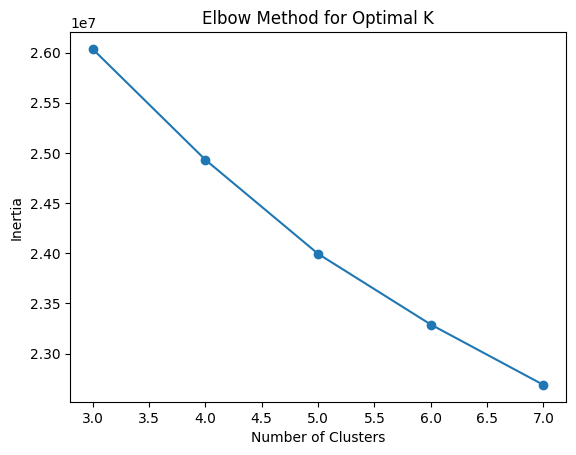

[26036116.0, 24931968.0, 23994420.0, 23289484.0, 22687276.0]
Optimal number of clusters: 4
Cluster 4: 1865 images
Cluster 1: 407 images
Cluster 3: 413 images
Cluster 2: 984 images


In [23]:
#without standard scaler
best_n_clusters,distortions = find_Keams_Cluster(features_loaded)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(features_loaded,best_n_clusters)

In [24]:
# Standardize the features
scaler = StandardScaler()
feature_std = scaler.fit_transform(features_loaded)

For n_clusters=3, the silhouette score is 0.19043931365013123
For n_clusters=4, the silhouette score is 0.1307213008403778
For n_clusters=5, the silhouette score is 0.033289410173892975
For n_clusters=6, the silhouette score is 0.02520635351538658
For n_clusters=7, the silhouette score is 0.028040772303938866
Best number of clusters: 3 with silhouette score: 0.19043931365013123


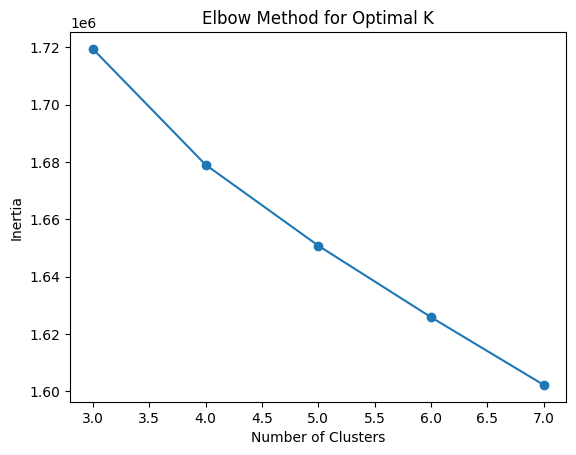

[1719479.25, 1679100.0, 1650863.125, 1625905.375, 1602282.25]
Optimal number of clusters: 3
Cluster 2: 2518 images
Cluster 1: 389 images
Cluster 3: 762 images


In [25]:
#with standard scaler
best_n_clusters,distortions = find_Keams_Cluster(feature_std)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(feature_std,best_n_clusters)

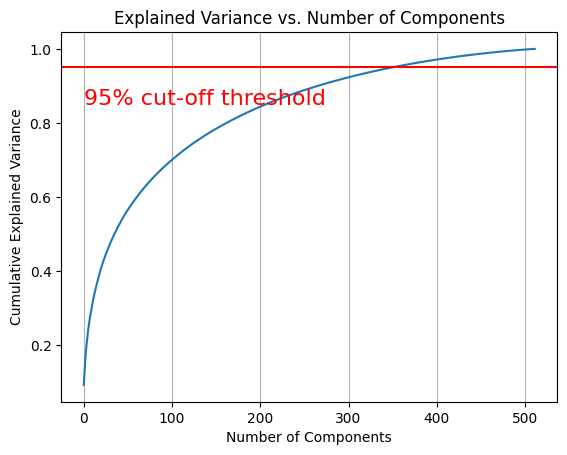

In [27]:
pca = PCA()
pca.fit(feature_std)
PlotPCAVariance(pca)

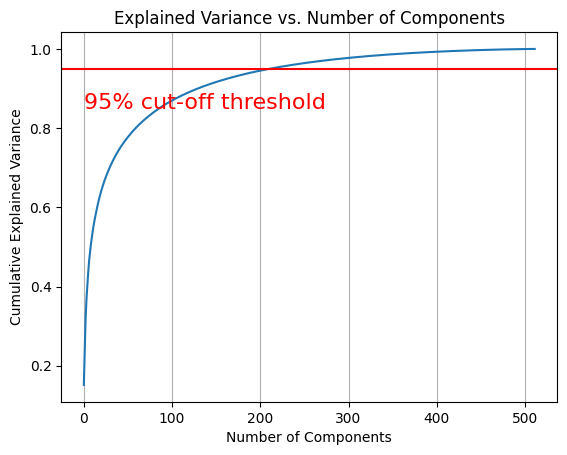

In [31]:
pca_withoutstd = PCA()
features_pca = pca_withoutstd.fit_transform(features_loaded)
PlotPCAVariance(pca_withoutstd)

For n_clusters=3, the silhouette score is 0.10954194515943527
For n_clusters=4, the silhouette score is 0.11856798827648163
For n_clusters=5, the silhouette score is 0.06748746335506439
For n_clusters=6, the silhouette score is 0.07144496589899063
For n_clusters=7, the silhouette score is 0.0542653352022171
Best number of clusters: 4 with silhouette score: 0.11856798827648163


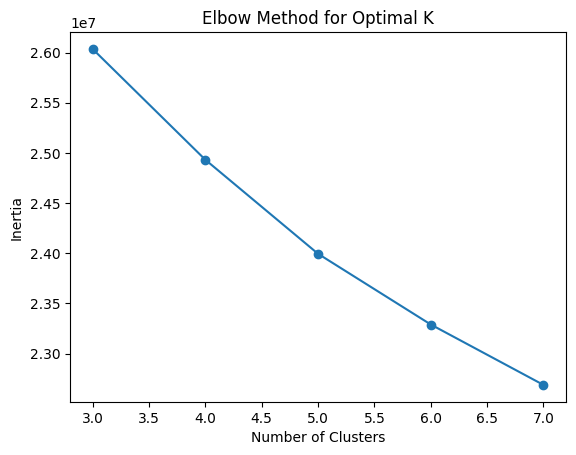

[26036114.0, 24931970.0, 23994424.0, 23289484.0, 22687276.0]
Optimal number of clusters: 4
Cluster 4: 1865 images
Cluster 1: 407 images
Cluster 3: 413 images
Cluster 2: 984 images


In [32]:
#with standard scaler and PCA
best_n_clusters,distortions = find_Keams_Cluster(features_pca)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(features_pca,best_n_clusters)

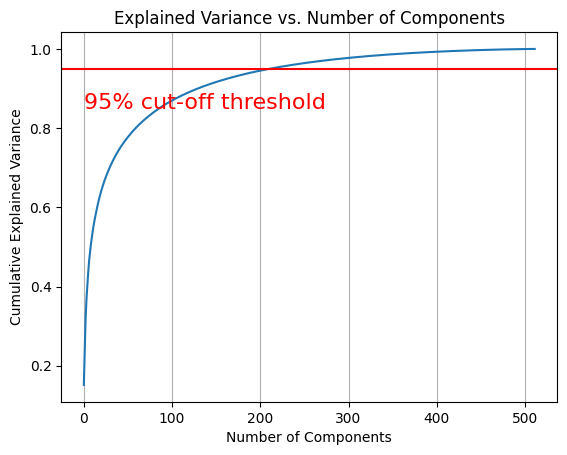

In [34]:
# Plot the explained variance
PlotPCAVariance(pca_withoutstd)

In [ ]:
n_components = 200
pca_withoutstd = PCA(n_components=n_components)
features_pca = pca_withoutstd.fit_transform(features_loaded)

For n_clusters=3, the silhouette score is 0.10954194515943527
For n_clusters=4, the silhouette score is 0.11856798827648163
For n_clusters=5, the silhouette score is 0.06748746335506439
For n_clusters=6, the silhouette score is 0.07144496589899063
For n_clusters=7, the silhouette score is 0.0542653352022171
Best number of clusters: 4 with silhouette score: 0.11856798827648163


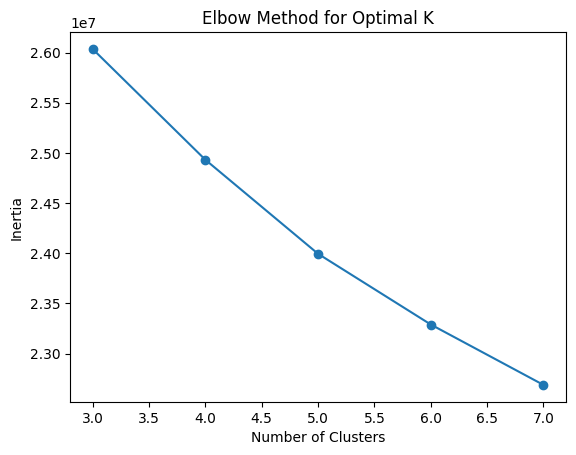

[26036114.0, 24931970.0, 23994424.0, 23289484.0, 22687276.0]
Optimal number of clusters: 4
Cluster 4: 1865 images
Cluster 1: 407 images
Cluster 3: 413 images
Cluster 2: 984 images


In [35]:
best_n_clusters,distortions = find_Keams_Cluster(features_pca)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(features_pca,best_n_clusters)

In [37]:
def extract_features(file, model):
    # load the image as a 224x224 array
    img = image.load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img)
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3)
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [38]:
# Load images and extract features
# Initialize an array to store features for all images
features_extract_vgg16 = []

# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

# Extract features for each image
for img_file in tqdm(image_files, desc="Extracting features"):
    img_path = os.path.join(data_dir, img_file)
    features = extract_features(img_path,model)
    features_extract_vgg16.append(features)

# Convert the features to a numpy array
featuresExt_vgg16 = np.array(features_extract_vgg16)
np.save("/content/features_vgg16_1.npy", featuresExt_vgg16)

Extracting features:   0%|          | 0/3669 [00:00<?, ?it/s]

1/1 [==============================] - 1s 548ms/step


Extracting features:   0%|          | 1/3669 [00:00<51:22,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   0%|          | 3/3669 [00:00<16:48,  3.63it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   0%|          | 5/3669 [00:01<10:30,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   0%|          | 7/3669 [00:01<07:54,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   0%|          | 9/3669 [00:01<06:33,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   0%|          | 11/3669 [00:01<05:51, 10.39it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   0%|          | 13/3669 [00:01<05:37, 10.83it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   0%|          | 15/3669 [00:01<05:14, 11.60it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   0%|          | 17/3669 [00:02<04:58, 12.24it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 19/3669 [00:02<04:44, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   1%|          | 21/3669 [00:02<04:31, 13.44it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 23/3669 [00:02<04:35, 13.23it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   1%|          | 25/3669 [00:02<04:31, 13.43it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 27/3669 [00:02<04:31, 13.42it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   1%|          | 29/3669 [00:02<04:24, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   1%|          | 31/3669 [00:03<04:29, 13.49it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   1%|          | 33/3669 [00:03<04:27, 13.62it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 35/3669 [00:03<04:22, 13.84it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   1%|          | 37/3669 [00:03<04:18, 14.07it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   1%|          | 39/3669 [00:03<04:13, 14.29it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   1%|          | 41/3669 [00:03<04:21, 13.87it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   1%|          | 43/3669 [00:03<04:18, 14.03it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   1%|          | 45/3669 [00:04<04:14, 14.22it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   1%|▏         | 47/3669 [00:04<04:32, 13.31it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:   1%|▏         | 49/3669 [00:04<04:55, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   1%|▏         | 51/3669 [00:04<05:05, 11.86it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:   1%|▏         | 53/3669 [00:04<05:20, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   1%|▏         | 55/3669 [00:04<05:22, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   2%|▏         | 57/3669 [00:05<05:28, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   2%|▏         | 59/3669 [00:05<05:39, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   2%|▏         | 61/3669 [00:05<05:57, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   2%|▏         | 63/3669 [00:05<05:53, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   2%|▏         | 65/3669 [00:05<05:55, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   2%|▏         | 67/3669 [00:06<05:49, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   2%|▏         | 69/3669 [00:06<06:01,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   2%|▏         | 71/3669 [00:06<05:55, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   2%|▏         | 73/3669 [00:06<05:48, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   2%|▏         | 75/3669 [00:06<05:46, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:   2%|▏         | 77/3669 [00:07<05:51, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   2%|▏         | 79/3669 [00:07<05:48, 10.31it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   2%|▏         | 81/3669 [00:07<05:36, 10.65it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   2%|▏         | 83/3669 [00:07<05:27, 10.95it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 85/3669 [00:07<05:27, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   2%|▏         | 87/3669 [00:08<05:39, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   2%|▏         | 89/3669 [00:08<05:31, 10.81it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:   2%|▏         | 91/3669 [00:08<05:24, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   3%|▎         | 93/3669 [00:08<05:19, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   3%|▎         | 95/3669 [00:08<05:26, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   3%|▎         | 97/3669 [00:08<05:32, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   3%|▎         | 99/3669 [00:09<05:27, 10.91it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   3%|▎         | 101/3669 [00:09<05:19, 11.17it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:   3%|▎         | 103/3669 [00:09<05:19, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   3%|▎         | 105/3669 [00:09<05:36, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   3%|▎         | 107/3669 [00:09<05:30, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   3%|▎         | 109/3669 [00:10<05:32, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   3%|▎         | 111/3669 [00:10<05:31, 10.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 113/3669 [00:10<05:12, 11.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 115/3669 [00:10<04:54, 12.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 117/3669 [00:10<04:36, 12.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 119/3669 [00:10<04:23, 13.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 121/3669 [00:10<04:13, 13.98it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   3%|▎         | 123/3669 [00:11<04:12, 14.02it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   3%|▎         | 125/3669 [00:11<04:05, 14.41it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   3%|▎         | 127/3669 [00:11<04:01, 14.67it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   4%|▎         | 129/3669 [00:11<03:56, 14.96it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   4%|▎         | 131/3669 [00:11<03:54, 15.07it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   4%|▎         | 133/3669 [00:11<03:57, 14.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▎         | 135/3669 [00:11<03:57, 14.85it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   4%|▎         | 137/3669 [00:12<04:03, 14.51it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▍         | 139/3669 [00:12<04:00, 14.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▍         | 141/3669 [00:12<04:00, 14.67it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   4%|▍         | 143/3669 [00:12<03:55, 14.96it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   4%|▍         | 145/3669 [00:12<03:53, 15.07it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   4%|▍         | 147/3669 [00:12<03:51, 15.23it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   4%|▍         | 149/3669 [00:12<03:49, 15.34it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   4%|▍         | 151/3669 [00:12<03:52, 15.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   4%|▍         | 153/3669 [00:13<03:58, 14.72it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   4%|▍         | 155/3669 [00:13<03:58, 14.73it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   4%|▍         | 157/3669 [00:13<03:52, 15.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   4%|▍         | 159/3669 [00:13<03:53, 15.06it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   4%|▍         | 161/3669 [00:13<03:50, 15.20it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   4%|▍         | 163/3669 [00:13<03:50, 15.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   4%|▍         | 165/3669 [00:13<03:45, 15.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   5%|▍         | 167/3669 [00:13<03:49, 15.28it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   5%|▍         | 169/3669 [00:14<03:56, 14.83it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   5%|▍         | 171/3669 [00:14<03:57, 14.71it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:   5%|▍         | 173/3669 [00:14<03:57, 14.70it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   5%|▍         | 175/3669 [00:14<03:59, 14.61it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   5%|▍         | 177/3669 [00:14<03:58, 14.62it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   5%|▍         | 179/3669 [00:14<03:59, 14.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▍         | 181/3669 [00:14<03:58, 14.65it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▍         | 183/3669 [00:15<03:57, 14.69it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▌         | 185/3669 [00:15<03:56, 14.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▌         | 187/3669 [00:15<03:59, 14.51it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   5%|▌         | 189/3669 [00:15<03:58, 14.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   5%|▌         | 191/3669 [00:15<03:54, 14.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   5%|▌         | 193/3669 [00:15<03:52, 14.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▌         | 195/3669 [00:15<03:54, 14.81it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   5%|▌         | 197/3669 [00:16<03:59, 14.51it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▌         | 199/3669 [00:16<04:02, 14.29it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   5%|▌         | 201/3669 [00:16<03:59, 14.50it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   6%|▌         | 203/3669 [00:16<03:57, 14.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 205/3669 [00:16<04:03, 14.21it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 207/3669 [00:16<04:00, 14.40it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 209/3669 [00:16<03:53, 14.79it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▌         | 211/3669 [00:17<03:55, 14.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 213/3669 [00:17<03:57, 14.54it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▌         | 215/3669 [00:17<03:54, 14.72it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▌         | 217/3669 [00:17<03:49, 15.02it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 219/3669 [00:17<03:44, 15.39it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▌         | 221/3669 [00:17<03:42, 15.52it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 223/3669 [00:17<03:46, 15.19it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▌         | 225/3669 [00:17<03:50, 14.96it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▌         | 227/3669 [00:18<03:47, 15.14it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   6%|▌         | 229/3669 [00:18<03:49, 15.00it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:   6%|▋         | 231/3669 [00:18<03:54, 14.67it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   6%|▋         | 233/3669 [00:18<03:56, 14.52it/s]

1/1 [==============================] - 0s 15ms/step


Extracting features:   6%|▋         | 235/3669 [00:18<03:49, 14.94it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   6%|▋         | 237/3669 [00:18<03:46, 15.14it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   7%|▋         | 239/3669 [00:18<03:40, 15.54it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   7%|▋         | 241/3669 [00:19<03:44, 15.26it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 243/3669 [00:19<03:43, 15.34it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 245/3669 [00:19<03:47, 15.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 247/3669 [00:19<03:45, 15.16it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   7%|▋         | 249/3669 [00:19<03:51, 14.76it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   7%|▋         | 251/3669 [00:19<03:46, 15.11it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   7%|▋         | 253/3669 [00:19<03:40, 15.50it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   7%|▋         | 255/3669 [00:19<03:38, 15.64it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   7%|▋         | 257/3669 [00:20<03:40, 15.47it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   7%|▋         | 259/3669 [00:20<03:47, 15.00it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:   7%|▋         | 261/3669 [00:20<03:45, 15.12it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:   7%|▋         | 263/3669 [00:20<04:31, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   7%|▋         | 265/3669 [00:20<04:49, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 267/3669 [00:20<04:57, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   7%|▋         | 269/3669 [00:21<05:22, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 271/3669 [00:21<05:26, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 273/3669 [00:21<05:16, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 275/3669 [00:21<05:17, 10.70it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   8%|▊         | 277/3669 [00:21<05:12, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   8%|▊         | 279/3669 [00:22<05:11, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   8%|▊         | 281/3669 [00:22<05:08, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   8%|▊         | 283/3669 [00:22<05:09, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   8%|▊         | 285/3669 [00:22<05:15, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   8%|▊         | 287/3669 [00:22<05:14, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:   8%|▊         | 289/3669 [00:23<05:16, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   8%|▊         | 291/3669 [00:23<05:31, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   8%|▊         | 293/3669 [00:23<05:51,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   8%|▊         | 294/3669 [00:23<05:51,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   8%|▊         | 296/3669 [00:23<05:33, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   8%|▊         | 298/3669 [00:23<05:20, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   8%|▊         | 300/3669 [00:24<05:12, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   8%|▊         | 302/3669 [00:24<05:07, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   8%|▊         | 304/3669 [00:24<05:16, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:   8%|▊         | 306/3669 [00:24<05:40,  9.88it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   8%|▊         | 308/3669 [00:24<05:27, 10.26it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   8%|▊         | 310/3669 [00:25<05:24, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   9%|▊         | 312/3669 [00:25<05:23, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   9%|▊         | 314/3669 [00:25<05:21, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   9%|▊         | 316/3669 [00:25<05:19, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   9%|▊         | 318/3669 [00:25<05:18, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   9%|▊         | 320/3669 [00:26<05:13, 10.69it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   9%|▉         | 322/3669 [00:26<05:16, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   9%|▉         | 324/3669 [00:26<05:11, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   9%|▉         | 326/3669 [00:26<05:13, 10.68it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   9%|▉         | 328/3669 [00:26<04:48, 11.58it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▉         | 330/3669 [00:26<04:32, 12.24it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:   9%|▉         | 332/3669 [00:26<04:17, 12.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▉         | 334/3669 [00:27<04:10, 13.32it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   9%|▉         | 336/3669 [00:27<04:02, 13.77it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   9%|▉         | 338/3669 [00:27<03:57, 14.05it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▉         | 340/3669 [00:27<03:58, 13.97it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:   9%|▉         | 342/3669 [00:27<03:54, 14.19it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:   9%|▉         | 344/3669 [00:27<03:49, 14.46it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:   9%|▉         | 346/3669 [00:27<03:45, 14.76it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   9%|▉         | 348/3669 [00:28<03:53, 14.21it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  10%|▉         | 350/3669 [00:28<03:53, 14.22it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  10%|▉         | 352/3669 [00:28<03:54, 14.13it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  10%|▉         | 354/3669 [00:28<03:58, 13.92it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  10%|▉         | 356/3669 [00:28<03:51, 14.34it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  10%|▉         | 358/3669 [00:28<03:53, 14.19it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  10%|▉         | 360/3669 [00:28<03:50, 14.33it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  10%|▉         | 362/3669 [00:29<03:51, 14.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  10%|▉         | 364/3669 [00:29<03:47, 14.51it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  10%|▉         | 366/3669 [00:29<03:49, 14.42it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  10%|█         | 368/3669 [00:29<03:50, 14.33it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  10%|█         | 370/3669 [00:29<03:46, 14.59it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  10%|█         | 372/3669 [00:29<03:44, 14.69it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  10%|█         | 374/3669 [00:29<03:41, 14.85it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  10%|█         | 376/3669 [00:30<03:46, 14.57it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  10%|█         | 378/3669 [00:30<03:45, 14.60it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|█         | 380/3669 [00:30<03:45, 14.61it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  10%|█         | 382/3669 [00:30<03:48, 14.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  10%|█         | 384/3669 [00:30<03:51, 14.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 386/3669 [00:30<03:50, 14.23it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  11%|█         | 388/3669 [00:30<03:43, 14.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 390/3669 [00:30<03:44, 14.63it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  11%|█         | 392/3669 [00:31<03:40, 14.89it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  11%|█         | 394/3669 [00:31<03:43, 14.65it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  11%|█         | 396/3669 [00:31<03:41, 14.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 398/3669 [00:31<03:39, 14.88it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  11%|█         | 400/3669 [00:31<03:40, 14.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 402/3669 [00:31<03:39, 14.89it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 404/3669 [00:31<03:38, 14.97it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  11%|█         | 406/3669 [00:32<03:38, 14.91it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 408/3669 [00:32<03:38, 14.91it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  11%|█         | 410/3669 [00:32<03:34, 15.18it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█         | 412/3669 [00:32<03:35, 15.12it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  11%|█▏        | 414/3669 [00:32<03:41, 14.72it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  11%|█▏        | 416/3669 [00:32<03:39, 14.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  11%|█▏        | 418/3669 [00:32<03:40, 14.77it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  11%|█▏        | 420/3669 [00:33<03:44, 14.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 422/3669 [00:33<03:43, 14.52it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 424/3669 [00:33<03:38, 14.82it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 426/3669 [00:33<03:37, 14.89it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 428/3669 [00:33<03:35, 15.04it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 430/3669 [00:33<03:43, 14.52it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 432/3669 [00:33<03:39, 14.73it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 434/3669 [00:33<03:35, 14.98it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  12%|█▏        | 436/3669 [00:34<03:33, 15.14it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 438/3669 [00:34<03:36, 14.91it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 440/3669 [00:34<03:37, 14.81it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  12%|█▏        | 442/3669 [00:34<03:39, 14.70it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 444/3669 [00:34<03:52, 13.86it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  12%|█▏        | 446/3669 [00:34<03:46, 14.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 448/3669 [00:34<03:45, 14.27it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  12%|█▏        | 450/3669 [00:35<03:48, 14.07it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  12%|█▏        | 452/3669 [00:35<03:46, 14.21it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  12%|█▏        | 454/3669 [00:35<03:40, 14.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  12%|█▏        | 456/3669 [00:35<03:39, 14.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  12%|█▏        | 458/3669 [00:35<03:41, 14.52it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  13%|█▎        | 460/3669 [00:35<03:38, 14.70it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  13%|█▎        | 462/3669 [00:35<03:36, 14.81it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  13%|█▎        | 464/3669 [00:36<03:32, 15.11it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  13%|█▎        | 466/3669 [00:36<03:34, 14.93it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  13%|█▎        | 468/3669 [00:36<03:33, 15.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  13%|█▎        | 470/3669 [00:36<03:40, 14.49it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  13%|█▎        | 472/3669 [00:36<03:39, 14.56it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  13%|█▎        | 474/3669 [00:36<04:15, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  13%|█▎        | 476/3669 [00:37<04:47, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  13%|█▎        | 478/3669 [00:37<04:49, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  13%|█▎        | 480/3669 [00:37<04:54, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  13%|█▎        | 482/3669 [00:37<04:50, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  13%|█▎        | 484/3669 [00:37<04:59, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  13%|█▎        | 486/3669 [00:37<05:06, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  13%|█▎        | 488/3669 [00:38<05:06, 10.37it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  13%|█▎        | 490/3669 [00:38<05:20,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  13%|█▎        | 492/3669 [00:38<05:16, 10.03it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  13%|█▎        | 494/3669 [00:38<05:23,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  14%|█▎        | 496/3669 [00:38<05:13, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  14%|█▎        | 498/3669 [00:39<05:14, 10.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  14%|█▎        | 500/3669 [00:39<05:07, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  14%|█▎        | 502/3669 [00:39<05:13, 10.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  14%|█▎        | 504/3669 [00:39<05:13, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  14%|█▍        | 506/3669 [00:40<05:40,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  14%|█▍        | 507/3669 [00:40<06:02,  8.72it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  14%|█▍        | 508/3669 [00:40<05:54,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  14%|█▍        | 510/3669 [00:40<05:39,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  14%|█▍        | 512/3669 [00:40<05:24,  9.72it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  14%|█▍        | 514/3669 [00:40<05:18,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  14%|█▍        | 515/3669 [00:40<05:21,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  14%|█▍        | 516/3669 [00:41<05:27,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  14%|█▍        | 517/3669 [00:41<05:33,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  14%|█▍        | 519/3669 [00:41<05:20,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  14%|█▍        | 520/3669 [00:41<05:27,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  14%|█▍        | 522/3669 [00:41<05:12, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  14%|█▍        | 523/3669 [00:41<05:17,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  14%|█▍        | 525/3669 [00:41<05:11, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  14%|█▍        | 527/3669 [00:42<05:02, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  14%|█▍        | 529/3669 [00:42<05:02, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  14%|█▍        | 531/3669 [00:42<05:29,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  15%|█▍        | 533/3669 [00:42<05:14,  9.96it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  15%|█▍        | 535/3669 [00:42<05:04, 10.28it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  15%|█▍        | 537/3669 [00:43<05:02, 10.37it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▍        | 539/3669 [00:43<04:37, 11.28it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  15%|█▍        | 541/3669 [00:43<04:18, 12.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  15%|█▍        | 543/3669 [00:43<04:03, 12.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▍        | 545/3669 [00:43<03:53, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  15%|█▍        | 547/3669 [00:43<03:54, 13.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▍        | 549/3669 [00:43<03:47, 13.69it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▌        | 551/3669 [00:44<03:46, 13.77it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  15%|█▌        | 553/3669 [00:44<03:40, 14.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▌        | 555/3669 [00:44<03:36, 14.36it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  15%|█▌        | 557/3669 [00:44<03:42, 14.00it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▌        | 559/3669 [00:44<03:39, 14.16it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▌        | 561/3669 [00:44<03:36, 14.33it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  15%|█▌        | 563/3669 [00:44<03:34, 14.47it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  15%|█▌        | 565/3669 [00:45<03:57, 13.07it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  15%|█▌        | 567/3669 [00:45<03:47, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  16%|█▌        | 569/3669 [00:45<03:42, 13.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  16%|█▌        | 571/3669 [00:45<03:38, 14.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  16%|█▌        | 573/3669 [00:45<03:36, 14.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  16%|█▌        | 575/3669 [00:45<03:37, 14.23it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  16%|█▌        | 577/3669 [00:45<03:56, 13.05it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  16%|█▌        | 579/3669 [00:46<03:51, 13.36it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  16%|█▌        | 581/3669 [00:46<03:44, 13.74it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  16%|█▌        | 583/3669 [00:46<03:42, 13.87it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  16%|█▌        | 585/3669 [00:46<03:38, 14.10it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  16%|█▌        | 587/3669 [00:46<03:37, 14.14it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  16%|█▌        | 589/3669 [00:46<03:32, 14.48it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  16%|█▌        | 591/3669 [00:46<03:28, 14.75it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  16%|█▌        | 593/3669 [00:47<03:35, 14.25it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  16%|█▌        | 595/3669 [00:47<03:31, 14.51it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  16%|█▋        | 597/3669 [00:47<03:29, 14.66it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  16%|█▋        | 599/3669 [00:47<03:28, 14.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  16%|█▋        | 601/3669 [00:47<03:50, 13.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  16%|█▋        | 603/3669 [00:47<03:46, 13.56it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  16%|█▋        | 605/3669 [00:47<03:40, 13.89it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  17%|█▋        | 607/3669 [00:48<03:36, 14.15it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  17%|█▋        | 609/3669 [00:48<03:35, 14.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 611/3669 [00:48<03:33, 14.30it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  17%|█▋        | 613/3669 [00:48<03:31, 14.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 615/3669 [00:48<03:26, 14.79it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  17%|█▋        | 617/3669 [00:48<03:26, 14.79it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 619/3669 [00:48<03:27, 14.70it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  17%|█▋        | 621/3669 [00:49<03:28, 14.61it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  17%|█▋        | 623/3669 [00:49<03:28, 14.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  17%|█▋        | 625/3669 [00:49<03:29, 14.56it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  17%|█▋        | 627/3669 [00:49<03:26, 14.71it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  17%|█▋        | 629/3669 [00:49<03:27, 14.63it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 631/3669 [00:49<03:28, 14.58it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 633/3669 [00:49<03:43, 13.60it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  17%|█▋        | 635/3669 [00:50<03:40, 13.77it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  17%|█▋        | 637/3669 [00:50<03:40, 13.74it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  17%|█▋        | 639/3669 [00:50<03:33, 14.20it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  17%|█▋        | 641/3669 [00:50<03:29, 14.42it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 643/3669 [00:50<03:26, 14.64it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  18%|█▊        | 645/3669 [00:50<03:26, 14.65it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  18%|█▊        | 647/3669 [00:50<03:34, 14.07it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  18%|█▊        | 649/3669 [00:51<03:34, 14.05it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  18%|█▊        | 651/3669 [00:51<03:55, 12.83it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 653/3669 [00:51<03:49, 13.13it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  18%|█▊        | 655/3669 [00:51<03:45, 13.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 657/3669 [00:51<03:42, 13.51it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  18%|█▊        | 659/3669 [00:51<03:38, 13.79it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  18%|█▊        | 661/3669 [00:51<03:34, 14.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 663/3669 [00:52<03:34, 14.01it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  18%|█▊        | 665/3669 [00:52<03:40, 13.64it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 667/3669 [00:52<03:36, 13.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  18%|█▊        | 669/3669 [00:52<03:34, 14.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  18%|█▊        | 671/3669 [00:52<03:27, 14.42it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  18%|█▊        | 673/3669 [00:52<03:31, 14.13it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  18%|█▊        | 675/3669 [00:52<03:26, 14.49it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  18%|█▊        | 677/3669 [00:53<03:26, 14.52it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  19%|█▊        | 679/3669 [00:53<03:39, 13.64it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  19%|█▊        | 681/3669 [00:53<04:05, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  19%|█▊        | 683/3669 [00:53<04:16, 11.62it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  19%|█▊        | 685/3669 [00:53<04:30, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▊        | 687/3669 [00:53<04:37, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  19%|█▉        | 689/3669 [00:54<04:40, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  19%|█▉        | 691/3669 [00:54<04:44, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  19%|█▉        | 693/3669 [00:54<04:40, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 695/3669 [00:54<04:57,  9.99it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 697/3669 [00:54<04:52, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  19%|█▉        | 699/3669 [00:55<04:46, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  19%|█▉        | 701/3669 [00:55<04:49, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  19%|█▉        | 703/3669 [00:55<04:54, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 705/3669 [00:55<04:48, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 707/3669 [00:55<04:47, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  19%|█▉        | 709/3669 [00:56<05:09,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  19%|█▉        | 711/3669 [00:56<05:04,  9.72it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 713/3669 [00:56<04:54, 10.02it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  19%|█▉        | 715/3669 [00:56<04:45, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  20%|█▉        | 717/3669 [00:56<04:43, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  20%|█▉        | 719/3669 [00:57<04:48, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  20%|█▉        | 721/3669 [00:57<04:45, 10.31it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|█▉        | 723/3669 [00:57<04:42, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  20%|█▉        | 725/3669 [00:57<04:39, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  20%|█▉        | 727/3669 [00:57<04:45, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  20%|█▉        | 729/3669 [00:58<04:45, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  20%|█▉        | 731/3669 [00:58<04:50, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  20%|█▉        | 733/3669 [00:58<04:52, 10.04it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  20%|██        | 735/3669 [00:58<04:46, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  20%|██        | 737/3669 [00:59<07:38,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  20%|██        | 738/3669 [00:59<07:12,  6.78it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  20%|██        | 739/3669 [00:59<06:48,  7.18it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  20%|██        | 740/3669 [00:59<06:23,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 742/3669 [00:59<05:22,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 744/3669 [00:59<04:44, 10.28it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 746/3669 [01:00<04:49, 10.10it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  20%|██        | 748/3669 [01:00<04:29, 10.86it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  20%|██        | 750/3669 [01:00<04:11, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  20%|██        | 752/3669 [01:00<04:07, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  21%|██        | 754/3669 [01:00<03:59, 12.18it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 756/3669 [01:00<03:58, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 758/3669 [01:01<03:54, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  21%|██        | 760/3669 [01:01<03:55, 12.36it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 762/3669 [01:01<03:51, 12.55it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  21%|██        | 764/3669 [01:01<03:56, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 766/3669 [01:01<03:51, 12.56it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  21%|██        | 768/3669 [01:01<03:46, 12.80it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  21%|██        | 770/3669 [01:01<03:40, 13.13it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  21%|██        | 772/3669 [01:02<03:40, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  21%|██        | 774/3669 [01:02<03:42, 12.99it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  21%|██        | 776/3669 [01:02<03:42, 13.01it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  21%|██        | 778/3669 [01:02<04:00, 12.03it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  21%|██▏       | 780/3669 [01:02<03:50, 12.51it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  21%|██▏       | 782/3669 [01:02<03:55, 12.27it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  21%|██▏       | 784/3669 [01:03<04:15, 11.30it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  21%|██▏       | 786/3669 [01:03<04:40, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  21%|██▏       | 788/3669 [01:03<05:13,  9.18it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  22%|██▏       | 789/3669 [01:03<05:14,  9.16it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  22%|██▏       | 790/3669 [01:03<05:14,  9.15it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  22%|██▏       | 791/3669 [01:04<05:32,  8.66it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  22%|██▏       | 792/3669 [01:04<05:34,  8.59it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  22%|██▏       | 793/3669 [01:04<05:39,  8.46it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  22%|██▏       | 794/3669 [01:04<05:47,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  22%|██▏       | 795/3669 [01:04<05:48,  8.24it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  22%|██▏       | 796/3669 [01:04<05:35,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  22%|██▏       | 797/3669 [01:04<05:27,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  22%|██▏       | 798/3669 [01:04<05:16,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  22%|██▏       | 799/3669 [01:04<05:14,  9.13it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  22%|██▏       | 800/3669 [01:05<05:10,  9.25it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  22%|██▏       | 802/3669 [01:05<04:22, 10.94it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  22%|██▏       | 804/3669 [01:05<03:55, 12.16it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  22%|██▏       | 806/3669 [01:05<03:39, 13.02it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  22%|██▏       | 808/3669 [01:05<03:32, 13.48it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  22%|██▏       | 810/3669 [01:05<03:35, 13.27it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  22%|██▏       | 812/3669 [01:05<03:33, 13.37it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  22%|██▏       | 814/3669 [01:06<03:31, 13.49it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  22%|██▏       | 816/3669 [01:06<03:25, 13.90it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  22%|██▏       | 818/3669 [01:06<03:25, 13.88it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  22%|██▏       | 820/3669 [01:06<03:29, 13.60it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  22%|██▏       | 822/3669 [01:06<03:25, 13.86it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  22%|██▏       | 824/3669 [01:06<03:24, 13.90it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 826/3669 [01:06<03:19, 14.24it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  23%|██▎       | 828/3669 [01:07<03:22, 14.05it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  23%|██▎       | 830/3669 [01:07<03:21, 14.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 832/3669 [01:07<03:17, 14.35it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 834/3669 [01:07<03:15, 14.48it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  23%|██▎       | 836/3669 [01:07<03:38, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  23%|██▎       | 838/3669 [01:07<03:36, 13.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 840/3669 [01:07<03:28, 13.54it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 842/3669 [01:08<03:25, 13.73it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  23%|██▎       | 844/3669 [01:08<03:19, 14.14it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  23%|██▎       | 846/3669 [01:08<03:20, 14.05it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  23%|██▎       | 848/3669 [01:08<03:20, 14.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 850/3669 [01:08<03:16, 14.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  23%|██▎       | 852/3669 [01:08<03:14, 14.46it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  23%|██▎       | 854/3669 [01:08<03:16, 14.33it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  23%|██▎       | 856/3669 [01:09<03:14, 14.47it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  23%|██▎       | 858/3669 [01:09<03:12, 14.62it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  23%|██▎       | 860/3669 [01:09<03:11, 14.70it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  23%|██▎       | 862/3669 [01:09<03:15, 14.39it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  24%|██▎       | 864/3669 [01:09<03:20, 14.02it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▎       | 866/3669 [01:09<03:44, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▎       | 868/3669 [01:09<03:53, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▎       | 870/3669 [01:10<04:00, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  24%|██▍       | 872/3669 [01:10<04:08, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  24%|██▍       | 874/3669 [01:10<04:13, 11.02it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  24%|██▍       | 876/3669 [01:10<04:36, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  24%|██▍       | 878/3669 [01:10<04:39,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  24%|██▍       | 880/3669 [01:11<04:38, 10.03it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  24%|██▍       | 882/3669 [01:11<04:37, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  24%|██▍       | 884/3669 [01:11<04:30, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  24%|██▍       | 886/3669 [01:11<04:28, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  24%|██▍       | 888/3669 [01:11<04:44,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  24%|██▍       | 889/3669 [01:12<04:46,  9.70it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▍       | 890/3669 [01:12<04:48,  9.64it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  24%|██▍       | 891/3669 [01:12<04:45,  9.72it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▍       | 893/3669 [01:12<04:32, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▍       | 895/3669 [01:12<04:23, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  24%|██▍       | 897/3669 [01:12<04:32, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▍       | 899/3669 [01:13<04:43,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  25%|██▍       | 900/3669 [01:13<04:42,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▍       | 901/3669 [01:13<05:01,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  25%|██▍       | 902/3669 [01:13<05:17,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  25%|██▍       | 903/3669 [01:13<05:30,  8.37it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▍       | 905/3669 [01:13<05:04,  9.09it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▍       | 907/3669 [01:14<05:03,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▍       | 909/3669 [01:14<04:53,  9.41it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  25%|██▍       | 910/3669 [01:14<04:52,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  25%|██▍       | 912/3669 [01:14<04:44,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  25%|██▍       | 914/3669 [01:14<04:35, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▍       | 916/3669 [01:14<04:32, 10.11it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  25%|██▌       | 918/3669 [01:15<04:58,  9.22it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▌       | 919/3669 [01:15<04:55,  9.30it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▌       | 921/3669 [01:15<04:40,  9.79it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  25%|██▌       | 922/3669 [01:15<04:42,  9.71it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▌       | 924/3669 [01:15<04:31, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▌       | 926/3669 [01:15<04:31, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  25%|██▌       | 928/3669 [01:16<04:56,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▌       | 930/3669 [01:16<04:46,  9.57it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  25%|██▌       | 932/3669 [01:16<04:21, 10.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  25%|██▌       | 934/3669 [01:16<03:59, 11.44it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 936/3669 [01:16<03:45, 12.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 938/3669 [01:16<03:35, 12.67it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  26%|██▌       | 940/3669 [01:17<03:32, 12.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 942/3669 [01:17<03:23, 13.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 944/3669 [01:17<03:17, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  26%|██▌       | 946/3669 [01:17<03:15, 13.92it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  26%|██▌       | 948/3669 [01:17<03:14, 14.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  26%|██▌       | 950/3669 [01:17<03:11, 14.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 952/3669 [01:17<03:10, 14.28it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  26%|██▌       | 954/3669 [01:18<03:14, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  26%|██▌       | 956/3669 [01:18<03:13, 13.99it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  26%|██▌       | 958/3669 [01:18<03:10, 14.23it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▌       | 960/3669 [01:18<03:07, 14.42it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  26%|██▌       | 962/3669 [01:18<03:08, 14.38it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  26%|██▋       | 964/3669 [01:18<03:11, 14.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▋       | 966/3669 [01:18<03:09, 14.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  26%|██▋       | 968/3669 [01:19<03:08, 14.33it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  26%|██▋       | 970/3669 [01:19<03:08, 14.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  26%|██▋       | 972/3669 [01:19<03:10, 14.19it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 974/3669 [01:19<03:06, 14.41it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 976/3669 [01:19<03:08, 14.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 978/3669 [01:19<03:06, 14.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 980/3669 [01:19<03:05, 14.47it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 982/3669 [01:20<03:09, 14.17it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  27%|██▋       | 984/3669 [01:20<03:13, 13.87it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 986/3669 [01:20<03:11, 14.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 988/3669 [01:20<03:08, 14.22it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  27%|██▋       | 990/3669 [01:20<03:13, 13.86it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 992/3669 [01:20<03:10, 14.02it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 994/3669 [01:20<03:07, 14.29it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 996/3669 [01:21<03:08, 14.18it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 998/3669 [01:21<03:11, 13.95it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  27%|██▋       | 1000/3669 [01:21<03:17, 13.48it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  27%|██▋       | 1002/3669 [01:21<03:33, 12.47it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  27%|██▋       | 1004/3669 [01:21<03:25, 13.00it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  27%|██▋       | 1006/3669 [01:21<03:17, 13.47it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  27%|██▋       | 1008/3669 [01:21<03:18, 13.42it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  28%|██▊       | 1010/3669 [01:22<03:15, 13.59it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  28%|██▊       | 1012/3669 [01:22<03:17, 13.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1014/3669 [01:22<03:13, 13.71it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  28%|██▊       | 1016/3669 [01:22<03:26, 12.84it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  28%|██▊       | 1018/3669 [01:22<03:24, 12.98it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  28%|██▊       | 1020/3669 [01:22<03:16, 13.47it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  28%|██▊       | 1022/3669 [01:23<03:35, 12.26it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  28%|██▊       | 1024/3669 [01:23<03:31, 12.49it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1026/3669 [01:23<03:26, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  28%|██▊       | 1028/3669 [01:23<03:22, 13.02it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  28%|██▊       | 1030/3669 [01:23<03:18, 13.29it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  28%|██▊       | 1032/3669 [01:23<03:14, 13.59it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1034/3669 [01:23<03:12, 13.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  28%|██▊       | 1036/3669 [01:24<03:14, 13.52it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1038/3669 [01:24<03:11, 13.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1040/3669 [01:24<03:10, 13.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1042/3669 [01:24<03:07, 14.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  28%|██▊       | 1044/3669 [01:24<03:07, 14.00it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▊       | 1046/3669 [01:24<03:07, 13.98it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▊       | 1048/3669 [01:24<03:04, 14.17it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  29%|██▊       | 1050/3669 [01:25<03:03, 14.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▊       | 1052/3669 [01:25<03:03, 14.24it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▊       | 1054/3669 [01:25<03:06, 14.01it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  29%|██▉       | 1056/3669 [01:25<03:09, 13.79it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▉       | 1058/3669 [01:25<03:08, 13.86it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1060/3669 [01:25<03:08, 13.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1062/3669 [01:25<03:10, 13.68it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  29%|██▉       | 1064/3669 [01:26<03:08, 13.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  29%|██▉       | 1066/3669 [01:26<03:04, 14.09it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  29%|██▉       | 1068/3669 [01:26<03:06, 13.96it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  29%|██▉       | 1070/3669 [01:26<03:47, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  29%|██▉       | 1072/3669 [01:26<03:56, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  29%|██▉       | 1074/3669 [01:26<04:02, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  29%|██▉       | 1076/3669 [01:27<04:00, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  29%|██▉       | 1078/3669 [01:27<04:02, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  29%|██▉       | 1080/3669 [01:27<04:10, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  29%|██▉       | 1082/3669 [01:27<04:18, 10.02it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  30%|██▉       | 1084/3669 [01:27<04:12, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  30%|██▉       | 1086/3669 [01:28<04:08, 10.41it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  30%|██▉       | 1088/3669 [01:28<04:23,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  30%|██▉       | 1089/3669 [01:28<04:30,  9.54it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  30%|██▉       | 1090/3669 [01:28<04:36,  9.33it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  30%|██▉       | 1091/3669 [01:28<04:36,  9.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  30%|██▉       | 1093/3669 [01:28<04:25,  9.70it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  30%|██▉       | 1094/3669 [01:29<04:24,  9.75it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  30%|██▉       | 1096/3669 [01:29<04:13, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  30%|██▉       | 1098/3669 [01:29<04:23,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  30%|██▉       | 1100/3669 [01:29<04:16, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  30%|███       | 1102/3669 [01:29<04:27,  9.59it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1104/3669 [01:30<04:19,  9.89it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1106/3669 [01:30<04:14, 10.08it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1108/3669 [01:30<04:10, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1110/3669 [01:30<04:07, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1112/3669 [01:30<04:01, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  30%|███       | 1114/3669 [01:30<04:01, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  30%|███       | 1116/3669 [01:31<04:05, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  30%|███       | 1118/3669 [01:31<04:14, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  31%|███       | 1120/3669 [01:31<04:15,  9.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  31%|███       | 1122/3669 [01:31<04:09, 10.22it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  31%|███       | 1124/3669 [01:31<04:10, 10.17it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  31%|███       | 1126/3669 [01:32<04:15,  9.95it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1128/3669 [01:32<04:08, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  31%|███       | 1130/3669 [01:32<04:10, 10.15it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  31%|███       | 1132/3669 [01:32<04:04, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  31%|███       | 1134/3669 [01:32<04:03, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  31%|███       | 1136/3669 [01:33<04:01, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  31%|███       | 1138/3669 [01:33<04:09, 10.16it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  31%|███       | 1140/3669 [01:33<03:56, 10.71it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  31%|███       | 1142/3669 [01:33<03:40, 11.46it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  31%|███       | 1144/3669 [01:33<03:29, 12.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  31%|███       | 1146/3669 [01:33<03:18, 12.69it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  31%|███▏      | 1148/3669 [01:34<03:10, 13.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  31%|███▏      | 1150/3669 [01:34<03:04, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  31%|███▏      | 1152/3669 [01:34<03:05, 13.59it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███▏      | 1154/3669 [01:34<03:06, 13.51it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1156/3669 [01:34<03:06, 13.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  32%|███▏      | 1158/3669 [01:34<03:05, 13.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  32%|███▏      | 1160/3669 [01:34<03:02, 13.71it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  32%|███▏      | 1162/3669 [01:35<03:04, 13.58it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  32%|███▏      | 1164/3669 [01:35<03:03, 13.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  32%|███▏      | 1166/3669 [01:35<03:00, 13.87it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  32%|███▏      | 1168/3669 [01:35<03:01, 13.78it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  32%|███▏      | 1170/3669 [01:35<03:04, 13.55it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1172/3669 [01:35<03:00, 13.84it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  32%|███▏      | 1174/3669 [01:35<02:59, 13.92it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  32%|███▏      | 1176/3669 [01:36<02:57, 14.03it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1178/3669 [01:36<02:53, 14.32it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  32%|███▏      | 1180/3669 [01:36<03:00, 13.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  32%|███▏      | 1182/3669 [01:36<03:21, 12.36it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  32%|███▏      | 1184/3669 [01:36<03:16, 12.63it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  32%|███▏      | 1186/3669 [01:36<03:08, 13.15it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  32%|███▏      | 1188/3669 [01:37<03:09, 13.10it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  32%|███▏      | 1190/3669 [01:37<03:04, 13.41it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  32%|███▏      | 1192/3669 [01:37<03:04, 13.44it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  33%|███▎      | 1194/3669 [01:37<03:00, 13.72it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  33%|███▎      | 1196/3669 [01:37<02:59, 13.81it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  33%|███▎      | 1198/3669 [01:37<03:19, 12.41it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  33%|███▎      | 1200/3669 [01:37<03:28, 11.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  33%|███▎      | 1202/3669 [01:38<03:17, 12.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  33%|███▎      | 1204/3669 [01:38<03:15, 12.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  33%|███▎      | 1206/3669 [01:38<03:11, 12.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  33%|███▎      | 1208/3669 [01:38<03:05, 13.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  33%|███▎      | 1210/3669 [01:38<03:06, 13.21it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  33%|███▎      | 1212/3669 [01:38<03:01, 13.56it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  33%|███▎      | 1214/3669 [01:39<02:57, 13.83it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  33%|███▎      | 1216/3669 [01:39<02:59, 13.65it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  33%|███▎      | 1218/3669 [01:39<02:55, 14.00it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  33%|███▎      | 1220/3669 [01:39<02:54, 14.00it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  33%|███▎      | 1222/3669 [01:39<02:56, 13.85it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  33%|███▎      | 1224/3669 [01:39<03:03, 13.33it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  33%|███▎      | 1226/3669 [01:39<03:01, 13.48it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  33%|███▎      | 1228/3669 [01:40<03:02, 13.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▎      | 1230/3669 [01:40<02:58, 13.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▎      | 1232/3669 [01:40<02:56, 13.81it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  34%|███▎      | 1234/3669 [01:40<02:54, 13.98it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  34%|███▎      | 1236/3669 [01:40<02:55, 13.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▎      | 1238/3669 [01:40<02:59, 13.54it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1240/3669 [01:40<02:58, 13.62it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  34%|███▍      | 1242/3669 [01:41<02:59, 13.54it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  34%|███▍      | 1244/3669 [01:41<02:56, 13.75it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1246/3669 [01:41<02:53, 13.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1248/3669 [01:41<02:52, 14.07it/s]

1/1 [==============================] - 0s 114ms/step


Extracting features:  34%|███▍      | 1250/3669 [01:41<04:07,  9.76it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  34%|███▍      | 1252/3669 [01:42<06:19,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  34%|███▍      | 1253/3669 [01:42<06:12,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  34%|███▍      | 1255/3669 [01:42<05:04,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  34%|███▍      | 1257/3669 [01:42<04:21,  9.22it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1259/3669 [01:42<03:53, 10.33it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  34%|███▍      | 1261/3669 [01:43<03:51, 10.40it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  34%|███▍      | 1263/3669 [01:43<03:32, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  34%|███▍      | 1265/3669 [01:43<03:21, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  35%|███▍      | 1267/3669 [01:43<03:36, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  35%|███▍      | 1269/3669 [01:43<03:41, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▍      | 1271/3669 [01:44<03:47, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  35%|███▍      | 1273/3669 [01:44<03:53, 10.24it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▍      | 1275/3669 [01:44<03:59,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  35%|███▍      | 1277/3669 [01:44<04:04,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  35%|███▍      | 1279/3669 [01:44<04:10,  9.55it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▍      | 1281/3669 [01:45<04:02,  9.85it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▍      | 1283/3669 [01:45<03:56, 10.09it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▌      | 1285/3669 [01:45<03:51, 10.29it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▌      | 1287/3669 [01:45<03:56, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  35%|███▌      | 1289/3669 [01:45<04:03,  9.79it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  35%|███▌      | 1290/3669 [01:45<04:03,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  35%|███▌      | 1291/3669 [01:46<04:11,  9.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▌      | 1293/3669 [01:46<03:59,  9.92it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▌      | 1295/3669 [01:46<03:49, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▌      | 1297/3669 [01:46<03:51, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▌      | 1299/3669 [01:46<03:47, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  35%|███▌      | 1301/3669 [01:47<03:52, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  36%|███▌      | 1303/3669 [01:47<03:47, 10.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▌      | 1305/3669 [01:47<03:53, 10.12it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  36%|███▌      | 1307/3669 [01:47<03:55, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  36%|███▌      | 1309/3669 [01:47<03:56,  9.96it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  36%|███▌      | 1311/3669 [01:48<03:50, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▌      | 1313/3669 [01:48<03:48, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  36%|███▌      | 1315/3669 [01:48<03:51, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  36%|███▌      | 1317/3669 [01:48<03:54, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▌      | 1319/3669 [01:48<03:56,  9.92it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  36%|███▌      | 1321/3669 [01:49<03:59,  9.82it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▌      | 1322/3669 [01:49<03:59,  9.78it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  36%|███▌      | 1323/3669 [01:49<04:02,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▌      | 1325/3669 [01:49<04:00,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  36%|███▌      | 1327/3669 [01:49<03:56,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▌      | 1329/3669 [01:49<03:58,  9.82it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  36%|███▌      | 1330/3669 [01:49<04:05,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  36%|███▋      | 1332/3669 [01:50<03:58,  9.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▋      | 1333/3669 [01:50<04:11,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  36%|███▋      | 1334/3669 [01:50<04:30,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  36%|███▋      | 1336/3669 [01:50<04:14,  9.17it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▋      | 1338/3669 [01:50<04:00,  9.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1340/3669 [01:51<03:50, 10.09it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  37%|███▋      | 1342/3669 [01:51<03:30, 11.04it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  37%|███▋      | 1344/3669 [01:51<03:17, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  37%|███▋      | 1346/3669 [01:51<03:09, 12.24it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  37%|███▋      | 1348/3669 [01:51<03:09, 12.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  37%|███▋      | 1350/3669 [01:51<03:07, 12.34it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  37%|███▋      | 1352/3669 [01:51<03:07, 12.34it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1354/3669 [01:52<03:02, 12.71it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  37%|███▋      | 1356/3669 [01:52<03:00, 12.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1358/3669 [01:52<02:56, 13.07it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  37%|███▋      | 1360/3669 [01:52<02:51, 13.43it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1362/3669 [01:52<02:53, 13.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1364/3669 [01:52<02:49, 13.63it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  37%|███▋      | 1366/3669 [01:52<02:47, 13.78it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  37%|███▋      | 1368/3669 [01:53<02:43, 14.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1370/3669 [01:53<02:49, 13.59it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  37%|███▋      | 1372/3669 [01:53<02:47, 13.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  37%|███▋      | 1374/3669 [01:53<02:48, 13.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1376/3669 [01:53<02:46, 13.74it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  38%|███▊      | 1378/3669 [01:53<02:44, 13.93it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  38%|███▊      | 1380/3669 [01:54<02:52, 13.26it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  38%|███▊      | 1382/3669 [01:54<02:49, 13.51it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1384/3669 [01:54<02:50, 13.42it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1386/3669 [01:54<02:49, 13.44it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1388/3669 [01:54<02:46, 13.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1390/3669 [01:54<02:47, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  38%|███▊      | 1392/3669 [01:54<02:45, 13.75it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1394/3669 [01:55<02:44, 13.86it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  38%|███▊      | 1396/3669 [01:55<02:44, 13.85it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  38%|███▊      | 1398/3669 [01:55<02:50, 13.29it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1400/3669 [01:55<02:48, 13.43it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  38%|███▊      | 1402/3669 [01:55<02:46, 13.58it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  38%|███▊      | 1404/3669 [01:55<02:47, 13.53it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  38%|███▊      | 1406/3669 [01:55<02:49, 13.36it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  38%|███▊      | 1408/3669 [01:56<02:45, 13.63it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1410/3669 [01:56<02:44, 13.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  38%|███▊      | 1412/3669 [01:56<02:48, 13.39it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  39%|███▊      | 1414/3669 [01:56<02:44, 13.67it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  39%|███▊      | 1416/3669 [01:56<02:46, 13.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  39%|███▊      | 1418/3669 [01:56<02:45, 13.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  39%|███▊      | 1420/3669 [01:56<02:43, 13.78it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  39%|███▉      | 1422/3669 [01:57<02:43, 13.75it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  39%|███▉      | 1424/3669 [01:57<02:45, 13.59it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  39%|███▉      | 1426/3669 [01:57<02:45, 13.54it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  39%|███▉      | 1428/3669 [01:57<02:44, 13.64it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  39%|███▉      | 1430/3669 [01:57<02:41, 13.85it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  39%|███▉      | 1432/3669 [01:57<02:40, 13.96it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  39%|███▉      | 1434/3669 [01:57<02:41, 13.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  39%|███▉      | 1436/3669 [01:58<02:42, 13.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  39%|███▉      | 1438/3669 [01:58<02:41, 13.81it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  39%|███▉      | 1440/3669 [01:58<02:40, 13.87it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  39%|███▉      | 1442/3669 [01:58<03:01, 12.27it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  39%|███▉      | 1444/3669 [01:58<02:52, 12.94it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  39%|███▉      | 1446/3669 [01:58<02:48, 13.22it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  39%|███▉      | 1448/3669 [01:59<02:43, 13.61it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|███▉      | 1450/3669 [01:59<02:46, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  40%|███▉      | 1452/3669 [01:59<02:51, 12.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|███▉      | 1454/3669 [01:59<02:46, 13.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|███▉      | 1456/3669 [01:59<02:43, 13.53it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|███▉      | 1458/3669 [01:59<02:39, 13.86it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|███▉      | 1460/3669 [01:59<02:41, 13.71it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|███▉      | 1462/3669 [02:00<02:43, 13.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  40%|███▉      | 1464/3669 [02:00<02:41, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  40%|███▉      | 1466/3669 [02:00<02:45, 13.32it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  40%|████      | 1468/3669 [02:00<02:40, 13.71it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  40%|████      | 1470/3669 [02:00<02:45, 13.32it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  40%|████      | 1472/3669 [02:00<02:43, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  40%|████      | 1474/3669 [02:00<02:58, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  40%|████      | 1476/3669 [02:01<03:08, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  40%|████      | 1478/3669 [02:01<03:24, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  40%|████      | 1480/3669 [02:01<03:23, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  40%|████      | 1482/3669 [02:01<03:30, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  40%|████      | 1484/3669 [02:02<03:52,  9.41it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  40%|████      | 1485/3669 [02:02<03:50,  9.48it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1486/3669 [02:02<03:48,  9.57it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  41%|████      | 1487/3669 [02:02<03:53,  9.36it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  41%|████      | 1489/3669 [02:02<03:50,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  41%|████      | 1491/3669 [02:02<03:41,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  41%|████      | 1493/3669 [02:02<03:31, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1495/3669 [02:03<03:39,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1496/3669 [02:03<03:41,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  41%|████      | 1497/3669 [02:03<03:41,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  41%|████      | 1498/3669 [02:03<03:51,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  41%|████      | 1499/3669 [02:03<03:48,  9.48it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  41%|████      | 1500/3669 [02:03<03:52,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1501/3669 [02:03<03:57,  9.12it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  41%|████      | 1502/3669 [02:03<04:16,  8.43it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  41%|████      | 1503/3669 [02:04<04:34,  7.90it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  41%|████      | 1505/3669 [02:04<04:09,  8.68it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  41%|████      | 1506/3669 [02:04<04:07,  8.76it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  41%|████      | 1507/3669 [02:04<04:06,  8.76it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  41%|████      | 1508/3669 [02:04<04:14,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  41%|████      | 1510/3669 [02:04<03:48,  9.44it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  41%|████      | 1511/3669 [02:04<03:48,  9.43it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  41%|████      | 1512/3669 [02:05<04:12,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1513/3669 [02:05<04:03,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████▏     | 1514/3669 [02:05<04:03,  8.84it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  41%|████▏     | 1515/3669 [02:05<03:56,  9.09it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  41%|████▏     | 1516/3669 [02:05<04:19,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  41%|████▏     | 1517/3669 [02:05<04:09,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  41%|████▏     | 1519/3669 [02:05<03:42,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  41%|████▏     | 1520/3669 [02:05<03:40,  9.75it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████▏     | 1521/3669 [02:06<03:44,  9.55it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  42%|████▏     | 1523/3669 [02:06<03:39,  9.77it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  42%|████▏     | 1524/3669 [02:06<03:46,  9.47it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  42%|████▏     | 1525/3669 [02:06<03:48,  9.40it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  42%|████▏     | 1526/3669 [02:06<04:03,  8.79it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  42%|████▏     | 1527/3669 [02:06<04:11,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  42%|████▏     | 1529/3669 [02:06<03:47,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  42%|████▏     | 1530/3669 [02:07<03:46,  9.44it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  42%|████▏     | 1531/3669 [02:07<03:51,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  42%|████▏     | 1532/3669 [02:07<03:54,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  42%|████▏     | 1534/3669 [02:07<03:39,  9.74it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  42%|████▏     | 1536/3669 [02:07<03:37,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  42%|████▏     | 1537/3669 [02:07<03:39,  9.70it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  42%|████▏     | 1539/3669 [02:07<03:33,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  42%|████▏     | 1540/3669 [02:08<03:38,  9.77it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  42%|████▏     | 1541/3669 [02:08<03:41,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  42%|████▏     | 1543/3669 [02:08<03:33,  9.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1545/3669 [02:08<03:22, 10.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  42%|████▏     | 1547/3669 [02:08<03:05, 11.42it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  42%|████▏     | 1549/3669 [02:08<03:00, 11.76it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  42%|████▏     | 1551/3669 [02:08<02:54, 12.12it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  42%|████▏     | 1553/3669 [02:09<02:46, 12.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  42%|████▏     | 1555/3669 [02:09<02:42, 12.98it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  42%|████▏     | 1557/3669 [02:09<02:40, 13.15it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  42%|████▏     | 1559/3669 [02:09<02:41, 13.09it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  43%|████▎     | 1561/3669 [02:09<02:43, 12.88it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  43%|████▎     | 1563/3669 [02:09<02:39, 13.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1565/3669 [02:10<02:37, 13.39it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1567/3669 [02:10<02:32, 13.80it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  43%|████▎     | 1569/3669 [02:10<02:32, 13.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1571/3669 [02:10<02:34, 13.56it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  43%|████▎     | 1573/3669 [02:10<02:33, 13.70it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  43%|████▎     | 1575/3669 [02:10<02:35, 13.46it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  43%|████▎     | 1577/3669 [02:10<02:36, 13.40it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  43%|████▎     | 1579/3669 [02:11<02:37, 13.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1581/3669 [02:11<02:33, 13.62it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  43%|████▎     | 1583/3669 [02:11<02:31, 13.81it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  43%|████▎     | 1585/3669 [02:11<02:30, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  43%|████▎     | 1587/3669 [02:11<02:34, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  43%|████▎     | 1589/3669 [02:11<02:38, 13.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  43%|████▎     | 1591/3669 [02:11<02:35, 13.33it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  43%|████▎     | 1593/3669 [02:12<02:35, 13.39it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  43%|████▎     | 1595/3669 [02:12<02:32, 13.58it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  44%|████▎     | 1597/3669 [02:12<02:36, 13.21it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  44%|████▎     | 1599/3669 [02:12<02:34, 13.41it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  44%|████▎     | 1601/3669 [02:12<02:33, 13.48it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  44%|████▎     | 1603/3669 [02:12<02:34, 13.34it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  44%|████▎     | 1605/3669 [02:13<02:38, 13.03it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  44%|████▍     | 1607/3669 [02:13<02:37, 13.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  44%|████▍     | 1609/3669 [02:13<02:34, 13.35it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  44%|████▍     | 1611/3669 [02:13<02:44, 12.52it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  44%|████▍     | 1613/3669 [02:13<02:36, 13.10it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  44%|████▍     | 1615/3669 [02:13<02:37, 13.04it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  44%|████▍     | 1617/3669 [02:13<02:35, 13.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  44%|████▍     | 1619/3669 [02:14<02:35, 13.17it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  44%|████▍     | 1621/3669 [02:14<02:31, 13.56it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  44%|████▍     | 1623/3669 [02:14<02:33, 13.30it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  44%|████▍     | 1625/3669 [02:14<02:35, 13.15it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  44%|████▍     | 1627/3669 [02:14<02:43, 12.49it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  44%|████▍     | 1629/3669 [02:14<02:37, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  44%|████▍     | 1631/3669 [02:14<02:34, 13.19it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  45%|████▍     | 1633/3669 [02:15<02:36, 13.04it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▍     | 1635/3669 [02:15<02:33, 13.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▍     | 1637/3669 [02:15<02:32, 13.34it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  45%|████▍     | 1639/3669 [02:15<02:28, 13.65it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  45%|████▍     | 1641/3669 [02:15<02:32, 13.31it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  45%|████▍     | 1643/3669 [02:15<02:32, 13.30it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▍     | 1645/3669 [02:16<02:31, 13.40it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  45%|████▍     | 1647/3669 [02:16<02:30, 13.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  45%|████▍     | 1649/3669 [02:16<02:34, 13.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▍     | 1651/3669 [02:16<02:33, 13.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▌     | 1653/3669 [02:16<02:30, 13.40it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  45%|████▌     | 1655/3669 [02:16<02:33, 13.13it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  45%|████▌     | 1657/3669 [02:16<02:34, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▌     | 1659/3669 [02:17<03:00, 11.14it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▌     | 1661/3669 [02:17<02:49, 11.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▌     | 1663/3669 [02:17<02:43, 12.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▌     | 1665/3669 [02:17<02:38, 12.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  45%|████▌     | 1667/3669 [02:17<02:33, 13.04it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▌     | 1669/3669 [02:17<02:34, 12.97it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  46%|████▌     | 1671/3669 [02:18<02:31, 13.19it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  46%|████▌     | 1673/3669 [02:18<02:30, 13.25it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  46%|████▌     | 1675/3669 [02:18<02:33, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  46%|████▌     | 1677/3669 [02:18<02:50, 11.69it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  46%|████▌     | 1679/3669 [02:19<05:12,  6.36it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  46%|████▌     | 1680/3669 [02:19<04:55,  6.72it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▌     | 1681/3669 [02:19<04:37,  7.16it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▌     | 1682/3669 [02:19<04:20,  7.62it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  46%|████▌     | 1683/3669 [02:19<04:10,  7.92it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  46%|████▌     | 1684/3669 [02:19<04:06,  8.05it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  46%|████▌     | 1685/3669 [02:19<04:03,  8.16it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  46%|████▌     | 1686/3669 [02:20<04:09,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  46%|████▌     | 1687/3669 [02:20<04:09,  7.96it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  46%|████▌     | 1688/3669 [02:20<04:03,  8.15it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  46%|████▌     | 1689/3669 [02:20<04:03,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  46%|████▌     | 1690/3669 [02:20<03:55,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  46%|████▌     | 1692/3669 [02:20<03:39,  9.00it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  46%|████▌     | 1693/3669 [02:20<03:45,  8.76it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  46%|████▌     | 1694/3669 [02:20<03:47,  8.69it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  46%|████▌     | 1695/3669 [02:21<03:51,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▌     | 1696/3669 [02:21<03:58,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  46%|████▋     | 1697/3669 [02:21<03:49,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▋     | 1698/3669 [02:21<03:42,  8.87it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  46%|████▋     | 1699/3669 [02:21<04:00,  8.18it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  46%|████▋     | 1700/3669 [02:21<03:49,  8.58it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▋     | 1701/3669 [02:21<03:42,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▋     | 1702/3669 [02:21<03:43,  8.81it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  46%|████▋     | 1703/3669 [02:22<03:42,  8.86it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  46%|████▋     | 1704/3669 [02:22<04:15,  7.68it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  46%|████▋     | 1705/3669 [02:22<04:15,  7.69it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  46%|████▋     | 1706/3669 [02:22<04:13,  7.73it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  47%|████▋     | 1707/3669 [02:22<04:10,  7.83it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  47%|████▋     | 1708/3669 [02:22<03:59,  8.17it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  47%|████▋     | 1710/3669 [02:22<03:44,  8.73it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  47%|████▋     | 1711/3669 [02:22<03:43,  8.76it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  47%|████▋     | 1712/3669 [02:23<03:42,  8.80it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  47%|████▋     | 1713/3669 [02:23<03:46,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  47%|████▋     | 1714/3669 [02:23<03:54,  8.32it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  47%|████▋     | 1715/3669 [02:23<03:49,  8.53it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  47%|████▋     | 1717/3669 [02:23<03:34,  9.11it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  47%|████▋     | 1718/3669 [02:23<03:50,  8.47it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  47%|████▋     | 1719/3669 [02:23<03:47,  8.57it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  47%|████▋     | 1720/3669 [02:24<03:41,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  47%|████▋     | 1721/3669 [02:24<03:35,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  47%|████▋     | 1722/3669 [02:24<03:39,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  47%|████▋     | 1723/3669 [02:24<03:52,  8.36it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  47%|████▋     | 1724/3669 [02:24<03:51,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  47%|████▋     | 1725/3669 [02:24<03:47,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  47%|████▋     | 1726/3669 [02:24<03:42,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  47%|████▋     | 1727/3669 [02:24<03:38,  8.87it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  47%|████▋     | 1728/3669 [02:24<03:39,  8.84it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  47%|████▋     | 1729/3669 [02:25<03:42,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  47%|████▋     | 1730/3669 [02:25<03:40,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  47%|████▋     | 1731/3669 [02:25<03:43,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  47%|████▋     | 1732/3669 [02:25<03:45,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  47%|████▋     | 1733/3669 [02:25<03:41,  8.72it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  47%|████▋     | 1734/3669 [02:25<03:59,  8.08it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  47%|████▋     | 1735/3669 [02:25<03:47,  8.50it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  47%|████▋     | 1736/3669 [02:25<03:44,  8.60it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  47%|████▋     | 1738/3669 [02:26<03:16,  9.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  47%|████▋     | 1740/3669 [02:26<02:55, 11.02it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  47%|████▋     | 1742/3669 [02:26<02:54, 11.07it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1744/3669 [02:26<02:45, 11.63it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  48%|████▊     | 1746/3669 [02:26<02:39, 12.02it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  48%|████▊     | 1748/3669 [02:26<02:34, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  48%|████▊     | 1750/3669 [02:27<02:35, 12.31it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1752/3669 [02:27<02:31, 12.66it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1754/3669 [02:27<02:41, 11.85it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1756/3669 [02:27<02:35, 12.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1758/3669 [02:27<02:33, 12.45it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1760/3669 [02:27<02:31, 12.57it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1762/3669 [02:27<02:30, 12.71it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1764/3669 [02:28<02:27, 12.92it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  48%|████▊     | 1766/3669 [02:28<02:25, 13.05it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  48%|████▊     | 1768/3669 [02:28<02:30, 12.66it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1770/3669 [02:28<02:29, 12.67it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  48%|████▊     | 1772/3669 [02:28<02:29, 12.72it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  48%|████▊     | 1774/3669 [02:28<02:26, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  48%|████▊     | 1776/3669 [02:29<02:25, 12.98it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  48%|████▊     | 1778/3669 [02:29<02:26, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  49%|████▊     | 1780/3669 [02:29<02:28, 12.74it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  49%|████▊     | 1782/3669 [02:29<02:27, 12.79it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  49%|████▊     | 1784/3669 [02:29<02:24, 13.04it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▊     | 1786/3669 [02:29<02:24, 13.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▊     | 1788/3669 [02:29<02:22, 13.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  49%|████▉     | 1790/3669 [02:30<02:21, 13.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  49%|████▉     | 1792/3669 [02:30<02:21, 13.24it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  49%|████▉     | 1794/3669 [02:30<02:23, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  49%|████▉     | 1796/3669 [02:30<02:30, 12.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  49%|████▉     | 1798/3669 [02:30<02:37, 11.87it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▉     | 1800/3669 [02:30<02:31, 12.35it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  49%|████▉     | 1802/3669 [02:31<02:29, 12.50it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▉     | 1804/3669 [02:31<02:26, 12.70it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▉     | 1806/3669 [02:31<02:29, 12.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  49%|████▉     | 1808/3669 [02:31<02:36, 11.93it/s]

1/1 [==============================] - 0s 117ms/step


Extracting features:  49%|████▉     | 1810/3669 [02:32<04:30,  6.88it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  49%|████▉     | 1811/3669 [02:32<04:48,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  49%|████▉     | 1813/3669 [02:32<04:05,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  49%|████▉     | 1815/3669 [02:32<03:47,  8.16it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  49%|████▉     | 1816/3669 [02:32<03:45,  8.23it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  50%|████▉     | 1818/3669 [02:33<03:12,  9.60it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  50%|████▉     | 1820/3669 [02:33<02:53, 10.63it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  50%|████▉     | 1822/3669 [02:33<02:42, 11.38it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|████▉     | 1824/3669 [02:33<02:36, 11.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|████▉     | 1826/3669 [02:33<02:28, 12.40it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  50%|████▉     | 1828/3669 [02:33<02:23, 12.79it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  50%|████▉     | 1830/3669 [02:33<02:22, 12.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|████▉     | 1832/3669 [02:34<02:23, 12.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|████▉     | 1834/3669 [02:34<02:20, 13.09it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  50%|█████     | 1836/3669 [02:34<02:17, 13.34it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  50%|█████     | 1838/3669 [02:34<02:27, 12.40it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|█████     | 1840/3669 [02:34<02:25, 12.58it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|█████     | 1842/3669 [02:34<02:21, 12.94it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  50%|█████     | 1844/3669 [02:34<02:17, 13.23it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  50%|█████     | 1846/3669 [02:35<02:22, 12.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|█████     | 1848/3669 [02:35<02:19, 13.10it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  50%|█████     | 1850/3669 [02:35<02:20, 12.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  50%|█████     | 1852/3669 [02:35<02:23, 12.63it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  51%|█████     | 1854/3669 [02:35<02:21, 12.83it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  51%|█████     | 1856/3669 [02:35<02:20, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  51%|█████     | 1858/3669 [02:36<02:36, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  51%|█████     | 1860/3669 [02:36<02:38, 11.45it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  51%|█████     | 1862/3669 [02:36<03:02,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  51%|█████     | 1864/3669 [02:36<03:09,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  51%|█████     | 1866/3669 [02:37<03:08,  9.57it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  51%|█████     | 1867/3669 [02:37<03:09,  9.50it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  51%|█████     | 1868/3669 [02:37<03:11,  9.42it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  51%|█████     | 1869/3669 [02:37<03:17,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1871/3669 [02:37<03:02,  9.85it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  51%|█████     | 1872/3669 [02:37<03:07,  9.56it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  51%|█████     | 1874/3669 [02:37<03:00,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  51%|█████     | 1876/3669 [02:38<02:56, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  51%|█████     | 1878/3669 [02:38<02:53, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  51%|█████     | 1880/3669 [02:38<02:56, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  51%|█████▏    | 1882/3669 [02:38<03:16,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  51%|█████▏    | 1884/3669 [02:38<03:08,  9.49it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  51%|█████▏    | 1885/3669 [02:39<03:24,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  51%|█████▏    | 1886/3669 [02:39<03:20,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  51%|█████▏    | 1888/3669 [02:39<03:09,  9.38it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  52%|█████▏    | 1890/3669 [02:39<03:00,  9.84it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  52%|█████▏    | 1891/3669 [02:39<03:05,  9.59it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  52%|█████▏    | 1892/3669 [02:39<03:12,  9.25it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  52%|█████▏    | 1893/3669 [02:39<03:10,  9.33it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1894/3669 [02:39<03:15,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  52%|█████▏    | 1895/3669 [02:40<03:12,  9.23it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  52%|█████▏    | 1897/3669 [02:40<03:04,  9.58it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  52%|█████▏    | 1898/3669 [02:40<03:04,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  52%|█████▏    | 1899/3669 [02:40<03:23,  8.72it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  52%|█████▏    | 1901/3669 [02:40<03:24,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  52%|█████▏    | 1903/3669 [02:41<03:29,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  52%|█████▏    | 1904/3669 [02:41<03:25,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  52%|█████▏    | 1906/3669 [02:41<03:10,  9.25it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  52%|█████▏    | 1907/3669 [02:41<03:10,  9.24it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  52%|█████▏    | 1908/3669 [02:41<03:20,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  52%|█████▏    | 1910/3669 [02:41<03:07,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  52%|█████▏    | 1911/3669 [02:41<03:07,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  52%|█████▏    | 1912/3669 [02:41<03:06,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  52%|█████▏    | 1913/3669 [02:42<03:08,  9.33it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1914/3669 [02:42<03:10,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  52%|█████▏    | 1916/3669 [02:42<02:54, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  52%|█████▏    | 1917/3669 [02:42<03:10,  9.18it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  52%|█████▏    | 1918/3669 [02:42<03:12,  9.08it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  52%|█████▏    | 1919/3669 [02:42<03:30,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  52%|█████▏    | 1920/3669 [02:42<03:24,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  52%|█████▏    | 1921/3669 [02:42<03:24,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  52%|█████▏    | 1922/3669 [02:43<03:22,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  52%|█████▏    | 1924/3669 [02:43<03:18,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  52%|█████▏    | 1925/3669 [02:43<03:13,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  52%|█████▏    | 1926/3669 [02:43<03:08,  9.23it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  53%|█████▎    | 1928/3669 [02:43<03:00,  9.66it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  53%|█████▎    | 1930/3669 [02:43<02:48, 10.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  53%|█████▎    | 1932/3669 [02:44<02:34, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  53%|█████▎    | 1934/3669 [02:44<02:37, 11.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1936/3669 [02:44<02:26, 11.87it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1938/3669 [02:44<02:31, 11.43it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1940/3669 [02:44<02:38, 10.92it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  53%|█████▎    | 1942/3669 [02:44<02:29, 11.53it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1944/3669 [02:45<02:23, 11.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1946/3669 [02:45<02:19, 12.39it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1948/3669 [02:45<02:17, 12.52it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  53%|█████▎    | 1950/3669 [02:45<02:17, 12.49it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  53%|█████▎    | 1952/3669 [02:45<02:16, 12.61it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  53%|█████▎    | 1954/3669 [02:45<02:13, 12.81it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  53%|█████▎    | 1956/3669 [02:45<02:16, 12.57it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  53%|█████▎    | 1958/3669 [02:46<02:17, 12.47it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  53%|█████▎    | 1960/3669 [02:46<02:13, 12.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  53%|█████▎    | 1962/3669 [02:46<02:12, 12.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▎    | 1964/3669 [02:46<02:09, 13.16it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  54%|█████▎    | 1966/3669 [02:46<02:09, 13.15it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  54%|█████▎    | 1968/3669 [02:46<02:09, 13.11it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▎    | 1970/3669 [02:47<02:13, 12.74it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  54%|█████▎    | 1972/3669 [02:47<02:11, 12.91it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1974/3669 [02:47<02:09, 13.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1976/3669 [02:47<02:09, 13.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1978/3669 [02:47<02:09, 13.09it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1980/3669 [02:47<02:09, 13.09it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1982/3669 [02:47<02:07, 13.24it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  54%|█████▍    | 1984/3669 [02:48<02:06, 13.28it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  54%|█████▍    | 1986/3669 [02:48<02:08, 13.10it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  54%|█████▍    | 1988/3669 [02:48<02:06, 13.25it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  54%|█████▍    | 1990/3669 [02:48<02:06, 13.29it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  54%|█████▍    | 1992/3669 [02:48<02:08, 13.10it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1994/3669 [02:48<02:10, 12.84it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1996/3669 [02:49<02:11, 12.70it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  54%|█████▍    | 1998/3669 [02:49<02:11, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▍    | 2000/3669 [02:49<02:10, 12.79it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  55%|█████▍    | 2002/3669 [02:49<02:08, 12.94it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  55%|█████▍    | 2004/3669 [02:49<02:09, 12.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2006/3669 [02:49<02:07, 13.00it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  55%|█████▍    | 2008/3669 [02:49<02:05, 13.23it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  55%|█████▍    | 2010/3669 [02:50<02:07, 13.04it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  55%|█████▍    | 2012/3669 [02:50<02:07, 12.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2014/3669 [02:50<02:08, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▍    | 2016/3669 [02:50<02:04, 13.30it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  55%|█████▌    | 2018/3669 [02:50<02:04, 13.23it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  55%|█████▌    | 2020/3669 [02:50<02:05, 13.18it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  55%|█████▌    | 2022/3669 [02:51<02:09, 12.73it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▌    | 2024/3669 [02:51<02:07, 12.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▌    | 2026/3669 [02:51<02:07, 12.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▌    | 2028/3669 [02:51<02:05, 13.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  55%|█████▌    | 2030/3669 [02:51<02:05, 13.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▌    | 2032/3669 [02:51<02:04, 13.10it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  55%|█████▌    | 2034/3669 [02:51<02:05, 13.00it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  55%|█████▌    | 2036/3669 [02:52<02:04, 13.09it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  56%|█████▌    | 2038/3669 [02:52<02:05, 12.96it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  56%|█████▌    | 2040/3669 [02:52<02:09, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  56%|█████▌    | 2042/3669 [02:52<02:07, 12.80it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  56%|█████▌    | 2044/3669 [02:52<02:04, 13.04it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  56%|█████▌    | 2046/3669 [02:52<02:03, 13.15it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  56%|█████▌    | 2048/3669 [02:53<02:05, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  56%|█████▌    | 2050/3669 [02:53<02:05, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  56%|█████▌    | 2052/3669 [02:53<02:05, 12.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  56%|█████▌    | 2054/3669 [02:53<02:03, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▌    | 2056/3669 [02:53<02:04, 12.98it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  56%|█████▌    | 2058/3669 [02:53<02:18, 11.63it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  56%|█████▌    | 2060/3669 [02:54<02:28, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2062/3669 [02:54<02:39, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▋    | 2064/3669 [02:54<02:36, 10.24it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▋    | 2066/3669 [02:54<02:41,  9.93it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▋    | 2068/3669 [02:54<02:36, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  56%|█████▋    | 2070/3669 [02:55<02:47,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  56%|█████▋    | 2072/3669 [02:55<02:43,  9.75it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  57%|█████▋    | 2074/3669 [02:55<02:36, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  57%|█████▋    | 2076/3669 [02:55<02:41,  9.85it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  57%|█████▋    | 2077/3669 [02:55<02:47,  9.50it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  57%|█████▋    | 2079/3669 [02:56<02:53,  9.15it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  57%|█████▋    | 2080/3669 [02:56<02:55,  9.03it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  57%|█████▋    | 2081/3669 [02:56<02:57,  8.94it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  57%|█████▋    | 2082/3669 [02:56<03:05,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  57%|█████▋    | 2083/3669 [02:56<02:59,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  57%|█████▋    | 2084/3669 [02:56<02:58,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  57%|█████▋    | 2086/3669 [02:56<02:52,  9.19it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  57%|█████▋    | 2088/3669 [02:57<02:42,  9.73it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  57%|█████▋    | 2089/3669 [02:57<02:48,  9.38it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  57%|█████▋    | 2090/3669 [02:57<02:47,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  57%|█████▋    | 2092/3669 [02:57<02:39,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2093/3669 [02:57<02:41,  9.73it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  57%|█████▋    | 2094/3669 [02:57<02:41,  9.78it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  57%|█████▋    | 2096/3669 [02:57<02:39,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  57%|█████▋    | 2098/3669 [02:58<02:38,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  57%|█████▋    | 2099/3669 [02:58<02:38,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  57%|█████▋    | 2100/3669 [02:58<02:39,  9.83it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  57%|█████▋    | 2101/3669 [02:58<02:42,  9.68it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  57%|█████▋    | 2102/3669 [02:58<02:58,  8.78it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  57%|█████▋    | 2103/3669 [02:58<03:06,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  57%|█████▋    | 2104/3669 [02:58<03:21,  7.76it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  57%|█████▋    | 2105/3669 [02:58<03:12,  8.14it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  57%|█████▋    | 2106/3669 [02:59<03:04,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  57%|█████▋    | 2107/3669 [02:59<02:56,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  57%|█████▋    | 2108/3669 [02:59<02:51,  9.10it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  58%|█████▊    | 2110/3669 [02:59<02:43,  9.52it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  58%|█████▊    | 2111/3669 [02:59<02:47,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  58%|█████▊    | 2112/3669 [02:59<03:00,  8.64it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  58%|█████▊    | 2113/3669 [02:59<03:16,  7.94it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  58%|█████▊    | 2114/3669 [03:00<03:23,  7.65it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  58%|█████▊    | 2115/3669 [03:00<03:18,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  58%|█████▊    | 2116/3669 [03:00<03:08,  8.24it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  58%|█████▊    | 2117/3669 [03:00<03:03,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  58%|█████▊    | 2118/3669 [03:00<03:13,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2120/3669 [03:00<02:49,  9.12it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  58%|█████▊    | 2121/3669 [03:00<02:50,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  58%|█████▊    | 2122/3669 [03:00<02:48,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  58%|█████▊    | 2123/3669 [03:01<02:48,  9.17it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  58%|█████▊    | 2124/3669 [03:01<02:58,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2126/3669 [03:01<02:42,  9.49it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  58%|█████▊    | 2128/3669 [03:01<02:39,  9.63it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  58%|█████▊    | 2129/3669 [03:01<02:47,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  58%|█████▊    | 2130/3669 [03:01<02:52,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  58%|█████▊    | 2131/3669 [03:01<02:56,  8.69it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  58%|█████▊    | 2132/3669 [03:02<02:53,  8.84it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  58%|█████▊    | 2134/3669 [03:02<02:29, 10.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  58%|█████▊    | 2136/3669 [03:02<02:14, 11.42it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  58%|█████▊    | 2138/3669 [03:02<02:08, 11.92it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  58%|█████▊    | 2140/3669 [03:02<02:07, 11.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  58%|█████▊    | 2142/3669 [03:02<02:01, 12.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  58%|█████▊    | 2144/3669 [03:02<01:57, 12.93it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  58%|█████▊    | 2146/3669 [03:03<01:57, 12.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▊    | 2148/3669 [03:03<01:58, 12.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▊    | 2150/3669 [03:03<01:57, 12.92it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  59%|█████▊    | 2152/3669 [03:03<01:59, 12.67it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▊    | 2154/3669 [03:03<01:57, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2156/3669 [03:03<01:55, 13.16it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2158/3669 [03:03<01:56, 13.00it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  59%|█████▉    | 2160/3669 [03:04<01:55, 13.07it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  59%|█████▉    | 2162/3669 [03:04<01:53, 13.32it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2164/3669 [03:04<01:52, 13.44it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2166/3669 [03:04<01:57, 12.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2168/3669 [03:04<02:04, 12.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2170/3669 [03:04<01:58, 12.69it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2172/3669 [03:05<01:57, 12.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  59%|█████▉    | 2174/3669 [03:05<01:56, 12.89it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  59%|█████▉    | 2176/3669 [03:05<01:55, 12.98it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  59%|█████▉    | 2178/3669 [03:05<01:58, 12.62it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  59%|█████▉    | 2180/3669 [03:05<01:55, 12.90it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  59%|█████▉    | 2182/3669 [03:05<01:54, 12.99it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  60%|█████▉    | 2184/3669 [03:06<01:54, 12.92it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2186/3669 [03:06<01:53, 13.01it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2188/3669 [03:06<01:58, 12.48it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|█████▉    | 2190/3669 [03:06<01:55, 12.84it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2192/3669 [03:06<01:55, 12.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2194/3669 [03:06<01:52, 13.07it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  60%|█████▉    | 2196/3669 [03:06<01:56, 12.65it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2198/3669 [03:07<01:54, 12.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|█████▉    | 2200/3669 [03:07<01:54, 12.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|██████    | 2202/3669 [03:07<01:53, 12.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  60%|██████    | 2204/3669 [03:07<01:53, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  60%|██████    | 2206/3669 [03:07<01:53, 12.92it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  60%|██████    | 2208/3669 [03:07<01:51, 13.07it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  60%|██████    | 2210/3669 [03:08<01:53, 12.89it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  60%|██████    | 2212/3669 [03:08<01:53, 12.86it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|██████    | 2214/3669 [03:08<01:51, 13.01it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  60%|██████    | 2216/3669 [03:08<01:52, 12.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  60%|██████    | 2218/3669 [03:08<01:52, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  61%|██████    | 2220/3669 [03:08<01:54, 12.63it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  61%|██████    | 2222/3669 [03:08<01:52, 12.86it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  61%|██████    | 2224/3669 [03:09<01:53, 12.76it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████    | 2226/3669 [03:09<01:51, 12.93it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  61%|██████    | 2228/3669 [03:09<01:51, 12.93it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  61%|██████    | 2230/3669 [03:09<01:50, 13.00it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  61%|██████    | 2232/3669 [03:09<01:55, 12.41it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████    | 2234/3669 [03:09<01:54, 12.55it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  61%|██████    | 2236/3669 [03:10<01:55, 12.43it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  61%|██████    | 2238/3669 [03:10<01:54, 12.45it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████    | 2240/3669 [03:10<01:54, 12.49it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  61%|██████    | 2242/3669 [03:10<01:53, 12.54it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  61%|██████    | 2244/3669 [03:10<01:52, 12.71it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  61%|██████    | 2246/3669 [03:10<01:51, 12.80it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  61%|██████▏   | 2248/3669 [03:11<01:52, 12.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████▏   | 2250/3669 [03:11<01:50, 12.82it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████▏   | 2252/3669 [03:11<01:49, 12.97it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████▏   | 2254/3669 [03:11<01:48, 13.00it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  61%|██████▏   | 2256/3669 [03:11<01:47, 13.09it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  62%|██████▏   | 2258/3669 [03:11<01:50, 12.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  62%|██████▏   | 2260/3669 [03:11<01:49, 12.85it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  62%|██████▏   | 2262/3669 [03:12<02:05, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  62%|██████▏   | 2264/3669 [03:12<02:09, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  62%|██████▏   | 2266/3669 [03:12<02:15, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  62%|██████▏   | 2268/3669 [03:12<02:19, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  62%|██████▏   | 2270/3669 [03:13<02:28,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  62%|██████▏   | 2271/3669 [03:13<02:36,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  62%|██████▏   | 2272/3669 [03:13<02:33,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  62%|██████▏   | 2273/3669 [03:13<02:41,  8.63it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  62%|██████▏   | 2274/3669 [03:13<02:36,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  62%|██████▏   | 2275/3669 [03:13<02:36,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  62%|██████▏   | 2276/3669 [03:13<02:33,  9.10it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  62%|██████▏   | 2277/3669 [03:13<02:30,  9.23it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  62%|██████▏   | 2278/3669 [03:13<02:28,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  62%|██████▏   | 2279/3669 [03:14<02:27,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  62%|██████▏   | 2280/3669 [03:14<02:30,  9.25it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  62%|██████▏   | 2281/3669 [03:14<02:34,  9.01it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  62%|██████▏   | 2283/3669 [03:14<02:28,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  62%|██████▏   | 2284/3669 [03:14<02:29,  9.27it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  62%|██████▏   | 2285/3669 [03:14<02:28,  9.33it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  62%|██████▏   | 2286/3669 [03:14<02:28,  9.28it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  62%|██████▏   | 2287/3669 [03:14<02:30,  9.18it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  62%|██████▏   | 2288/3669 [03:15<02:42,  8.48it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  62%|██████▏   | 2289/3669 [03:15<02:43,  8.46it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  62%|██████▏   | 2290/3669 [03:15<02:50,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  62%|██████▏   | 2291/3669 [03:15<02:51,  8.05it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  62%|██████▏   | 2292/3669 [03:15<02:43,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  62%|██████▏   | 2293/3669 [03:15<02:37,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  63%|██████▎   | 2295/3669 [03:15<02:26,  9.38it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  63%|██████▎   | 2296/3669 [03:15<02:26,  9.37it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  63%|██████▎   | 2298/3669 [03:16<02:27,  9.31it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  63%|██████▎   | 2299/3669 [03:16<02:31,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  63%|██████▎   | 2300/3669 [03:16<02:32,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  63%|██████▎   | 2301/3669 [03:16<02:29,  9.15it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  63%|██████▎   | 2302/3669 [03:16<02:29,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  63%|██████▎   | 2304/3669 [03:16<02:24,  9.46it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  63%|██████▎   | 2305/3669 [03:16<02:30,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  63%|██████▎   | 2306/3669 [03:17<02:34,  8.85it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  63%|██████▎   | 2307/3669 [03:17<02:32,  8.91it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  63%|██████▎   | 2309/3669 [03:17<02:24,  9.41it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  63%|██████▎   | 2310/3669 [03:17<02:35,  8.75it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  63%|██████▎   | 2311/3669 [03:17<02:45,  8.21it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  63%|██████▎   | 2312/3669 [03:17<02:38,  8.58it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  63%|██████▎   | 2313/3669 [03:17<02:39,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  63%|██████▎   | 2314/3669 [03:18<02:38,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  63%|██████▎   | 2316/3669 [03:18<02:24,  9.33it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  63%|██████▎   | 2317/3669 [03:18<02:35,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  63%|██████▎   | 2318/3669 [03:18<02:31,  8.93it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  63%|██████▎   | 2319/3669 [03:18<02:32,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  63%|██████▎   | 2320/3669 [03:18<02:38,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  63%|██████▎   | 2321/3669 [03:18<02:33,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  63%|██████▎   | 2322/3669 [03:18<02:28,  9.08it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  63%|██████▎   | 2323/3669 [03:19<02:30,  8.93it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  63%|██████▎   | 2325/3669 [03:19<02:29,  8.97it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  63%|██████▎   | 2326/3669 [03:19<02:32,  8.80it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  63%|██████▎   | 2327/3669 [03:19<02:28,  9.03it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  63%|██████▎   | 2328/3669 [03:19<02:26,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  63%|██████▎   | 2329/3669 [03:19<02:24,  9.27it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  64%|██████▎   | 2330/3669 [03:19<02:24,  9.26it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  64%|██████▎   | 2332/3669 [03:19<02:18,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  64%|██████▎   | 2333/3669 [03:20<02:21,  9.45it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  64%|██████▎   | 2334/3669 [03:20<02:31,  8.81it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  64%|██████▎   | 2335/3669 [03:20<02:48,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  64%|██████▎   | 2336/3669 [03:20<02:42,  8.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  64%|██████▎   | 2338/3669 [03:20<02:19,  9.53it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  64%|██████▍   | 2340/3669 [03:20<02:06, 10.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2342/3669 [03:20<01:55, 11.54it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  64%|██████▍   | 2344/3669 [03:21<01:51, 11.85it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2346/3669 [03:21<01:50, 12.03it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  64%|██████▍   | 2348/3669 [03:21<01:50, 11.90it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2350/3669 [03:21<01:47, 12.25it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  64%|██████▍   | 2352/3669 [03:21<01:52, 11.75it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  64%|██████▍   | 2354/3669 [03:21<01:48, 12.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  64%|██████▍   | 2356/3669 [03:22<01:47, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  64%|██████▍   | 2358/3669 [03:22<01:49, 11.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2360/3669 [03:22<01:46, 12.28it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  64%|██████▍   | 2362/3669 [03:22<01:44, 12.48it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  64%|██████▍   | 2364/3669 [03:22<01:42, 12.76it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  64%|██████▍   | 2366/3669 [03:22<01:42, 12.77it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▍   | 2368/3669 [03:23<01:41, 12.79it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  65%|██████▍   | 2370/3669 [03:23<01:41, 12.74it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▍   | 2372/3669 [03:23<01:40, 12.92it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▍   | 2374/3669 [03:23<01:41, 12.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▍   | 2376/3669 [03:23<01:40, 12.81it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  65%|██████▍   | 2378/3669 [03:23<01:38, 13.05it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  65%|██████▍   | 2380/3669 [03:23<01:37, 13.23it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  65%|██████▍   | 2382/3669 [03:24<01:37, 13.23it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  65%|██████▍   | 2384/3669 [03:24<01:40, 12.77it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2386/3669 [03:24<01:41, 12.64it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▌   | 2388/3669 [03:24<01:40, 12.80it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  65%|██████▌   | 2390/3669 [03:24<01:38, 12.94it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2392/3669 [03:24<01:38, 12.95it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2394/3669 [03:25<01:40, 12.69it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  65%|██████▌   | 2396/3669 [03:25<01:40, 12.70it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  65%|██████▌   | 2398/3669 [03:25<01:45, 12.09it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  65%|██████▌   | 2400/3669 [03:25<01:44, 12.10it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  65%|██████▌   | 2402/3669 [03:25<01:46, 11.93it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  66%|██████▌   | 2404/3669 [03:25<01:44, 12.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2406/3669 [03:26<01:44, 12.12it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  66%|██████▌   | 2408/3669 [03:26<01:42, 12.29it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2410/3669 [03:26<01:43, 12.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▌   | 2412/3669 [03:26<01:43, 12.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2414/3669 [03:26<01:41, 12.35it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  66%|██████▌   | 2416/3669 [03:26<01:40, 12.42it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▌   | 2418/3669 [03:27<01:41, 12.38it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▌   | 2420/3669 [03:27<01:42, 12.16it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  66%|██████▌   | 2422/3669 [03:27<01:43, 12.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▌   | 2424/3669 [03:27<01:48, 11.50it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▌   | 2426/3669 [03:27<01:43, 11.96it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  66%|██████▌   | 2428/3669 [03:27<01:39, 12.41it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  66%|██████▌   | 2430/3669 [03:28<01:39, 12.44it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▋   | 2432/3669 [03:28<01:37, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  66%|██████▋   | 2434/3669 [03:28<01:38, 12.56it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  66%|██████▋   | 2436/3669 [03:28<01:38, 12.46it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  66%|██████▋   | 2438/3669 [03:28<01:39, 12.37it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  67%|██████▋   | 2440/3669 [03:28<01:39, 12.41it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  67%|██████▋   | 2442/3669 [03:28<01:37, 12.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  67%|██████▋   | 2444/3669 [03:29<01:43, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  67%|██████▋   | 2446/3669 [03:29<01:47, 11.39it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  67%|██████▋   | 2448/3669 [03:29<01:44, 11.63it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  67%|██████▋   | 2450/3669 [03:29<01:40, 12.10it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  67%|██████▋   | 2452/3669 [03:29<01:37, 12.48it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  67%|██████▋   | 2454/3669 [03:29<01:34, 12.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  67%|██████▋   | 2456/3669 [03:30<01:34, 12.78it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  67%|██████▋   | 2458/3669 [03:30<01:33, 12.89it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  67%|██████▋   | 2460/3669 [03:30<01:34, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  67%|██████▋   | 2462/3669 [03:30<01:50, 10.90it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  67%|██████▋   | 2464/3669 [03:30<01:57, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2466/3669 [03:31<02:05,  9.56it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  67%|██████▋   | 2467/3669 [03:31<02:14,  8.91it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  67%|██████▋   | 2468/3669 [03:31<02:17,  8.71it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  67%|██████▋   | 2470/3669 [03:31<02:16,  8.78it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  67%|██████▋   | 2471/3669 [03:31<02:20,  8.53it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2472/3669 [03:31<02:20,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  67%|██████▋   | 2473/3669 [03:32<02:17,  8.71it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  67%|██████▋   | 2474/3669 [03:32<02:20,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  67%|██████▋   | 2475/3669 [03:32<02:18,  8.64it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  67%|██████▋   | 2476/3669 [03:32<02:18,  8.64it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2477/3669 [03:32<02:18,  8.62it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2478/3669 [03:32<02:19,  8.54it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  68%|██████▊   | 2479/3669 [03:32<02:23,  8.32it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  68%|██████▊   | 2480/3669 [03:32<02:21,  8.41it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  68%|██████▊   | 2481/3669 [03:32<02:25,  8.19it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  68%|██████▊   | 2482/3669 [03:33<02:33,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2483/3669 [03:33<02:30,  7.89it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  68%|██████▊   | 2484/3669 [03:33<02:21,  8.38it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  68%|██████▊   | 2485/3669 [03:33<02:23,  8.28it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  68%|██████▊   | 2486/3669 [03:33<02:30,  7.87it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2487/3669 [03:33<02:24,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  68%|██████▊   | 2488/3669 [03:33<02:24,  8.15it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  68%|██████▊   | 2489/3669 [03:33<02:24,  8.17it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  68%|██████▊   | 2490/3669 [03:34<02:23,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2491/3669 [03:34<02:22,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  68%|██████▊   | 2492/3669 [03:34<02:22,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  68%|██████▊   | 2493/3669 [03:34<02:36,  7.51it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  68%|██████▊   | 2494/3669 [03:34<02:29,  7.83it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  68%|██████▊   | 2495/3669 [03:34<02:30,  7.79it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2496/3669 [03:34<02:24,  8.10it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  68%|██████▊   | 2497/3669 [03:34<02:22,  8.20it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  68%|██████▊   | 2498/3669 [03:35<02:16,  8.58it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2499/3669 [03:35<02:14,  8.70it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  68%|██████▊   | 2500/3669 [03:35<02:16,  8.58it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2501/3669 [03:35<02:15,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2502/3669 [03:35<02:12,  8.81it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  68%|██████▊   | 2503/3669 [03:35<02:28,  7.84it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  68%|██████▊   | 2504/3669 [03:35<02:25,  8.03it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  68%|██████▊   | 2505/3669 [03:35<02:36,  7.44it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2506/3669 [03:36<02:28,  7.81it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2507/3669 [03:36<02:24,  8.02it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  68%|██████▊   | 2508/3669 [03:36<02:17,  8.47it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  68%|██████▊   | 2509/3669 [03:36<02:20,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  68%|██████▊   | 2510/3669 [03:36<02:18,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2511/3669 [03:36<02:29,  7.75it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  68%|██████▊   | 2512/3669 [03:36<02:28,  7.80it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  68%|██████▊   | 2513/3669 [03:36<02:22,  8.09it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  69%|██████▊   | 2514/3669 [03:37<02:24,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▊   | 2515/3669 [03:37<02:20,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▊   | 2516/3669 [03:37<02:30,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▊   | 2517/3669 [03:37<02:24,  7.96it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  69%|██████▊   | 2518/3669 [03:37<02:22,  8.06it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  69%|██████▊   | 2519/3669 [03:37<02:23,  8.03it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  69%|██████▊   | 2520/3669 [03:37<02:20,  8.20it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  69%|██████▊   | 2521/3669 [03:37<02:34,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  69%|██████▊   | 2522/3669 [03:38<02:31,  7.58it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  69%|██████▉   | 2523/3669 [03:38<02:26,  7.84it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  69%|██████▉   | 2524/3669 [03:38<02:21,  8.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  69%|██████▉   | 2525/3669 [03:38<02:32,  7.51it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  69%|██████▉   | 2526/3669 [03:38<02:28,  7.69it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  69%|██████▉   | 2527/3669 [03:38<02:35,  7.33it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  69%|██████▉   | 2528/3669 [03:38<02:42,  7.04it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  69%|██████▉   | 2529/3669 [03:39<02:38,  7.19it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2530/3669 [03:39<02:27,  7.72it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  69%|██████▉   | 2531/3669 [03:39<02:25,  7.81it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  69%|██████▉   | 2532/3669 [03:39<02:32,  7.45it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▉   | 2533/3669 [03:39<02:28,  7.67it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  69%|██████▉   | 2534/3669 [03:39<02:25,  7.81it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  69%|██████▉   | 2535/3669 [03:39<02:23,  7.91it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  69%|██████▉   | 2536/3669 [03:39<02:16,  8.29it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  69%|██████▉   | 2537/3669 [03:39<02:13,  8.49it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  69%|██████▉   | 2538/3669 [03:40<02:24,  7.85it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  69%|██████▉   | 2539/3669 [03:40<02:26,  7.70it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  69%|██████▉   | 2540/3669 [03:40<02:19,  8.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  69%|██████▉   | 2541/3669 [03:40<02:27,  7.67it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  69%|██████▉   | 2542/3669 [03:40<02:19,  8.08it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  69%|██████▉   | 2543/3669 [03:40<02:27,  7.62it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  69%|██████▉   | 2544/3669 [03:40<02:35,  7.26it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  69%|██████▉   | 2545/3669 [03:41<02:43,  6.87it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  69%|██████▉   | 2546/3669 [03:41<02:37,  7.15it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  69%|██████▉   | 2547/3669 [03:41<02:32,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  69%|██████▉   | 2548/3669 [03:41<02:25,  7.73it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  69%|██████▉   | 2549/3669 [03:41<02:33,  7.28it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  70%|██████▉   | 2550/3669 [03:41<02:40,  6.97it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  70%|██████▉   | 2551/3669 [03:41<02:30,  7.45it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  70%|██████▉   | 2552/3669 [03:42<02:24,  7.75it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  70%|██████▉   | 2553/3669 [03:42<02:18,  8.07it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  70%|██████▉   | 2554/3669 [03:42<02:16,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  70%|██████▉   | 2555/3669 [03:42<02:13,  8.37it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  70%|██████▉   | 2556/3669 [03:42<02:16,  8.17it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  70%|██████▉   | 2557/3669 [03:42<02:15,  8.23it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  70%|██████▉   | 2558/3669 [03:42<02:13,  8.35it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  70%|██████▉   | 2559/3669 [03:42<02:18,  7.99it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  70%|██████▉   | 2560/3669 [03:42<02:18,  8.03it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  70%|██████▉   | 2561/3669 [03:43<02:18,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  70%|██████▉   | 2562/3669 [03:43<02:12,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  70%|██████▉   | 2563/3669 [03:43<02:13,  8.30it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  70%|██████▉   | 2564/3669 [03:43<02:10,  8.48it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  70%|██████▉   | 2565/3669 [03:43<02:12,  8.35it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  70%|██████▉   | 2566/3669 [03:43<02:10,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  70%|██████▉   | 2567/3669 [03:43<02:07,  8.64it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  70%|██████▉   | 2568/3669 [03:43<02:09,  8.50it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  70%|███████   | 2569/3669 [03:44<02:12,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  70%|███████   | 2570/3669 [03:44<02:10,  8.43it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  70%|███████   | 2571/3669 [03:44<02:13,  8.20it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  70%|███████   | 2572/3669 [03:44<02:15,  8.07it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  70%|███████   | 2573/3669 [03:44<02:12,  8.25it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  70%|███████   | 2574/3669 [03:44<02:30,  7.28it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  70%|███████   | 2576/3669 [03:44<02:04,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  70%|███████   | 2578/3669 [03:45<01:54,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  70%|███████   | 2580/3669 [03:45<01:45, 10.29it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  70%|███████   | 2582/3669 [03:45<01:43, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  70%|███████   | 2584/3669 [03:45<01:42, 10.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  70%|███████   | 2586/3669 [03:45<01:39, 10.87it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  71%|███████   | 2588/3669 [03:45<01:38, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  71%|███████   | 2590/3669 [03:46<01:36, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  71%|███████   | 2592/3669 [03:46<01:35, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  71%|███████   | 2594/3669 [03:46<01:39, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  71%|███████   | 2596/3669 [03:46<01:37, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  71%|███████   | 2598/3669 [03:46<01:43, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  71%|███████   | 2600/3669 [03:47<01:40, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  71%|███████   | 2602/3669 [03:47<01:40, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  71%|███████   | 2604/3669 [03:47<01:41, 10.45it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  71%|███████   | 2606/3669 [03:47<01:46,  9.98it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2608/3669 [03:47<01:37, 10.91it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  71%|███████   | 2610/3669 [03:47<01:33, 11.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2612/3669 [03:48<01:30, 11.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  71%|███████   | 2614/3669 [03:48<01:28, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  71%|███████▏  | 2616/3669 [03:48<01:33, 11.25it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  71%|███████▏  | 2618/3669 [03:48<01:29, 11.76it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  71%|███████▏  | 2620/3669 [03:48<01:29, 11.73it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  71%|███████▏  | 2622/3669 [03:49<02:25,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  72%|███████▏  | 2624/3669 [03:49<02:10,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  72%|███████▏  | 2626/3669 [03:49<01:59,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2628/3669 [03:49<01:50,  9.44it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  72%|███████▏  | 2630/3669 [03:50<01:52,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2632/3669 [03:50<01:42, 10.08it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2634/3669 [03:50<01:39, 10.38it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2636/3669 [03:50<01:36, 10.70it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  72%|███████▏  | 2638/3669 [03:50<01:35, 10.83it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  72%|███████▏  | 2640/3669 [03:50<01:33, 10.99it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2642/3669 [03:51<01:31, 11.18it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  72%|███████▏  | 2644/3669 [03:51<01:30, 11.30it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  72%|███████▏  | 2646/3669 [03:51<01:29, 11.42it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  72%|███████▏  | 2648/3669 [03:51<01:32, 11.01it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2650/3669 [03:51<01:30, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  72%|███████▏  | 2652/3669 [03:52<01:30, 11.28it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  72%|███████▏  | 2654/3669 [03:52<01:29, 11.39it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  72%|███████▏  | 2656/3669 [03:52<01:29, 11.38it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  72%|███████▏  | 2658/3669 [03:52<01:27, 11.56it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  72%|███████▏  | 2660/3669 [03:52<01:29, 11.22it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  73%|███████▎  | 2662/3669 [03:52<01:28, 11.36it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  73%|███████▎  | 2664/3669 [03:53<01:26, 11.56it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  73%|███████▎  | 2666/3669 [03:53<01:27, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  73%|███████▎  | 2668/3669 [03:53<01:27, 11.45it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  73%|███████▎  | 2670/3669 [03:53<01:26, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  73%|███████▎  | 2672/3669 [03:53<01:28, 11.24it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  73%|███████▎  | 2674/3669 [03:53<01:26, 11.54it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  73%|███████▎  | 2676/3669 [03:54<01:26, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  73%|███████▎  | 2678/3669 [03:54<01:27, 11.36it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  73%|███████▎  | 2680/3669 [03:54<01:34, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  73%|███████▎  | 2682/3669 [03:54<01:39,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  73%|███████▎  | 2684/3669 [03:54<01:40,  9.80it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  73%|███████▎  | 2685/3669 [03:55<01:52,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  73%|███████▎  | 2686/3669 [03:55<01:53,  8.65it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  73%|███████▎  | 2687/3669 [03:55<01:59,  8.20it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  73%|███████▎  | 2688/3669 [03:55<02:02,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  73%|███████▎  | 2689/3669 [03:55<02:00,  8.13it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  73%|███████▎  | 2690/3669 [03:55<01:57,  8.31it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  73%|███████▎  | 2691/3669 [03:55<01:58,  8.24it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  73%|███████▎  | 2692/3669 [03:56<01:55,  8.49it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  73%|███████▎  | 2693/3669 [03:56<02:01,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  73%|███████▎  | 2694/3669 [03:56<01:56,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  73%|███████▎  | 2695/3669 [03:56<01:55,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  74%|███████▎  | 2697/3669 [03:56<01:44,  9.33it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  74%|███████▎  | 2698/3669 [03:56<01:43,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  74%|███████▎  | 2699/3669 [03:56<01:46,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  74%|███████▎  | 2700/3669 [03:56<01:44,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  74%|███████▎  | 2701/3669 [03:56<01:43,  9.35it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  74%|███████▎  | 2702/3669 [03:57<01:46,  9.06it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  74%|███████▎  | 2703/3669 [03:57<01:50,  8.73it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  74%|███████▎  | 2704/3669 [03:57<01:56,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  74%|███████▎  | 2705/3669 [03:57<02:06,  7.62it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  74%|███████▍  | 2706/3669 [03:57<02:01,  7.91it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  74%|███████▍  | 2707/3669 [03:57<01:56,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  74%|███████▍  | 2709/3669 [03:57<01:56,  8.22it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  74%|███████▍  | 2710/3669 [03:58<02:03,  7.79it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  74%|███████▍  | 2711/3669 [03:58<02:00,  7.94it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  74%|███████▍  | 2712/3669 [03:58<02:05,  7.64it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  74%|███████▍  | 2713/3669 [03:58<01:58,  8.06it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  74%|███████▍  | 2714/3669 [03:58<01:53,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  74%|███████▍  | 2715/3669 [03:58<01:57,  8.13it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  74%|███████▍  | 2716/3669 [03:58<01:53,  8.41it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  74%|███████▍  | 2717/3669 [03:58<01:55,  8.27it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  74%|███████▍  | 2718/3669 [03:59<01:50,  8.61it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  74%|███████▍  | 2719/3669 [03:59<01:52,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  74%|███████▍  | 2720/3669 [03:59<01:50,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  74%|███████▍  | 2721/3669 [03:59<01:47,  8.83it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  74%|███████▍  | 2722/3669 [03:59<01:55,  8.23it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  74%|███████▍  | 2723/3669 [03:59<01:48,  8.68it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  74%|███████▍  | 2725/3669 [03:59<01:45,  8.97it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  74%|███████▍  | 2726/3669 [03:59<01:43,  9.10it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  74%|███████▍  | 2728/3669 [04:00<01:47,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  74%|███████▍  | 2729/3669 [04:00<01:55,  8.14it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  74%|███████▍  | 2730/3669 [04:00<01:50,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  74%|███████▍  | 2731/3669 [04:00<01:47,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  74%|███████▍  | 2732/3669 [04:00<01:45,  8.86it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  74%|███████▍  | 2733/3669 [04:00<01:45,  8.90it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  75%|███████▍  | 2734/3669 [04:00<01:43,  9.03it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  75%|███████▍  | 2735/3669 [04:01<01:48,  8.62it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  75%|███████▍  | 2736/3669 [04:01<01:47,  8.70it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  75%|███████▍  | 2737/3669 [04:01<01:51,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  75%|███████▍  | 2738/3669 [04:01<01:49,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  75%|███████▍  | 2740/3669 [04:01<01:36,  9.59it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  75%|███████▍  | 2741/3669 [04:01<01:37,  9.48it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  75%|███████▍  | 2742/3669 [04:01<01:37,  9.50it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  75%|███████▍  | 2744/3669 [04:02<01:37,  9.50it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  75%|███████▍  | 2745/3669 [04:02<01:39,  9.28it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  75%|███████▍  | 2747/3669 [04:02<01:38,  9.40it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  75%|███████▍  | 2748/3669 [04:02<01:43,  8.89it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  75%|███████▍  | 2749/3669 [04:02<01:49,  8.43it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  75%|███████▍  | 2750/3669 [04:02<02:02,  7.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  75%|███████▍  | 2751/3669 [04:02<01:55,  7.95it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  75%|███████▌  | 2752/3669 [04:02<01:50,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  75%|███████▌  | 2753/3669 [04:03<01:47,  8.56it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  75%|███████▌  | 2755/3669 [04:03<01:51,  8.22it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  75%|███████▌  | 2757/3669 [04:03<01:36,  9.47it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  75%|███████▌  | 2759/3669 [04:03<01:28, 10.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  75%|███████▌  | 2761/3669 [04:03<01:23, 10.90it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  75%|███████▌  | 2763/3669 [04:04<01:21, 11.16it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  75%|███████▌  | 2765/3669 [04:04<01:20, 11.16it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  75%|███████▌  | 2767/3669 [04:04<01:18, 11.51it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  75%|███████▌  | 2769/3669 [04:04<01:16, 11.79it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2771/3669 [04:04<01:16, 11.79it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2773/3669 [04:04<01:15, 11.79it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  76%|███████▌  | 2775/3669 [04:05<01:15, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  76%|███████▌  | 2777/3669 [04:05<01:14, 11.90it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2779/3669 [04:05<01:13, 12.07it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2781/3669 [04:05<01:12, 12.24it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  76%|███████▌  | 2783/3669 [04:05<01:13, 12.02it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2785/3669 [04:05<01:12, 12.23it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  76%|███████▌  | 2787/3669 [04:05<01:09, 12.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2789/3669 [04:06<01:10, 12.56it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2791/3669 [04:06<01:12, 12.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  76%|███████▌  | 2793/3669 [04:06<01:12, 12.11it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▌  | 2795/3669 [04:06<01:11, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  76%|███████▌  | 2797/3669 [04:06<01:11, 12.28it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▋  | 2799/3669 [04:06<01:11, 12.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▋  | 2801/3669 [04:07<01:11, 12.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  76%|███████▋  | 2803/3669 [04:07<01:16, 11.27it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  76%|███████▋  | 2805/3669 [04:07<01:14, 11.54it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2807/3669 [04:07<01:13, 11.67it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2809/3669 [04:07<01:12, 11.91it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  77%|███████▋  | 2811/3669 [04:08<01:12, 11.82it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2813/3669 [04:08<01:10, 12.09it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2815/3669 [04:08<01:11, 11.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2817/3669 [04:08<01:10, 12.09it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  77%|███████▋  | 2819/3669 [04:08<01:10, 12.09it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2821/3669 [04:08<01:09, 12.23it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2823/3669 [04:08<01:09, 12.20it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2825/3669 [04:09<01:09, 12.10it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  77%|███████▋  | 2827/3669 [04:09<01:09, 12.12it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2829/3669 [04:09<01:10, 11.94it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  77%|███████▋  | 2831/3669 [04:09<01:11, 11.75it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2833/3669 [04:09<01:12, 11.60it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  77%|███████▋  | 2835/3669 [04:10<01:10, 11.81it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  77%|███████▋  | 2837/3669 [04:10<01:09, 12.00it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  77%|███████▋  | 2839/3669 [04:10<01:08, 12.04it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  77%|███████▋  | 2841/3669 [04:10<01:07, 12.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  77%|███████▋  | 2843/3669 [04:10<01:06, 12.47it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  78%|███████▊  | 2845/3669 [04:10<01:05, 12.50it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  78%|███████▊  | 2847/3669 [04:11<01:11, 11.52it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  78%|███████▊  | 2849/3669 [04:11<01:08, 11.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2851/3669 [04:11<01:07, 12.16it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2853/3669 [04:11<01:07, 12.05it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2855/3669 [04:11<01:05, 12.35it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  78%|███████▊  | 2857/3669 [04:11<01:06, 12.19it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2859/3669 [04:11<01:05, 12.30it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  78%|███████▊  | 2861/3669 [04:12<01:05, 12.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2863/3669 [04:12<01:05, 12.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  78%|███████▊  | 2865/3669 [04:12<01:06, 12.10it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2867/3669 [04:12<01:06, 12.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2869/3669 [04:12<01:05, 12.17it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  78%|███████▊  | 2871/3669 [04:12<01:09, 11.53it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  78%|███████▊  | 2873/3669 [04:13<01:07, 11.86it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  78%|███████▊  | 2875/3669 [04:13<01:06, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  78%|███████▊  | 2877/3669 [04:13<01:13, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  78%|███████▊  | 2879/3669 [04:13<01:23,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  78%|███████▊  | 2880/3669 [04:13<01:22,  9.54it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  79%|███████▊  | 2881/3669 [04:14<01:28,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  79%|███████▊  | 2882/3669 [04:14<01:28,  8.92it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  79%|███████▊  | 2883/3669 [04:14<01:29,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  79%|███████▊  | 2884/3669 [04:14<01:33,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  79%|███████▊  | 2885/3669 [04:14<01:31,  8.56it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  79%|███████▊  | 2887/3669 [04:14<01:30,  8.59it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  79%|███████▊  | 2888/3669 [04:14<01:39,  7.84it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  79%|███████▊  | 2889/3669 [04:15<01:34,  8.23it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  79%|███████▉  | 2890/3669 [04:15<01:30,  8.60it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  79%|███████▉  | 2891/3669 [04:15<01:29,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  79%|███████▉  | 2892/3669 [04:15<01:27,  8.88it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  79%|███████▉  | 2893/3669 [04:15<01:25,  9.09it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  79%|███████▉  | 2894/3669 [04:15<01:26,  8.95it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  79%|███████▉  | 2895/3669 [04:15<01:31,  8.46it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  79%|███████▉  | 2896/3669 [04:15<01:34,  8.15it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  79%|███████▉  | 2897/3669 [04:15<01:31,  8.46it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  79%|███████▉  | 2898/3669 [04:16<01:34,  8.14it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  79%|███████▉  | 2899/3669 [04:16<01:34,  8.12it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  79%|███████▉  | 2900/3669 [04:16<01:35,  8.03it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  79%|███████▉  | 2901/3669 [04:16<01:39,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  79%|███████▉  | 2902/3669 [04:16<01:40,  7.60it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  79%|███████▉  | 2903/3669 [04:16<01:42,  7.49it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  79%|███████▉  | 2904/3669 [04:16<01:49,  6.97it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  79%|███████▉  | 2905/3669 [04:17<01:43,  7.35it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  79%|███████▉  | 2906/3669 [04:17<01:44,  7.31it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  79%|███████▉  | 2907/3669 [04:17<01:39,  7.68it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  79%|███████▉  | 2908/3669 [04:17<01:33,  8.14it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  79%|███████▉  | 2909/3669 [04:17<01:35,  7.99it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  79%|███████▉  | 2910/3669 [04:17<01:31,  8.28it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  79%|███████▉  | 2911/3669 [04:17<01:27,  8.64it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  79%|███████▉  | 2912/3669 [04:17<01:35,  7.96it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  79%|███████▉  | 2913/3669 [04:18<01:39,  7.58it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  79%|███████▉  | 2914/3669 [04:18<01:35,  7.90it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  79%|███████▉  | 2915/3669 [04:18<01:40,  7.50it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  79%|███████▉  | 2916/3669 [04:18<01:36,  7.78it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  80%|███████▉  | 2918/3669 [04:18<01:30,  8.33it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  80%|███████▉  | 2919/3669 [04:18<01:33,  8.02it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  80%|███████▉  | 2921/3669 [04:18<01:26,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  80%|███████▉  | 2922/3669 [04:19<01:31,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  80%|███████▉  | 2923/3669 [04:19<01:28,  8.39it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  80%|███████▉  | 2924/3669 [04:19<01:31,  8.16it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  80%|███████▉  | 2925/3669 [04:19<01:30,  8.24it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  80%|███████▉  | 2926/3669 [04:19<01:26,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  80%|███████▉  | 2928/3669 [04:19<01:23,  8.90it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  80%|███████▉  | 2929/3669 [04:19<01:27,  8.45it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  80%|███████▉  | 2930/3669 [04:20<01:35,  7.78it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  80%|███████▉  | 2931/3669 [04:20<01:39,  7.41it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  80%|███████▉  | 2932/3669 [04:20<01:33,  7.86it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  80%|███████▉  | 2933/3669 [04:20<01:30,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  80%|███████▉  | 2934/3669 [04:20<01:25,  8.55it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  80%|███████▉  | 2935/3669 [04:20<01:29,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  80%|████████  | 2936/3669 [04:20<01:25,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  80%|████████  | 2937/3669 [04:20<01:34,  7.72it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  80%|████████  | 2938/3669 [04:21<01:41,  7.20it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  80%|████████  | 2939/3669 [04:21<01:36,  7.56it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  80%|████████  | 2940/3669 [04:21<01:34,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  80%|████████  | 2941/3669 [04:21<01:28,  8.20it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  80%|████████  | 2942/3669 [04:21<01:26,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  80%|████████  | 2943/3669 [04:21<01:30,  7.98it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  80%|████████  | 2944/3669 [04:21<01:26,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  80%|████████  | 2946/3669 [04:22<01:15,  9.54it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  80%|████████  | 2948/3669 [04:22<01:09, 10.39it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  80%|████████  | 2950/3669 [04:22<01:04, 11.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  80%|████████  | 2952/3669 [04:22<01:02, 11.55it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2954/3669 [04:22<01:00, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  81%|████████  | 2956/3669 [04:22<01:01, 11.65it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  81%|████████  | 2958/3669 [04:23<01:01, 11.63it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2960/3669 [04:23<01:00, 11.76it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2962/3669 [04:23<00:59, 11.92it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2964/3669 [04:23<00:58, 11.98it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2966/3669 [04:23<00:59, 11.86it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  81%|████████  | 2968/3669 [04:23<00:59, 11.87it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2970/3669 [04:24<00:59, 11.79it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  81%|████████  | 2972/3669 [04:24<00:58, 11.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2974/3669 [04:24<00:57, 12.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████  | 2976/3669 [04:24<01:00, 11.47it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  81%|████████  | 2978/3669 [04:24<00:57, 12.10it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  81%|████████  | 2980/3669 [04:24<00:56, 12.29it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  81%|████████▏ | 2982/3669 [04:24<00:56, 12.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████▏ | 2984/3669 [04:25<00:56, 12.10it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████▏ | 2986/3669 [04:25<00:55, 12.26it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  81%|████████▏ | 2988/3669 [04:25<00:55, 12.33it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  81%|████████▏ | 2990/3669 [04:25<00:55, 12.31it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 2992/3669 [04:25<00:55, 12.17it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  82%|████████▏ | 2994/3669 [04:25<00:55, 12.13it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  82%|████████▏ | 2996/3669 [04:26<00:56, 11.90it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  82%|████████▏ | 2998/3669 [04:26<00:57, 11.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3000/3669 [04:26<00:56, 11.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3002/3669 [04:26<00:56, 11.72it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3004/3669 [04:26<00:55, 11.99it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  82%|████████▏ | 3006/3669 [04:27<00:56, 11.71it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3008/3669 [04:27<00:55, 11.91it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  82%|████████▏ | 3010/3669 [04:27<00:55, 11.93it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  82%|████████▏ | 3012/3669 [04:27<00:54, 12.06it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  82%|████████▏ | 3014/3669 [04:27<00:53, 12.23it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  82%|████████▏ | 3016/3669 [04:27<00:54, 12.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3018/3669 [04:27<00:53, 12.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3020/3669 [04:28<00:53, 12.05it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3022/3669 [04:28<00:53, 12.04it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  82%|████████▏ | 3024/3669 [04:28<00:53, 12.10it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  82%|████████▏ | 3026/3669 [04:28<00:52, 12.31it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  83%|████████▎ | 3028/3669 [04:28<00:52, 12.27it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  83%|████████▎ | 3030/3669 [04:28<00:52, 12.19it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  83%|████████▎ | 3032/3669 [04:29<00:52, 12.21it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  83%|████████▎ | 3034/3669 [04:29<00:52, 12.16it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  83%|████████▎ | 3036/3669 [04:29<00:51, 12.27it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  83%|████████▎ | 3038/3669 [04:29<00:52, 12.08it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  83%|████████▎ | 3040/3669 [04:29<00:51, 12.13it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  83%|████████▎ | 3042/3669 [04:29<00:51, 12.29it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  83%|████████▎ | 3044/3669 [04:30<00:51, 12.13it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  83%|████████▎ | 3046/3669 [04:30<00:52, 11.89it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  83%|████████▎ | 3048/3669 [04:30<00:52, 11.92it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  83%|████████▎ | 3050/3669 [04:30<00:51, 12.13it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  83%|████████▎ | 3052/3669 [04:30<00:51, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  83%|████████▎ | 3054/3669 [04:30<00:50, 12.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  83%|████████▎ | 3056/3669 [04:31<00:52, 11.74it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  83%|████████▎ | 3058/3669 [04:31<00:51, 11.90it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  83%|████████▎ | 3060/3669 [04:31<00:50, 12.05it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  83%|████████▎ | 3062/3669 [04:31<00:50, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▎ | 3064/3669 [04:31<00:57, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  84%|████████▎ | 3066/3669 [04:32<00:58, 10.32it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  84%|████████▎ | 3068/3669 [04:32<00:58, 10.24it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  84%|████████▎ | 3070/3669 [04:32<01:00,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▎ | 3071/3669 [04:32<01:00,  9.85it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  84%|████████▍ | 3073/3669 [04:32<01:04,  9.23it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  84%|████████▍ | 3074/3669 [04:32<01:05,  9.07it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3075/3669 [04:33<01:06,  8.93it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  84%|████████▍ | 3076/3669 [04:33<01:06,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▍ | 3077/3669 [04:33<01:06,  8.84it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  84%|████████▍ | 3079/3669 [04:33<01:06,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▍ | 3080/3669 [04:33<01:04,  9.13it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  84%|████████▍ | 3081/3669 [04:33<01:08,  8.64it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  84%|████████▍ | 3082/3669 [04:33<01:15,  7.79it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3083/3669 [04:34<01:14,  7.82it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  84%|████████▍ | 3084/3669 [04:34<01:11,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  84%|████████▍ | 3085/3669 [04:34<01:08,  8.47it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  84%|████████▍ | 3087/3669 [04:34<01:08,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  84%|████████▍ | 3088/3669 [04:34<01:07,  8.63it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  84%|████████▍ | 3089/3669 [04:34<01:11,  8.06it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  84%|████████▍ | 3090/3669 [04:34<01:13,  7.83it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  84%|████████▍ | 3091/3669 [04:35<01:11,  8.05it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  84%|████████▍ | 3092/3669 [04:35<01:11,  8.04it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3093/3669 [04:35<01:12,  7.99it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  84%|████████▍ | 3094/3669 [04:35<01:11,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  84%|████████▍ | 3095/3669 [04:35<01:07,  8.50it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  84%|████████▍ | 3097/3669 [04:35<01:03,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  84%|████████▍ | 3098/3669 [04:35<01:07,  8.48it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  84%|████████▍ | 3099/3669 [04:36<01:14,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  84%|████████▍ | 3100/3669 [04:36<01:12,  7.84it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  85%|████████▍ | 3101/3669 [04:36<01:12,  7.87it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  85%|████████▍ | 3102/3669 [04:36<01:10,  8.01it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  85%|████████▍ | 3104/3669 [04:36<01:08,  8.23it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  85%|████████▍ | 3106/3669 [04:36<01:02,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  85%|████████▍ | 3107/3669 [04:36<01:03,  8.84it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  85%|████████▍ | 3108/3669 [04:37<01:04,  8.74it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  85%|████████▍ | 3109/3669 [04:37<01:04,  8.67it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  85%|████████▍ | 3110/3669 [04:37<01:09,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  85%|████████▍ | 3111/3669 [04:37<01:09,  8.05it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  85%|████████▍ | 3112/3669 [04:37<01:07,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  85%|████████▍ | 3113/3669 [04:37<01:10,  7.90it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  85%|████████▍ | 3114/3669 [04:37<01:11,  7.81it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▍ | 3115/3669 [04:37<01:08,  8.05it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  85%|████████▍ | 3116/3669 [04:38<01:08,  8.04it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  85%|████████▍ | 3117/3669 [04:38<01:12,  7.64it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  85%|████████▍ | 3118/3669 [04:38<01:11,  7.76it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▌ | 3119/3669 [04:38<01:11,  7.71it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  85%|████████▌ | 3120/3669 [04:38<01:10,  7.76it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  85%|████████▌ | 3121/3669 [04:38<01:12,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▌ | 3122/3669 [04:38<01:07,  8.11it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  85%|████████▌ | 3123/3669 [04:38<01:05,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  85%|████████▌ | 3124/3669 [04:39<01:02,  8.66it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  85%|████████▌ | 3126/3669 [04:39<01:04,  8.39it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  85%|████████▌ | 3127/3669 [04:39<01:10,  7.72it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  85%|████████▌ | 3128/3669 [04:39<01:06,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  85%|████████▌ | 3129/3669 [04:39<01:06,  8.07it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▌ | 3130/3669 [04:39<01:05,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  85%|████████▌ | 3131/3669 [04:39<01:02,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  85%|████████▌ | 3132/3669 [04:40<01:00,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  85%|████████▌ | 3133/3669 [04:40<01:05,  8.13it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  85%|████████▌ | 3135/3669 [04:40<01:06,  8.04it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  85%|████████▌ | 3136/3669 [04:40<01:03,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  86%|████████▌ | 3138/3669 [04:40<00:56,  9.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  86%|████████▌ | 3140/3669 [04:40<00:53,  9.91it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  86%|████████▌ | 3142/3669 [04:41<00:50, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  86%|████████▌ | 3144/3669 [04:41<00:49, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  86%|████████▌ | 3146/3669 [04:41<00:51, 10.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3148/3669 [04:41<00:50, 10.34it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3150/3669 [04:41<00:47, 10.82it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  86%|████████▌ | 3152/3669 [04:41<00:46, 11.20it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  86%|████████▌ | 3154/3669 [04:42<00:45, 11.24it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  86%|████████▌ | 3156/3669 [04:42<00:44, 11.56it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  86%|████████▌ | 3158/3669 [04:42<00:43, 11.70it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▌ | 3160/3669 [04:42<00:42, 11.90it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  86%|████████▌ | 3162/3669 [04:42<00:41, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  86%|████████▌ | 3164/3669 [04:42<00:42, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  86%|████████▋ | 3166/3669 [04:43<00:42, 11.96it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  86%|████████▋ | 3168/3669 [04:43<00:41, 12.18it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  86%|████████▋ | 3170/3669 [04:43<00:40, 12.25it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  86%|████████▋ | 3172/3669 [04:43<00:40, 12.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3174/3669 [04:43<00:40, 12.12it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3176/3669 [04:43<00:40, 12.09it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  87%|████████▋ | 3178/3669 [04:44<00:40, 12.17it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3180/3669 [04:44<00:39, 12.23it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3182/3669 [04:44<00:40, 12.15it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3184/3669 [04:44<00:40, 12.08it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3186/3669 [04:44<00:40, 11.84it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3188/3669 [04:44<00:39, 12.09it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  87%|████████▋ | 3190/3669 [04:45<00:39, 12.02it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3192/3669 [04:45<00:39, 11.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3194/3669 [04:45<00:39, 11.95it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3196/3669 [04:45<00:39, 12.05it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  87%|████████▋ | 3198/3669 [04:45<00:39, 11.78it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  87%|████████▋ | 3200/3669 [04:45<00:39, 11.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3202/3669 [04:46<00:39, 11.81it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3204/3669 [04:46<00:39, 11.86it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3206/3669 [04:46<00:38, 12.11it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  87%|████████▋ | 3208/3669 [04:46<00:41, 11.08it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  87%|████████▋ | 3210/3669 [04:46<00:39, 11.55it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  88%|████████▊ | 3212/3669 [04:46<00:38, 11.74it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  88%|████████▊ | 3214/3669 [04:47<00:38, 11.78it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  88%|████████▊ | 3216/3669 [04:47<00:37, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  88%|████████▊ | 3218/3669 [04:47<00:37, 11.94it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  88%|████████▊ | 3220/3669 [04:47<00:40, 11.03it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  88%|████████▊ | 3222/3669 [04:47<00:39, 11.40it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  88%|████████▊ | 3224/3669 [04:48<00:39, 11.40it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  88%|████████▊ | 3226/3669 [04:48<00:38, 11.43it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  88%|████████▊ | 3228/3669 [04:48<00:37, 11.61it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  88%|████████▊ | 3230/3669 [04:48<00:37, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  88%|████████▊ | 3232/3669 [04:48<00:37, 11.68it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  88%|████████▊ | 3234/3669 [04:48<00:36, 11.77it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  88%|████████▊ | 3236/3669 [04:49<00:36, 11.78it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  88%|████████▊ | 3238/3669 [04:49<00:36, 11.88it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  88%|████████▊ | 3240/3669 [04:49<00:35, 12.02it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  88%|████████▊ | 3242/3669 [04:49<00:35, 12.13it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  88%|████████▊ | 3244/3669 [04:49<00:35, 11.99it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  88%|████████▊ | 3246/3669 [04:49<00:35, 11.75it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  89%|████████▊ | 3248/3669 [04:50<00:36, 11.59it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  89%|████████▊ | 3250/3669 [04:50<00:35, 11.76it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  89%|████████▊ | 3252/3669 [04:50<00:35, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  89%|████████▊ | 3254/3669 [04:50<00:37, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  89%|████████▊ | 3256/3669 [04:50<00:42,  9.70it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  89%|████████▉ | 3258/3669 [04:51<00:43,  9.47it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  89%|████████▉ | 3259/3669 [04:51<00:43,  9.37it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  89%|████████▉ | 3260/3669 [04:51<00:45,  9.07it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  89%|████████▉ | 3262/3669 [04:51<00:45,  8.89it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  89%|████████▉ | 3263/3669 [04:51<00:46,  8.77it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  89%|████████▉ | 3264/3669 [04:51<00:48,  8.27it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  89%|████████▉ | 3265/3669 [04:51<00:52,  7.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3266/3669 [04:52<00:54,  7.44it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  89%|████████▉ | 3267/3669 [04:52<00:53,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  89%|████████▉ | 3268/3669 [04:52<00:51,  7.75it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  89%|████████▉ | 3269/3669 [04:52<00:49,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  89%|████████▉ | 3271/3669 [04:52<00:44,  8.92it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  89%|████████▉ | 3272/3669 [04:52<00:43,  9.10it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  89%|████████▉ | 3273/3669 [04:52<00:44,  8.81it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  89%|████████▉ | 3274/3669 [04:53<00:49,  8.05it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  89%|████████▉ | 3275/3669 [04:53<00:48,  8.07it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  89%|████████▉ | 3276/3669 [04:53<00:46,  8.37it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  89%|████████▉ | 3277/3669 [04:53<00:51,  7.65it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  89%|████████▉ | 3278/3669 [04:53<00:50,  7.71it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  89%|████████▉ | 3279/3669 [04:53<00:48,  7.98it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  89%|████████▉ | 3280/3669 [04:53<00:46,  8.37it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  89%|████████▉ | 3281/3669 [04:53<00:47,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  89%|████████▉ | 3282/3669 [04:54<00:46,  8.27it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  89%|████████▉ | 3283/3669 [04:54<00:48,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  90%|████████▉ | 3284/3669 [04:54<00:46,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  90%|████████▉ | 3285/3669 [04:54<00:46,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  90%|████████▉ | 3286/3669 [04:54<00:44,  8.59it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  90%|████████▉ | 3287/3669 [04:54<00:43,  8.72it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  90%|████████▉ | 3288/3669 [04:54<00:46,  8.17it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  90%|████████▉ | 3289/3669 [04:54<00:44,  8.52it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  90%|████████▉ | 3290/3669 [04:54<00:44,  8.47it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  90%|████████▉ | 3291/3669 [04:55<00:45,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  90%|████████▉ | 3292/3669 [04:55<00:43,  8.76it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  90%|████████▉ | 3294/3669 [04:55<00:40,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  90%|████████▉ | 3295/3669 [04:55<00:43,  8.66it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  90%|████████▉ | 3296/3669 [04:55<00:42,  8.84it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  90%|████████▉ | 3298/3669 [04:55<00:39,  9.30it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  90%|████████▉ | 3299/3669 [04:55<00:39,  9.35it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  90%|████████▉ | 3301/3669 [04:56<00:38,  9.53it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  90%|████████▉ | 3302/3669 [04:56<00:43,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  90%|█████████ | 3303/3669 [04:56<00:44,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  90%|█████████ | 3304/3669 [04:56<00:42,  8.54it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  90%|█████████ | 3305/3669 [04:56<00:48,  7.52it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  90%|█████████ | 3306/3669 [04:56<00:45,  7.89it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  90%|█████████ | 3307/3669 [04:56<00:45,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  90%|█████████ | 3308/3669 [04:57<00:48,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  90%|█████████ | 3309/3669 [04:57<00:45,  7.86it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  90%|█████████ | 3310/3669 [04:57<00:45,  7.94it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  90%|█████████ | 3311/3669 [04:57<00:43,  8.21it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  90%|█████████ | 3312/3669 [04:57<00:46,  7.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  90%|█████████ | 3314/3669 [04:57<00:48,  7.38it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  90%|█████████ | 3315/3669 [04:58<00:46,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  90%|█████████ | 3316/3669 [04:58<00:46,  7.67it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  90%|█████████ | 3317/3669 [04:58<00:44,  7.89it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  90%|█████████ | 3318/3669 [04:58<00:42,  8.20it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  90%|█████████ | 3319/3669 [04:58<00:45,  7.69it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  90%|█████████ | 3320/3669 [04:58<00:45,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  91%|█████████ | 3322/3669 [04:58<00:40,  8.53it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  91%|█████████ | 3324/3669 [04:59<00:37,  9.15it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████ | 3325/3669 [04:59<00:38,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  91%|█████████ | 3327/3669 [04:59<00:35,  9.76it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  91%|█████████ | 3329/3669 [04:59<00:33, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  91%|█████████ | 3331/3669 [04:59<00:32, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  91%|█████████ | 3333/3669 [04:59<00:31, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  91%|█████████ | 3335/3669 [05:00<00:30, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  91%|█████████ | 3337/3669 [05:00<00:30, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  91%|█████████ | 3339/3669 [05:00<00:29, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  91%|█████████ | 3341/3669 [05:00<00:29, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  91%|█████████ | 3343/3669 [05:00<00:29, 11.04it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  91%|█████████ | 3345/3669 [05:00<00:29, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  91%|█████████ | 3347/3669 [05:01<00:29, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  91%|█████████▏| 3349/3669 [05:01<00:29, 11.02it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  91%|█████████▏| 3351/3669 [05:01<00:28, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  91%|█████████▏| 3353/3669 [05:01<00:30, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  91%|█████████▏| 3355/3669 [05:01<00:30, 10.46it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  91%|█████████▏| 3357/3669 [05:02<00:29, 10.62it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3359/3669 [05:02<00:27, 11.09it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  92%|█████████▏| 3361/3669 [05:02<00:29, 10.48it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  92%|█████████▏| 3363/3669 [05:02<00:27, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  92%|█████████▏| 3365/3669 [05:02<00:26, 11.26it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3367/3669 [05:02<00:26, 11.57it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  92%|█████████▏| 3369/3669 [05:03<00:26, 11.41it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  92%|█████████▏| 3371/3669 [05:03<00:26, 11.29it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  92%|█████████▏| 3373/3669 [05:03<00:25, 11.54it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3375/3669 [05:03<00:25, 11.56it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3377/3669 [05:03<00:24, 11.79it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  92%|█████████▏| 3379/3669 [05:04<00:24, 11.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3381/3669 [05:04<00:24, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  92%|█████████▏| 3383/3669 [05:04<00:24, 11.65it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  92%|█████████▏| 3385/3669 [05:04<00:24, 11.79it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3387/3669 [05:04<00:24, 11.68it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3389/3669 [05:04<00:24, 11.66it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  92%|█████████▏| 3391/3669 [05:05<00:23, 11.66it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  92%|█████████▏| 3393/3669 [05:05<00:23, 11.65it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  93%|█████████▎| 3395/3669 [05:05<00:23, 11.77it/s]

1/1 [==============================] - 0s 20ms/step


Extracting features:  93%|█████████▎| 3397/3669 [05:05<00:22, 11.84it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  93%|█████████▎| 3399/3669 [05:05<00:22, 11.87it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  93%|█████████▎| 3401/3669 [05:05<00:22, 11.92it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  93%|█████████▎| 3403/3669 [05:06<00:22, 11.79it/s]

1/1 [==============================] - 0s 19ms/step


Extracting features:  93%|█████████▎| 3405/3669 [05:06<00:22, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  93%|█████████▎| 3407/3669 [05:06<00:22, 11.60it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  93%|█████████▎| 3409/3669 [05:06<00:21, 11.84it/s]

1/1 [==============================] - 0s 16ms/step


Extracting features:  93%|█████████▎| 3411/3669 [05:06<00:21, 11.83it/s]

1/1 [==============================] - 0s 18ms/step


Extracting features:  93%|█████████▎| 3413/3669 [05:06<00:21, 11.99it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  93%|█████████▎| 3415/3669 [05:07<00:21, 11.96it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  93%|█████████▎| 3417/3669 [05:07<00:21, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  93%|█████████▎| 3419/3669 [05:07<00:21, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  93%|█████████▎| 3421/3669 [05:07<00:22, 11.23it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  93%|█████████▎| 3423/3669 [05:07<00:23, 10.69it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  93%|█████████▎| 3425/3669 [05:08<00:24, 10.11it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  93%|█████████▎| 3427/3669 [05:08<00:27,  8.70it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  93%|█████████▎| 3428/3669 [05:08<00:28,  8.60it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  93%|█████████▎| 3429/3669 [05:08<00:28,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  93%|█████████▎| 3430/3669 [05:08<00:28,  8.38it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  94%|█████████▎| 3431/3669 [05:08<00:30,  7.74it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  94%|█████████▎| 3433/3669 [05:09<00:28,  8.24it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  94%|█████████▎| 3434/3669 [05:09<00:31,  7.52it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  94%|█████████▎| 3435/3669 [05:09<00:32,  7.17it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  94%|█████████▎| 3436/3669 [05:09<00:32,  7.22it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  94%|█████████▎| 3437/3669 [05:09<00:31,  7.35it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  94%|█████████▎| 3438/3669 [05:09<00:31,  7.40it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  94%|█████████▎| 3439/3669 [05:09<00:29,  7.68it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  94%|█████████▍| 3440/3669 [05:10<00:29,  7.77it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  94%|█████████▍| 3441/3669 [05:10<00:28,  7.94it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  94%|█████████▍| 3442/3669 [05:10<00:28,  8.09it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  94%|█████████▍| 3443/3669 [05:10<00:27,  8.18it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  94%|█████████▍| 3444/3669 [05:10<00:28,  7.80it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  94%|█████████▍| 3445/3669 [05:10<00:29,  7.55it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  94%|█████████▍| 3446/3669 [05:10<00:28,  7.75it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  94%|█████████▍| 3447/3669 [05:10<00:29,  7.58it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  94%|█████████▍| 3448/3669 [05:11<00:29,  7.40it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  94%|█████████▍| 3449/3669 [05:11<00:28,  7.84it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  94%|█████████▍| 3450/3669 [05:11<00:28,  7.66it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  94%|█████████▍| 3451/3669 [05:11<00:28,  7.59it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  94%|█████████▍| 3452/3669 [05:11<00:28,  7.58it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  94%|█████████▍| 3453/3669 [05:11<00:28,  7.64it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  94%|█████████▍| 3454/3669 [05:11<00:28,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  94%|█████████▍| 3455/3669 [05:11<00:26,  8.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  94%|█████████▍| 3456/3669 [05:12<00:25,  8.29it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  94%|█████████▍| 3458/3669 [05:12<00:22,  9.18it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  94%|█████████▍| 3459/3669 [05:12<00:24,  8.55it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  94%|█████████▍| 3460/3669 [05:12<00:23,  8.81it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  94%|█████████▍| 3461/3669 [05:12<00:23,  8.71it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  94%|█████████▍| 3462/3669 [05:12<00:25,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  94%|█████████▍| 3463/3669 [05:12<00:24,  8.38it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  94%|█████████▍| 3464/3669 [05:13<00:25,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  94%|█████████▍| 3465/3669 [05:13<00:25,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  94%|█████████▍| 3466/3669 [05:13<00:25,  7.83it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  94%|█████████▍| 3467/3669 [05:13<00:24,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  95%|█████████▍| 3468/3669 [05:13<00:24,  8.06it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  95%|█████████▍| 3469/3669 [05:13<00:24,  8.23it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3470/3669 [05:13<00:23,  8.31it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  95%|█████████▍| 3471/3669 [05:13<00:25,  7.73it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  95%|█████████▍| 3472/3669 [05:14<00:26,  7.39it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  95%|█████████▍| 3473/3669 [05:14<00:26,  7.48it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  95%|█████████▍| 3475/3669 [05:14<00:23,  8.24it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  95%|█████████▍| 3477/3669 [05:14<00:22,  8.49it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  95%|█████████▍| 3478/3669 [05:14<00:23,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  95%|█████████▍| 3479/3669 [05:14<00:25,  7.58it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3480/3669 [05:15<00:24,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3481/3669 [05:15<00:23,  8.01it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▍| 3482/3669 [05:15<00:24,  7.60it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  95%|█████████▍| 3483/3669 [05:15<00:24,  7.61it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  95%|█████████▍| 3484/3669 [05:15<00:25,  7.33it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  95%|█████████▍| 3485/3669 [05:15<00:23,  7.67it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▌| 3486/3669 [05:15<00:23,  7.79it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  95%|█████████▌| 3487/3669 [05:16<00:25,  7.09it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  95%|█████████▌| 3488/3669 [05:16<00:23,  7.59it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  95%|█████████▌| 3489/3669 [05:16<00:23,  7.77it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  95%|█████████▌| 3490/3669 [05:16<00:23,  7.61it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  95%|█████████▌| 3491/3669 [05:16<00:24,  7.32it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  95%|█████████▌| 3492/3669 [05:16<00:24,  7.13it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  95%|█████████▌| 3493/3669 [05:16<00:25,  6.80it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  95%|█████████▌| 3494/3669 [05:17<00:26,  6.59it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  95%|█████████▌| 3495/3669 [05:17<00:25,  6.70it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  95%|█████████▌| 3496/3669 [05:17<00:23,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  95%|█████████▌| 3497/3669 [05:17<00:22,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▌| 3498/3669 [05:17<00:22,  7.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  95%|█████████▌| 3500/3669 [05:17<00:19,  8.79it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  95%|█████████▌| 3501/3669 [05:17<00:18,  9.00it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  95%|█████████▌| 3502/3669 [05:17<00:19,  8.73it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▌| 3503/3669 [05:18<00:18,  8.84it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  96%|█████████▌| 3504/3669 [05:18<00:19,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  96%|█████████▌| 3506/3669 [05:18<00:17,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  96%|█████████▌| 3507/3669 [05:18<00:17,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  96%|█████████▌| 3508/3669 [05:18<00:17,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  96%|█████████▌| 3509/3669 [05:18<00:18,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  96%|█████████▌| 3511/3669 [05:18<00:16,  9.61it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  96%|█████████▌| 3513/3669 [05:19<00:15,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  96%|█████████▌| 3515/3669 [05:19<00:14, 10.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  96%|█████████▌| 3517/3669 [05:19<00:14, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  96%|█████████▌| 3519/3669 [05:19<00:14, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  96%|█████████▌| 3521/3669 [05:19<00:13, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  96%|█████████▌| 3523/3669 [05:19<00:13, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  96%|█████████▌| 3525/3669 [05:20<00:13, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  96%|█████████▌| 3527/3669 [05:20<00:13, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  96%|█████████▌| 3529/3669 [05:20<00:12, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  96%|█████████▌| 3531/3669 [05:20<00:12, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  96%|█████████▋| 3533/3669 [05:20<00:11, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  96%|█████████▋| 3535/3669 [05:21<00:11, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  96%|█████████▋| 3537/3669 [05:21<00:12, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  96%|█████████▋| 3539/3669 [05:21<00:12, 10.28it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3541/3669 [05:21<00:12, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  97%|█████████▋| 3543/3669 [05:21<00:11, 10.77it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  97%|█████████▋| 3545/3669 [05:22<00:12,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  97%|█████████▋| 3547/3669 [05:22<00:12, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  97%|█████████▋| 3549/3669 [05:22<00:11, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  97%|█████████▋| 3551/3669 [05:22<00:10, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3553/3669 [05:22<00:10, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  97%|█████████▋| 3555/3669 [05:22<00:10, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  97%|█████████▋| 3557/3669 [05:23<00:10, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  97%|█████████▋| 3559/3669 [05:23<00:10, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  97%|█████████▋| 3561/3669 [05:23<00:09, 10.95it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  97%|█████████▋| 3563/3669 [05:23<00:09, 11.07it/s]

1/1 [==============================] - 0s 21ms/step


Extracting features:  97%|█████████▋| 3565/3669 [05:23<00:09, 10.83it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  97%|█████████▋| 3567/3669 [05:24<00:09, 11.06it/s]

1/1 [==============================] - 0s 17ms/step


Extracting features:  97%|█████████▋| 3569/3669 [05:24<00:08, 11.36it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  97%|█████████▋| 3571/3669 [05:24<00:13,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  97%|█████████▋| 3572/3669 [05:24<00:12,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  97%|█████████▋| 3574/3669 [05:25<00:11,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  97%|█████████▋| 3575/3669 [05:25<00:10,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  97%|█████████▋| 3577/3669 [05:25<00:10,  9.15it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  98%|█████████▊| 3579/3669 [05:25<00:09,  9.48it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  98%|█████████▊| 3581/3669 [05:25<00:09,  9.73it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  98%|█████████▊| 3583/3669 [05:25<00:08, 10.11it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  98%|█████████▊| 3585/3669 [05:26<00:08, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  98%|█████████▊| 3587/3669 [05:26<00:07, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  98%|█████████▊| 3589/3669 [05:26<00:07, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  98%|█████████▊| 3591/3669 [05:26<00:07, 10.26it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3593/3669 [05:26<00:07, 10.17it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3595/3669 [05:27<00:07, 10.20it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  98%|█████████▊| 3597/3669 [05:27<00:06, 10.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3599/3669 [05:27<00:06, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  98%|█████████▊| 3601/3669 [05:27<00:06, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3603/3669 [05:27<00:06, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  98%|█████████▊| 3605/3669 [05:27<00:06, 10.49it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  98%|█████████▊| 3607/3669 [05:28<00:05, 10.40it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  98%|█████████▊| 3609/3669 [05:28<00:05, 10.56it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  98%|█████████▊| 3611/3669 [05:28<00:05, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  98%|█████████▊| 3613/3669 [05:28<00:05,  9.34it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  99%|█████████▊| 3614/3669 [05:28<00:05,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▊| 3615/3669 [05:29<00:05,  9.04it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  99%|█████████▊| 3616/3669 [05:29<00:05,  9.05it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  99%|█████████▊| 3617/3669 [05:29<00:05,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▊| 3619/3669 [05:29<00:05,  9.19it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  99%|█████████▊| 3620/3669 [05:29<00:05,  8.98it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  99%|█████████▊| 3621/3669 [05:29<00:05,  8.36it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  99%|█████████▊| 3622/3669 [05:29<00:05,  8.41it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  99%|█████████▊| 3623/3669 [05:29<00:05,  8.73it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  99%|█████████▉| 3624/3669 [05:30<00:05,  8.37it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  99%|█████████▉| 3625/3669 [05:30<00:05,  8.38it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  99%|█████████▉| 3626/3669 [05:30<00:05,  7.45it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  99%|█████████▉| 3627/3669 [05:30<00:05,  7.57it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  99%|█████████▉| 3628/3669 [05:30<00:05,  7.78it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  99%|█████████▉| 3629/3669 [05:30<00:05,  7.90it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  99%|█████████▉| 3630/3669 [05:30<00:04,  8.22it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▉| 3631/3669 [05:31<00:04,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  99%|█████████▉| 3632/3669 [05:31<00:04,  8.88it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  99%|█████████▉| 3633/3669 [05:31<00:04,  8.08it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  99%|█████████▉| 3634/3669 [05:31<00:04,  8.35it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  99%|█████████▉| 3635/3669 [05:31<00:04,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▉| 3636/3669 [05:31<00:03,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▉| 3637/3669 [05:31<00:03,  8.55it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  99%|█████████▉| 3638/3669 [05:31<00:03,  8.55it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  99%|█████████▉| 3639/3669 [05:31<00:03,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▉| 3640/3669 [05:32<00:03,  8.27it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  99%|█████████▉| 3642/3669 [05:32<00:03,  8.77it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  99%|█████████▉| 3643/3669 [05:32<00:03,  8.43it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  99%|█████████▉| 3644/3669 [05:32<00:03,  8.31it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  99%|█████████▉| 3645/3669 [05:32<00:02,  8.36it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  99%|█████████▉| 3646/3669 [05:32<00:02,  8.35it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  99%|█████████▉| 3647/3669 [05:32<00:02,  8.41it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  99%|█████████▉| 3648/3669 [05:33<00:02,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  99%|█████████▉| 3650/3669 [05:33<00:01,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features: 100%|█████████▉| 3651/3669 [05:33<00:01,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features: 100%|█████████▉| 3652/3669 [05:33<00:01,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features: 100%|█████████▉| 3654/3669 [05:33<00:01,  9.31it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features: 100%|█████████▉| 3656/3669 [05:33<00:01,  9.42it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features: 100%|█████████▉| 3657/3669 [05:33<00:01,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features: 100%|█████████▉| 3659/3669 [05:34<00:01,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features: 100%|█████████▉| 3660/3669 [05:34<00:00,  9.62it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features: 100%|█████████▉| 3661/3669 [05:34<00:00,  8.51it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features: 100%|█████████▉| 3662/3669 [05:34<00:00,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features: 100%|█████████▉| 3663/3669 [05:34<00:00,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features: 100%|█████████▉| 3665/3669 [05:34<00:00,  9.61it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features: 100%|█████████▉| 3667/3669 [05:35<00:00,  9.25it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3668/3669 [05:35<00:00,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features: 100%|██████████| 3669/3669 [05:35<00:00, 10.94it/s]


In [39]:
features = np.load("/content/features_vgg16_1.npy")
features_loaded = np.array(features)

In [40]:
features_loaded.shape

(3669, 1, 4096)

In [41]:
# reshape so that there are 3996 samples of 4096 vectors
features_loaded = features_loaded.reshape(-1,features_loaded.shape[2])
features_loaded.shape

(3669, 4096)

For n_clusters=3, the silhouette score is 0.05951673537492752
For n_clusters=4, the silhouette score is 0.059886470437049866
For n_clusters=5, the silhouette score is 0.05703913792967796
For n_clusters=6, the silhouette score is 0.059927865862846375
For n_clusters=7, the silhouette score is 0.0237783994525671
Best number of clusters: 6 with silhouette score: 0.059927865862846375


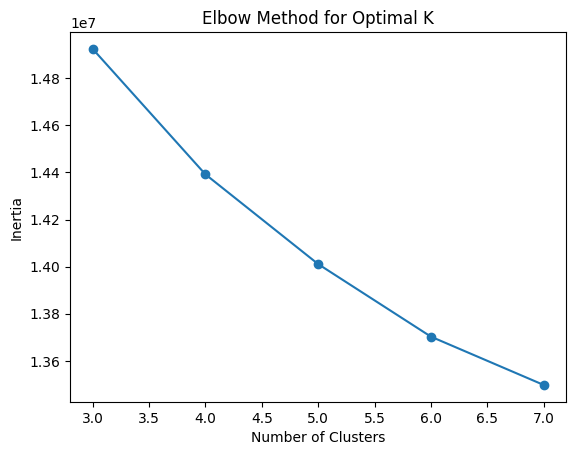

[14924575.0, 14391872.0, 14010875.0, 13702762.0, 13497664.0]
Optimal number of clusters: 6
Cluster 2: 1004 images
Cluster 1: 579 images
Cluster 5: 589 images
Cluster 6: 493 images
Cluster 3: 367 images
Cluster 4: 637 images


In [42]:
best_n_clusters,distortions = find_Keams_Cluster(features_loaded)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(features_loaded,best_n_clusters)

Cluster 1: 1004 items


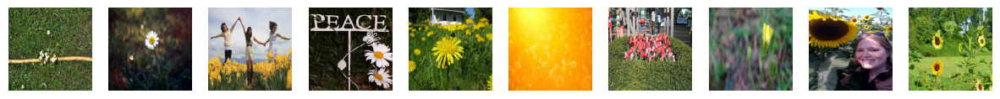


Cluster 0: 579 items


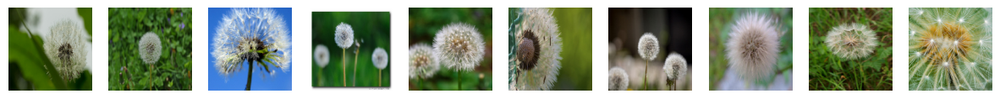


Cluster 4: 589 items


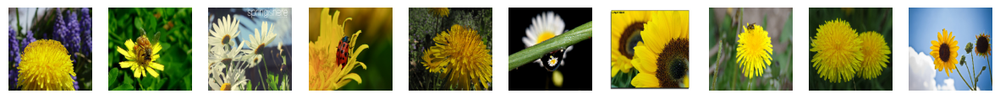


Cluster 5: 493 items


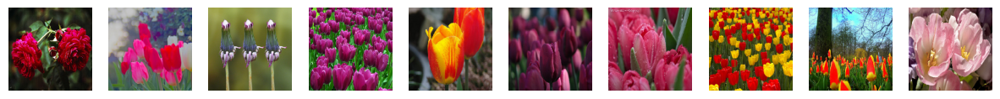


Cluster 2: 367 items


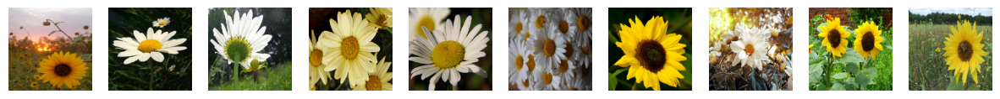


Cluster 3: 637 items


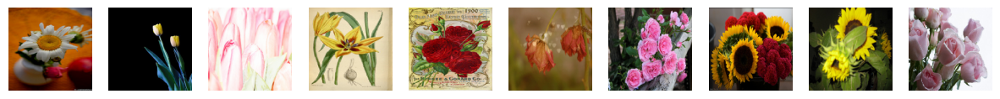

In [48]:
dic_Clusters = cluster_image_mappping(kmeans_clusters)
PlotImages(dic_Clusters)

In [62]:

pca = PCA()
pca.fit(scaler.fit_transform(features_loaded))

PCA()

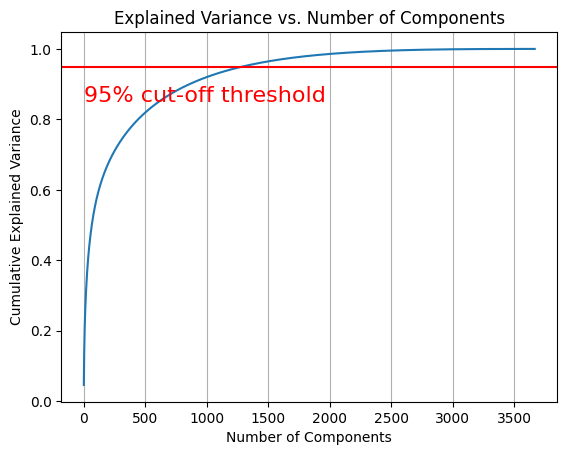

In [64]:
PlotPCAVariance(pca)


In [57]:
pca = PCA(n_components=100, random_state=42)
features_pca_1 = pca.fit_transform(features_loaded)

For n_clusters=3, the silhouette score is 0.08652076125144958
For n_clusters=4, the silhouette score is 0.08460129052400589
For n_clusters=5, the silhouette score is 0.0866447389125824
For n_clusters=6, the silhouette score is 0.09175564348697662
For n_clusters=7, the silhouette score is 0.06454165279865265
Best number of clusters: 6 with silhouette score: 0.09175564348697662


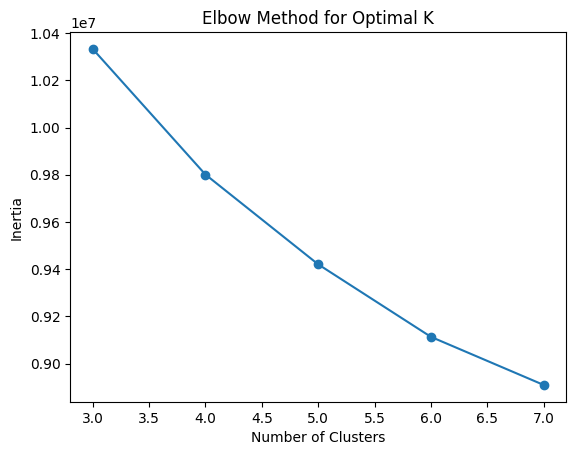

[10332964.0, 9801054.0, 9420720.0, 9113637.0, 8909946.0]
Optimal number of clusters: 6
Cluster 2: 1160 images
Cluster 4: 578 images
Cluster 5: 597 images
Cluster 1: 967 images
Cluster 3: 367 images


In [60]:
best_n_clusters,distortions = find_Keams_Cluster(features_pca_1)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(features_pca_1,best_n_clusters)

Cluster 1: 1160 items


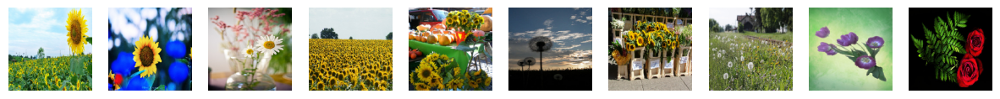


Cluster 3: 578 items


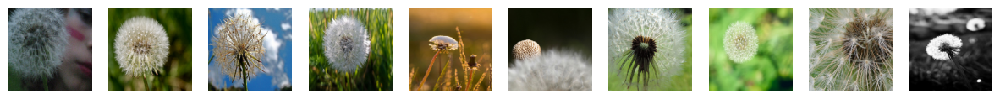


Cluster 4: 597 items


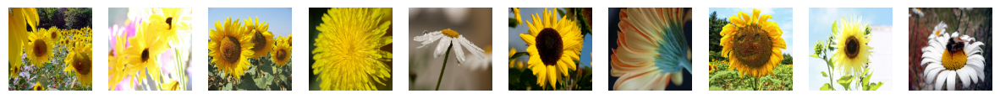


Cluster 0: 967 items


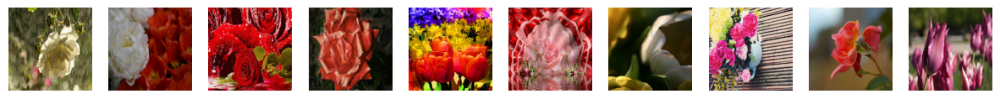


Cluster 2: 367 items


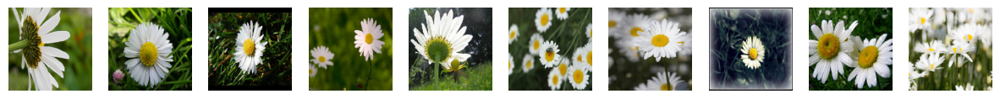

In [65]:
dic_Clusters = cluster_image_mappping(kmeans_clusters)
PlotImages(dic_Clusters)

# ResNet50

In [36]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input

In [37]:
# Load the pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False)
x = resnet_model.output
x = GlobalAveragePooling2D()(x)
model = Model(inputs=resnet_model.input, outputs=x)

# Define a function for image preprocessing and feature extraction
def extract_resnet50_features(img_path):
    img = image.load_img(img_path, target_size=(100, 100))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_preprocessed = preprocess_input(img_array)
    features = model.predict(img_preprocessed)
    features_flattened = features.flatten()
    return features_flattened



94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
# Initialize an array to store features for all images
all_features = []

# Extract features for each image
for img_file in tqdm(image_files, desc="Extracting features"):
    img_path = os.path.join(data_dir, img_file)
    features = extract_resnet50_features(img_path)
    all_features.append(features)

# Convert the features to a numpy array
all_features_array = np.array(all_features)
np.save("/content/features_ResNet50.npy", all_features_array)

In [38]:
features_resnet50 = np.load("/content/features_ResNet50.npy")
# Standardize the features
#scaler = StandardScaler()
#features_resnet50_std = scaler.fit_transform(features_resnet50)

# Apply PCA for dimensionality reduction (optional)


#pca = PCA()
#pca.fit(features_resnet50_std)

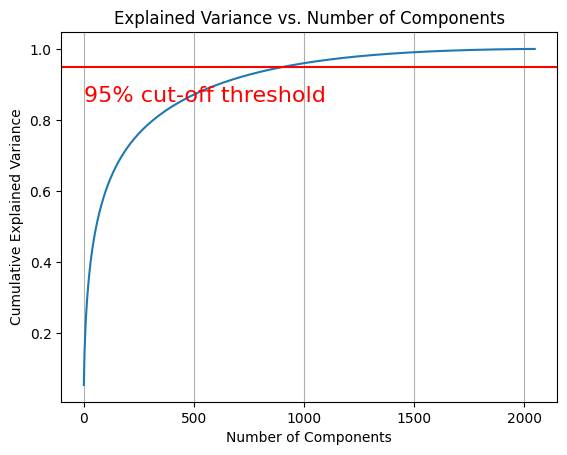

In [ ]:
# Plot the explained variance
fig, ax = plt.subplots()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
ax.grid(axis='x')
plt.show()

In [ ]:
# Choose the number of components based on your requirements
n_components = 100
pca = PCA(n_components=n_components)
features_resnet50_pca = pca.fit_transform(features_resnet50_std)

For n_clusters=3, the silhouette score is 0.050544191151857376
For n_clusters=4, the silhouette score is 0.048201821744441986
For n_clusters=5, the silhouette score is 0.051599759608507156
For n_clusters=6, the silhouette score is 0.04806051775813103
For n_clusters=7, the silhouette score is 0.043848950415849686
Best number of clusters: 5 with silhouette score: 0.051599759608507156


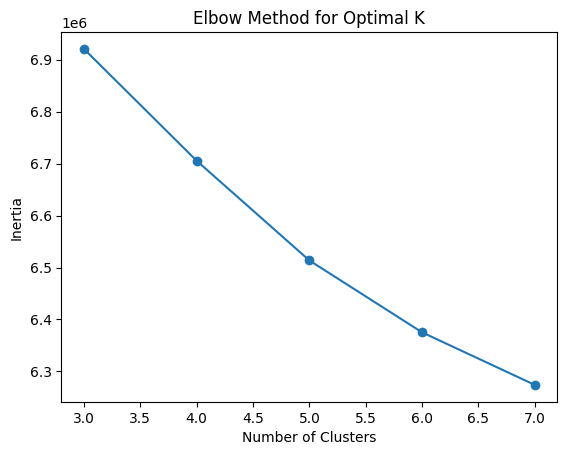

[6920735.0, 6705454.0, 6513540.0, 6375133.0, 6273995.0]
Optimal number of clusters: 5
Cluster 1: 522 images
Cluster 3: 979 images
Cluster 4: 698 images
Cluster 5: 626 images
Cluster 2: 844 images


In [40]:
#without standard scaler
best_n_clusters,distortions = find_Keams_Cluster(features_resnet50)
PlotElowCurve(distortions,best_n_clusters)
kmeans_clusters = Get_ClusterItems(features_resnet50,best_n_clusters)


Cluster 0: 522 items


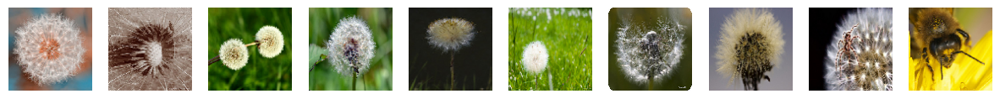


Cluster 2: 979 items


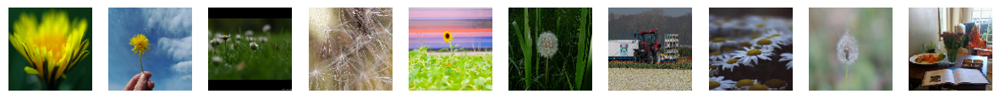


Cluster 3: 698 items


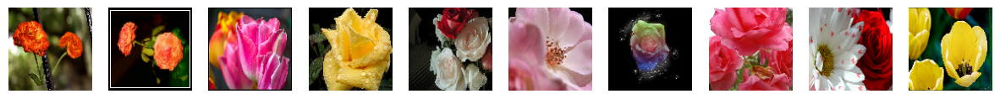


Cluster 4: 626 items


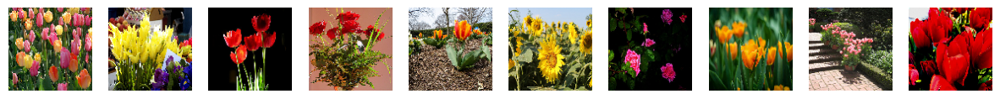


Cluster 1: 844 items


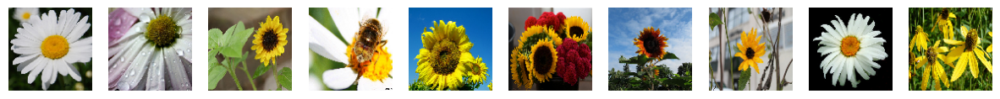

In [ ]:
dic_Clusters = cluster_image_mappping(kmeans_clusters)
PlotImages(dic_Clusters)

In [ ]:
import shutil
def MoveImagesToOutput(dic_Clusters_images):
  outputPath = "/content/flower_Result"
  os.makedirs(outputPath, exist_ok=True)
  for cluster_label, items in dic_Clusters_images.items():
    output_cluster_dir = os.path.join(outputPath, f'cluster_{cluster_label}')
    os.makedirs(output_cluster_dir, exist_ok=True)
    for img_name in items:
        src_path = os.path.join(data_dir, img_name)
        dst_path = os.path.join(output_cluster_dir, img_name)
        shutil.copy2(src_path, dst_path)

In [ ]:
MoveImagesToOutput(dic_Clusters)

with standard scaler

For n_clusters=3, the silhouette score is 0.011529626324772835
For n_clusters=4, the silhouette score is 0.008603020571172237
For n_clusters=5, the silhouette score is 0.0013128559803590178
For n_clusters=6, the silhouette score is -0.0005704457871615887
For n_clusters=7, the silhouette score is -0.004639558959752321
Best number of clusters: 3 with silhouette score: 0.011529626324772835


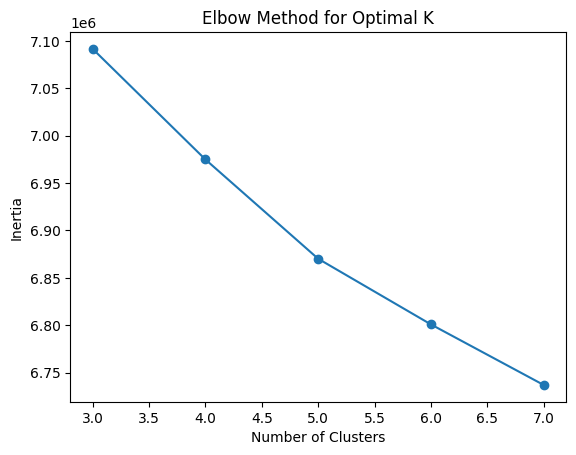

[7091717.0, 6974965.0, 6870143.0, 6800837.0, 6736906.0]
Optimal number of clusters: 3
Cluster 2: 989 images
Cluster 1: 905 images
Cluster 3: 1775 images


In [ ]:
# Standardize the features
scaler = StandardScaler()
features_resnet50_std = scaler.fit_transform(features_resnet50)

best_n_clusters_std,distortions_std = find_Keams_Cluster(features_resnet50_std)
PlotElowCurve(distortions_std,best_n_clusters_std)
Get_ClusterItems(features_resnet50_std,best_n_clusters_std)

For n_clusters=3, the silhouette score is 0.4063553214073181
For n_clusters=4, the silhouette score is 0.3853883743286133
For n_clusters=5, the silhouette score is 0.36960986256599426
For n_clusters=6, the silhouette score is 0.3525852560997009
For n_clusters=7, the silhouette score is 0.3523353040218353
Best number of clusters: 3 with silhouette score: 0.4063553214073181


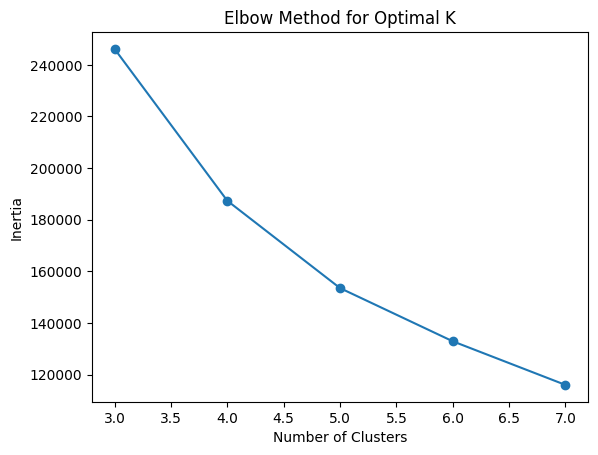

[246190.75, 187349.6875, 153495.5, 132878.46875, 115967.8125]
Optimal number of clusters: 3
Cluster 3: 1064 images
Cluster 1: 883 images
Cluster 2: 1722 images


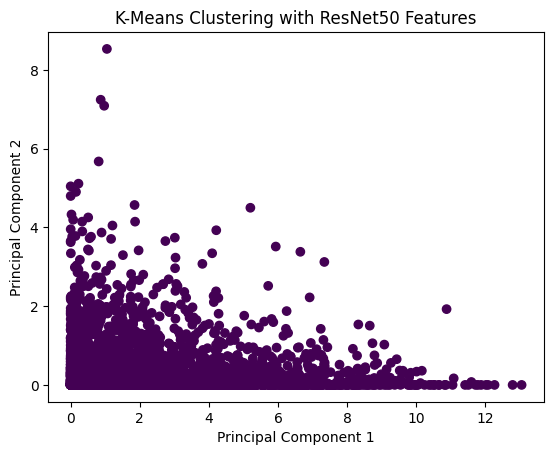

In [ ]:
n_components = 2
pca = PCA(n_components=n_components)
features_resnet50_pca = pca.fit_transform(features_resnet50_std)

best_n_clusters_pca,distortions_pca = find_Keams_Cluster(features_resnet50_pca)
PlotElowCurve(distortions_pca,best_n_clusters_pca)
Get_ClusterItems(features_resnet50_pca,best_n_clusters_pca)

# EfficientNetB0

In [69]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0

In [67]:
# Load EfficientNetB0 pre-trained model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

16705208/16705208 [==============================] - 0s 0us/step


In [71]:
# Preprocess and extract features from images
def extract_features_EnetB0(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    img_array = tf.expand_dims(img_array, 0)  # Add batch dimension
    features = base_model.predict(img_array)
    features = tf.keras.layers.GlobalAveragePooling2D()(features)  # Global Average Pooling
    return features.numpy()

In [73]:
# Load images and extract features
# Initialize an array to store features for all images
feature_vectors = []

# Extract features for each image
for img_file in tqdm(image_files, desc="Extracting features"):
    img_path = os.path.join(data_dir, img_file)
    features = extract_features_EnetB0(img_path)
    feature_vectors.append(features)

# Convert the features to a numpy array
features_array_EnetB0 = np.array(feature_vectors)
np.save("/content/features_EnetB0.npy", features_array_EnetB0)

Extracting features:   0%|          | 0/3669 [00:00<?, ?it/s]

1/1 [==============================] - 3s 3s/step


Extracting features:   0%|          | 1/3669 [00:02<2:47:49,  2.75s/it]

1/1 [==============================] - 0s 25ms/step


Extracting features:   0%|          | 3/3669 [00:02<46:46,  1.31it/s]  

1/1 [==============================] - 0s 25ms/step


Extracting features:   0%|          | 5/3669 [00:03<24:52,  2.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   0%|          | 7/3669 [00:03<16:15,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   0%|          | 9/3669 [00:03<11:50,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   0%|          | 11/3669 [00:03<09:12,  6.62it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   0%|          | 13/3669 [00:03<07:36,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   0%|          | 15/3669 [00:03<06:53,  8.83it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:   0%|          | 17/3669 [00:03<06:09,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   1%|          | 19/3669 [00:04<05:39, 10.75it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 21/3669 [00:04<05:15, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   1%|          | 23/3669 [00:04<04:55, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   1%|          | 25/3669 [00:04<04:42, 12.88it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 27/3669 [00:04<04:33, 13.31it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   1%|          | 29/3669 [00:04<04:29, 13.50it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   1%|          | 31/3669 [00:04<04:25, 13.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   1%|          | 33/3669 [00:05<04:27, 13.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   1%|          | 35/3669 [00:05<04:28, 13.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   1%|          | 37/3669 [00:05<04:28, 13.54it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 39/3669 [00:05<04:17, 14.11it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|          | 41/3669 [00:05<04:10, 14.48it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   1%|          | 43/3669 [00:05<04:08, 14.61it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   1%|          | 45/3669 [00:05<04:14, 14.24it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   1%|▏         | 47/3669 [00:06<04:29, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   1%|▏         | 49/3669 [00:06<04:33, 13.22it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   1%|▏         | 51/3669 [00:06<04:31, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   1%|▏         | 53/3669 [00:06<04:28, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   1%|▏         | 55/3669 [00:06<04:25, 13.62it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   2%|▏         | 57/3669 [00:06<04:22, 13.77it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   2%|▏         | 59/3669 [00:06<04:17, 14.00it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 61/3669 [00:07<04:14, 14.20it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   2%|▏         | 63/3669 [00:07<04:18, 13.96it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   2%|▏         | 65/3669 [00:07<04:18, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   2%|▏         | 67/3669 [00:07<04:17, 13.97it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 69/3669 [00:07<04:16, 14.01it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 71/3669 [00:07<04:18, 13.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   2%|▏         | 73/3669 [00:07<04:12, 14.24it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   2%|▏         | 75/3669 [00:08<04:11, 14.29it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   2%|▏         | 77/3669 [00:08<04:12, 14.21it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 79/3669 [00:08<04:12, 14.21it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   2%|▏         | 81/3669 [00:08<04:13, 14.16it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   2%|▏         | 83/3669 [00:08<04:15, 14.05it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 85/3669 [00:08<04:14, 14.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 87/3669 [00:08<04:08, 14.43it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   2%|▏         | 89/3669 [00:09<04:14, 14.07it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   2%|▏         | 91/3669 [00:09<04:19, 13.80it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   3%|▎         | 93/3669 [00:09<04:18, 13.85it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   3%|▎         | 95/3669 [00:09<04:12, 14.15it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   3%|▎         | 97/3669 [00:09<04:10, 14.23it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   3%|▎         | 99/3669 [00:09<04:12, 14.12it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   3%|▎         | 101/3669 [00:09<04:39, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   3%|▎         | 103/3669 [00:10<05:05, 11.66it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:   3%|▎         | 105/3669 [00:10<05:23, 11.01it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   3%|▎         | 107/3669 [00:10<05:38, 10.53it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   3%|▎         | 109/3669 [00:10<05:46, 10.26it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   3%|▎         | 111/3669 [00:11<05:56,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:   3%|▎         | 113/3669 [00:11<05:56,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:   3%|▎         | 115/3669 [00:11<06:01,  9.84it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   3%|▎         | 116/3669 [00:11<06:02,  9.81it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   3%|▎         | 118/3669 [00:11<06:00,  9.85it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   3%|▎         | 119/3669 [00:11<06:01,  9.82it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   3%|▎         | 121/3669 [00:12<05:57,  9.91it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   3%|▎         | 122/3669 [00:12<05:58,  9.89it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   3%|▎         | 123/3669 [00:12<06:00,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:   3%|▎         | 125/3669 [00:12<06:02,  9.77it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   3%|▎         | 126/3669 [00:12<06:02,  9.78it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   3%|▎         | 127/3669 [00:12<06:01,  9.80it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   3%|▎         | 128/3669 [00:12<06:06,  9.66it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   4%|▎         | 129/3669 [00:12<06:08,  9.61it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:   4%|▎         | 130/3669 [00:12<06:05,  9.69it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   4%|▎         | 131/3669 [00:13<06:06,  9.64it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   4%|▎         | 132/3669 [00:13<06:08,  9.59it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:   4%|▎         | 133/3669 [00:13<06:05,  9.67it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   4%|▎         | 134/3669 [00:13<06:09,  9.56it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:   4%|▎         | 135/3669 [00:13<06:18,  9.33it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   4%|▎         | 136/3669 [00:13<06:24,  9.18it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:   4%|▎         | 137/3669 [00:13<06:32,  9.01it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:   4%|▍         | 138/3669 [00:13<06:33,  8.98it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:   4%|▍         | 140/3669 [00:14<06:18,  9.32it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:   4%|▍         | 141/3669 [00:14<06:28,  9.07it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   4%|▍         | 142/3669 [00:14<06:26,  9.13it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:   4%|▍         | 143/3669 [00:14<06:55,  8.50it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   4%|▍         | 144/3669 [00:14<07:03,  8.31it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   4%|▍         | 146/3669 [00:14<06:31,  9.01it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   4%|▍         | 147/3669 [00:14<06:33,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   4%|▍         | 148/3669 [00:14<06:30,  9.03it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   4%|▍         | 149/3669 [00:15<06:27,  9.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   4%|▍         | 150/3669 [00:15<06:33,  8.94it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   4%|▍         | 151/3669 [00:15<06:27,  9.08it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:   4%|▍         | 152/3669 [00:15<06:42,  8.74it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:   4%|▍         | 153/3669 [00:15<06:49,  8.59it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   4%|▍         | 154/3669 [00:15<06:43,  8.72it/s]

1/1 [==============================] - 0s 122ms/step


Extracting features:   4%|▍         | 155/3669 [00:15<08:06,  7.22it/s]

1/1 [==============================] - 0s 126ms/step


Extracting features:   4%|▍         | 156/3669 [00:16<12:46,  4.58it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:   4%|▍         | 157/3669 [00:16<13:57,  4.19it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:   4%|▍         | 158/3669 [00:16<12:56,  4.52it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:   4%|▍         | 159/3669 [00:16<12:50,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   4%|▍         | 161/3669 [00:17<08:44,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   4%|▍         | 163/3669 [00:17<07:01,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   4%|▍         | 165/3669 [00:17<05:55,  9.86it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   5%|▍         | 167/3669 [00:17<05:17, 11.03it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   5%|▍         | 169/3669 [00:17<04:54, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▍         | 171/3669 [00:17<04:38, 12.57it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▍         | 173/3669 [00:17<04:28, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▍         | 175/3669 [00:18<04:21, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   5%|▍         | 177/3669 [00:18<04:12, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▍         | 179/3669 [00:18<04:12, 13.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▍         | 181/3669 [00:18<04:12, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▍         | 183/3669 [00:18<04:13, 13.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▌         | 185/3669 [00:18<04:08, 14.01it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   5%|▌         | 187/3669 [00:18<04:04, 14.23it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▌         | 189/3669 [00:19<04:11, 13.86it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:   5%|▌         | 191/3669 [00:19<04:14, 13.65it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   5%|▌         | 193/3669 [00:19<04:22, 13.24it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▌         | 195/3669 [00:19<04:14, 13.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▌         | 197/3669 [00:19<04:16, 13.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   5%|▌         | 199/3669 [00:19<04:13, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   5%|▌         | 201/3669 [00:19<04:14, 13.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   6%|▌         | 203/3669 [00:20<04:15, 13.58it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   6%|▌         | 205/3669 [00:20<04:11, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   6%|▌         | 207/3669 [00:20<04:12, 13.73it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   6%|▌         | 209/3669 [00:20<04:10, 13.79it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   6%|▌         | 211/3669 [00:20<04:13, 13.64it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   6%|▌         | 213/3669 [00:20<04:12, 13.71it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   6%|▌         | 215/3669 [00:20<04:08, 13.93it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   6%|▌         | 217/3669 [00:21<04:08, 13.87it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   6%|▌         | 219/3669 [00:21<04:10, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   6%|▌         | 221/3669 [00:21<04:11, 13.70it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:   6%|▌         | 223/3669 [00:21<04:17, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   6%|▌         | 225/3669 [00:21<04:20, 13.24it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   6%|▌         | 227/3669 [00:21<04:18, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   6%|▌         | 229/3669 [00:22<04:18, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   6%|▋         | 231/3669 [00:22<04:21, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   6%|▋         | 233/3669 [00:22<04:16, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   6%|▋         | 235/3669 [00:22<04:23, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   6%|▋         | 237/3669 [00:22<04:24, 12.96it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   7%|▋         | 239/3669 [00:22<04:29, 12.71it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   7%|▋         | 241/3669 [00:22<04:24, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 243/3669 [00:23<04:23, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   7%|▋         | 245/3669 [00:23<04:21, 13.11it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   7%|▋         | 247/3669 [00:23<04:18, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   7%|▋         | 249/3669 [00:23<04:17, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   7%|▋         | 251/3669 [00:23<04:12, 13.53it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   7%|▋         | 253/3669 [00:23<04:23, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   7%|▋         | 255/3669 [00:24<04:20, 13.11it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   7%|▋         | 257/3669 [00:24<04:24, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   7%|▋         | 259/3669 [00:24<04:18, 13.18it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:   7%|▋         | 261/3669 [00:24<04:18, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 263/3669 [00:24<04:13, 13.44it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:   7%|▋         | 265/3669 [00:24<04:15, 13.33it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   7%|▋         | 267/3669 [00:24<04:12, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   7%|▋         | 269/3669 [00:25<04:12, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   7%|▋         | 271/3669 [00:25<04:14, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:   7%|▋         | 273/3669 [00:25<04:15, 13.30it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   7%|▋         | 275/3669 [00:25<04:14, 13.34it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   8%|▊         | 277/3669 [00:25<04:09, 13.59it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   8%|▊         | 279/3669 [00:25<04:13, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:   8%|▊         | 281/3669 [00:25<04:15, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:   8%|▊         | 283/3669 [00:26<04:11, 13.45it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   8%|▊         | 285/3669 [00:26<04:47, 11.77it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   8%|▊         | 287/3669 [00:26<05:07, 10.99it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   8%|▊         | 289/3669 [00:26<05:27, 10.33it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:   8%|▊         | 291/3669 [00:26<05:46,  9.75it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   8%|▊         | 293/3669 [00:27<06:08,  9.17it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:   8%|▊         | 294/3669 [00:27<06:13,  9.05it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   8%|▊         | 295/3669 [00:27<06:13,  9.03it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   8%|▊         | 296/3669 [00:27<06:12,  9.06it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   8%|▊         | 297/3669 [00:27<06:05,  9.22it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   8%|▊         | 298/3669 [00:27<06:16,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   8%|▊         | 299/3669 [00:27<06:18,  8.91it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:   8%|▊         | 300/3669 [00:28<07:00,  8.02it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:   8%|▊         | 301/3669 [00:28<06:49,  8.22it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   8%|▊         | 302/3669 [00:28<06:39,  8.43it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   8%|▊         | 303/3669 [00:28<06:22,  8.80it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   8%|▊         | 304/3669 [00:28<06:17,  8.92it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   8%|▊         | 306/3669 [00:28<06:01,  9.30it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:   8%|▊         | 307/3669 [00:28<06:01,  9.31it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:   8%|▊         | 308/3669 [00:28<06:01,  9.31it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   8%|▊         | 310/3669 [00:29<05:54,  9.46it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   8%|▊         | 311/3669 [00:29<06:24,  8.73it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   9%|▊         | 312/3669 [00:29<06:20,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:   9%|▊         | 313/3669 [00:29<06:10,  9.06it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▊         | 315/3669 [00:29<05:49,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:   9%|▊         | 316/3669 [00:29<05:54,  9.45it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:   9%|▊         | 317/3669 [00:29<06:04,  9.20it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:   9%|▊         | 318/3669 [00:30<06:04,  9.20it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▊         | 319/3669 [00:30<06:45,  8.27it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▊         | 320/3669 [00:30<06:36,  8.45it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:   9%|▊         | 321/3669 [00:30<07:02,  7.92it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▉         | 322/3669 [00:30<06:37,  8.41it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▉         | 323/3669 [00:30<06:34,  8.48it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:   9%|▉         | 325/3669 [00:30<06:13,  8.94it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:   9%|▉         | 326/3669 [00:30<06:07,  9.09it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   9%|▉         | 327/3669 [00:31<06:14,  8.93it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▉         | 328/3669 [00:31<06:07,  9.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▉         | 329/3669 [00:31<06:07,  9.10it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:   9%|▉         | 330/3669 [00:31<06:01,  9.24it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:   9%|▉         | 332/3669 [00:31<05:41,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   9%|▉         | 333/3669 [00:31<05:50,  9.52it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:   9%|▉         | 334/3669 [00:31<06:02,  9.20it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   9%|▉         | 335/3669 [00:31<06:03,  9.18it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:   9%|▉         | 336/3669 [00:32<06:05,  9.11it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:   9%|▉         | 337/3669 [00:32<06:39,  8.34it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:   9%|▉         | 338/3669 [00:32<06:20,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   9%|▉         | 340/3669 [00:32<05:44,  9.67it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   9%|▉         | 342/3669 [00:32<05:05, 10.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   9%|▉         | 344/3669 [00:32<04:47, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:   9%|▉         | 346/3669 [00:32<04:29, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:   9%|▉         | 348/3669 [00:33<04:21, 12.72it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  10%|▉         | 350/3669 [00:33<04:15, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  10%|▉         | 352/3669 [00:33<04:16, 12.94it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|▉         | 354/3669 [00:33<04:12, 13.12it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  10%|▉         | 356/3669 [00:33<04:05, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|▉         | 358/3669 [00:33<04:02, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|▉         | 360/3669 [00:33<03:59, 13.79it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|▉         | 362/3669 [00:34<04:07, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  10%|▉         | 364/3669 [00:34<04:12, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|▉         | 366/3669 [00:34<04:08, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  10%|█         | 368/3669 [00:34<04:06, 13.37it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|█         | 370/3669 [00:34<04:08, 13.29it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  10%|█         | 372/3669 [00:34<04:04, 13.46it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  10%|█         | 374/3669 [00:34<04:06, 13.38it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  10%|█         | 376/3669 [00:35<04:25, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|█         | 378/3669 [00:35<04:19, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  10%|█         | 380/3669 [00:35<04:14, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|█         | 382/3669 [00:35<04:11, 13.04it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  10%|█         | 384/3669 [00:35<04:07, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  11%|█         | 386/3669 [00:35<04:28, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  11%|█         | 388/3669 [00:36<04:46, 11.46it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  11%|█         | 390/3669 [00:36<04:40, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  11%|█         | 392/3669 [00:36<04:33, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  11%|█         | 394/3669 [00:36<04:31, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  11%|█         | 396/3669 [00:36<04:46, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█         | 398/3669 [00:36<04:36, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█         | 400/3669 [00:37<04:23, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  11%|█         | 402/3669 [00:37<04:19, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  11%|█         | 404/3669 [00:37<04:13, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  11%|█         | 406/3669 [00:37<04:12, 12.92it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█         | 408/3669 [00:37<04:09, 13.06it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  11%|█         | 410/3669 [00:37<04:05, 13.29it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  11%|█         | 412/3669 [00:38<04:01, 13.50it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█▏        | 414/3669 [00:38<04:03, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  11%|█▏        | 416/3669 [00:38<04:07, 13.13it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█▏        | 418/3669 [00:38<04:05, 13.26it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  11%|█▏        | 420/3669 [00:38<04:04, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  12%|█▏        | 422/3669 [00:38<04:00, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  12%|█▏        | 424/3669 [00:38<04:01, 13.44it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  12%|█▏        | 426/3669 [00:39<04:00, 13.49it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  12%|█▏        | 428/3669 [00:39<04:07, 13.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  12%|█▏        | 430/3669 [00:39<04:23, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  12%|█▏        | 432/3669 [00:39<04:17, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  12%|█▏        | 434/3669 [00:40<06:43,  8.01it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  12%|█▏        | 436/3669 [00:40<06:00,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  12%|█▏        | 438/3669 [00:40<05:36,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  12%|█▏        | 440/3669 [00:40<05:16, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  12%|█▏        | 442/3669 [00:40<05:05, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  12%|█▏        | 444/3669 [00:40<04:59, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  12%|█▏        | 446/3669 [00:41<04:46, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  12%|█▏        | 448/3669 [00:41<04:36, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  12%|█▏        | 450/3669 [00:41<04:28, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  12%|█▏        | 452/3669 [00:41<04:29, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  12%|█▏        | 454/3669 [00:41<04:26, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  12%|█▏        | 456/3669 [00:41<04:20, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  12%|█▏        | 458/3669 [00:41<04:14, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  13%|█▎        | 460/3669 [00:42<04:19, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  13%|█▎        | 462/3669 [00:42<04:19, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  13%|█▎        | 464/3669 [00:42<04:32, 11.77it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  13%|█▎        | 466/3669 [00:42<05:00, 10.65it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  13%|█▎        | 468/3669 [00:42<05:17, 10.07it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  13%|█▎        | 470/3669 [00:43<06:02,  8.82it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  13%|█▎        | 471/3669 [00:43<06:12,  8.58it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  13%|█▎        | 472/3669 [00:43<06:11,  8.62it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  13%|█▎        | 473/3669 [00:43<06:34,  8.10it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  13%|█▎        | 474/3669 [00:43<06:20,  8.40it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  13%|█▎        | 475/3669 [00:43<06:14,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  13%|█▎        | 476/3669 [00:43<06:02,  8.80it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  13%|█▎        | 477/3669 [00:44<06:26,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  13%|█▎        | 478/3669 [00:44<06:19,  8.41it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  13%|█▎        | 479/3669 [00:44<06:18,  8.42it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  13%|█▎        | 480/3669 [00:44<06:20,  8.37it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  13%|█▎        | 481/3669 [00:44<06:09,  8.62it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  13%|█▎        | 482/3669 [00:44<06:00,  8.84it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  13%|█▎        | 483/3669 [00:44<06:00,  8.83it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  13%|█▎        | 484/3669 [00:44<06:27,  8.22it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  13%|█▎        | 485/3669 [00:45<06:08,  8.63it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  13%|█▎        | 486/3669 [00:45<06:49,  7.77it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  13%|█▎        | 487/3669 [00:45<06:31,  8.13it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  13%|█▎        | 488/3669 [00:45<06:25,  8.26it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  13%|█▎        | 489/3669 [00:45<06:15,  8.46it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  13%|█▎        | 490/3669 [00:45<06:16,  8.45it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  13%|█▎        | 491/3669 [00:45<06:04,  8.73it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  13%|█▎        | 492/3669 [00:45<06:01,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  13%|█▎        | 493/3669 [00:45<05:56,  8.90it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  13%|█▎        | 494/3669 [00:46<06:27,  8.19it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  13%|█▎        | 495/3669 [00:46<06:26,  8.22it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  14%|█▎        | 496/3669 [00:46<06:05,  8.68it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  14%|█▎        | 497/3669 [00:46<06:01,  8.77it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  14%|█▎        | 498/3669 [00:46<05:55,  8.93it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  14%|█▎        | 499/3669 [00:46<05:46,  9.15it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  14%|█▎        | 500/3669 [00:46<05:47,  9.11it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  14%|█▎        | 501/3669 [00:46<05:47,  9.10it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  14%|█▎        | 502/3669 [00:47<05:56,  8.89it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  14%|█▎        | 503/3669 [00:47<05:51,  9.01it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  14%|█▎        | 504/3669 [00:47<05:58,  8.84it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  14%|█▍        | 505/3669 [00:47<05:49,  9.04it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  14%|█▍        | 506/3669 [00:47<06:14,  8.44it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  14%|█▍        | 507/3669 [00:47<06:04,  8.68it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  14%|█▍        | 508/3669 [00:47<06:08,  8.59it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  14%|█▍        | 509/3669 [00:47<05:52,  8.96it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  14%|█▍        | 510/3669 [00:47<06:17,  8.38it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  14%|█▍        | 511/3669 [00:48<06:11,  8.50it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  14%|█▍        | 512/3669 [00:48<06:01,  8.74it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  14%|█▍        | 513/3669 [00:48<06:01,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  14%|█▍        | 514/3669 [00:48<05:58,  8.81it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  14%|█▍        | 515/3669 [00:48<06:06,  8.60it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  14%|█▍        | 516/3669 [00:48<05:59,  8.76it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  14%|█▍        | 517/3669 [00:48<05:53,  8.92it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  14%|█▍        | 518/3669 [00:48<05:48,  9.03it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  14%|█▍        | 519/3669 [00:48<05:44,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  14%|█▍        | 521/3669 [00:49<04:48, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  14%|█▍        | 523/3669 [00:49<04:32, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  14%|█▍        | 525/3669 [00:49<04:13, 12.40it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  14%|█▍        | 527/3669 [00:49<04:07, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  14%|█▍        | 529/3669 [00:49<04:01, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  14%|█▍        | 531/3669 [00:49<04:02, 12.92it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  15%|█▍        | 533/3669 [00:49<03:59, 13.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  15%|█▍        | 535/3669 [00:50<03:55, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  15%|█▍        | 537/3669 [00:50<03:59, 13.09it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  15%|█▍        | 539/3669 [00:50<03:54, 13.35it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  15%|█▍        | 541/3669 [00:50<04:04, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  15%|█▍        | 543/3669 [00:50<04:00, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  15%|█▍        | 545/3669 [00:50<04:03, 12.85it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  15%|█▍        | 547/3669 [00:51<04:01, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  15%|█▍        | 549/3669 [00:51<03:57, 13.12it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  15%|█▌        | 551/3669 [00:51<03:59, 13.02it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  15%|█▌        | 553/3669 [00:51<04:02, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  15%|█▌        | 555/3669 [00:51<04:11, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  15%|█▌        | 557/3669 [00:51<04:05, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  15%|█▌        | 559/3669 [00:51<04:02, 12.80it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  15%|█▌        | 561/3669 [00:52<04:01, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  15%|█▌        | 563/3669 [00:52<03:59, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  15%|█▌        | 565/3669 [00:52<03:59, 12.98it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  15%|█▌        | 567/3669 [00:52<04:02, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 569/3669 [00:52<04:00, 12.88it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  16%|█▌        | 571/3669 [00:52<04:01, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 573/3669 [00:53<03:58, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 575/3669 [00:53<03:52, 13.28it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 577/3669 [00:53<03:57, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 579/3669 [00:53<03:51, 13.37it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  16%|█▌        | 581/3669 [00:53<03:52, 13.26it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  16%|█▌        | 583/3669 [00:53<03:52, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▌        | 585/3669 [00:53<03:55, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  16%|█▌        | 587/3669 [00:54<03:53, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  16%|█▌        | 589/3669 [00:54<03:53, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▌        | 591/3669 [00:54<03:49, 13.39it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  16%|█▌        | 593/3669 [00:54<03:49, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  16%|█▌        | 595/3669 [00:54<03:56, 13.02it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  16%|█▋        | 597/3669 [00:54<03:52, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  16%|█▋        | 599/3669 [00:55<03:52, 13.21it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  16%|█▋        | 601/3669 [00:55<03:49, 13.35it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  16%|█▋        | 603/3669 [00:55<03:53, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  16%|█▋        | 605/3669 [00:55<03:55, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  17%|█▋        | 607/3669 [00:55<03:58, 12.84it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  17%|█▋        | 609/3669 [00:55<03:57, 12.87it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  17%|█▋        | 611/3669 [00:55<03:57, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  17%|█▋        | 613/3669 [00:56<03:58, 12.82it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  17%|█▋        | 615/3669 [00:56<03:54, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  17%|█▋        | 617/3669 [00:56<03:53, 13.08it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  17%|█▋        | 619/3669 [00:56<03:52, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  17%|█▋        | 621/3669 [00:56<03:55, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  17%|█▋        | 623/3669 [00:56<03:54, 12.99it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  17%|█▋        | 625/3669 [00:57<03:48, 13.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  17%|█▋        | 627/3669 [00:57<04:07, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  17%|█▋        | 629/3669 [00:57<03:59, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  17%|█▋        | 631/3669 [00:57<03:59, 12.70it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  17%|█▋        | 633/3669 [00:57<03:55, 12.87it/s]

1/1 [==============================] - 0s 115ms/step


Extracting features:  17%|█▋        | 635/3669 [00:57<04:58, 10.15it/s]

1/1 [==============================] - 0s 110ms/step


Extracting features:  17%|█▋        | 637/3669 [00:58<07:37,  6.63it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  17%|█▋        | 638/3669 [00:58<08:33,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  17%|█▋        | 639/3669 [00:58<08:08,  6.21it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  17%|█▋        | 640/3669 [00:59<07:34,  6.66it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  17%|█▋        | 641/3669 [00:59<07:08,  7.07it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  17%|█▋        | 642/3669 [00:59<07:21,  6.86it/s]

1/1 [==============================] - 0s 191ms/step


Extracting features:  18%|█▊        | 643/3669 [00:59<11:56,  4.22it/s]

1/1 [==============================] - 0s 200ms/step


Extracting features:  18%|█▊        | 644/3669 [01:00<15:55,  3.16it/s]

1/1 [==============================] - 0s 143ms/step


Extracting features:  18%|█▊        | 645/3669 [01:00<17:28,  2.89it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  18%|█▊        | 646/3669 [01:01<16:35,  3.04it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  18%|█▊        | 647/3669 [01:01<14:07,  3.57it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  18%|█▊        | 648/3669 [01:01<12:16,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  18%|█▊        | 649/3669 [01:01<10:16,  4.90it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  18%|█▊        | 650/3669 [01:01<08:56,  5.63it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  18%|█▊        | 651/3669 [01:01<07:53,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  18%|█▊        | 653/3669 [01:01<06:34,  7.65it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  18%|█▊        | 654/3669 [01:01<06:19,  7.95it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  18%|█▊        | 655/3669 [01:02<06:03,  8.30it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  18%|█▊        | 656/3669 [01:02<05:56,  8.45it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  18%|█▊        | 657/3669 [01:02<05:59,  8.37it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  18%|█▊        | 658/3669 [01:02<05:52,  8.54it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  18%|█▊        | 659/3669 [01:02<06:21,  7.89it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  18%|█▊        | 660/3669 [01:02<06:03,  8.28it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  18%|█▊        | 661/3669 [01:02<05:53,  8.52it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  18%|█▊        | 662/3669 [01:02<05:50,  8.58it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  18%|█▊        | 663/3669 [01:03<05:53,  8.51it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  18%|█▊        | 664/3669 [01:03<05:45,  8.70it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  18%|█▊        | 665/3669 [01:03<05:41,  8.80it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  18%|█▊        | 666/3669 [01:03<05:48,  8.63it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  18%|█▊        | 667/3669 [01:03<05:42,  8.76it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  18%|█▊        | 668/3669 [01:03<05:39,  8.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 669/3669 [01:03<05:56,  8.40it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  18%|█▊        | 670/3669 [01:03<06:03,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  18%|█▊        | 671/3669 [01:03<06:00,  8.31it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 672/3669 [01:04<06:20,  7.87it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  18%|█▊        | 673/3669 [01:04<06:40,  7.48it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  18%|█▊        | 674/3669 [01:04<07:05,  7.05it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 675/3669 [01:04<07:48,  6.40it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  18%|█▊        | 676/3669 [01:04<07:55,  6.29it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  18%|█▊        | 677/3669 [01:04<07:48,  6.39it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  18%|█▊        | 678/3669 [01:05<08:06,  6.15it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  19%|█▊        | 679/3669 [01:05<07:59,  6.24it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  19%|█▊        | 680/3669 [01:05<08:41,  5.73it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  19%|█▊        | 681/3669 [01:05<08:00,  6.22it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  19%|█▊        | 682/3669 [01:05<07:37,  6.52it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  19%|█▊        | 683/3669 [01:05<07:17,  6.83it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  19%|█▊        | 684/3669 [01:05<07:09,  6.95it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  19%|█▊        | 685/3669 [01:06<07:35,  6.55it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  19%|█▊        | 686/3669 [01:06<07:46,  6.40it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  19%|█▊        | 687/3669 [01:06<08:05,  6.14it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  19%|█▉        | 688/3669 [01:06<07:44,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  19%|█▉        | 689/3669 [01:06<08:31,  5.83it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  19%|█▉        | 690/3669 [01:06<07:44,  6.41it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  19%|█▉        | 692/3669 [01:07<06:35,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  19%|█▉        | 694/3669 [01:07<05:35,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  19%|█▉        | 696/3669 [01:07<04:56, 10.03it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  19%|█▉        | 698/3669 [01:07<04:29, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  19%|█▉        | 700/3669 [01:07<04:16, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  19%|█▉        | 702/3669 [01:07<04:07, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  19%|█▉        | 704/3669 [01:08<04:03, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 706/3669 [01:08<03:57, 12.45it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  19%|█▉        | 708/3669 [01:08<04:16, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  19%|█▉        | 710/3669 [01:08<04:06, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  19%|█▉        | 712/3669 [01:08<04:04, 12.10it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  19%|█▉        | 714/3669 [01:08<03:58, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  20%|█▉        | 716/3669 [01:09<03:54, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  20%|█▉        | 718/3669 [01:09<03:52, 12.70it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  20%|█▉        | 720/3669 [01:09<03:56, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  20%|█▉        | 722/3669 [01:09<03:55, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|█▉        | 724/3669 [01:09<03:51, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  20%|█▉        | 726/3669 [01:09<03:47, 12.92it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  20%|█▉        | 728/3669 [01:10<03:46, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  20%|█▉        | 730/3669 [01:10<03:48, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  20%|█▉        | 732/3669 [01:10<03:46, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  20%|██        | 734/3669 [01:10<03:47, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  20%|██        | 736/3669 [01:10<03:46, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  20%|██        | 738/3669 [01:10<03:49, 12.78it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 740/3669 [01:10<03:43, 13.12it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 742/3669 [01:11<03:41, 13.24it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 744/3669 [01:11<03:40, 13.29it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  20%|██        | 746/3669 [01:11<04:41, 10.39it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  20%|██        | 748/3669 [01:12<06:58,  6.99it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  20%|██        | 749/3669 [01:12<07:14,  6.73it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  20%|██        | 751/3669 [01:12<06:05,  7.99it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  21%|██        | 753/3669 [01:12<05:20,  9.11it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  21%|██        | 755/3669 [01:12<04:49, 10.06it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 757/3669 [01:12<04:29, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 759/3669 [01:12<04:20, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██        | 761/3669 [01:13<04:02, 11.99it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 763/3669 [01:13<03:54, 12.37it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  21%|██        | 765/3669 [01:13<03:54, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  21%|██        | 767/3669 [01:13<04:05, 11.84it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 769/3669 [01:13<04:14, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 771/3669 [01:13<03:58, 12.16it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 773/3669 [01:14<03:52, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  21%|██        | 775/3669 [01:14<03:50, 12.57it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  21%|██        | 777/3669 [01:14<03:47, 12.73it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  21%|██        | 779/3669 [01:14<03:43, 12.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  21%|██▏       | 781/3669 [01:14<03:40, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  21%|██▏       | 783/3669 [01:14<03:44, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██▏       | 785/3669 [01:15<03:45, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  21%|██▏       | 787/3669 [01:15<03:43, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 789/3669 [01:15<04:00, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 791/3669 [01:15<03:59, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  22%|██▏       | 793/3669 [01:15<04:15, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  22%|██▏       | 795/3669 [01:15<04:06, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 797/3669 [01:16<04:00, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 799/3669 [01:16<04:10, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  22%|██▏       | 801/3669 [01:16<04:00, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  22%|██▏       | 803/3669 [01:16<03:57, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  22%|██▏       | 805/3669 [01:16<03:51, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  22%|██▏       | 807/3669 [01:16<03:48, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  22%|██▏       | 809/3669 [01:17<03:46, 12.64it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  22%|██▏       | 811/3669 [01:17<03:56, 12.07it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  22%|██▏       | 813/3669 [01:17<04:49,  9.87it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  22%|██▏       | 815/3669 [01:17<05:05,  9.34it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  22%|██▏       | 816/3669 [01:17<05:17,  8.99it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  22%|██▏       | 817/3669 [01:17<05:15,  9.03it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  22%|██▏       | 818/3669 [01:18<05:14,  9.06it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  22%|██▏       | 819/3669 [01:18<05:21,  8.87it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  22%|██▏       | 820/3669 [01:18<05:17,  8.97it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  22%|██▏       | 821/3669 [01:18<05:14,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  22%|██▏       | 822/3669 [01:18<05:11,  9.15it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  22%|██▏       | 823/3669 [01:18<05:09,  9.18it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  22%|██▏       | 824/3669 [01:18<05:06,  9.29it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  23%|██▎       | 826/3669 [01:18<04:54,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  23%|██▎       | 827/3669 [01:19<04:55,  9.63it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  23%|██▎       | 828/3669 [01:19<05:01,  9.43it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  23%|██▎       | 829/3669 [01:19<05:01,  9.42it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  23%|██▎       | 830/3669 [01:19<05:00,  9.44it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  23%|██▎       | 831/3669 [01:19<05:17,  8.95it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  23%|██▎       | 832/3669 [01:19<05:23,  8.77it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  23%|██▎       | 833/3669 [01:19<05:31,  8.56it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  23%|██▎       | 834/3669 [01:19<05:24,  8.74it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  23%|██▎       | 835/3669 [01:19<05:15,  8.97it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  23%|██▎       | 836/3669 [01:20<05:08,  9.19it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  23%|██▎       | 837/3669 [01:20<05:16,  8.95it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  23%|██▎       | 838/3669 [01:20<05:07,  9.20it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  23%|██▎       | 839/3669 [01:20<05:43,  8.23it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  23%|██▎       | 840/3669 [01:20<05:35,  8.42it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  23%|██▎       | 841/3669 [01:20<05:21,  8.81it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  23%|██▎       | 842/3669 [01:20<05:42,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  23%|██▎       | 843/3669 [01:20<05:32,  8.50it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  23%|██▎       | 844/3669 [01:21<05:25,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  23%|██▎       | 845/3669 [01:21<05:25,  8.68it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  23%|██▎       | 846/3669 [01:21<05:22,  8.76it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  23%|██▎       | 847/3669 [01:21<05:21,  8.77it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  23%|██▎       | 848/3669 [01:21<05:30,  8.52it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  23%|██▎       | 850/3669 [01:21<05:04,  9.25it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  23%|██▎       | 851/3669 [01:21<05:02,  9.33it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  23%|██▎       | 853/3669 [01:21<04:49,  9.72it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  23%|██▎       | 854/3669 [01:22<04:52,  9.62it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  23%|██▎       | 855/3669 [01:22<05:04,  9.24it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  23%|██▎       | 856/3669 [01:22<05:19,  8.80it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  23%|██▎       | 857/3669 [01:22<05:46,  8.12it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  23%|██▎       | 858/3669 [01:22<05:28,  8.55it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  23%|██▎       | 859/3669 [01:22<05:16,  8.88it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  23%|██▎       | 860/3669 [01:22<05:29,  8.52it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  23%|██▎       | 861/3669 [01:22<05:22,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  23%|██▎       | 862/3669 [01:23<05:21,  8.73it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  24%|██▎       | 864/3669 [01:23<05:29,  8.52it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  24%|██▎       | 865/3669 [01:23<05:24,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  24%|██▎       | 866/3669 [01:23<05:25,  8.62it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  24%|██▎       | 867/3669 [01:23<05:25,  8.62it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  24%|██▎       | 868/3669 [01:23<05:20,  8.75it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  24%|██▎       | 869/3669 [01:23<05:24,  8.63it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  24%|██▎       | 870/3669 [01:23<05:15,  8.88it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  24%|██▎       | 871/3669 [01:24<05:10,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  24%|██▍       | 873/3669 [01:24<04:38, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  24%|██▍       | 875/3669 [01:24<04:11, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  24%|██▍       | 877/3669 [01:24<03:57, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  24%|██▍       | 879/3669 [01:24<03:51, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  24%|██▍       | 881/3669 [01:24<03:44, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  24%|██▍       | 883/3669 [01:25<03:45, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  24%|██▍       | 885/3669 [01:25<03:42, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  24%|██▍       | 887/3669 [01:25<03:40, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  24%|██▍       | 889/3669 [01:25<03:36, 12.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  24%|██▍       | 891/3669 [01:25<03:40, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  24%|██▍       | 893/3669 [01:25<03:39, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  24%|██▍       | 895/3669 [01:25<03:41, 12.53it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  24%|██▍       | 897/3669 [01:26<03:59, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  25%|██▍       | 899/3669 [01:26<03:50, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▍       | 901/3669 [01:26<03:49, 12.06it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  25%|██▍       | 903/3669 [01:26<03:41, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  25%|██▍       | 905/3669 [01:26<03:41, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▍       | 907/3669 [01:26<03:41, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▍       | 909/3669 [01:27<03:44, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▍       | 911/3669 [01:27<03:42, 12.37it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  25%|██▍       | 913/3669 [01:27<03:39, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  25%|██▍       | 915/3669 [01:27<03:39, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  25%|██▍       | 917/3669 [01:27<03:36, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  25%|██▌       | 919/3669 [01:27<03:41, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▌       | 921/3669 [01:28<03:49, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  25%|██▌       | 923/3669 [01:28<04:04, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▌       | 925/3669 [01:28<03:56, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▌       | 927/3669 [01:28<03:54, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▌       | 929/3669 [01:28<03:50, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  25%|██▌       | 931/3669 [01:28<03:47, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  25%|██▌       | 933/3669 [01:29<03:45, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  25%|██▌       | 935/3669 [01:29<03:43, 12.22it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  26%|██▌       | 937/3669 [01:29<03:47, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  26%|██▌       | 939/3669 [01:29<03:58, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  26%|██▌       | 941/3669 [01:29<03:59, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  26%|██▌       | 943/3669 [01:29<04:07, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  26%|██▌       | 945/3669 [01:30<04:15, 10.65it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  26%|██▌       | 947/3669 [01:30<04:04, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  26%|██▌       | 949/3669 [01:30<03:53, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  26%|██▌       | 951/3669 [01:30<03:47, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  26%|██▌       | 953/3669 [01:30<03:44, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  26%|██▌       | 955/3669 [01:31<03:47, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  26%|██▌       | 957/3669 [01:31<03:48, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  26%|██▌       | 959/3669 [01:31<03:43, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  26%|██▌       | 961/3669 [01:31<03:36, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  26%|██▌       | 963/3669 [01:31<03:35, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  26%|██▋       | 965/3669 [01:31<03:35, 12.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  26%|██▋       | 967/3669 [01:31<03:34, 12.59it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  26%|██▋       | 969/3669 [01:32<03:34, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  26%|██▋       | 971/3669 [01:32<03:34, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  27%|██▋       | 973/3669 [01:32<03:34, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  27%|██▋       | 975/3669 [01:32<03:29, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 977/3669 [01:32<04:01, 11.16it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  27%|██▋       | 979/3669 [01:32<03:51, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  27%|██▋       | 981/3669 [01:33<03:49, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 983/3669 [01:33<03:43, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  27%|██▋       | 985/3669 [01:33<03:44, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  27%|██▋       | 987/3669 [01:33<03:42, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  27%|██▋       | 989/3669 [01:33<03:37, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  27%|██▋       | 991/3669 [01:33<03:42, 12.04it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  27%|██▋       | 993/3669 [01:34<03:52, 11.49it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  27%|██▋       | 995/3669 [01:34<04:09, 10.71it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  27%|██▋       | 997/3669 [01:34<04:31,  9.83it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  27%|██▋       | 999/3669 [01:34<04:38,  9.59it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  27%|██▋       | 1000/3669 [01:34<04:47,  9.29it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  27%|██▋       | 1001/3669 [01:35<05:14,  8.48it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  27%|██▋       | 1002/3669 [01:35<05:17,  8.40it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  27%|██▋       | 1003/3669 [01:35<05:12,  8.54it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  27%|██▋       | 1004/3669 [01:35<05:09,  8.62it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  27%|██▋       | 1005/3669 [01:35<05:13,  8.50it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  27%|██▋       | 1006/3669 [01:35<05:04,  8.74it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  27%|██▋       | 1007/3669 [01:35<04:59,  8.88it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  27%|██▋       | 1008/3669 [01:35<04:56,  8.98it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  28%|██▊       | 1009/3669 [01:36<04:53,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  28%|██▊       | 1010/3669 [01:36<04:58,  8.90it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  28%|██▊       | 1011/3669 [01:36<05:04,  8.72it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  28%|██▊       | 1012/3669 [01:36<05:13,  8.49it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1013/3669 [01:36<05:13,  8.48it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  28%|██▊       | 1014/3669 [01:36<05:04,  8.72it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  28%|██▊       | 1015/3669 [01:36<05:12,  8.49it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  28%|██▊       | 1016/3669 [01:36<05:20,  8.28it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1017/3669 [01:36<05:14,  8.43it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  28%|██▊       | 1018/3669 [01:37<05:22,  8.23it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  28%|██▊       | 1019/3669 [01:37<05:14,  8.43it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  28%|██▊       | 1020/3669 [01:37<05:23,  8.20it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  28%|██▊       | 1021/3669 [01:37<05:12,  8.47it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  28%|██▊       | 1022/3669 [01:37<05:09,  8.54it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  28%|██▊       | 1023/3669 [01:37<05:04,  8.69it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1024/3669 [01:37<05:01,  8.78it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  28%|██▊       | 1025/3669 [01:37<04:58,  8.85it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  28%|██▊       | 1026/3669 [01:38<05:05,  8.64it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  28%|██▊       | 1027/3669 [01:38<05:09,  8.54it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  28%|██▊       | 1028/3669 [01:38<05:41,  7.74it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  28%|██▊       | 1029/3669 [01:38<05:52,  7.48it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  28%|██▊       | 1030/3669 [01:38<05:29,  8.01it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  28%|██▊       | 1031/3669 [01:38<05:12,  8.45it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  28%|██▊       | 1032/3669 [01:38<05:08,  8.56it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1033/3669 [01:38<05:37,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  28%|██▊       | 1034/3669 [01:39<05:19,  8.24it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  28%|██▊       | 1035/3669 [01:39<05:09,  8.52it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  28%|██▊       | 1036/3669 [01:39<05:26,  8.07it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1037/3669 [01:39<05:27,  8.05it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1038/3669 [01:39<05:14,  8.36it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  28%|██▊       | 1039/3669 [01:39<04:59,  8.78it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  28%|██▊       | 1040/3669 [01:39<04:59,  8.77it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  28%|██▊       | 1041/3669 [01:39<05:12,  8.40it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  28%|██▊       | 1042/3669 [01:39<05:09,  8.48it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  28%|██▊       | 1043/3669 [01:40<05:29,  7.98it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  28%|██▊       | 1044/3669 [01:40<05:50,  7.50it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  28%|██▊       | 1045/3669 [01:40<05:42,  7.66it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  29%|██▊       | 1046/3669 [01:40<05:26,  8.02it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  29%|██▊       | 1047/3669 [01:40<05:13,  8.36it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  29%|██▊       | 1048/3669 [01:40<04:59,  8.77it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  29%|██▊       | 1049/3669 [01:40<04:57,  8.79it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  29%|██▊       | 1050/3669 [01:40<04:51,  9.00it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  29%|██▊       | 1051/3669 [01:41<04:58,  8.78it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  29%|██▊       | 1052/3669 [01:41<05:07,  8.51it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  29%|██▊       | 1053/3669 [01:41<05:14,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  29%|██▉       | 1055/3669 [01:41<04:37,  9.42it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1057/3669 [01:41<04:07, 10.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1059/3669 [01:41<03:56, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  29%|██▉       | 1061/3669 [01:41<03:47, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  29%|██▉       | 1063/3669 [01:42<03:47, 11.44it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1065/3669 [01:42<03:42, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  29%|██▉       | 1067/3669 [01:42<03:33, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1069/3669 [01:42<03:28, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  29%|██▉       | 1071/3669 [01:42<03:25, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  29%|██▉       | 1073/3669 [01:42<03:31, 12.30it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1075/3669 [01:43<03:27, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  29%|██▉       | 1077/3669 [01:43<03:24, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  29%|██▉       | 1079/3669 [01:43<03:23, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  29%|██▉       | 1081/3669 [01:43<03:25, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  30%|██▉       | 1083/3669 [01:43<03:24, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  30%|██▉       | 1085/3669 [01:43<03:24, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  30%|██▉       | 1087/3669 [01:44<03:26, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  30%|██▉       | 1089/3669 [01:44<03:23, 12.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|██▉       | 1091/3669 [01:44<03:23, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  30%|██▉       | 1093/3669 [01:44<03:24, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  30%|██▉       | 1095/3669 [01:44<03:21, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|██▉       | 1097/3669 [01:44<03:24, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  30%|██▉       | 1099/3669 [01:44<03:29, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  30%|███       | 1101/3669 [01:45<03:27, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  30%|███       | 1103/3669 [01:45<03:27, 12.35it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  30%|███       | 1105/3669 [01:45<03:24, 12.53it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  30%|███       | 1107/3669 [01:45<03:24, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1109/3669 [01:45<03:24, 12.51it/s]

1/1 [==============================] - 0s 22ms/step


Extracting features:  30%|███       | 1111/3669 [01:45<03:21, 12.67it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  30%|███       | 1113/3669 [01:46<03:21, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  30%|███       | 1115/3669 [01:46<03:22, 12.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  30%|███       | 1117/3669 [01:46<03:21, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  30%|███       | 1119/3669 [01:46<03:23, 12.54it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███       | 1121/3669 [01:46<03:19, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  31%|███       | 1123/3669 [01:46<03:20, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  31%|███       | 1125/3669 [01:47<03:18, 12.83it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1127/3669 [01:47<03:21, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1129/3669 [01:47<03:21, 12.63it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1131/3669 [01:47<03:16, 12.91it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███       | 1133/3669 [01:47<03:21, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  31%|███       | 1135/3669 [01:47<03:23, 12.43it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  31%|███       | 1137/3669 [01:47<03:24, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  31%|███       | 1139/3669 [01:48<03:25, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1141/3669 [01:48<03:20, 12.60it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  31%|███       | 1143/3669 [01:48<03:20, 12.58it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███       | 1145/3669 [01:48<03:24, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  31%|███▏      | 1147/3669 [01:48<03:25, 12.25it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███▏      | 1149/3669 [01:48<03:24, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  31%|███▏      | 1151/3669 [01:49<03:22, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  31%|███▏      | 1153/3669 [01:49<03:22, 12.43it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  31%|███▏      | 1155/3669 [01:49<03:25, 12.26it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  32%|███▏      | 1157/3669 [01:49<03:24, 12.28it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  32%|███▏      | 1159/3669 [01:49<03:21, 12.45it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  32%|███▏      | 1161/3669 [01:49<03:23, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  32%|███▏      | 1163/3669 [01:50<03:25, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  32%|███▏      | 1165/3669 [01:50<03:23, 12.30it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  32%|███▏      | 1167/3669 [01:50<03:17, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  32%|███▏      | 1169/3669 [01:50<03:17, 12.63it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  32%|███▏      | 1171/3669 [01:50<03:21, 12.41it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  32%|███▏      | 1173/3669 [01:50<03:20, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  32%|███▏      | 1175/3669 [01:51<03:21, 12.39it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  32%|███▏      | 1177/3669 [01:51<03:19, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  32%|███▏      | 1179/3669 [01:51<03:41, 11.24it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  32%|███▏      | 1181/3669 [01:51<04:09,  9.96it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  32%|███▏      | 1183/3669 [01:51<04:25,  9.36it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  32%|███▏      | 1185/3669 [01:52<04:26,  9.33it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  32%|███▏      | 1186/3669 [01:52<04:38,  8.92it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  32%|███▏      | 1187/3669 [01:52<04:37,  8.93it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  32%|███▏      | 1188/3669 [01:52<04:33,  9.07it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  32%|███▏      | 1189/3669 [01:52<04:43,  8.76it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  32%|███▏      | 1190/3669 [01:52<04:55,  8.39it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  32%|███▏      | 1191/3669 [01:52<04:55,  8.40it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  32%|███▏      | 1192/3669 [01:53<05:20,  7.73it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  33%|███▎      | 1193/3669 [01:53<05:11,  7.95it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  33%|███▎      | 1195/3669 [01:53<04:42,  8.76it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1196/3669 [01:53<04:39,  8.85it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  33%|███▎      | 1197/3669 [01:53<04:39,  8.84it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1198/3669 [01:53<04:46,  8.64it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  33%|███▎      | 1199/3669 [01:53<04:49,  8.53it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1200/3669 [01:53<04:43,  8.70it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1201/3669 [01:54<04:33,  9.03it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1202/3669 [01:54<04:32,  9.06it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  33%|███▎      | 1203/3669 [01:54<04:35,  8.96it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1204/3669 [01:54<04:28,  9.19it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1205/3669 [01:54<04:22,  9.38it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  33%|███▎      | 1206/3669 [01:54<04:29,  9.15it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  33%|███▎      | 1207/3669 [01:54<04:28,  9.18it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1208/3669 [01:54<04:24,  9.30it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  33%|███▎      | 1209/3669 [01:54<04:34,  8.96it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1210/3669 [01:55<04:26,  9.23it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1211/3669 [01:55<04:27,  9.18it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  33%|███▎      | 1212/3669 [01:55<04:42,  8.69it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  33%|███▎      | 1213/3669 [01:55<04:53,  8.36it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  33%|███▎      | 1214/3669 [01:55<04:55,  8.30it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  33%|███▎      | 1215/3669 [01:55<04:57,  8.26it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1216/3669 [01:55<05:04,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  33%|███▎      | 1217/3669 [01:55<04:47,  8.52it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  33%|███▎      | 1218/3669 [01:55<04:48,  8.48it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  33%|███▎      | 1219/3669 [01:56<04:52,  8.36it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  33%|███▎      | 1220/3669 [01:56<04:57,  8.24it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  33%|███▎      | 1221/3669 [01:56<04:55,  8.29it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1222/3669 [01:56<04:46,  8.53it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  33%|███▎      | 1223/3669 [01:56<04:38,  8.79it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  33%|███▎      | 1224/3669 [01:56<04:34,  8.90it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  33%|███▎      | 1225/3669 [01:56<04:39,  8.75it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  33%|███▎      | 1226/3669 [01:56<04:43,  8.61it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  33%|███▎      | 1227/3669 [01:57<04:46,  8.51it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  33%|███▎      | 1228/3669 [01:57<04:52,  8.36it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  33%|███▎      | 1229/3669 [01:57<05:14,  7.76it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  34%|███▎      | 1230/3669 [01:57<05:00,  8.12it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  34%|███▎      | 1231/3669 [01:57<04:49,  8.43it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  34%|███▎      | 1232/3669 [01:57<04:37,  8.78it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  34%|███▎      | 1233/3669 [01:57<04:27,  9.10it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  34%|███▎      | 1234/3669 [01:57<04:42,  8.63it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  34%|███▎      | 1235/3669 [01:57<04:35,  8.84it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  34%|███▎      | 1236/3669 [01:58<04:39,  8.69it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  34%|███▎      | 1237/3669 [01:58<04:32,  8.92it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  34%|███▎      | 1238/3669 [01:58<04:30,  8.99it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  34%|███▍      | 1239/3669 [01:58<04:41,  8.64it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  34%|███▍      | 1240/3669 [01:58<04:47,  8.44it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  34%|███▍      | 1242/3669 [01:58<04:29,  9.02it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  34%|███▍      | 1243/3669 [01:58<04:55,  8.20it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  34%|███▍      | 1245/3669 [01:59<04:16,  9.43it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  34%|███▍      | 1247/3669 [01:59<03:49, 10.53it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  34%|███▍      | 1249/3669 [01:59<03:39, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  34%|███▍      | 1251/3669 [01:59<03:30, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  34%|███▍      | 1253/3669 [01:59<03:28, 11.59it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  34%|███▍      | 1255/3669 [01:59<03:19, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  34%|███▍      | 1257/3669 [02:00<03:19, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  34%|███▍      | 1259/3669 [02:00<03:23, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  34%|███▍      | 1261/3669 [02:00<03:27, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  34%|███▍      | 1263/3669 [02:00<03:22, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  34%|███▍      | 1265/3669 [02:00<03:22, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  35%|███▍      | 1267/3669 [02:00<03:19, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▍      | 1269/3669 [02:01<03:37, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▍      | 1271/3669 [02:01<03:33, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  35%|███▍      | 1273/3669 [02:01<03:31, 11.34it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  35%|███▍      | 1275/3669 [02:01<03:24, 11.72it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  35%|███▍      | 1277/3669 [02:01<03:22, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▍      | 1279/3669 [02:01<03:19, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  35%|███▍      | 1281/3669 [02:02<03:17, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▍      | 1283/3669 [02:02<03:20, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▌      | 1285/3669 [02:02<03:16, 12.11it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  35%|███▌      | 1287/3669 [02:02<03:14, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▌      | 1289/3669 [02:02<03:14, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▌      | 1291/3669 [02:02<03:14, 12.21it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  35%|███▌      | 1293/3669 [02:03<03:11, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  35%|███▌      | 1295/3669 [02:03<03:18, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  35%|███▌      | 1297/3669 [02:03<03:21, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  35%|███▌      | 1299/3669 [02:03<03:16, 12.04it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  35%|███▌      | 1301/3669 [02:03<03:12, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  36%|███▌      | 1303/3669 [02:03<03:09, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▌      | 1305/3669 [02:04<03:11, 12.36it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  36%|███▌      | 1307/3669 [02:04<03:14, 12.14it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▌      | 1309/3669 [02:04<03:13, 12.22it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▌      | 1311/3669 [02:04<03:12, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▌      | 1313/3669 [02:04<03:11, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  36%|███▌      | 1315/3669 [02:04<03:17, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▌      | 1317/3669 [02:05<03:14, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▌      | 1319/3669 [02:05<03:30, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▌      | 1321/3669 [02:05<03:23, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▌      | 1323/3669 [02:05<03:20, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  36%|███▌      | 1325/3669 [02:05<03:18, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▌      | 1327/3669 [02:05<03:16, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  36%|███▌      | 1329/3669 [02:06<03:13, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▋      | 1331/3669 [02:06<03:09, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  36%|███▋      | 1333/3669 [02:06<03:15, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  36%|███▋      | 1335/3669 [02:06<03:13, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▋      | 1337/3669 [02:06<03:30, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  36%|███▋      | 1339/3669 [02:06<03:22, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  37%|███▋      | 1341/3669 [02:07<03:16, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  37%|███▋      | 1343/3669 [02:07<03:18, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  37%|███▋      | 1345/3669 [02:07<03:17, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  37%|███▋      | 1347/3669 [02:07<03:22, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  37%|███▋      | 1349/3669 [02:07<03:37, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  37%|███▋      | 1351/3669 [02:08<03:32, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  37%|███▋      | 1353/3669 [02:08<03:24, 11.34it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  37%|███▋      | 1355/3669 [02:08<03:24, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  37%|███▋      | 1357/3669 [02:08<03:19, 11.59it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  37%|███▋      | 1359/3669 [02:08<03:11, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  37%|███▋      | 1361/3669 [02:08<03:14, 11.87it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  37%|███▋      | 1363/3669 [02:09<03:29, 11.01it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  37%|███▋      | 1365/3669 [02:09<03:58,  9.66it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  37%|███▋      | 1367/3669 [02:09<04:04,  9.40it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  37%|███▋      | 1368/3669 [02:09<04:15,  9.02it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  37%|███▋      | 1369/3669 [02:09<04:26,  8.64it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  37%|███▋      | 1370/3669 [02:09<04:34,  8.38it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  37%|███▋      | 1371/3669 [02:10<04:41,  8.16it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  37%|███▋      | 1372/3669 [02:10<05:07,  7.47it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  37%|███▋      | 1373/3669 [02:10<05:00,  7.63it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  37%|███▋      | 1374/3669 [02:10<04:55,  7.78it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  37%|███▋      | 1375/3669 [02:10<05:05,  7.51it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1376/3669 [02:10<04:49,  7.91it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  38%|███▊      | 1377/3669 [02:10<04:50,  7.89it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  38%|███▊      | 1378/3669 [02:11<04:56,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  38%|███▊      | 1380/3669 [02:11<04:25,  8.62it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  38%|███▊      | 1381/3669 [02:11<04:20,  8.80it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  38%|███▊      | 1382/3669 [02:11<04:26,  8.57it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  38%|███▊      | 1383/3669 [02:11<04:22,  8.72it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1384/3669 [02:11<04:16,  8.91it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  38%|███▊      | 1385/3669 [02:11<04:11,  9.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  38%|███▊      | 1386/3669 [02:11<04:07,  9.24it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  38%|███▊      | 1387/3669 [02:11<04:02,  9.40it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  38%|███▊      | 1388/3669 [02:12<04:20,  8.75it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  38%|███▊      | 1389/3669 [02:12<04:26,  8.56it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1390/3669 [02:12<04:14,  8.94it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  38%|███▊      | 1391/3669 [02:12<04:47,  7.91it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  38%|███▊      | 1392/3669 [02:12<04:41,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1393/3669 [02:12<04:38,  8.17it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  38%|███▊      | 1394/3669 [02:12<04:44,  7.99it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  38%|███▊      | 1395/3669 [02:12<04:46,  7.95it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1396/3669 [02:13<04:46,  7.93it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  38%|███▊      | 1397/3669 [02:13<04:31,  8.36it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  38%|███▊      | 1398/3669 [02:13<04:28,  8.47it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  38%|███▊      | 1399/3669 [02:13<04:32,  8.32it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  38%|███▊      | 1400/3669 [02:13<04:22,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  38%|███▊      | 1401/3669 [02:13<04:27,  8.49it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  38%|███▊      | 1402/3669 [02:13<04:22,  8.64it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  38%|███▊      | 1403/3669 [02:13<04:33,  8.28it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  38%|███▊      | 1404/3669 [02:14<04:28,  8.43it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  38%|███▊      | 1405/3669 [02:14<04:30,  8.36it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  38%|███▊      | 1406/3669 [02:14<04:18,  8.76it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  38%|███▊      | 1407/3669 [02:14<04:15,  8.87it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  38%|███▊      | 1409/3669 [02:14<04:03,  9.29it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  38%|███▊      | 1410/3669 [02:14<04:10,  9.01it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  38%|███▊      | 1411/3669 [02:14<04:19,  8.70it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  38%|███▊      | 1412/3669 [02:14<04:22,  8.59it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  39%|███▊      | 1413/3669 [02:15<04:25,  8.48it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  39%|███▊      | 1414/3669 [02:15<04:25,  8.49it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  39%|███▊      | 1415/3669 [02:15<04:19,  8.67it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  39%|███▊      | 1416/3669 [02:15<04:21,  8.62it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  39%|███▊      | 1417/3669 [02:15<04:21,  8.61it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  39%|███▊      | 1418/3669 [02:15<04:30,  8.33it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  39%|███▊      | 1419/3669 [02:15<04:37,  8.11it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  39%|███▊      | 1420/3669 [02:15<04:30,  8.31it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  39%|███▊      | 1421/3669 [02:16<04:54,  7.64it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  39%|███▉      | 1422/3669 [02:16<04:46,  7.84it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  39%|███▉      | 1423/3669 [02:16<04:41,  7.97it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  39%|███▉      | 1424/3669 [02:16<04:24,  8.48it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  39%|███▉      | 1425/3669 [02:16<04:24,  8.47it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  39%|███▉      | 1426/3669 [02:16<04:23,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  39%|███▉      | 1428/3669 [02:16<03:54,  9.55it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  39%|███▉      | 1430/3669 [02:16<03:35, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  39%|███▉      | 1432/3669 [02:17<03:24, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  39%|███▉      | 1434/3669 [02:17<03:19, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  39%|███▉      | 1436/3669 [02:17<03:28, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  39%|███▉      | 1438/3669 [02:17<03:20, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  39%|███▉      | 1440/3669 [02:17<03:27, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  39%|███▉      | 1442/3669 [02:18<05:33,  6.69it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  39%|███▉      | 1444/3669 [02:18<04:50,  7.66it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  39%|███▉      | 1446/3669 [02:18<04:21,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  39%|███▉      | 1448/3669 [02:18<04:07,  8.98it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  40%|███▉      | 1450/3669 [02:19<03:59,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  40%|███▉      | 1452/3669 [02:19<03:55,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  40%|███▉      | 1454/3669 [02:19<03:43,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  40%|███▉      | 1456/3669 [02:19<03:35, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  40%|███▉      | 1458/3669 [02:19<03:32, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  40%|███▉      | 1460/3669 [02:20<03:33, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  40%|███▉      | 1462/3669 [02:20<03:28, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  40%|███▉      | 1464/3669 [02:20<03:25, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  40%|███▉      | 1466/3669 [02:20<03:21, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  40%|████      | 1468/3669 [02:20<03:21, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  40%|████      | 1470/3669 [02:21<03:25, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  40%|████      | 1472/3669 [02:21<03:21, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  40%|████      | 1474/3669 [02:21<03:22, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  40%|████      | 1476/3669 [02:21<03:22, 10.84it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  40%|████      | 1478/3669 [02:21<03:25, 10.68it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  40%|████      | 1480/3669 [02:21<03:33, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  40%|████      | 1482/3669 [02:22<03:39,  9.96it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  40%|████      | 1484/3669 [02:22<03:31, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  41%|████      | 1486/3669 [02:22<03:27, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  41%|████      | 1488/3669 [02:22<03:22, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  41%|████      | 1490/3669 [02:22<03:21, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  41%|████      | 1492/3669 [02:23<03:19, 10.93it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  41%|████      | 1494/3669 [02:23<03:14, 11.16it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  41%|████      | 1496/3669 [02:23<03:20, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  41%|████      | 1498/3669 [02:23<03:15, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1500/3669 [02:23<03:13, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  41%|████      | 1502/3669 [02:23<03:13, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  41%|████      | 1504/3669 [02:24<03:22, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  41%|████      | 1506/3669 [02:24<03:21, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  41%|████      | 1508/3669 [02:24<03:15, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  41%|████      | 1510/3669 [02:24<03:12, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████      | 1512/3669 [02:24<03:08, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████▏     | 1514/3669 [02:25<03:13, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  41%|████▏     | 1516/3669 [02:25<03:08, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  41%|████▏     | 1518/3669 [02:25<03:07, 11.49it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  41%|████▏     | 1520/3669 [02:25<03:22, 10.64it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  41%|████▏     | 1522/3669 [02:26<05:43,  6.25it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  42%|████▏     | 1523/3669 [02:26<05:51,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  42%|████▏     | 1525/3669 [02:26<05:08,  6.95it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  42%|████▏     | 1526/3669 [02:26<04:58,  7.19it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  42%|████▏     | 1527/3669 [02:26<04:47,  7.46it/s]

1/1 [==============================] - 0s 147ms/step


Extracting features:  42%|████▏     | 1528/3669 [02:27<06:55,  5.16it/s]

1/1 [==============================] - 0s 203ms/step


Extracting features:  42%|████▏     | 1529/3669 [02:27<09:47,  3.64it/s]

1/1 [==============================] - 0s 196ms/step


Extracting features:  42%|████▏     | 1530/3669 [02:28<12:12,  2.92it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  42%|████▏     | 1531/3669 [02:28<10:04,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  42%|████▏     | 1532/3669 [02:28<08:23,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  42%|████▏     | 1533/3669 [02:28<07:04,  5.03it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  42%|████▏     | 1534/3669 [02:28<06:08,  5.79it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  42%|████▏     | 1535/3669 [02:28<05:59,  5.94it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  42%|████▏     | 1536/3669 [02:29<05:25,  6.56it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  42%|████▏     | 1537/3669 [02:29<05:19,  6.68it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  42%|████▏     | 1538/3669 [02:29<05:09,  6.89it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  42%|████▏     | 1539/3669 [02:29<05:20,  6.65it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  42%|████▏     | 1540/3669 [02:29<05:03,  7.00it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  42%|████▏     | 1542/3669 [02:29<04:28,  7.91it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  42%|████▏     | 1543/3669 [02:29<04:29,  7.89it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  42%|████▏     | 1544/3669 [02:30<04:26,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  42%|████▏     | 1545/3669 [02:30<04:25,  8.01it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  42%|████▏     | 1546/3669 [02:30<04:32,  7.80it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  42%|████▏     | 1547/3669 [02:30<04:25,  8.00it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  42%|████▏     | 1548/3669 [02:30<04:44,  7.44it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  42%|████▏     | 1549/3669 [02:30<04:38,  7.61it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  42%|████▏     | 1550/3669 [02:30<04:32,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  42%|████▏     | 1552/3669 [02:31<04:09,  8.48it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  42%|████▏     | 1553/3669 [02:31<04:10,  8.46it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  42%|████▏     | 1554/3669 [02:31<04:14,  8.31it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  42%|████▏     | 1555/3669 [02:31<04:12,  8.37it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  42%|████▏     | 1556/3669 [02:31<04:29,  7.83it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  42%|████▏     | 1557/3669 [02:31<04:18,  8.16it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  42%|████▏     | 1558/3669 [02:31<04:32,  7.75it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  42%|████▏     | 1559/3669 [02:31<04:43,  7.43it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  43%|████▎     | 1560/3669 [02:32<04:24,  7.96it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  43%|████▎     | 1561/3669 [02:32<04:15,  8.26it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  43%|████▎     | 1562/3669 [02:32<04:28,  7.85it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  43%|████▎     | 1563/3669 [02:32<04:17,  8.18it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  43%|████▎     | 1565/3669 [02:32<03:53,  9.03it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  43%|████▎     | 1566/3669 [02:32<04:09,  8.45it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  43%|████▎     | 1567/3669 [02:32<04:11,  8.36it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  43%|████▎     | 1568/3669 [02:33<04:32,  7.70it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  43%|████▎     | 1569/3669 [02:33<04:21,  8.03it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  43%|████▎     | 1570/3669 [02:33<04:17,  8.14it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  43%|████▎     | 1571/3669 [02:33<04:22,  7.99it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  43%|████▎     | 1572/3669 [02:33<04:18,  8.13it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  43%|████▎     | 1573/3669 [02:33<04:09,  8.39it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  43%|████▎     | 1574/3669 [02:33<04:02,  8.65it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  43%|████▎     | 1575/3669 [02:33<04:02,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  43%|████▎     | 1576/3669 [02:33<04:08,  8.41it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  43%|████▎     | 1577/3669 [02:34<04:08,  8.41it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  43%|████▎     | 1578/3669 [02:34<03:59,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  43%|████▎     | 1580/3669 [02:34<03:29,  9.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  43%|████▎     | 1582/3669 [02:34<03:15, 10.67it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  43%|████▎     | 1584/3669 [02:34<03:05, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  43%|████▎     | 1586/3669 [02:34<03:05, 11.23it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  43%|████▎     | 1588/3669 [02:35<02:58, 11.68it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  43%|████▎     | 1590/3669 [02:35<02:55, 11.83it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  43%|████▎     | 1592/3669 [02:35<02:53, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  43%|████▎     | 1594/3669 [02:35<02:53, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  43%|████▎     | 1596/3669 [02:35<03:02, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  44%|████▎     | 1598/3669 [02:35<03:00, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  44%|████▎     | 1600/3669 [02:36<02:55, 11.78it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  44%|████▎     | 1602/3669 [02:36<02:50, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  44%|████▎     | 1604/3669 [02:36<02:52, 11.95it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  44%|████▍     | 1606/3669 [02:36<02:50, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  44%|████▍     | 1608/3669 [02:36<02:51, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  44%|████▍     | 1610/3669 [02:36<02:52, 11.91it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  44%|████▍     | 1612/3669 [02:37<02:48, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  44%|████▍     | 1614/3669 [02:37<02:49, 12.12it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  44%|████▍     | 1616/3669 [02:37<02:49, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  44%|████▍     | 1618/3669 [02:37<02:48, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  44%|████▍     | 1620/3669 [02:37<02:48, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  44%|████▍     | 1622/3669 [02:37<02:56, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  44%|████▍     | 1624/3669 [02:38<03:00, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  44%|████▍     | 1626/3669 [02:38<02:58, 11.47it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  44%|████▍     | 1628/3669 [02:38<02:59, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  44%|████▍     | 1630/3669 [02:38<02:59, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  44%|████▍     | 1632/3669 [02:38<02:57, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▍     | 1634/3669 [02:38<02:56, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▍     | 1636/3669 [02:39<02:49, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  45%|████▍     | 1638/3669 [02:39<02:47, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▍     | 1640/3669 [02:39<02:48, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  45%|████▍     | 1642/3669 [02:39<02:48, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▍     | 1644/3669 [02:39<02:47, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▍     | 1646/3669 [02:39<02:45, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  45%|████▍     | 1648/3669 [02:40<02:46, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  45%|████▍     | 1650/3669 [02:40<02:47, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1652/3669 [02:40<02:47, 12.02it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  45%|████▌     | 1654/3669 [02:40<02:48, 11.95it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  45%|████▌     | 1656/3669 [02:40<02:45, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  45%|████▌     | 1658/3669 [02:40<03:02, 11.02it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1660/3669 [02:41<02:54, 11.51it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1662/3669 [02:41<02:53, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1664/3669 [02:41<02:48, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  45%|████▌     | 1666/3669 [02:41<02:47, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  45%|████▌     | 1668/3669 [02:41<02:50, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  46%|████▌     | 1670/3669 [02:41<02:47, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  46%|████▌     | 1672/3669 [02:42<02:47, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  46%|████▌     | 1674/3669 [02:42<02:46, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  46%|████▌     | 1676/3669 [02:42<02:43, 12.19it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  46%|████▌     | 1678/3669 [02:42<02:47, 11.88it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  46%|████▌     | 1680/3669 [02:42<02:46, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  46%|████▌     | 1682/3669 [02:42<02:45, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  46%|████▌     | 1684/3669 [02:43<02:45, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  46%|████▌     | 1686/3669 [02:43<02:47, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  46%|████▌     | 1688/3669 [02:43<02:48, 11.79it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  46%|████▌     | 1690/3669 [02:43<02:48, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  46%|████▌     | 1692/3669 [02:43<02:48, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  46%|████▌     | 1694/3669 [02:43<02:46, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  46%|████▌     | 1696/3669 [02:44<02:48, 11.70it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  46%|████▋     | 1698/3669 [02:44<03:03, 10.76it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  46%|████▋     | 1700/3669 [02:44<03:08, 10.42it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  46%|████▋     | 1702/3669 [02:44<03:25,  9.58it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  46%|████▋     | 1703/3669 [02:44<03:31,  9.31it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  46%|████▋     | 1704/3669 [02:45<03:38,  8.99it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  46%|████▋     | 1705/3669 [02:45<03:42,  8.83it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  46%|████▋     | 1706/3669 [02:45<03:42,  8.80it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  47%|████▋     | 1707/3669 [02:45<03:45,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  47%|████▋     | 1709/3669 [02:45<03:28,  9.38it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  47%|████▋     | 1710/3669 [02:45<03:41,  8.85it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  47%|████▋     | 1711/3669 [02:45<03:46,  8.64it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  47%|████▋     | 1713/3669 [02:46<03:36,  9.02it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  47%|████▋     | 1715/3669 [02:46<03:31,  9.22it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  47%|████▋     | 1717/3669 [02:46<03:23,  9.61it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  47%|████▋     | 1719/3669 [02:46<03:18,  9.81it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  47%|████▋     | 1720/3669 [02:46<03:28,  9.35it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  47%|████▋     | 1721/3669 [02:46<03:28,  9.35it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  47%|████▋     | 1722/3669 [02:47<03:33,  9.12it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  47%|████▋     | 1723/3669 [02:47<03:34,  9.05it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  47%|████▋     | 1724/3669 [02:47<03:45,  8.63it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  47%|████▋     | 1725/3669 [02:47<04:00,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  47%|████▋     | 1726/3669 [02:47<04:00,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  47%|████▋     | 1727/3669 [02:47<03:48,  8.48it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  47%|████▋     | 1728/3669 [02:47<03:53,  8.30it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  47%|████▋     | 1729/3669 [02:47<04:06,  7.86it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  47%|████▋     | 1730/3669 [02:48<03:59,  8.10it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  47%|████▋     | 1731/3669 [02:48<04:03,  7.96it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  47%|████▋     | 1732/3669 [02:48<03:56,  8.20it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  47%|████▋     | 1733/3669 [02:48<03:49,  8.43it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  47%|████▋     | 1734/3669 [02:48<03:53,  8.27it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  47%|████▋     | 1736/3669 [02:48<03:35,  8.96it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  47%|████▋     | 1737/3669 [02:48<03:46,  8.55it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  47%|████▋     | 1738/3669 [02:48<03:41,  8.70it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1739/3669 [02:49<03:46,  8.51it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  47%|████▋     | 1740/3669 [02:49<03:44,  8.61it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  47%|████▋     | 1741/3669 [02:49<03:38,  8.83it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  47%|████▋     | 1742/3669 [02:49<03:38,  8.81it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  48%|████▊     | 1743/3669 [02:49<03:36,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  48%|████▊     | 1744/3669 [02:49<03:35,  8.94it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  48%|████▊     | 1745/3669 [02:49<03:58,  8.07it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  48%|████▊     | 1746/3669 [02:49<03:53,  8.23it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  48%|████▊     | 1747/3669 [02:50<03:59,  8.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  48%|████▊     | 1748/3669 [02:50<04:08,  7.73it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  48%|████▊     | 1749/3669 [02:50<04:15,  7.51it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  48%|████▊     | 1750/3669 [02:50<04:06,  7.78it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  48%|████▊     | 1751/3669 [02:50<04:04,  7.85it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  48%|████▊     | 1752/3669 [02:50<03:56,  8.10it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  48%|████▊     | 1753/3669 [02:50<03:52,  8.22it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  48%|████▊     | 1754/3669 [02:50<03:56,  8.08it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  48%|████▊     | 1755/3669 [02:51<03:57,  8.05it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  48%|████▊     | 1756/3669 [02:51<03:47,  8.39it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  48%|████▊     | 1757/3669 [02:51<03:45,  8.49it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  48%|████▊     | 1758/3669 [02:51<03:52,  8.22it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  48%|████▊     | 1759/3669 [02:51<03:53,  8.19it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  48%|████▊     | 1760/3669 [02:51<03:59,  7.97it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  48%|████▊     | 1761/3669 [02:51<03:56,  8.06it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  48%|████▊     | 1762/3669 [02:51<03:48,  8.34it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  48%|████▊     | 1764/3669 [02:52<03:39,  8.69it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  48%|████▊     | 1765/3669 [02:52<03:35,  8.86it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  48%|████▊     | 1767/3669 [02:52<03:25,  9.27it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  48%|████▊     | 1768/3669 [02:52<03:46,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  48%|████▊     | 1770/3669 [02:52<03:15,  9.71it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  48%|████▊     | 1772/3669 [02:52<03:00, 10.52it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  48%|████▊     | 1774/3669 [02:53<02:52, 10.97it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  48%|████▊     | 1776/3669 [02:53<02:50, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  48%|████▊     | 1778/3669 [02:53<02:47, 11.28it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▊     | 1780/3669 [02:53<02:42, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▊     | 1782/3669 [02:53<02:41, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▊     | 1784/3669 [02:53<02:42, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  49%|████▊     | 1786/3669 [02:54<02:54, 10.82it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▊     | 1788/3669 [02:54<02:47, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  49%|████▉     | 1790/3669 [02:54<02:46, 11.30it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▉     | 1792/3669 [02:54<02:41, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  49%|████▉     | 1794/3669 [02:54<02:42, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  49%|████▉     | 1796/3669 [02:55<02:51, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  49%|████▉     | 1798/3669 [02:55<02:50, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  49%|████▉     | 1800/3669 [02:55<02:49, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  49%|████▉     | 1802/3669 [02:55<02:47, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  49%|████▉     | 1804/3669 [02:55<02:46, 11.20it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▉     | 1806/3669 [02:55<02:40, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  49%|████▉     | 1808/3669 [02:56<02:38, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▉     | 1810/3669 [02:56<02:46, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  49%|████▉     | 1812/3669 [02:56<02:40, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  49%|████▉     | 1814/3669 [02:56<02:42, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  49%|████▉     | 1816/3669 [02:56<02:38, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1818/3669 [02:56<02:36, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  50%|████▉     | 1820/3669 [02:57<02:34, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1822/3669 [02:57<02:36, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1824/3669 [02:57<02:39, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  50%|████▉     | 1826/3669 [02:57<02:37, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  50%|████▉     | 1828/3669 [02:57<02:37, 11.70it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  50%|████▉     | 1830/3669 [02:57<02:33, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|████▉     | 1832/3669 [02:58<02:36, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|████▉     | 1834/3669 [02:58<02:35, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  50%|█████     | 1836/3669 [02:58<02:36, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|█████     | 1838/3669 [02:58<02:34, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|█████     | 1840/3669 [02:58<02:34, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  50%|█████     | 1842/3669 [02:58<02:31, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  50%|█████     | 1844/3669 [02:59<02:37, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|█████     | 1846/3669 [02:59<02:39, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  50%|█████     | 1848/3669 [02:59<02:35, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  50%|█████     | 1850/3669 [02:59<02:39, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  50%|█████     | 1852/3669 [02:59<02:36, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1854/3669 [02:59<02:33, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1856/3669 [03:00<02:33, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  51%|█████     | 1858/3669 [03:00<02:39, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  51%|█████     | 1860/3669 [03:00<02:41, 11.22it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1862/3669 [03:00<02:38, 11.41it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1864/3669 [03:00<02:37, 11.44it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  51%|█████     | 1866/3669 [03:01<02:34, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1868/3669 [03:01<02:34, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  51%|█████     | 1870/3669 [03:01<02:44, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  51%|█████     | 1872/3669 [03:01<02:40, 11.17it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  51%|█████     | 1874/3669 [03:01<02:34, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████     | 1876/3669 [03:01<02:33, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  51%|█████     | 1878/3669 [03:02<02:34, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  51%|█████     | 1880/3669 [03:02<02:33, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  51%|█████▏    | 1882/3669 [03:02<02:34, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  51%|█████▏    | 1884/3669 [03:02<02:33, 11.60it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  51%|█████▏    | 1886/3669 [03:02<03:02,  9.79it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  51%|█████▏    | 1888/3669 [03:03<03:11,  9.31it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  51%|█████▏    | 1889/3669 [03:03<03:09,  9.39it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  52%|█████▏    | 1890/3669 [03:03<03:20,  8.87it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  52%|█████▏    | 1891/3669 [03:03<03:27,  8.58it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  52%|█████▏    | 1892/3669 [03:03<03:27,  8.57it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  52%|█████▏    | 1893/3669 [03:03<03:25,  8.62it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1894/3669 [03:03<03:21,  8.79it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  52%|█████▏    | 1895/3669 [03:03<03:29,  8.47it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  52%|█████▏    | 1896/3669 [03:04<03:48,  7.76it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1897/3669 [03:04<03:40,  8.05it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1898/3669 [03:04<03:30,  8.42it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  52%|█████▏    | 1899/3669 [03:04<03:26,  8.56it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  52%|█████▏    | 1900/3669 [03:04<03:31,  8.34it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  52%|█████▏    | 1901/3669 [03:04<03:38,  8.08it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  52%|█████▏    | 1902/3669 [03:04<03:41,  7.99it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  52%|█████▏    | 1903/3669 [03:04<03:40,  8.02it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  52%|█████▏    | 1904/3669 [03:05<03:45,  7.83it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  52%|█████▏    | 1905/3669 [03:05<03:45,  7.82it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  52%|█████▏    | 1906/3669 [03:05<03:50,  7.64it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1907/3669 [03:05<03:50,  7.65it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  52%|█████▏    | 1908/3669 [03:05<03:48,  7.71it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  52%|█████▏    | 1909/3669 [03:05<04:15,  6.90it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  52%|█████▏    | 1910/3669 [03:05<03:57,  7.41it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  52%|█████▏    | 1911/3669 [03:06<03:48,  7.69it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  52%|█████▏    | 1912/3669 [03:06<04:14,  6.90it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1913/3669 [03:06<04:03,  7.22it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  52%|█████▏    | 1914/3669 [03:06<03:56,  7.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  52%|█████▏    | 1915/3669 [03:06<03:55,  7.46it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  52%|█████▏    | 1916/3669 [03:06<04:04,  7.16it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  52%|█████▏    | 1917/3669 [03:06<03:54,  7.47it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  52%|█████▏    | 1918/3669 [03:06<03:37,  8.04it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  52%|█████▏    | 1919/3669 [03:07<03:37,  8.05it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  52%|█████▏    | 1920/3669 [03:07<03:37,  8.04it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  52%|█████▏    | 1921/3669 [03:07<03:46,  7.71it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  52%|█████▏    | 1922/3669 [03:07<03:40,  7.93it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  52%|█████▏    | 1923/3669 [03:07<03:28,  8.37it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  52%|█████▏    | 1924/3669 [03:07<03:34,  8.14it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  52%|█████▏    | 1925/3669 [03:07<03:29,  8.31it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  52%|█████▏    | 1926/3669 [03:07<03:28,  8.36it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  53%|█████▎    | 1927/3669 [03:08<03:22,  8.60it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  53%|█████▎    | 1928/3669 [03:08<03:24,  8.51it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  53%|█████▎    | 1929/3669 [03:08<03:20,  8.67it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  53%|█████▎    | 1930/3669 [03:08<03:34,  8.09it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  53%|█████▎    | 1931/3669 [03:08<03:34,  8.11it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  53%|█████▎    | 1932/3669 [03:08<03:44,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  53%|█████▎    | 1933/3669 [03:08<03:35,  8.07it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  53%|█████▎    | 1934/3669 [03:08<03:25,  8.43it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  53%|█████▎    | 1935/3669 [03:09<03:24,  8.50it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  53%|█████▎    | 1936/3669 [03:09<03:32,  8.15it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  53%|█████▎    | 1937/3669 [03:09<03:41,  7.82it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  53%|█████▎    | 1938/3669 [03:09<03:44,  7.70it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  53%|█████▎    | 1939/3669 [03:09<03:31,  8.16it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  53%|█████▎    | 1940/3669 [03:09<03:37,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  53%|█████▎    | 1941/3669 [03:09<03:40,  7.83it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  53%|█████▎    | 1942/3669 [03:09<03:32,  8.11it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  53%|█████▎    | 1943/3669 [03:10<03:49,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  53%|█████▎    | 1944/3669 [03:10<03:36,  7.95it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  53%|█████▎    | 1945/3669 [03:10<03:29,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  53%|█████▎    | 1946/3669 [03:10<03:30,  8.20it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  53%|█████▎    | 1947/3669 [03:10<03:30,  8.18it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  53%|█████▎    | 1948/3669 [03:10<03:36,  7.95it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1949/3669 [03:10<03:48,  7.52it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  53%|█████▎    | 1950/3669 [03:10<03:38,  7.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  53%|█████▎    | 1952/3669 [03:11<03:24,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  53%|█████▎    | 1954/3669 [03:11<02:57,  9.66it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  53%|█████▎    | 1956/3669 [03:11<02:44, 10.40it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  53%|█████▎    | 1958/3669 [03:11<02:37, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  53%|█████▎    | 1960/3669 [03:11<02:34, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  53%|█████▎    | 1962/3669 [03:11<02:30, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  54%|█████▎    | 1964/3669 [03:12<02:25, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  54%|█████▎    | 1966/3669 [03:12<02:25, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  54%|█████▎    | 1968/3669 [03:12<02:27, 11.57it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  54%|█████▎    | 1970/3669 [03:12<02:24, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  54%|█████▎    | 1972/3669 [03:12<02:22, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  54%|█████▍    | 1974/3669 [03:12<02:26, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  54%|█████▍    | 1976/3669 [03:13<02:25, 11.64it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  54%|█████▍    | 1978/3669 [03:13<02:24, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  54%|█████▍    | 1980/3669 [03:13<02:24, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  54%|█████▍    | 1982/3669 [03:13<02:22, 11.84it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  54%|█████▍    | 1984/3669 [03:13<02:27, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  54%|█████▍    | 1986/3669 [03:14<02:26, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  54%|█████▍    | 1988/3669 [03:14<02:25, 11.52it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  54%|█████▍    | 1990/3669 [03:14<02:22, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  54%|█████▍    | 1992/3669 [03:14<02:24, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  54%|█████▍    | 1994/3669 [03:14<02:22, 11.78it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  54%|█████▍    | 1996/3669 [03:14<02:24, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  54%|█████▍    | 1998/3669 [03:15<02:22, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  55%|█████▍    | 2000/3669 [03:15<02:25, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  55%|█████▍    | 2002/3669 [03:15<02:26, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▍    | 2004/3669 [03:15<02:28, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▍    | 2006/3669 [03:15<02:25, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▍    | 2008/3669 [03:15<02:25, 11.38it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▍    | 2010/3669 [03:16<02:22, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▍    | 2012/3669 [03:16<02:21, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  55%|█████▍    | 2014/3669 [03:16<02:21, 11.71it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  55%|█████▍    | 2016/3669 [03:16<02:17, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▌    | 2018/3669 [03:16<02:17, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  55%|█████▌    | 2020/3669 [03:16<02:20, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  55%|█████▌    | 2022/3669 [03:17<02:20, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▌    | 2024/3669 [03:17<02:22, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  55%|█████▌    | 2026/3669 [03:17<02:20, 11.67it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  55%|█████▌    | 2028/3669 [03:17<02:31, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  55%|█████▌    | 2030/3669 [03:17<02:26, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  55%|█████▌    | 2032/3669 [03:18<02:28, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  55%|█████▌    | 2034/3669 [03:18<02:25, 11.22it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  55%|█████▌    | 2036/3669 [03:18<02:23, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2038/3669 [03:18<02:20, 11.57it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  56%|█████▌    | 2040/3669 [03:18<02:18, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▌    | 2042/3669 [03:18<02:21, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2044/3669 [03:19<02:22, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  56%|█████▌    | 2046/3669 [03:19<02:19, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  56%|█████▌    | 2048/3669 [03:19<02:18, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2050/3669 [03:19<02:17, 11.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  56%|█████▌    | 2052/3669 [03:19<02:15, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▌    | 2054/3669 [03:19<02:16, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▌    | 2056/3669 [03:20<02:21, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  56%|█████▌    | 2058/3669 [03:20<02:17, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  56%|█████▌    | 2060/3669 [03:20<02:17, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  56%|█████▌    | 2062/3669 [03:20<02:19, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  56%|█████▋    | 2064/3669 [03:20<02:16, 11.72it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  56%|█████▋    | 2066/3669 [03:20<02:17, 11.69it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  56%|█████▋    | 2068/3669 [03:21<02:30, 10.67it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  56%|█████▋    | 2070/3669 [03:21<02:43,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  56%|█████▋    | 2072/3669 [03:21<02:49,  9.43it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  57%|█████▋    | 2073/3669 [03:21<02:56,  9.04it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  57%|█████▋    | 2074/3669 [03:21<02:59,  8.88it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  57%|█████▋    | 2075/3669 [03:22<03:03,  8.68it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  57%|█████▋    | 2076/3669 [03:22<03:10,  8.38it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  57%|█████▋    | 2077/3669 [03:22<03:14,  8.18it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  57%|█████▋    | 2078/3669 [03:22<03:25,  7.75it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  57%|█████▋    | 2079/3669 [03:22<03:20,  7.92it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  57%|█████▋    | 2080/3669 [03:22<03:41,  7.19it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  57%|█████▋    | 2081/3669 [03:22<03:29,  7.58it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  57%|█████▋    | 2082/3669 [03:22<03:16,  8.07it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  57%|█████▋    | 2084/3669 [03:23<02:58,  8.88it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  57%|█████▋    | 2085/3669 [03:23<02:59,  8.83it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  57%|█████▋    | 2087/3669 [03:23<02:58,  8.89it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  57%|█████▋    | 2088/3669 [03:23<02:59,  8.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  57%|█████▋    | 2089/3669 [03:23<03:06,  8.45it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  57%|█████▋    | 2090/3669 [03:23<03:05,  8.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  57%|█████▋    | 2091/3669 [03:23<03:12,  8.21it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  57%|█████▋    | 2092/3669 [03:24<03:09,  8.32it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  57%|█████▋    | 2093/3669 [03:24<03:08,  8.34it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  57%|█████▋    | 2094/3669 [03:24<03:25,  7.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  57%|█████▋    | 2095/3669 [03:24<03:33,  7.38it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  57%|█████▋    | 2096/3669 [03:24<03:42,  7.07it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  57%|█████▋    | 2097/3669 [03:24<03:45,  6.97it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  57%|█████▋    | 2098/3669 [03:24<03:28,  7.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  57%|█████▋    | 2099/3669 [03:25<03:38,  7.19it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  57%|█████▋    | 2100/3669 [03:25<03:22,  7.77it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  57%|█████▋    | 2101/3669 [03:25<03:36,  7.23it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  57%|█████▋    | 2102/3669 [03:25<03:25,  7.62it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  57%|█████▋    | 2103/3669 [03:25<03:25,  7.63it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  57%|█████▋    | 2104/3669 [03:25<03:39,  7.13it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  57%|█████▋    | 2105/3669 [03:25<03:55,  6.64it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  57%|█████▋    | 2106/3669 [03:26<03:45,  6.93it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  57%|█████▋    | 2107/3669 [03:26<03:33,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  57%|█████▋    | 2108/3669 [03:26<03:21,  7.74it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  57%|█████▋    | 2109/3669 [03:26<03:13,  8.07it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  58%|█████▊    | 2110/3669 [03:26<03:10,  8.16it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  58%|█████▊    | 2111/3669 [03:26<03:05,  8.39it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  58%|█████▊    | 2112/3669 [03:26<03:17,  7.89it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  58%|█████▊    | 2113/3669 [03:26<03:38,  7.13it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  58%|█████▊    | 2114/3669 [03:27<03:40,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  58%|█████▊    | 2115/3669 [03:27<03:34,  7.25it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  58%|█████▊    | 2116/3669 [03:27<03:30,  7.38it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  58%|█████▊    | 2117/3669 [03:27<03:38,  7.10it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  58%|█████▊    | 2118/3669 [03:27<03:31,  7.32it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  58%|█████▊    | 2119/3669 [03:27<03:31,  7.32it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  58%|█████▊    | 2120/3669 [03:27<03:24,  7.57it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  58%|█████▊    | 2121/3669 [03:28<03:24,  7.55it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  58%|█████▊    | 2122/3669 [03:28<03:26,  7.48it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  58%|█████▊    | 2123/3669 [03:28<03:38,  7.08it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  58%|█████▊    | 2124/3669 [03:28<03:41,  6.98it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  58%|█████▊    | 2125/3669 [03:28<03:28,  7.41it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  58%|█████▊    | 2126/3669 [03:28<03:31,  7.31it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  58%|█████▊    | 2127/3669 [03:28<03:32,  7.24it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  58%|█████▊    | 2128/3669 [03:28<03:25,  7.51it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  58%|█████▊    | 2129/3669 [03:29<03:20,  7.67it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  58%|█████▊    | 2130/3669 [03:29<03:14,  7.93it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  58%|█████▊    | 2131/3669 [03:29<03:02,  8.43it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  58%|█████▊    | 2133/3669 [03:29<02:39,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  58%|█████▊    | 2134/3669 [03:29<02:39,  9.65it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2136/3669 [03:29<02:26, 10.45it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2138/3669 [03:29<02:24, 10.57it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  58%|█████▊    | 2140/3669 [03:30<02:30, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  58%|█████▊    | 2142/3669 [03:30<02:28, 10.25it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  58%|█████▊    | 2144/3669 [03:30<02:24, 10.55it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  58%|█████▊    | 2146/3669 [03:30<02:17, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  59%|█████▊    | 2148/3669 [03:30<02:16, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  59%|█████▊    | 2150/3669 [03:31<02:18, 10.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▊    | 2152/3669 [03:31<02:14, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▊    | 2154/3669 [03:31<02:18, 10.96it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2156/3669 [03:31<02:17, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  59%|█████▉    | 2158/3669 [03:31<02:14, 11.22it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  59%|█████▉    | 2160/3669 [03:31<02:13, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2162/3669 [03:32<02:11, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  59%|█████▉    | 2164/3669 [03:32<02:17, 10.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2166/3669 [03:32<02:13, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  59%|█████▉    | 2168/3669 [03:32<02:12, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  59%|█████▉    | 2170/3669 [03:32<02:13, 11.24it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2172/3669 [03:32<02:11, 11.41it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  59%|█████▉    | 2174/3669 [03:33<02:07, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2176/3669 [03:33<02:05, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2178/3669 [03:33<02:08, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  59%|█████▉    | 2180/3669 [03:33<02:11, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  59%|█████▉    | 2182/3669 [03:33<02:08, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  60%|█████▉    | 2184/3669 [03:34<02:07, 11.63it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  60%|█████▉    | 2186/3669 [03:34<02:05, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  60%|█████▉    | 2188/3669 [03:34<02:08, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  60%|█████▉    | 2190/3669 [03:34<02:07, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  60%|█████▉    | 2192/3669 [03:34<02:07, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  60%|█████▉    | 2194/3669 [03:34<02:05, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  60%|█████▉    | 2196/3669 [03:35<02:05, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  60%|█████▉    | 2198/3669 [03:35<02:03, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  60%|█████▉    | 2200/3669 [03:35<02:04, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  60%|██████    | 2202/3669 [03:35<02:03, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  60%|██████    | 2204/3669 [03:35<02:04, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  60%|██████    | 2206/3669 [03:35<02:06, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  60%|██████    | 2208/3669 [03:36<02:04, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  60%|██████    | 2210/3669 [03:36<02:02, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  60%|██████    | 2212/3669 [03:36<02:02, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  60%|██████    | 2214/3669 [03:36<02:00, 12.05it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  60%|██████    | 2216/3669 [03:36<02:10, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  60%|██████    | 2218/3669 [03:36<02:13, 10.88it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  61%|██████    | 2220/3669 [03:37<02:09, 11.15it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  61%|██████    | 2222/3669 [03:37<02:07, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  61%|██████    | 2224/3669 [03:37<02:06, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  61%|██████    | 2226/3669 [03:37<02:03, 11.67it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  61%|██████    | 2228/3669 [03:37<02:03, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  61%|██████    | 2230/3669 [03:37<02:03, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  61%|██████    | 2232/3669 [03:38<02:05, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  61%|██████    | 2234/3669 [03:38<02:05, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  61%|██████    | 2236/3669 [03:38<02:20, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  61%|██████    | 2238/3669 [03:38<02:19, 10.23it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  61%|██████    | 2240/3669 [03:38<02:16, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  61%|██████    | 2242/3669 [03:39<02:16, 10.44it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  61%|██████    | 2244/3669 [03:39<02:30,  9.49it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  61%|██████    | 2245/3669 [03:39<02:33,  9.25it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  61%|██████    | 2246/3669 [03:39<02:49,  8.41it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  61%|██████    | 2247/3669 [03:39<02:52,  8.25it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  61%|██████▏   | 2248/3669 [03:39<02:46,  8.54it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  61%|██████▏   | 2249/3669 [03:40<02:45,  8.59it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  61%|██████▏   | 2250/3669 [03:40<02:46,  8.54it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  61%|██████▏   | 2251/3669 [03:40<02:46,  8.49it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  61%|██████▏   | 2252/3669 [03:40<02:51,  8.28it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  61%|██████▏   | 2253/3669 [03:40<02:48,  8.40it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  61%|██████▏   | 2254/3669 [03:40<03:05,  7.61it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  61%|██████▏   | 2255/3669 [03:40<03:23,  6.95it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  61%|██████▏   | 2256/3669 [03:40<03:12,  7.35it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  62%|██████▏   | 2257/3669 [03:41<03:09,  7.46it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  62%|██████▏   | 2258/3669 [03:41<03:06,  7.56it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  62%|██████▏   | 2259/3669 [03:41<02:54,  8.09it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  62%|██████▏   | 2260/3669 [03:41<02:47,  8.40it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  62%|██████▏   | 2262/3669 [03:41<02:33,  9.14it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  62%|██████▏   | 2263/3669 [03:41<02:37,  8.93it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  62%|██████▏   | 2264/3669 [03:41<02:39,  8.81it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  62%|██████▏   | 2265/3669 [03:41<02:42,  8.64it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  62%|██████▏   | 2266/3669 [03:42<02:42,  8.63it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  62%|██████▏   | 2267/3669 [03:42<02:40,  8.74it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  62%|██████▏   | 2268/3669 [03:42<02:40,  8.71it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  62%|██████▏   | 2269/3669 [03:42<02:46,  8.39it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  62%|██████▏   | 2270/3669 [03:42<02:44,  8.52it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  62%|██████▏   | 2272/3669 [03:42<02:31,  9.24it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  62%|██████▏   | 2273/3669 [03:42<02:34,  9.01it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  62%|██████▏   | 2274/3669 [03:43<02:32,  9.13it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  62%|██████▏   | 2276/3669 [03:43<02:20,  9.92it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  62%|██████▏   | 2277/3669 [03:43<02:27,  9.42it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  62%|██████▏   | 2278/3669 [03:43<02:30,  9.23it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  62%|██████▏   | 2279/3669 [03:43<02:28,  9.36it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  62%|██████▏   | 2280/3669 [03:43<02:30,  9.25it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  62%|██████▏   | 2281/3669 [03:43<02:42,  8.54it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  62%|██████▏   | 2282/3669 [03:43<02:47,  8.28it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2283/3669 [03:44<03:07,  7.39it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  62%|██████▏   | 2284/3669 [03:44<03:03,  7.56it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  62%|██████▏   | 2285/3669 [03:44<03:02,  7.57it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  62%|██████▏   | 2286/3669 [03:44<02:52,  8.01it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  62%|██████▏   | 2287/3669 [03:44<02:46,  8.28it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  62%|██████▏   | 2288/3669 [03:44<02:56,  7.81it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  62%|██████▏   | 2289/3669 [03:44<03:21,  6.86it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  62%|██████▏   | 2290/3669 [03:45<03:17,  6.97it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  62%|██████▏   | 2291/3669 [03:45<03:09,  7.27it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  62%|██████▏   | 2292/3669 [03:45<03:12,  7.16it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  62%|██████▏   | 2293/3669 [03:45<02:56,  7.79it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  63%|██████▎   | 2294/3669 [03:45<02:45,  8.30it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  63%|██████▎   | 2295/3669 [03:45<02:38,  8.65it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  63%|██████▎   | 2296/3669 [03:45<02:36,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  63%|██████▎   | 2297/3669 [03:45<02:33,  8.96it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  63%|██████▎   | 2298/3669 [03:45<02:29,  9.16it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  63%|██████▎   | 2300/3669 [03:46<02:23,  9.56it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  63%|██████▎   | 2301/3669 [03:46<02:25,  9.39it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  63%|██████▎   | 2303/3669 [03:46<02:19,  9.77it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  63%|██████▎   | 2305/3669 [03:46<02:16,  9.99it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  63%|██████▎   | 2307/3669 [03:46<02:13, 10.21it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  63%|██████▎   | 2309/3669 [03:47<02:23,  9.44it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  63%|██████▎   | 2310/3669 [03:47<02:37,  8.63it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  63%|██████▎   | 2311/3669 [03:47<02:54,  7.80it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  63%|██████▎   | 2312/3669 [03:47<03:10,  7.11it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  63%|██████▎   | 2313/3669 [03:47<03:07,  7.24it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  63%|██████▎   | 2314/3669 [03:47<03:06,  7.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  63%|██████▎   | 2315/3669 [03:47<03:10,  7.09it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  63%|██████▎   | 2316/3669 [03:48<03:14,  6.95it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  63%|██████▎   | 2317/3669 [03:48<03:11,  7.06it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  63%|██████▎   | 2318/3669 [03:48<02:59,  7.53it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  63%|██████▎   | 2320/3669 [03:48<02:35,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  63%|██████▎   | 2322/3669 [03:48<02:18,  9.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  63%|██████▎   | 2323/3669 [03:48<02:17,  9.77it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  63%|██████▎   | 2324/3669 [03:48<02:29,  9.03it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  63%|██████▎   | 2326/3669 [03:49<02:10, 10.27it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  63%|██████▎   | 2328/3669 [03:49<02:08, 10.43it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  64%|██████▎   | 2330/3669 [03:49<02:01, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  64%|██████▎   | 2332/3669 [03:49<01:59, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  64%|██████▎   | 2334/3669 [03:49<01:57, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  64%|██████▎   | 2336/3669 [03:49<01:56, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  64%|██████▎   | 2338/3669 [03:50<01:56, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  64%|██████▍   | 2340/3669 [03:50<01:59, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  64%|██████▍   | 2342/3669 [03:50<01:57, 11.28it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  64%|██████▍   | 2344/3669 [03:50<01:55, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  64%|██████▍   | 2346/3669 [03:50<01:54, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  64%|██████▍   | 2348/3669 [03:51<01:53, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  64%|██████▍   | 2350/3669 [03:51<01:52, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  64%|██████▍   | 2352/3669 [03:51<01:57, 11.21it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  64%|██████▍   | 2354/3669 [03:51<01:57, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  64%|██████▍   | 2356/3669 [03:51<01:59, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  64%|██████▍   | 2358/3669 [03:51<01:59, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  64%|██████▍   | 2360/3669 [03:52<01:58, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  64%|██████▍   | 2362/3669 [03:52<02:00, 10.82it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  64%|██████▍   | 2364/3669 [03:52<02:03, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  64%|██████▍   | 2366/3669 [03:52<02:01, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  65%|██████▍   | 2368/3669 [03:52<01:58, 10.98it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▍   | 2370/3669 [03:53<01:57, 11.08it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▍   | 2372/3669 [03:53<01:56, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  65%|██████▍   | 2374/3669 [03:53<01:55, 11.23it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▍   | 2376/3669 [03:53<01:54, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  65%|██████▍   | 2378/3669 [03:53<01:56, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  65%|██████▍   | 2380/3669 [03:53<01:56, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▍   | 2382/3669 [03:54<01:56, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  65%|██████▍   | 2384/3669 [03:54<01:55, 11.08it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▌   | 2386/3669 [03:54<01:55, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▌   | 2388/3669 [03:54<01:54, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  65%|██████▌   | 2390/3669 [03:54<01:54, 11.20it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  65%|██████▌   | 2392/3669 [03:55<01:55, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▌   | 2394/3669 [03:55<01:52, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▌   | 2396/3669 [03:55<01:54, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  65%|██████▌   | 2398/3669 [03:55<01:54, 11.14it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  65%|██████▌   | 2400/3669 [03:55<01:53, 11.18it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  65%|██████▌   | 2402/3669 [03:55<01:54, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  66%|██████▌   | 2404/3669 [03:56<01:52, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  66%|██████▌   | 2406/3669 [03:56<01:53, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  66%|██████▌   | 2408/3669 [03:56<01:53, 11.14it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  66%|██████▌   | 2410/3669 [03:56<01:52, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  66%|██████▌   | 2412/3669 [03:56<01:50, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  66%|██████▌   | 2414/3669 [03:56<01:52, 11.19it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  66%|██████▌   | 2416/3669 [03:57<01:52, 11.19it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  66%|██████▌   | 2418/3669 [03:57<01:51, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  66%|██████▌   | 2420/3669 [03:57<01:47, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  66%|██████▌   | 2422/3669 [03:57<01:49, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  66%|██████▌   | 2424/3669 [03:57<01:50, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  66%|██████▌   | 2426/3669 [03:58<01:49, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  66%|██████▌   | 2428/3669 [03:58<01:55, 10.74it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  66%|██████▌   | 2430/3669 [03:58<01:54, 10.83it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  66%|██████▋   | 2432/3669 [03:58<02:05,  9.83it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  66%|██████▋   | 2434/3669 [03:58<02:14,  9.20it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  66%|██████▋   | 2435/3669 [03:59<02:21,  8.74it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  66%|██████▋   | 2436/3669 [03:59<02:22,  8.68it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  66%|██████▋   | 2437/3669 [03:59<02:30,  8.18it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  66%|██████▋   | 2438/3669 [03:59<02:33,  8.03it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  66%|██████▋   | 2439/3669 [03:59<02:36,  7.84it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  67%|██████▋   | 2440/3669 [03:59<02:34,  7.97it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  67%|██████▋   | 2441/3669 [03:59<02:30,  8.16it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  67%|██████▋   | 2442/3669 [03:59<02:31,  8.08it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  67%|██████▋   | 2443/3669 [04:00<02:34,  7.94it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  67%|██████▋   | 2444/3669 [04:00<02:36,  7.84it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  67%|██████▋   | 2445/3669 [04:00<02:44,  7.44it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  67%|██████▋   | 2446/3669 [04:00<02:38,  7.69it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  67%|██████▋   | 2447/3669 [04:00<02:37,  7.75it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  67%|██████▋   | 2448/3669 [04:00<02:46,  7.32it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  67%|██████▋   | 2449/3669 [04:00<02:48,  7.25it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  67%|██████▋   | 2450/3669 [04:01<02:41,  7.53it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  67%|██████▋   | 2451/3669 [04:01<02:59,  6.77it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  67%|██████▋   | 2452/3669 [04:01<02:51,  7.11it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  67%|██████▋   | 2453/3669 [04:01<02:58,  6.80it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2454/3669 [04:01<02:50,  7.11it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  67%|██████▋   | 2455/3669 [04:01<02:49,  7.14it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  67%|██████▋   | 2456/3669 [04:01<02:47,  7.24it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  67%|██████▋   | 2457/3669 [04:02<02:40,  7.57it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  67%|██████▋   | 2458/3669 [04:02<02:44,  7.38it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  67%|██████▋   | 2459/3669 [04:02<02:45,  7.30it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  67%|██████▋   | 2460/3669 [04:02<03:02,  6.62it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  67%|██████▋   | 2462/3669 [04:02<02:49,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  67%|██████▋   | 2463/3669 [04:02<02:41,  7.48it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  67%|██████▋   | 2464/3669 [04:02<02:40,  7.52it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  67%|██████▋   | 2465/3669 [04:03<02:44,  7.32it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  67%|██████▋   | 2466/3669 [04:03<02:45,  7.26it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2467/3669 [04:03<02:48,  7.13it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  67%|██████▋   | 2468/3669 [04:03<02:50,  7.04it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  67%|██████▋   | 2469/3669 [04:03<03:01,  6.61it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  67%|██████▋   | 2470/3669 [04:03<02:57,  6.77it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  67%|██████▋   | 2471/3669 [04:04<02:47,  7.15it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  67%|██████▋   | 2472/3669 [04:04<02:40,  7.45it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  67%|██████▋   | 2473/3669 [04:04<02:38,  7.55it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  67%|██████▋   | 2474/3669 [04:04<02:31,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  67%|██████▋   | 2475/3669 [04:04<02:22,  8.36it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  67%|██████▋   | 2476/3669 [04:04<02:17,  8.65it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  68%|██████▊   | 2477/3669 [04:04<02:24,  8.24it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  68%|██████▊   | 2478/3669 [04:05<05:25,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  68%|██████▊   | 2479/3669 [04:05<04:35,  4.33it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  68%|██████▊   | 2480/3669 [04:05<04:06,  4.83it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  68%|██████▊   | 2481/3669 [04:05<03:40,  5.38it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  68%|██████▊   | 2482/3669 [04:05<03:26,  5.75it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  68%|██████▊   | 2483/3669 [04:06<03:06,  6.37it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  68%|██████▊   | 2484/3669 [04:06<02:50,  6.97it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  68%|██████▊   | 2485/3669 [04:06<02:44,  7.18it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  68%|██████▊   | 2486/3669 [04:06<02:38,  7.45it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  68%|██████▊   | 2487/3669 [04:06<02:51,  6.90it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  68%|██████▊   | 2488/3669 [04:06<02:48,  7.00it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  68%|██████▊   | 2489/3669 [04:06<02:43,  7.23it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  68%|██████▊   | 2490/3669 [04:06<02:49,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  68%|██████▊   | 2491/3669 [04:07<02:37,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  68%|██████▊   | 2492/3669 [04:07<02:26,  8.03it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  68%|██████▊   | 2493/3669 [04:07<02:20,  8.39it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2494/3669 [04:07<02:18,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2495/3669 [04:07<02:12,  8.87it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  68%|██████▊   | 2496/3669 [04:07<02:12,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2497/3669 [04:07<02:08,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2498/3669 [04:07<02:07,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2500/3669 [04:08<02:01,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  68%|██████▊   | 2502/3669 [04:08<01:57,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  68%|██████▊   | 2503/3669 [04:08<01:59,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  68%|██████▊   | 2504/3669 [04:08<02:01,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  68%|██████▊   | 2505/3669 [04:08<02:04,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  68%|██████▊   | 2507/3669 [04:08<01:56, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  68%|██████▊   | 2508/3669 [04:08<01:56,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  68%|██████▊   | 2510/3669 [04:09<01:54, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  68%|██████▊   | 2511/3669 [04:09<01:56,  9.90it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  68%|██████▊   | 2512/3669 [04:09<02:00,  9.64it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  68%|██████▊   | 2513/3669 [04:09<01:59,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  69%|██████▊   | 2514/3669 [04:09<02:06,  9.15it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  69%|██████▊   | 2515/3669 [04:09<02:03,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▊   | 2516/3669 [04:09<02:02,  9.44it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  69%|██████▊   | 2517/3669 [04:09<02:01,  9.48it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  69%|██████▊   | 2518/3669 [04:09<02:03,  9.34it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  69%|██████▊   | 2519/3669 [04:10<02:04,  9.20it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  69%|██████▊   | 2520/3669 [04:10<02:07,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  69%|██████▊   | 2521/3669 [04:10<02:06,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  69%|██████▊   | 2522/3669 [04:10<02:08,  8.94it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2524/3669 [04:10<01:58,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2526/3669 [04:10<01:53, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  69%|██████▉   | 2527/3669 [04:10<01:54,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▉   | 2528/3669 [04:10<01:54,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2529/3669 [04:11<01:54,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2530/3669 [04:11<01:57,  9.65it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  69%|██████▉   | 2531/3669 [04:11<02:04,  9.11it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▉   | 2532/3669 [04:11<02:02,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  69%|██████▉   | 2533/3669 [04:11<02:03,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2534/3669 [04:11<02:00,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  69%|██████▉   | 2536/3669 [04:11<01:52, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2537/3669 [04:11<01:53, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  69%|██████▉   | 2539/3669 [04:12<01:47, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  69%|██████▉   | 2541/3669 [04:12<01:53,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  69%|██████▉   | 2542/3669 [04:12<01:54,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  69%|██████▉   | 2544/3669 [04:12<01:50, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  69%|██████▉   | 2546/3669 [04:12<01:49, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  69%|██████▉   | 2548/3669 [04:12<01:48, 10.32it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  70%|██████▉   | 2550/3669 [04:13<01:54,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  70%|██████▉   | 2551/3669 [04:13<01:56,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  70%|██████▉   | 2553/3669 [04:13<01:50, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  70%|██████▉   | 2555/3669 [04:13<01:46, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  70%|██████▉   | 2557/3669 [04:13<01:45, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  70%|██████▉   | 2559/3669 [04:14<01:46, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  70%|██████▉   | 2561/3669 [04:14<01:46, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  70%|██████▉   | 2563/3669 [04:14<01:45, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  70%|██████▉   | 2565/3669 [04:14<01:44, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  70%|██████▉   | 2567/3669 [04:14<01:47, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  70%|███████   | 2569/3669 [04:14<01:44, 10.53it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  70%|███████   | 2571/3669 [04:15<01:41, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  70%|███████   | 2573/3669 [04:15<01:43, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  70%|███████   | 2575/3669 [04:15<01:43, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  70%|███████   | 2577/3669 [04:15<01:44, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  70%|███████   | 2579/3669 [04:15<01:43, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  70%|███████   | 2581/3669 [04:16<01:42, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  70%|███████   | 2583/3669 [04:16<01:45, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  70%|███████   | 2585/3669 [04:16<01:43, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  71%|███████   | 2587/3669 [04:16<01:43, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  71%|███████   | 2589/3669 [04:16<01:40, 10.69it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  71%|███████   | 2591/3669 [04:17<01:42, 10.57it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  71%|███████   | 2593/3669 [04:17<01:52,  9.53it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  71%|███████   | 2594/3669 [04:17<01:57,  9.18it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  71%|███████   | 2595/3669 [04:17<01:55,  9.30it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  71%|███████   | 2596/3669 [04:17<01:58,  9.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  71%|███████   | 2597/3669 [04:17<02:00,  8.86it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  71%|███████   | 2598/3669 [04:17<02:17,  7.81it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  71%|███████   | 2599/3669 [04:18<02:38,  6.76it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  71%|███████   | 2600/3669 [04:18<02:29,  7.15it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  71%|███████   | 2601/3669 [04:18<02:20,  7.61it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  71%|███████   | 2602/3669 [04:18<02:17,  7.77it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  71%|███████   | 2603/3669 [04:18<02:13,  7.99it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  71%|███████   | 2604/3669 [04:18<02:07,  8.33it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  71%|███████   | 2606/3669 [04:18<01:56,  9.12it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  71%|███████   | 2607/3669 [04:19<02:02,  8.67it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  71%|███████   | 2608/3669 [04:19<02:08,  8.27it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  71%|███████   | 2609/3669 [04:19<02:17,  7.69it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  71%|███████   | 2610/3669 [04:19<02:32,  6.92it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  71%|███████   | 2611/3669 [04:19<02:29,  7.07it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  71%|███████   | 2612/3669 [04:19<02:34,  6.85it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  71%|███████   | 2613/3669 [04:19<02:25,  7.26it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  71%|███████   | 2614/3669 [04:20<02:13,  7.90it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  71%|███████▏  | 2616/3669 [04:20<02:00,  8.72it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  71%|███████▏  | 2618/3669 [04:20<01:55,  9.11it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  71%|███████▏  | 2619/3669 [04:20<01:55,  9.12it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  71%|███████▏  | 2620/3669 [04:20<01:54,  9.16it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  71%|███████▏  | 2621/3669 [04:20<01:57,  8.93it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  71%|███████▏  | 2622/3669 [04:20<02:00,  8.71it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  71%|███████▏  | 2623/3669 [04:21<02:01,  8.63it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  72%|███████▏  | 2624/3669 [04:21<02:04,  8.37it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  72%|███████▏  | 2625/3669 [04:21<02:09,  8.06it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  72%|███████▏  | 2626/3669 [04:21<02:22,  7.30it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  72%|███████▏  | 2627/3669 [04:21<02:27,  7.04it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  72%|███████▏  | 2628/3669 [04:21<02:30,  6.92it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  72%|███████▏  | 2629/3669 [04:21<02:42,  6.39it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  72%|███████▏  | 2630/3669 [04:22<02:47,  6.21it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  72%|███████▏  | 2631/3669 [04:22<02:40,  6.45it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  72%|███████▏  | 2632/3669 [04:22<02:29,  6.96it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  72%|███████▏  | 2633/3669 [04:22<02:32,  6.77it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  72%|███████▏  | 2634/3669 [04:22<02:34,  6.70it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  72%|███████▏  | 2635/3669 [04:22<02:29,  6.91it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  72%|███████▏  | 2636/3669 [04:22<02:31,  6.81it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  72%|███████▏  | 2637/3669 [04:23<02:24,  7.16it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  72%|███████▏  | 2638/3669 [04:23<02:15,  7.63it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  72%|███████▏  | 2639/3669 [04:23<02:13,  7.72it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  72%|███████▏  | 2640/3669 [04:23<02:19,  7.35it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  72%|███████▏  | 2641/3669 [04:23<02:18,  7.41it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  72%|███████▏  | 2642/3669 [04:23<02:22,  7.21it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  72%|███████▏  | 2643/3669 [04:23<02:20,  7.30it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  72%|███████▏  | 2644/3669 [04:24<02:21,  7.25it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  72%|███████▏  | 2645/3669 [04:24<02:29,  6.84it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  72%|███████▏  | 2646/3669 [04:24<02:18,  7.39it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  72%|███████▏  | 2647/3669 [04:24<02:13,  7.65it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  72%|███████▏  | 2648/3669 [04:24<02:12,  7.70it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  72%|███████▏  | 2649/3669 [04:24<02:06,  8.05it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  72%|███████▏  | 2650/3669 [04:24<02:03,  8.23it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  72%|███████▏  | 2652/3669 [04:24<01:52,  9.05it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  72%|███████▏  | 2653/3669 [04:25<01:50,  9.16it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  72%|███████▏  | 2654/3669 [04:25<01:50,  9.15it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  72%|███████▏  | 2655/3669 [04:25<01:59,  8.52it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  72%|███████▏  | 2656/3669 [04:25<02:06,  8.02it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  72%|███████▏  | 2657/3669 [04:25<02:08,  7.87it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  72%|███████▏  | 2658/3669 [04:25<02:11,  7.72it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  72%|███████▏  | 2659/3669 [04:25<02:13,  7.59it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  72%|███████▏  | 2660/3669 [04:26<02:09,  7.77it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  73%|███████▎  | 2661/3669 [04:26<02:13,  7.53it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  73%|███████▎  | 2662/3669 [04:26<02:29,  6.76it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  73%|███████▎  | 2663/3669 [04:26<02:23,  7.00it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  73%|███████▎  | 2664/3669 [04:26<02:29,  6.73it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  73%|███████▎  | 2665/3669 [04:26<02:25,  6.89it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  73%|███████▎  | 2666/3669 [04:26<02:22,  7.02it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  73%|███████▎  | 2667/3669 [04:27<02:24,  6.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  73%|███████▎  | 2668/3669 [04:27<02:26,  6.83it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  73%|███████▎  | 2669/3669 [04:27<02:29,  6.68it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  73%|███████▎  | 2670/3669 [04:27<02:19,  7.16it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  73%|███████▎  | 2671/3669 [04:27<02:08,  7.75it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  73%|███████▎  | 2672/3669 [04:27<02:01,  8.20it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  73%|███████▎  | 2673/3669 [04:27<02:03,  8.05it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  73%|███████▎  | 2674/3669 [04:27<02:02,  8.15it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  73%|███████▎  | 2675/3669 [04:28<02:02,  8.13it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  73%|███████▎  | 2676/3669 [04:28<02:01,  8.20it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  73%|███████▎  | 2677/3669 [04:28<01:57,  8.44it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  73%|███████▎  | 2678/3669 [04:28<01:56,  8.50it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  73%|███████▎  | 2679/3669 [04:28<01:55,  8.59it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  73%|███████▎  | 2680/3669 [04:28<01:56,  8.46it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  73%|███████▎  | 2681/3669 [04:28<02:09,  7.62it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  73%|███████▎  | 2682/3669 [04:28<02:19,  7.07it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  73%|███████▎  | 2683/3669 [04:29<02:17,  7.19it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  73%|███████▎  | 2684/3669 [04:29<02:12,  7.41it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  73%|███████▎  | 2685/3669 [04:29<02:07,  7.73it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  73%|███████▎  | 2686/3669 [04:29<02:06,  7.79it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  73%|███████▎  | 2687/3669 [04:29<02:02,  8.03it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  73%|███████▎  | 2688/3669 [04:29<02:07,  7.69it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  73%|███████▎  | 2689/3669 [04:29<02:09,  7.58it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  73%|███████▎  | 2690/3669 [04:29<02:02,  7.97it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  73%|███████▎  | 2691/3669 [04:30<02:04,  7.83it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  73%|███████▎  | 2692/3669 [04:30<02:16,  7.18it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  73%|███████▎  | 2693/3669 [04:30<02:15,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  73%|███████▎  | 2694/3669 [04:30<02:13,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  73%|███████▎  | 2695/3669 [04:30<02:10,  7.46it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  73%|███████▎  | 2696/3669 [04:30<02:08,  7.60it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  74%|███████▎  | 2697/3669 [04:30<02:04,  7.82it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  74%|███████▎  | 2698/3669 [04:31<02:14,  7.23it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  74%|███████▎  | 2699/3669 [04:31<02:14,  7.24it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  74%|███████▎  | 2700/3669 [04:31<02:15,  7.17it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  74%|███████▎  | 2701/3669 [04:31<02:09,  7.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  74%|███████▎  | 2702/3669 [04:31<02:07,  7.56it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  74%|███████▎  | 2703/3669 [04:31<02:08,  7.50it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  74%|███████▎  | 2704/3669 [04:31<02:08,  7.48it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  74%|███████▎  | 2705/3669 [04:32<02:09,  7.47it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  74%|███████▍  | 2706/3669 [04:32<02:11,  7.30it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  74%|███████▍  | 2707/3669 [04:32<02:13,  7.21it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  74%|███████▍  | 2708/3669 [04:32<02:06,  7.60it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  74%|███████▍  | 2709/3669 [04:32<02:05,  7.64it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  74%|███████▍  | 2710/3669 [04:32<02:01,  7.92it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  74%|███████▍  | 2712/3669 [04:32<01:51,  8.55it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  74%|███████▍  | 2713/3669 [04:32<01:48,  8.77it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  74%|███████▍  | 2715/3669 [04:33<01:42,  9.27it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  74%|███████▍  | 2716/3669 [04:33<01:46,  8.99it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  74%|███████▍  | 2717/3669 [04:33<01:45,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  74%|███████▍  | 2718/3669 [04:33<01:43,  9.23it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  74%|███████▍  | 2720/3669 [04:33<01:38,  9.63it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  74%|███████▍  | 2721/3669 [04:33<01:40,  9.45it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  74%|███████▍  | 2722/3669 [04:33<01:51,  8.46it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  74%|███████▍  | 2723/3669 [04:34<01:48,  8.73it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  74%|███████▍  | 2724/3669 [04:34<01:44,  9.04it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  74%|███████▍  | 2725/3669 [04:34<01:44,  9.07it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  74%|███████▍  | 2727/3669 [04:34<01:38,  9.52it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  74%|███████▍  | 2728/3669 [04:34<01:37,  9.62it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  74%|███████▍  | 2730/3669 [04:34<01:35,  9.80it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  74%|███████▍  | 2731/3669 [04:34<01:36,  9.68it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  74%|███████▍  | 2732/3669 [04:34<01:37,  9.64it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  74%|███████▍  | 2733/3669 [04:35<01:36,  9.72it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  75%|███████▍  | 2735/3669 [04:35<01:34,  9.86it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  75%|███████▍  | 2736/3669 [04:35<01:35,  9.76it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  75%|███████▍  | 2737/3669 [04:35<01:35,  9.75it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  75%|███████▍  | 2738/3669 [04:35<01:45,  8.84it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  75%|███████▍  | 2739/3669 [04:35<01:45,  8.79it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  75%|███████▍  | 2740/3669 [04:35<01:42,  9.04it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  75%|███████▍  | 2741/3669 [04:35<01:40,  9.23it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  75%|███████▍  | 2743/3669 [04:36<01:34,  9.78it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  75%|███████▍  | 2745/3669 [04:36<01:36,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  75%|███████▍  | 2747/3669 [04:36<01:32, 10.01it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  75%|███████▍  | 2748/3669 [04:36<01:34,  9.75it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  75%|███████▍  | 2749/3669 [04:36<01:35,  9.62it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  75%|███████▍  | 2750/3669 [04:36<01:35,  9.60it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  75%|███████▌  | 2752/3669 [04:37<01:32,  9.92it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  75%|███████▌  | 2753/3669 [04:37<01:32,  9.85it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  75%|███████▌  | 2754/3669 [04:37<01:33,  9.83it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  75%|███████▌  | 2755/3669 [04:37<01:33,  9.77it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  75%|███████▌  | 2756/3669 [04:37<01:34,  9.70it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  75%|███████▌  | 2757/3669 [04:37<01:36,  9.44it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  75%|███████▌  | 2758/3669 [04:37<01:36,  9.47it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  75%|███████▌  | 2759/3669 [04:37<01:35,  9.55it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  75%|███████▌  | 2760/3669 [04:37<01:35,  9.55it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  75%|███████▌  | 2761/3669 [04:38<01:37,  9.29it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  75%|███████▌  | 2763/3669 [04:38<01:33,  9.65it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  75%|███████▌  | 2764/3669 [04:38<01:34,  9.57it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  75%|███████▌  | 2765/3669 [04:38<01:36,  9.32it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  75%|███████▌  | 2766/3669 [04:38<01:47,  8.43it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  75%|███████▌  | 2767/3669 [04:38<01:43,  8.70it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  75%|███████▌  | 2768/3669 [04:38<01:40,  8.99it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  75%|███████▌  | 2769/3669 [04:38<01:40,  8.99it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  75%|███████▌  | 2770/3669 [04:39<01:39,  9.01it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  76%|███████▌  | 2771/3669 [04:39<01:44,  8.63it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  76%|███████▌  | 2772/3669 [04:39<01:40,  8.88it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  76%|███████▌  | 2773/3669 [04:39<01:41,  8.86it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  76%|███████▌  | 2774/3669 [04:39<01:49,  8.16it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  76%|███████▌  | 2775/3669 [04:39<01:55,  7.75it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  76%|███████▌  | 2776/3669 [04:39<02:13,  6.70it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  76%|███████▌  | 2777/3669 [04:39<02:11,  6.77it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  76%|███████▌  | 2778/3669 [04:40<02:00,  7.37it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  76%|███████▌  | 2779/3669 [04:40<02:01,  7.30it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  76%|███████▌  | 2780/3669 [04:40<02:01,  7.32it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  76%|███████▌  | 2781/3669 [04:40<01:56,  7.59it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  76%|███████▌  | 2782/3669 [04:40<01:52,  7.90it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  76%|███████▌  | 2783/3669 [04:40<02:03,  7.16it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  76%|███████▌  | 2784/3669 [04:40<02:05,  7.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2785/3669 [04:41<02:03,  7.16it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  76%|███████▌  | 2786/3669 [04:41<02:03,  7.18it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  76%|███████▌  | 2787/3669 [04:41<02:03,  7.16it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  76%|███████▌  | 2788/3669 [04:41<02:06,  6.99it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  76%|███████▌  | 2789/3669 [04:41<02:02,  7.19it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  76%|███████▌  | 2790/3669 [04:41<02:00,  7.27it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  76%|███████▌  | 2791/3669 [04:41<02:01,  7.20it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2792/3669 [04:42<02:01,  7.23it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  76%|███████▌  | 2793/3669 [04:42<02:07,  6.89it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  76%|███████▌  | 2794/3669 [04:42<02:14,  6.50it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  76%|███████▌  | 2795/3669 [04:42<02:09,  6.75it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  76%|███████▌  | 2796/3669 [04:42<02:00,  7.23it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  76%|███████▌  | 2797/3669 [04:42<01:59,  7.28it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  76%|███████▋  | 2798/3669 [04:42<02:06,  6.87it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  76%|███████▋  | 2799/3669 [04:43<02:14,  6.45it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  76%|███████▋  | 2800/3669 [04:43<02:10,  6.66it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  76%|███████▋  | 2801/3669 [04:43<02:07,  6.81it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  76%|███████▋  | 2802/3669 [04:43<02:10,  6.62it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  76%|███████▋  | 2803/3669 [04:43<02:03,  7.00it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  76%|███████▋  | 2804/3669 [04:43<01:58,  7.28it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  76%|███████▋  | 2805/3669 [04:43<01:55,  7.51it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  76%|███████▋  | 2806/3669 [04:44<01:50,  7.83it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  77%|███████▋  | 2807/3669 [04:44<01:48,  7.97it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  77%|███████▋  | 2808/3669 [04:44<01:51,  7.70it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2809/3669 [04:44<01:53,  7.61it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  77%|███████▋  | 2810/3669 [04:44<02:01,  7.06it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  77%|███████▋  | 2811/3669 [04:44<02:06,  6.80it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  77%|███████▋  | 2812/3669 [04:44<02:06,  6.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2813/3669 [04:45<02:07,  6.72it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  77%|███████▋  | 2814/3669 [04:45<02:07,  6.70it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  77%|███████▋  | 2815/3669 [04:45<02:09,  6.58it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  77%|███████▋  | 2816/3669 [04:45<02:09,  6.57it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  77%|███████▋  | 2817/3669 [04:45<02:01,  6.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2818/3669 [04:45<02:03,  6.88it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2819/3669 [04:45<02:06,  6.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2820/3669 [04:46<02:08,  6.59it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  77%|███████▋  | 2821/3669 [04:46<02:09,  6.55it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  77%|███████▋  | 2822/3669 [04:46<02:05,  6.72it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  77%|███████▋  | 2823/3669 [04:46<02:07,  6.64it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  77%|███████▋  | 2824/3669 [04:46<02:07,  6.60it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  77%|███████▋  | 2825/3669 [04:46<02:12,  6.36it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  77%|███████▋  | 2826/3669 [04:47<02:11,  6.40it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  77%|███████▋  | 2827/3669 [04:47<02:17,  6.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2828/3669 [04:47<02:15,  6.18it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  77%|███████▋  | 2829/3669 [04:47<02:07,  6.59it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  77%|███████▋  | 2830/3669 [04:47<02:09,  6.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2831/3669 [04:47<02:10,  6.40it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  77%|███████▋  | 2832/3669 [04:47<02:14,  6.21it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  77%|███████▋  | 2833/3669 [04:48<02:02,  6.82it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  77%|███████▋  | 2834/3669 [04:48<02:03,  6.76it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  77%|███████▋  | 2835/3669 [04:48<02:02,  6.83it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  77%|███████▋  | 2836/3669 [04:48<01:54,  7.25it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  77%|███████▋  | 2837/3669 [04:48<01:53,  7.36it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  77%|███████▋  | 2838/3669 [04:48<01:57,  7.09it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  77%|███████▋  | 2839/3669 [04:48<02:01,  6.85it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  77%|███████▋  | 2840/3669 [04:49<02:00,  6.86it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  77%|███████▋  | 2841/3669 [04:49<02:09,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  77%|███████▋  | 2842/3669 [04:49<02:00,  6.87it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  77%|███████▋  | 2843/3669 [04:49<01:50,  7.51it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  78%|███████▊  | 2844/3669 [04:49<01:43,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  78%|███████▊  | 2845/3669 [04:49<01:37,  8.48it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  78%|███████▊  | 2846/3669 [04:49<01:33,  8.84it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  78%|███████▊  | 2847/3669 [04:49<01:30,  9.07it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  78%|███████▊  | 2848/3669 [04:50<01:28,  9.23it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  78%|███████▊  | 2849/3669 [04:50<01:33,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  78%|███████▊  | 2850/3669 [04:50<01:32,  8.90it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  78%|███████▊  | 2851/3669 [04:50<01:30,  9.08it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  78%|███████▊  | 2852/3669 [04:50<01:29,  9.16it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  78%|███████▊  | 2854/3669 [04:50<01:23,  9.75it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  78%|███████▊  | 2855/3669 [04:50<01:24,  9.61it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  78%|███████▊  | 2857/3669 [04:50<01:24,  9.60it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  78%|███████▊  | 2858/3669 [04:51<01:23,  9.68it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  78%|███████▊  | 2859/3669 [04:51<01:25,  9.49it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  78%|███████▊  | 2860/3669 [04:51<01:25,  9.44it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  78%|███████▊  | 2862/3669 [04:51<01:24,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  78%|███████▊  | 2863/3669 [04:51<01:23,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  78%|███████▊  | 2865/3669 [04:51<01:21,  9.91it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  78%|███████▊  | 2866/3669 [04:51<01:23,  9.62it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  78%|███████▊  | 2868/3669 [04:52<01:20,  9.91it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  78%|███████▊  | 2869/3669 [04:52<01:24,  9.42it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  78%|███████▊  | 2870/3669 [04:52<01:23,  9.53it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  78%|███████▊  | 2871/3669 [04:52<01:31,  8.76it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  78%|███████▊  | 2872/3669 [04:52<01:28,  8.97it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  78%|███████▊  | 2873/3669 [04:52<01:27,  9.06it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  78%|███████▊  | 2874/3669 [04:52<01:26,  9.17it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  78%|███████▊  | 2875/3669 [04:52<01:27,  9.12it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  78%|███████▊  | 2877/3669 [04:53<01:25,  9.27it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  78%|███████▊  | 2878/3669 [04:53<01:23,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  78%|███████▊  | 2879/3669 [04:53<01:22,  9.52it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  78%|███████▊  | 2880/3669 [04:53<01:21,  9.63it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▊  | 2882/3669 [04:53<01:16, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  79%|███████▊  | 2884/3669 [04:53<01:14, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  79%|███████▊  | 2886/3669 [04:53<01:13, 10.69it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▊  | 2888/3669 [04:54<01:12, 10.79it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  79%|███████▉  | 2890/3669 [04:54<01:12, 10.80it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▉  | 2892/3669 [04:54<01:11, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  79%|███████▉  | 2894/3669 [04:54<01:13, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  79%|███████▉  | 2896/3669 [04:54<01:13, 10.50it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  79%|███████▉  | 2898/3669 [04:55<01:10, 10.99it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  79%|███████▉  | 2900/3669 [04:55<01:10, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  79%|███████▉  | 2902/3669 [04:55<01:11, 10.67it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  79%|███████▉  | 2904/3669 [04:55<01:11, 10.77it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▉  | 2906/3669 [04:55<01:09, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  79%|███████▉  | 2908/3669 [04:55<01:07, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▉  | 2910/3669 [04:56<01:07, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  79%|███████▉  | 2912/3669 [04:56<01:09, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  79%|███████▉  | 2914/3669 [04:56<01:08, 11.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  79%|███████▉  | 2916/3669 [04:56<01:08, 11.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2918/3669 [04:56<01:06, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2920/3669 [04:57<01:07, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2922/3669 [04:57<01:06, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  80%|███████▉  | 2924/3669 [04:57<01:07, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2926/3669 [04:57<01:06, 11.13it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2928/3669 [04:57<01:05, 11.31it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2930/3669 [04:57<01:06, 11.17it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|███████▉  | 2932/3669 [04:58<01:06, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  80%|███████▉  | 2934/3669 [04:58<01:06, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|████████  | 2936/3669 [04:58<01:06, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  80%|████████  | 2938/3669 [04:58<01:06, 11.02it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|████████  | 2940/3669 [04:58<01:06, 10.91it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|████████  | 2942/3669 [04:59<01:06, 10.91it/s]

1/1 [==============================] - 0s 23ms/step


Extracting features:  80%|████████  | 2944/3669 [04:59<01:05, 11.06it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  80%|████████  | 2946/3669 [04:59<01:05, 11.10it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  80%|████████  | 2948/3669 [04:59<01:13,  9.81it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  80%|████████  | 2950/3669 [04:59<01:20,  8.94it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  80%|████████  | 2951/3669 [05:00<01:23,  8.55it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  80%|████████  | 2952/3669 [05:00<01:29,  8.05it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  80%|████████  | 2953/3669 [05:00<01:32,  7.70it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  81%|████████  | 2954/3669 [05:00<01:32,  7.69it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  81%|████████  | 2955/3669 [05:00<01:35,  7.48it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  81%|████████  | 2956/3669 [05:00<01:43,  6.87it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  81%|████████  | 2957/3669 [05:00<01:45,  6.75it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  81%|████████  | 2958/3669 [05:01<01:44,  6.83it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  81%|████████  | 2959/3669 [05:01<01:45,  6.73it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  81%|████████  | 2960/3669 [05:01<01:38,  7.22it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  81%|████████  | 2961/3669 [05:01<01:33,  7.60it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  81%|████████  | 2962/3669 [05:01<01:34,  7.47it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  81%|████████  | 2963/3669 [05:01<01:30,  7.76it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  81%|████████  | 2964/3669 [05:01<01:41,  6.93it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  81%|████████  | 2965/3669 [05:02<01:47,  6.53it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  81%|████████  | 2966/3669 [05:02<01:49,  6.43it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  81%|████████  | 2967/3669 [05:02<01:44,  6.75it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  81%|████████  | 2968/3669 [05:02<01:53,  6.20it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  81%|████████  | 2969/3669 [05:02<01:45,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  81%|████████  | 2970/3669 [05:02<01:37,  7.16it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  81%|████████  | 2971/3669 [05:02<01:31,  7.62it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  81%|████████  | 2972/3669 [05:03<01:29,  7.77it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  81%|████████  | 2973/3669 [05:03<01:30,  7.70it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  81%|████████  | 2974/3669 [05:03<01:34,  7.35it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  81%|████████  | 2975/3669 [05:03<01:36,  7.18it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  81%|████████  | 2976/3669 [05:03<01:40,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  81%|████████  | 2977/3669 [05:03<01:34,  7.30it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  81%|████████  | 2978/3669 [05:03<01:34,  7.30it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  81%|████████  | 2979/3669 [05:04<01:29,  7.67it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  81%|████████  | 2980/3669 [05:04<01:36,  7.13it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  81%|████████  | 2981/3669 [05:04<01:38,  6.98it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  81%|████████▏ | 2982/3669 [05:04<01:34,  7.29it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  81%|████████▏ | 2983/3669 [05:04<01:40,  6.82it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  81%|████████▏ | 2984/3669 [05:04<01:45,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  81%|████████▏ | 2985/3669 [05:04<01:41,  6.74it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  81%|████████▏ | 2986/3669 [05:05<01:39,  6.84it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  81%|████████▏ | 2987/3669 [05:05<01:44,  6.51it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  81%|████████▏ | 2988/3669 [05:05<01:42,  6.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  81%|████████▏ | 2989/3669 [05:05<01:42,  6.61it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  81%|████████▏ | 2990/3669 [05:05<01:39,  6.82it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  82%|████████▏ | 2991/3669 [05:05<01:39,  6.79it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  82%|████████▏ | 2992/3669 [05:05<01:34,  7.17it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  82%|████████▏ | 2993/3669 [05:06<01:35,  7.08it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  82%|████████▏ | 2994/3669 [05:06<01:31,  7.35it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  82%|████████▏ | 2995/3669 [05:06<01:28,  7.58it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  82%|████████▏ | 2996/3669 [05:06<01:25,  7.90it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  82%|████████▏ | 2997/3669 [05:06<01:25,  7.91it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  82%|████████▏ | 2998/3669 [05:06<01:27,  7.69it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  82%|████████▏ | 2999/3669 [05:06<01:25,  7.86it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  82%|████████▏ | 3000/3669 [05:07<01:33,  7.12it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  82%|████████▏ | 3001/3669 [05:07<01:31,  7.31it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  82%|████████▏ | 3002/3669 [05:07<01:33,  7.11it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  82%|████████▏ | 3003/3669 [05:07<01:29,  7.48it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  82%|████████▏ | 3004/3669 [05:07<01:26,  7.65it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  82%|████████▏ | 3005/3669 [05:07<01:25,  7.78it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  82%|████████▏ | 3006/3669 [05:07<01:20,  8.22it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  82%|████████▏ | 3007/3669 [05:07<01:26,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  82%|████████▏ | 3008/3669 [05:08<01:20,  8.17it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  82%|████████▏ | 3009/3669 [05:08<01:23,  7.93it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  82%|████████▏ | 3011/3669 [05:08<01:17,  8.54it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  82%|████████▏ | 3012/3669 [05:08<01:14,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  82%|████████▏ | 3013/3669 [05:08<01:12,  9.04it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  82%|████████▏ | 3015/3669 [05:08<01:08,  9.55it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  82%|████████▏ | 3017/3669 [05:08<01:06,  9.75it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  82%|████████▏ | 3018/3669 [05:09<01:07,  9.65it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  82%|████████▏ | 3020/3669 [05:09<01:07,  9.62it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  82%|████████▏ | 3022/3669 [05:09<01:05,  9.88it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  82%|████████▏ | 3023/3669 [05:09<01:05,  9.84it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  82%|████████▏ | 3024/3669 [05:09<01:05,  9.83it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  82%|████████▏ | 3025/3669 [05:09<01:05,  9.82it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  83%|████████▎ | 3027/3669 [05:09<01:07,  9.58it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  83%|████████▎ | 3028/3669 [05:10<01:07,  9.53it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  83%|████████▎ | 3029/3669 [05:10<01:08,  9.34it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  83%|████████▎ | 3030/3669 [05:10<01:08,  9.39it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  83%|████████▎ | 3031/3669 [05:10<01:07,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  83%|████████▎ | 3033/3669 [05:10<01:04,  9.88it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  83%|████████▎ | 3034/3669 [05:10<01:04,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  83%|████████▎ | 3036/3669 [05:10<01:02, 10.06it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  83%|████████▎ | 3037/3669 [05:11<01:04,  9.87it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  83%|████████▎ | 3039/3669 [05:11<01:03,  9.86it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  83%|████████▎ | 3041/3669 [05:11<01:02, 10.11it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  83%|████████▎ | 3043/3669 [05:11<01:01, 10.12it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  83%|████████▎ | 3045/3669 [05:11<01:00, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  83%|████████▎ | 3047/3669 [05:11<01:00, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  83%|████████▎ | 3049/3669 [05:12<00:59, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  83%|████████▎ | 3051/3669 [05:12<00:58, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  83%|████████▎ | 3053/3669 [05:12<00:57, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  83%|████████▎ | 3055/3669 [05:12<00:57, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  83%|████████▎ | 3057/3669 [05:12<00:57, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  83%|████████▎ | 3059/3669 [05:13<00:58, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  83%|████████▎ | 3061/3669 [05:13<00:57, 10.61it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  83%|████████▎ | 3063/3669 [05:13<00:57, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  84%|████████▎ | 3065/3669 [05:13<00:56, 10.66it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  84%|████████▎ | 3067/3669 [05:13<00:55, 10.78it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  84%|████████▎ | 3069/3669 [05:14<00:55, 10.81it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  84%|████████▎ | 3071/3669 [05:14<00:56, 10.55it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  84%|████████▍ | 3073/3669 [05:14<00:56, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  84%|████████▍ | 3075/3669 [05:14<00:59, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  84%|████████▍ | 3077/3669 [05:14<00:56, 10.44it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  84%|████████▍ | 3079/3669 [05:15<00:56, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  84%|████████▍ | 3081/3669 [05:15<00:56, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  84%|████████▍ | 3083/3669 [05:15<00:56, 10.39it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  84%|████████▍ | 3085/3669 [05:15<00:55, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  84%|████████▍ | 3087/3669 [05:15<00:55, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  84%|████████▍ | 3089/3669 [05:15<00:54, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  84%|████████▍ | 3091/3669 [05:16<00:53, 10.83it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  84%|████████▍ | 3093/3669 [05:16<00:57, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  84%|████████▍ | 3095/3669 [05:16<00:56, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  84%|████████▍ | 3097/3669 [05:16<00:54, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  84%|████████▍ | 3099/3669 [05:16<00:54, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  85%|████████▍ | 3101/3669 [05:17<00:53, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


Extracting features:  85%|████████▍ | 3103/3669 [05:17<00:54, 10.44it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  85%|████████▍ | 3105/3669 [05:17<00:52, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  85%|████████▍ | 3107/3669 [05:17<00:52, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  85%|████████▍ | 3109/3669 [05:17<00:52, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  85%|████████▍ | 3111/3669 [05:18<00:53, 10.39it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3113/3669 [05:18<00:56,  9.78it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  85%|████████▍ | 3114/3669 [05:18<01:03,  8.67it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  85%|████████▍ | 3115/3669 [05:18<01:05,  8.51it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  85%|████████▍ | 3116/3669 [05:18<01:07,  8.24it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  85%|████████▍ | 3117/3669 [05:18<01:08,  8.02it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  85%|████████▍ | 3118/3669 [05:19<01:11,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  85%|████████▌ | 3119/3669 [05:19<01:11,  7.69it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  85%|████████▌ | 3120/3669 [05:19<01:09,  7.84it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  85%|████████▌ | 3121/3669 [05:19<01:12,  7.57it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▌ | 3122/3669 [05:19<01:08,  7.94it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  85%|████████▌ | 3124/3669 [05:19<01:04,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▌ | 3125/3669 [05:19<01:02,  8.72it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  85%|████████▌ | 3126/3669 [05:19<01:03,  8.53it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  85%|████████▌ | 3127/3669 [05:20<01:09,  7.84it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  85%|████████▌ | 3128/3669 [05:20<01:11,  7.59it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  85%|████████▌ | 3129/3669 [05:20<01:14,  7.28it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  85%|████████▌ | 3130/3669 [05:20<01:13,  7.36it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  85%|████████▌ | 3131/3669 [05:20<01:10,  7.61it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  85%|████████▌ | 3132/3669 [05:20<01:07,  7.93it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  85%|████████▌ | 3133/3669 [05:20<01:07,  7.99it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  85%|████████▌ | 3134/3669 [05:21<01:08,  7.84it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  85%|████████▌ | 3135/3669 [05:21<01:04,  8.24it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  85%|████████▌ | 3136/3669 [05:21<01:02,  8.51it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  86%|████████▌ | 3137/3669 [05:21<01:04,  8.19it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  86%|████████▌ | 3138/3669 [05:21<01:03,  8.40it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  86%|████████▌ | 3140/3669 [05:21<01:02,  8.51it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  86%|████████▌ | 3141/3669 [05:21<01:06,  7.90it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  86%|████████▌ | 3142/3669 [05:22<01:13,  7.17it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  86%|████████▌ | 3143/3669 [05:22<01:16,  6.85it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  86%|████████▌ | 3144/3669 [05:22<01:16,  6.88it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  86%|████████▌ | 3145/3669 [05:22<01:16,  6.89it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  86%|████████▌ | 3146/3669 [05:22<01:13,  7.14it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  86%|████████▌ | 3147/3669 [05:22<01:13,  7.09it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  86%|████████▌ | 3148/3669 [05:22<01:12,  7.21it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  86%|████████▌ | 3149/3669 [05:23<01:14,  6.99it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  86%|████████▌ | 3150/3669 [05:23<01:14,  6.95it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  86%|████████▌ | 3151/3669 [05:23<01:16,  6.73it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  86%|████████▌ | 3152/3669 [05:23<01:17,  6.67it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  86%|████████▌ | 3153/3669 [05:23<01:18,  6.56it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  86%|████████▌ | 3154/3669 [05:23<01:16,  6.77it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  86%|████████▌ | 3155/3669 [05:23<01:16,  6.72it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  86%|████████▌ | 3156/3669 [05:24<01:12,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  86%|████████▌ | 3157/3669 [05:24<01:10,  7.24it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  86%|████████▌ | 3158/3669 [05:24<01:10,  7.23it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  86%|████████▌ | 3159/3669 [05:24<01:07,  7.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  86%|████████▌ | 3160/3669 [05:24<01:08,  7.44it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  86%|████████▌ | 3161/3669 [05:24<01:06,  7.68it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  86%|████████▌ | 3162/3669 [05:24<01:07,  7.51it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  86%|████████▌ | 3163/3669 [05:25<01:08,  7.35it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  86%|████████▌ | 3164/3669 [05:25<01:08,  7.37it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  86%|████████▋ | 3165/3669 [05:25<01:10,  7.17it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  86%|████████▋ | 3166/3669 [05:25<01:12,  6.91it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  86%|████████▋ | 3167/3669 [05:25<01:08,  7.31it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  86%|████████▋ | 3168/3669 [05:25<01:09,  7.19it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  86%|████████▋ | 3169/3669 [05:25<01:11,  6.95it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  86%|████████▋ | 3170/3669 [05:26<01:10,  7.07it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  86%|████████▋ | 3171/3669 [05:26<01:12,  6.90it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  86%|████████▋ | 3172/3669 [05:26<01:12,  6.85it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  86%|████████▋ | 3173/3669 [05:26<01:10,  7.08it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  87%|████████▋ | 3174/3669 [05:26<01:10,  7.00it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  87%|████████▋ | 3175/3669 [05:26<01:10,  7.05it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  87%|████████▋ | 3176/3669 [05:26<01:12,  6.81it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  87%|████████▋ | 3177/3669 [05:27<01:16,  6.47it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  87%|████████▋ | 3179/3669 [05:27<01:02,  7.84it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  87%|████████▋ | 3180/3669 [05:27<00:59,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  87%|████████▋ | 3182/3669 [05:27<00:54,  9.00it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  87%|████████▋ | 3183/3669 [05:27<00:53,  9.09it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  87%|████████▋ | 3184/3669 [05:27<00:53,  9.08it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  87%|████████▋ | 3186/3669 [05:27<00:51,  9.40it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  87%|████████▋ | 3187/3669 [05:28<00:50,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  87%|████████▋ | 3188/3669 [05:28<00:50,  9.58it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  87%|████████▋ | 3189/3669 [05:28<00:50,  9.51it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  87%|████████▋ | 3191/3669 [05:28<00:50,  9.56it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  87%|████████▋ | 3192/3669 [05:28<00:52,  9.15it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  87%|████████▋ | 3193/3669 [05:28<00:52,  9.15it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  87%|████████▋ | 3194/3669 [05:28<00:52,  9.09it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  87%|████████▋ | 3196/3669 [05:29<00:49,  9.46it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  87%|████████▋ | 3198/3669 [05:29<00:47,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  87%|████████▋ | 3200/3669 [05:29<00:46, 10.01it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  87%|████████▋ | 3201/3669 [05:29<00:47,  9.82it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  87%|████████▋ | 3202/3669 [05:29<00:47,  9.82it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  87%|████████▋ | 3204/3669 [05:29<00:47,  9.70it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  87%|████████▋ | 3205/3669 [05:29<00:47,  9.70it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  87%|████████▋ | 3207/3669 [05:30<00:46,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  87%|████████▋ | 3209/3669 [05:30<00:45, 10.17it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  88%|████████▊ | 3211/3669 [05:30<00:45, 10.06it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  88%|████████▊ | 3213/3669 [05:30<00:45, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  88%|████████▊ | 3215/3669 [05:30<00:45,  9.89it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  88%|████████▊ | 3216/3669 [05:31<00:45,  9.88it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  88%|████████▊ | 3218/3669 [05:31<00:45,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  88%|████████▊ | 3219/3669 [05:31<00:45,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  88%|████████▊ | 3221/3669 [05:31<00:43, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  88%|████████▊ | 3223/3669 [05:31<00:43, 10.34it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  88%|████████▊ | 3225/3669 [05:31<00:41, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  88%|████████▊ | 3227/3669 [05:32<00:42, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  88%|████████▊ | 3229/3669 [05:32<00:42, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  88%|████████▊ | 3231/3669 [05:32<00:41, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  88%|████████▊ | 3233/3669 [05:32<00:41, 10.44it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  88%|████████▊ | 3235/3669 [05:32<00:41, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  88%|████████▊ | 3237/3669 [05:33<00:41, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  88%|████████▊ | 3239/3669 [05:33<00:41, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  88%|████████▊ | 3241/3669 [05:33<00:42, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  88%|████████▊ | 3243/3669 [05:33<00:40, 10.45it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  88%|████████▊ | 3245/3669 [05:33<00:40, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  88%|████████▊ | 3247/3669 [05:34<00:40, 10.33it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  89%|████████▊ | 3249/3669 [05:34<00:40, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  89%|████████▊ | 3251/3669 [05:34<00:40, 10.40it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  89%|████████▊ | 3253/3669 [05:34<00:39, 10.46it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  89%|████████▊ | 3255/3669 [05:34<00:40, 10.32it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  89%|████████▉ | 3257/3669 [05:34<00:39, 10.45it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  89%|████████▉ | 3259/3669 [05:35<00:40, 10.14it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  89%|████████▉ | 3261/3669 [05:35<00:40, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  89%|████████▉ | 3263/3669 [05:35<00:39, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


Extracting features:  89%|████████▉ | 3265/3669 [05:35<00:39, 10.20it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  89%|████████▉ | 3267/3669 [05:35<00:39, 10.26it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  89%|████████▉ | 3269/3669 [05:36<00:39, 10.17it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  89%|████████▉ | 3271/3669 [05:36<00:38, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


Extracting features:  89%|████████▉ | 3273/3669 [05:36<00:38, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  89%|████████▉ | 3275/3669 [05:36<00:38, 10.22it/s]

1/1 [==============================] - 0s 24ms/step


Extracting features:  89%|████████▉ | 3277/3669 [05:36<00:37, 10.47it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  89%|████████▉ | 3279/3669 [05:37<00:37, 10.35it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  89%|████████▉ | 3281/3669 [05:37<00:41,  9.30it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  89%|████████▉ | 3282/3669 [05:37<00:44,  8.68it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  89%|████████▉ | 3283/3669 [05:37<00:45,  8.57it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  90%|████████▉ | 3284/3669 [05:37<00:48,  7.91it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  90%|████████▉ | 3285/3669 [05:37<00:51,  7.49it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  90%|████████▉ | 3286/3669 [05:38<00:52,  7.35it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  90%|████████▉ | 3287/3669 [05:38<00:53,  7.18it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  90%|████████▉ | 3288/3669 [05:38<00:55,  6.84it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  90%|████████▉ | 3289/3669 [05:38<00:52,  7.31it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  90%|████████▉ | 3290/3669 [05:38<00:49,  7.60it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  90%|████████▉ | 3291/3669 [05:38<00:48,  7.81it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  90%|████████▉ | 3292/3669 [05:38<00:51,  7.27it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  90%|████████▉ | 3293/3669 [05:39<00:51,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  90%|████████▉ | 3294/3669 [05:39<00:47,  7.90it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  90%|████████▉ | 3295/3669 [05:39<00:48,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  90%|████████▉ | 3296/3669 [05:39<00:46,  8.10it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  90%|████████▉ | 3297/3669 [05:39<00:44,  8.43it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  90%|████████▉ | 3299/3669 [05:39<00:40,  9.21it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  90%|████████▉ | 3300/3669 [05:39<00:44,  8.27it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  90%|████████▉ | 3301/3669 [05:40<00:49,  7.37it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  90%|████████▉ | 3302/3669 [05:40<00:56,  6.47it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  90%|█████████ | 3303/3669 [05:40<00:57,  6.41it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  90%|█████████ | 3304/3669 [05:40<00:53,  6.85it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  90%|█████████ | 3305/3669 [05:40<00:53,  6.82it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  90%|█████████ | 3306/3669 [05:40<00:55,  6.53it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  90%|█████████ | 3307/3669 [05:41<00:55,  6.53it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  90%|█████████ | 3308/3669 [05:41<00:55,  6.47it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  90%|█████████ | 3309/3669 [05:41<00:53,  6.78it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  90%|█████████ | 3310/3669 [05:41<00:55,  6.51it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  90%|█████████ | 3311/3669 [05:41<00:53,  6.68it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  90%|█████████ | 3312/3669 [05:41<00:50,  7.10it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  90%|█████████ | 3313/3669 [05:41<00:47,  7.53it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  90%|█████████ | 3314/3669 [05:41<00:44,  8.00it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  90%|█████████ | 3315/3669 [05:42<00:42,  8.39it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  90%|█████████ | 3316/3669 [05:42<00:41,  8.45it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  90%|█████████ | 3317/3669 [05:42<00:41,  8.44it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  90%|█████████ | 3319/3669 [05:42<00:40,  8.63it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  90%|█████████ | 3320/3669 [05:42<00:39,  8.73it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████ | 3321/3669 [05:42<00:39,  8.82it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  91%|█████████ | 3322/3669 [05:42<00:42,  8.24it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  91%|█████████ | 3323/3669 [05:43<00:47,  7.22it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  91%|█████████ | 3324/3669 [05:43<00:51,  6.75it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  91%|█████████ | 3325/3669 [05:43<00:47,  7.24it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  91%|█████████ | 3326/3669 [05:43<00:50,  6.81it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  91%|█████████ | 3327/3669 [05:43<00:49,  6.94it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  91%|█████████ | 3328/3669 [05:43<00:51,  6.56it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  91%|█████████ | 3329/3669 [05:43<00:50,  6.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  91%|█████████ | 3330/3669 [05:44<00:49,  6.82it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  91%|█████████ | 3331/3669 [05:44<00:53,  6.35it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  91%|█████████ | 3332/3669 [05:44<00:50,  6.73it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  91%|█████████ | 3333/3669 [05:44<00:47,  7.05it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  91%|█████████ | 3334/3669 [05:44<00:45,  7.40it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  91%|█████████ | 3335/3669 [05:44<00:46,  7.18it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  91%|█████████ | 3336/3669 [05:44<00:45,  7.27it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████ | 3337/3669 [05:45<00:44,  7.52it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  91%|█████████ | 3338/3669 [05:45<00:40,  8.10it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  91%|█████████ | 3339/3669 [05:45<00:40,  8.11it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  91%|█████████ | 3341/3669 [05:45<00:36,  8.90it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  91%|█████████ | 3342/3669 [05:45<00:36,  8.84it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████ | 3343/3669 [05:45<00:37,  8.76it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  91%|█████████ | 3344/3669 [05:45<00:38,  8.52it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  91%|█████████ | 3345/3669 [05:45<00:37,  8.53it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  91%|█████████ | 3346/3669 [05:46<00:44,  7.33it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  91%|█████████ | 3347/3669 [05:46<00:46,  6.86it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████▏| 3349/3669 [05:46<00:39,  8.08it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  91%|█████████▏| 3351/3669 [05:46<00:36,  8.62it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  91%|█████████▏| 3352/3669 [05:46<00:35,  8.88it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████▏| 3353/3669 [05:46<00:34,  9.05it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  91%|█████████▏| 3354/3669 [05:47<00:34,  9.07it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  91%|█████████▏| 3355/3669 [05:47<00:34,  9.14it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  91%|█████████▏| 3357/3669 [05:47<00:32,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  92%|█████████▏| 3359/3669 [05:47<00:30, 10.10it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  92%|█████████▏| 3361/3669 [05:47<00:30, 10.04it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  92%|█████████▏| 3362/3669 [05:47<00:30,  9.92it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  92%|█████████▏| 3363/3669 [05:47<00:31,  9.85it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  92%|█████████▏| 3364/3669 [05:48<00:32,  9.52it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  92%|█████████▏| 3365/3669 [05:48<00:34,  8.76it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  92%|█████████▏| 3367/3669 [05:48<00:32,  9.39it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  92%|█████████▏| 3369/3669 [05:48<00:32,  9.15it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  92%|█████████▏| 3370/3669 [05:48<00:32,  9.18it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  92%|█████████▏| 3371/3669 [05:48<00:32,  9.30it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  92%|█████████▏| 3372/3669 [05:48<00:34,  8.69it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  92%|█████████▏| 3373/3669 [05:49<00:33,  8.75it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  92%|█████████▏| 3374/3669 [05:49<00:32,  9.06it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  92%|█████████▏| 3376/3669 [05:49<00:30,  9.67it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  92%|█████████▏| 3378/3669 [05:49<00:29, 10.03it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  92%|█████████▏| 3380/3669 [05:49<00:28, 10.01it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  92%|█████████▏| 3381/3669 [05:49<00:30,  9.59it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  92%|█████████▏| 3382/3669 [05:49<00:30,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  92%|█████████▏| 3384/3669 [05:50<00:29,  9.59it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  92%|█████████▏| 3385/3669 [05:50<00:29,  9.61it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  92%|█████████▏| 3386/3669 [05:50<00:29,  9.69it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  92%|█████████▏| 3388/3669 [05:50<00:27, 10.06it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  92%|█████████▏| 3390/3669 [05:50<00:27, 10.01it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  92%|█████████▏| 3391/3669 [05:50<00:28,  9.64it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  92%|█████████▏| 3392/3669 [05:51<00:28,  9.61it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  93%|█████████▎| 3394/3669 [05:51<00:28,  9.71it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  93%|█████████▎| 3396/3669 [05:51<00:27,  9.99it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  93%|█████████▎| 3398/3669 [05:51<00:27,  9.98it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  93%|█████████▎| 3400/3669 [05:51<00:27,  9.92it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  93%|█████████▎| 3401/3669 [05:51<00:27,  9.74it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  93%|█████████▎| 3403/3669 [05:52<00:27,  9.73it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  93%|█████████▎| 3405/3669 [05:52<00:26, 10.01it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  93%|█████████▎| 3407/3669 [05:52<00:25, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  93%|█████████▎| 3409/3669 [05:52<00:27,  9.32it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  93%|█████████▎| 3411/3669 [05:52<00:26,  9.57it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  93%|█████████▎| 3412/3669 [05:53<00:26,  9.64it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  93%|█████████▎| 3413/3669 [05:53<00:27,  9.43it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  93%|█████████▎| 3414/3669 [05:53<00:26,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  93%|█████████▎| 3416/3669 [05:53<00:25,  9.97it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  93%|█████████▎| 3418/3669 [05:53<00:24, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


Extracting features:  93%|█████████▎| 3420/3669 [05:53<00:24, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  93%|█████████▎| 3422/3669 [05:54<00:24, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  93%|█████████▎| 3424/3669 [05:54<00:23, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  93%|█████████▎| 3426/3669 [05:54<00:23, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


Extracting features:  93%|█████████▎| 3428/3669 [05:54<00:23, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  93%|█████████▎| 3430/3669 [05:54<00:23, 10.34it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  94%|█████████▎| 3432/3669 [05:55<00:23, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


Extracting features:  94%|█████████▎| 3434/3669 [05:55<00:23, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


Extracting features:  94%|█████████▎| 3436/3669 [05:55<00:23,  9.88it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  94%|█████████▎| 3437/3669 [05:55<00:23,  9.89it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  94%|█████████▎| 3438/3669 [05:55<00:23,  9.89it/s]

1/1 [==============================] - 0s 25ms/step


Extracting features:  94%|█████████▍| 3440/3669 [05:55<00:22, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  94%|█████████▍| 3442/3669 [05:56<00:22, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  94%|█████████▍| 3444/3669 [05:56<00:22, 10.17it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  94%|█████████▍| 3446/3669 [05:56<00:22,  9.71it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  94%|█████████▍| 3447/3669 [05:56<00:24,  9.02it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  94%|█████████▍| 3448/3669 [05:56<00:24,  8.98it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  94%|█████████▍| 3449/3669 [05:56<00:24,  8.98it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  94%|█████████▍| 3450/3669 [05:56<00:25,  8.45it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  94%|█████████▍| 3451/3669 [05:57<00:26,  8.33it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  94%|█████████▍| 3452/3669 [05:57<00:24,  8.72it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  94%|█████████▍| 3453/3669 [05:57<00:23,  9.04it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  94%|█████████▍| 3454/3669 [05:57<00:24,  8.70it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  94%|█████████▍| 3455/3669 [05:57<00:27,  7.78it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  94%|█████████▍| 3456/3669 [05:57<00:28,  7.47it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  94%|█████████▍| 3457/3669 [05:57<00:28,  7.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▍| 3458/3669 [05:57<00:29,  7.27it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  94%|█████████▍| 3459/3669 [05:58<00:29,  7.22it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  94%|█████████▍| 3460/3669 [05:58<00:29,  7.19it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  94%|█████████▍| 3461/3669 [05:58<00:27,  7.63it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  94%|█████████▍| 3462/3669 [05:58<00:29,  7.13it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  94%|█████████▍| 3463/3669 [05:58<00:28,  7.14it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  94%|█████████▍| 3464/3669 [05:58<00:30,  6.80it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  94%|█████████▍| 3465/3669 [05:59<00:30,  6.60it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  94%|█████████▍| 3466/3669 [05:59<00:31,  6.41it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  94%|█████████▍| 3467/3669 [05:59<00:29,  6.77it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  95%|█████████▍| 3468/3669 [05:59<00:30,  6.60it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3469/3669 [05:59<00:28,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▍| 3470/3669 [05:59<00:25,  7.66it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  95%|█████████▍| 3471/3669 [05:59<00:25,  7.69it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  95%|█████████▍| 3472/3669 [05:59<00:26,  7.44it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  95%|█████████▍| 3473/3669 [06:00<00:26,  7.49it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  95%|█████████▍| 3474/3669 [06:00<00:26,  7.31it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  95%|█████████▍| 3475/3669 [06:00<00:26,  7.42it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  95%|█████████▍| 3476/3669 [06:00<00:27,  6.94it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  95%|█████████▍| 3477/3669 [06:00<00:26,  7.20it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  95%|█████████▍| 3478/3669 [06:00<00:27,  6.92it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  95%|█████████▍| 3479/3669 [06:00<00:28,  6.71it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▍| 3480/3669 [06:01<00:26,  7.12it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  95%|█████████▍| 3481/3669 [06:01<00:26,  7.05it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  95%|█████████▍| 3482/3669 [06:01<00:27,  6.72it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  95%|█████████▍| 3483/3669 [06:01<00:28,  6.62it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  95%|█████████▍| 3484/3669 [06:01<00:25,  7.23it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  95%|█████████▍| 3485/3669 [06:01<00:23,  7.67it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  95%|█████████▌| 3486/3669 [06:01<00:23,  7.89it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  95%|█████████▌| 3487/3669 [06:02<00:22,  8.10it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▌| 3488/3669 [06:02<00:21,  8.54it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  95%|█████████▌| 3489/3669 [06:02<00:20,  8.91it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  95%|█████████▌| 3490/3669 [06:02<00:20,  8.86it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  95%|█████████▌| 3491/3669 [06:02<00:45,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  95%|█████████▌| 3492/3669 [06:03<00:37,  4.69it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  95%|█████████▌| 3493/3669 [06:03<00:36,  4.81it/s]

1/1 [==============================] - 0s 55ms/step


Extracting features:  95%|█████████▌| 3494/3669 [06:03<00:32,  5.36it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  95%|█████████▌| 3495/3669 [06:03<00:29,  5.98it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  95%|█████████▌| 3496/3669 [06:03<00:29,  5.84it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  95%|█████████▌| 3497/3669 [06:03<00:26,  6.40it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  95%|█████████▌| 3498/3669 [06:03<00:25,  6.62it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  95%|█████████▌| 3499/3669 [06:04<00:25,  6.66it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  95%|█████████▌| 3500/3669 [06:04<00:25,  6.73it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  95%|█████████▌| 3501/3669 [06:04<00:25,  6.57it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  95%|█████████▌| 3502/3669 [06:04<00:23,  7.06it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  95%|█████████▌| 3503/3669 [06:04<00:26,  6.33it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  96%|█████████▌| 3504/3669 [06:04<00:25,  6.45it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  96%|█████████▌| 3505/3669 [06:04<00:23,  7.10it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  96%|█████████▌| 3506/3669 [06:05<00:21,  7.58it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3507/3669 [06:05<00:20,  7.86it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  96%|█████████▌| 3508/3669 [06:05<00:20,  7.84it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  96%|█████████▌| 3509/3669 [06:05<00:19,  8.01it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▌| 3510/3669 [06:05<00:19,  8.30it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  96%|█████████▌| 3511/3669 [06:05<00:18,  8.48it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▌| 3512/3669 [06:05<00:18,  8.70it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▌| 3513/3669 [06:05<00:17,  8.90it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▌| 3514/3669 [06:05<00:17,  8.86it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3515/3669 [06:06<00:17,  8.70it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  96%|█████████▌| 3516/3669 [06:06<00:17,  8.80it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▌| 3517/3669 [06:06<00:17,  8.63it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3518/3669 [06:06<00:17,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  96%|█████████▌| 3519/3669 [06:06<00:17,  8.58it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  96%|█████████▌| 3520/3669 [06:06<00:17,  8.45it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  96%|█████████▌| 3521/3669 [06:06<00:17,  8.34it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  96%|█████████▌| 3522/3669 [06:06<00:17,  8.27it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  96%|█████████▌| 3523/3669 [06:07<00:17,  8.40it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  96%|█████████▌| 3524/3669 [06:07<00:16,  8.64it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3525/3669 [06:07<00:16,  8.64it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3526/3669 [06:07<00:16,  8.49it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  96%|█████████▌| 3527/3669 [06:07<00:16,  8.37it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  96%|█████████▌| 3528/3669 [06:07<00:16,  8.44it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▌| 3529/3669 [06:07<00:16,  8.52it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  96%|█████████▌| 3530/3669 [06:07<00:16,  8.51it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▌| 3531/3669 [06:07<00:16,  8.60it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  96%|█████████▋| 3532/3669 [06:08<00:15,  8.87it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  96%|█████████▋| 3533/3669 [06:08<00:15,  9.03it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  96%|█████████▋| 3534/3669 [06:08<00:15,  8.73it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  96%|█████████▋| 3535/3669 [06:08<00:15,  8.71it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  96%|█████████▋| 3536/3669 [06:08<00:16,  8.21it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  96%|█████████▋| 3537/3669 [06:08<00:15,  8.42it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  96%|█████████▋| 3538/3669 [06:08<00:15,  8.60it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  96%|█████████▋| 3540/3669 [06:08<00:14,  9.18it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  97%|█████████▋| 3541/3669 [06:09<00:13,  9.17it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  97%|█████████▋| 3542/3669 [06:09<00:13,  9.11it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  97%|█████████▋| 3543/3669 [06:09<00:13,  9.02it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  97%|█████████▋| 3544/3669 [06:09<00:14,  8.69it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  97%|█████████▋| 3545/3669 [06:09<00:15,  7.94it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  97%|█████████▋| 3546/3669 [06:09<00:14,  8.23it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  97%|█████████▋| 3547/3669 [06:09<00:14,  8.49it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  97%|█████████▋| 3548/3669 [06:09<00:15,  7.86it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  97%|█████████▋| 3549/3669 [06:10<00:14,  8.07it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  97%|█████████▋| 3550/3669 [06:10<00:14,  8.21it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  97%|█████████▋| 3551/3669 [06:10<00:13,  8.43it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  97%|█████████▋| 3552/3669 [06:10<00:13,  8.57it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  97%|█████████▋| 3553/3669 [06:10<00:13,  8.78it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  97%|█████████▋| 3554/3669 [06:10<00:13,  8.76it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  97%|█████████▋| 3555/3669 [06:10<00:14,  7.85it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  97%|█████████▋| 3556/3669 [06:10<00:14,  8.00it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  97%|█████████▋| 3557/3669 [06:11<00:13,  8.30it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  97%|█████████▋| 3558/3669 [06:11<00:13,  8.35it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  97%|█████████▋| 3559/3669 [06:11<00:12,  8.48it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  97%|█████████▋| 3560/3669 [06:11<00:12,  8.86it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  97%|█████████▋| 3561/3669 [06:11<00:12,  8.67it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features:  97%|█████████▋| 3562/3669 [06:11<00:12,  8.87it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  97%|█████████▋| 3563/3669 [06:11<00:12,  8.46it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  97%|█████████▋| 3564/3669 [06:11<00:12,  8.57it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  97%|█████████▋| 3565/3669 [06:11<00:13,  7.82it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  97%|█████████▋| 3566/3669 [06:12<00:12,  8.15it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  97%|█████████▋| 3567/3669 [06:12<00:12,  8.49it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  97%|█████████▋| 3568/3669 [06:12<00:11,  8.67it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  97%|█████████▋| 3570/3669 [06:12<00:11,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  97%|█████████▋| 3571/3669 [06:12<00:10,  8.93it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  97%|█████████▋| 3572/3669 [06:12<00:10,  8.89it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  97%|█████████▋| 3573/3669 [06:12<00:10,  9.06it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  97%|█████████▋| 3574/3669 [06:12<00:10,  8.98it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  97%|█████████▋| 3575/3669 [06:13<00:10,  9.21it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  97%|█████████▋| 3576/3669 [06:13<00:09,  9.36it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  97%|█████████▋| 3577/3669 [06:13<00:09,  9.33it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  98%|█████████▊| 3579/3669 [06:13<00:09,  9.39it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features:  98%|█████████▊| 3580/3669 [06:13<00:09,  9.38it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  98%|█████████▊| 3581/3669 [06:13<00:09,  9.33it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  98%|█████████▊| 3582/3669 [06:13<00:09,  9.05it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  98%|█████████▊| 3583/3669 [06:13<00:09,  9.27it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  98%|█████████▊| 3585/3669 [06:14<00:08,  9.64it/s]

1/1 [==============================] - 0s 43ms/step


Extracting features:  98%|█████████▊| 3586/3669 [06:14<00:08,  9.60it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features:  98%|█████████▊| 3587/3669 [06:14<00:08,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  98%|█████████▊| 3588/3669 [06:14<00:08,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


Extracting features:  98%|█████████▊| 3590/3669 [06:14<00:07,  9.91it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  98%|█████████▊| 3592/3669 [06:14<00:08,  9.37it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  98%|█████████▊| 3593/3669 [06:15<00:08,  9.12it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features:  98%|█████████▊| 3594/3669 [06:15<00:08,  9.22it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  98%|█████████▊| 3595/3669 [06:15<00:08,  9.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3596/3669 [06:15<00:08,  8.34it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  98%|█████████▊| 3597/3669 [06:15<00:09,  7.71it/s]

1/1 [==============================] - 0s 49ms/step


Extracting features:  98%|█████████▊| 3598/3669 [06:15<00:09,  7.55it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  98%|█████████▊| 3599/3669 [06:15<00:09,  7.11it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  98%|█████████▊| 3600/3669 [06:15<00:09,  6.93it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  98%|█████████▊| 3601/3669 [06:16<00:09,  7.55it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  98%|█████████▊| 3602/3669 [06:16<00:08,  7.92it/s]

1/1 [==============================] - 0s 54ms/step


Extracting features:  98%|█████████▊| 3603/3669 [06:16<00:08,  7.87it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  98%|█████████▊| 3604/3669 [06:16<00:09,  7.11it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3605/3669 [06:16<00:08,  7.18it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  98%|█████████▊| 3606/3669 [06:16<00:08,  7.13it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  98%|█████████▊| 3607/3669 [06:16<00:08,  7.48it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  98%|█████████▊| 3608/3669 [06:17<00:08,  7.40it/s]

1/1 [==============================] - 0s 42ms/step


Extracting features:  98%|█████████▊| 3609/3669 [06:17<00:08,  7.45it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  98%|█████████▊| 3610/3669 [06:17<00:07,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  98%|█████████▊| 3611/3669 [06:17<00:07,  7.80it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  98%|█████████▊| 3612/3669 [06:17<00:07,  7.63it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  98%|█████████▊| 3613/3669 [06:17<00:07,  7.63it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  99%|█████████▊| 3614/3669 [06:17<00:07,  7.16it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  99%|█████████▊| 3615/3669 [06:18<00:08,  6.46it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  99%|█████████▊| 3616/3669 [06:18<00:08,  6.59it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features:  99%|█████████▊| 3617/3669 [06:18<00:07,  7.13it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  99%|█████████▊| 3618/3669 [06:18<00:07,  7.00it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▊| 3619/3669 [06:18<00:06,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


Extracting features:  99%|█████████▊| 3621/3669 [06:18<00:05,  8.66it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  99%|█████████▊| 3622/3669 [06:18<00:05,  7.98it/s]

1/1 [==============================] - 0s 51ms/step


Extracting features:  99%|█████████▊| 3623/3669 [06:19<00:05,  7.98it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  99%|█████████▉| 3624/3669 [06:19<00:06,  6.94it/s]

1/1 [==============================] - 0s 47ms/step


Extracting features:  99%|█████████▉| 3625/3669 [06:19<00:06,  7.13it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  99%|█████████▉| 3626/3669 [06:19<00:06,  7.08it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  99%|█████████▉| 3627/3669 [06:19<00:05,  7.21it/s]

1/1 [==============================] - 0s 57ms/step


Extracting features:  99%|█████████▉| 3628/3669 [06:19<00:05,  7.23it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  99%|█████████▉| 3629/3669 [06:19<00:05,  7.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  99%|█████████▉| 3630/3669 [06:20<00:05,  6.88it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  99%|█████████▉| 3631/3669 [06:20<00:05,  6.88it/s]

1/1 [==============================] - 0s 44ms/step


Extracting features:  99%|█████████▉| 3632/3669 [06:20<00:05,  7.12it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  99%|█████████▉| 3633/3669 [06:20<00:05,  7.11it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features:  99%|█████████▉| 3634/3669 [06:20<00:04,  7.25it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features:  99%|█████████▉| 3636/3669 [06:20<00:03,  8.40it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  99%|█████████▉| 3637/3669 [06:20<00:03,  8.22it/s]

1/1 [==============================] - 0s 50ms/step


Extracting features:  99%|█████████▉| 3638/3669 [06:21<00:03,  8.02it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  99%|█████████▉| 3639/3669 [06:21<00:03,  7.53it/s]

1/1 [==============================] - 0s 56ms/step


Extracting features:  99%|█████████▉| 3640/3669 [06:21<00:03,  7.37it/s]

1/1 [==============================] - 0s 40ms/step


Extracting features:  99%|█████████▉| 3641/3669 [06:21<00:03,  7.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  99%|█████████▉| 3642/3669 [06:21<00:03,  7.25it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  99%|█████████▉| 3643/3669 [06:21<00:03,  6.89it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features:  99%|█████████▉| 3644/3669 [06:21<00:03,  7.16it/s]

1/1 [==============================] - 0s 53ms/step


Extracting features:  99%|█████████▉| 3645/3669 [06:22<00:03,  7.28it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  99%|█████████▉| 3646/3669 [06:22<00:03,  6.44it/s]

1/1 [==============================] - 0s 58ms/step


Extracting features:  99%|█████████▉| 3647/3669 [06:22<00:03,  6.69it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features:  99%|█████████▉| 3648/3669 [06:22<00:02,  7.09it/s]

1/1 [==============================] - 0s 59ms/step


Extracting features:  99%|█████████▉| 3649/3669 [06:22<00:02,  6.78it/s]

1/1 [==============================] - 0s 52ms/step


Extracting features:  99%|█████████▉| 3650/3669 [06:22<00:02,  7.07it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features: 100%|█████████▉| 3651/3669 [06:23<00:02,  6.34it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features: 100%|█████████▉| 3652/3669 [06:23<00:02,  6.77it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features: 100%|█████████▉| 3653/3669 [06:23<00:02,  6.37it/s]

1/1 [==============================] - 0s 48ms/step


Extracting features: 100%|█████████▉| 3654/3669 [06:23<00:02,  6.61it/s]

1/1 [==============================] - 0s 46ms/step


Extracting features: 100%|█████████▉| 3655/3669 [06:23<00:01,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features: 100%|█████████▉| 3656/3669 [06:23<00:01,  7.30it/s]

1/1 [==============================] - 0s 35ms/step


Extracting features: 100%|█████████▉| 3658/3669 [06:23<00:01,  8.54it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features: 100%|█████████▉| 3659/3669 [06:23<00:01,  8.83it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3660/3669 [06:24<00:01,  8.29it/s]

1/1 [==============================] - 0s 45ms/step


Extracting features: 100%|█████████▉| 3661/3669 [06:24<00:00,  8.29it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3662/3669 [06:24<00:00,  8.46it/s]

1/1 [==============================] - 0s 38ms/step


Extracting features: 100%|█████████▉| 3663/3669 [06:24<00:00,  8.80it/s]

1/1 [==============================] - 0s 37ms/step


Extracting features: 100%|█████████▉| 3665/3669 [06:24<00:00,  9.47it/s]

1/1 [==============================] - 0s 39ms/step


Extracting features: 100%|█████████▉| 3666/3669 [06:24<00:00,  9.54it/s]

1/1 [==============================] - 0s 36ms/step


Extracting features: 100%|█████████▉| 3668/3669 [06:24<00:00,  9.93it/s]

1/1 [==============================] - 0s 41ms/step


Extracting features: 100%|██████████| 3669/3669 [06:25<00:00,  9.53it/s]


In [80]:
features_enetB0=np.load("/content/features_EnetB0.npy")
print("Before Reshape:",features_enetB0.shape)
features_enetB0 = features_enetB0.reshape(-1,features_enetB0.shape[2])
print("After Reshape:",features_enetB0.shape)

Before Reshape: (3669, 1, 1280)
After Reshape: (3669, 1280)


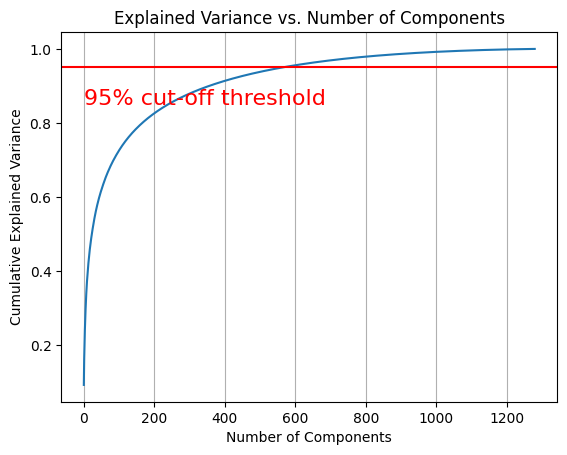

In [86]:
# Optionally perform dimensionality reduction
pca_eNetB0 = PCA()  # Adjust the number of components as needed
pca_eNetB0.fit(features_enetB0)
PlotPCAVariance(pca_eNetB0)

In [87]:
pca = PCA(n_components=500)  # Adjust the number of components as needed
reduced_features = pca.fit_transform(features_enetB0)

For n_clusters=3, the silhouette score is 0.0738719031214714
For n_clusters=4, the silhouette score is 0.0780707597732544
For n_clusters=5, the silhouette score is 0.07981396466493607
For n_clusters=6, the silhouette score is 0.035442620515823364
For n_clusters=7, the silhouette score is 0.03547242656350136
Best number of clusters: 5 with silhouette score: 0.07981396466493607


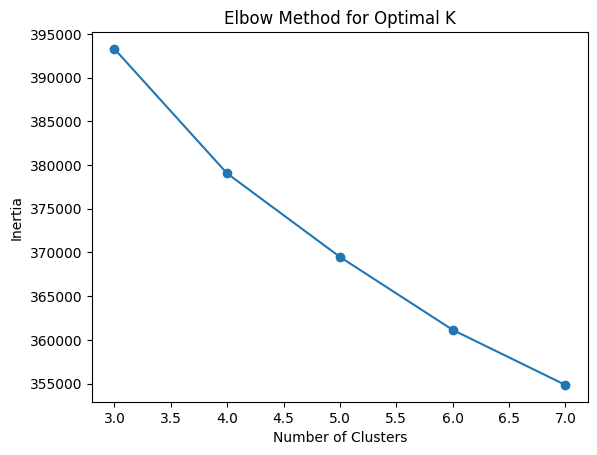

[393283.25, 379038.21875, 369495.1875, 361152.8125, 354853.5]
Optimal number of clusters: 5
Cluster 3: 1196 images
Cluster 4: 777 images
Cluster 5: 595 images
Cluster 1: 502 images
Cluster 2: 599 images


array([2, 3, 4, ..., 1, 2, 2], dtype=int32)

In [88]:
best_n_clusters_enetB0,distortions_enetB0 = find_Keams_Cluster(reduced_features)
PlotElowCurve(distortions_enetB0,best_n_clusters_enetB0)
Get_ClusterItems(reduced_features,best_n_clusters_enetB0)

Cluster 1: 1160 items


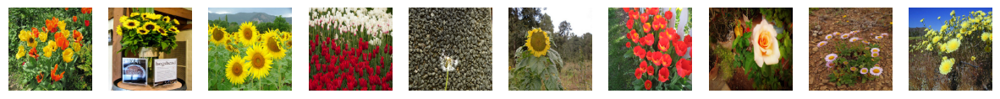


Cluster 3: 578 items


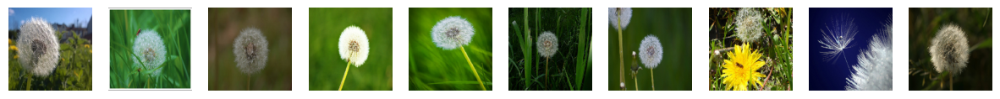


Cluster 4: 597 items


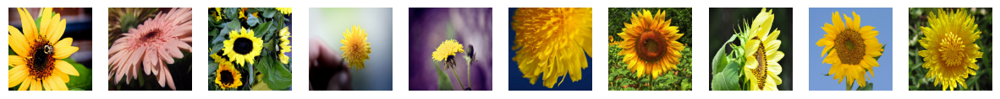


Cluster 0: 967 items


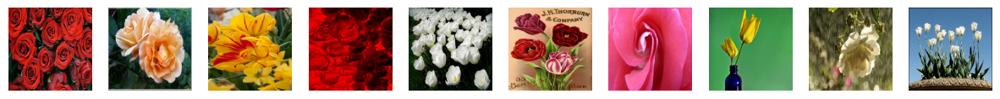


Cluster 2: 367 items


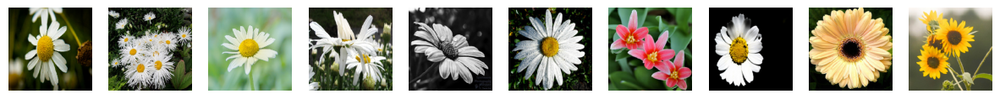

In [89]:
dic_Clusters = cluster_image_mappping(kmeans_clusters)
PlotImages(dic_Clusters)


In [90]:
# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters based on your data
clusters = dbscan.fit_predict(reduced_features)

In [93]:
scaled_features = scaler.fit_transform(reduced_features)
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(scaled_features)

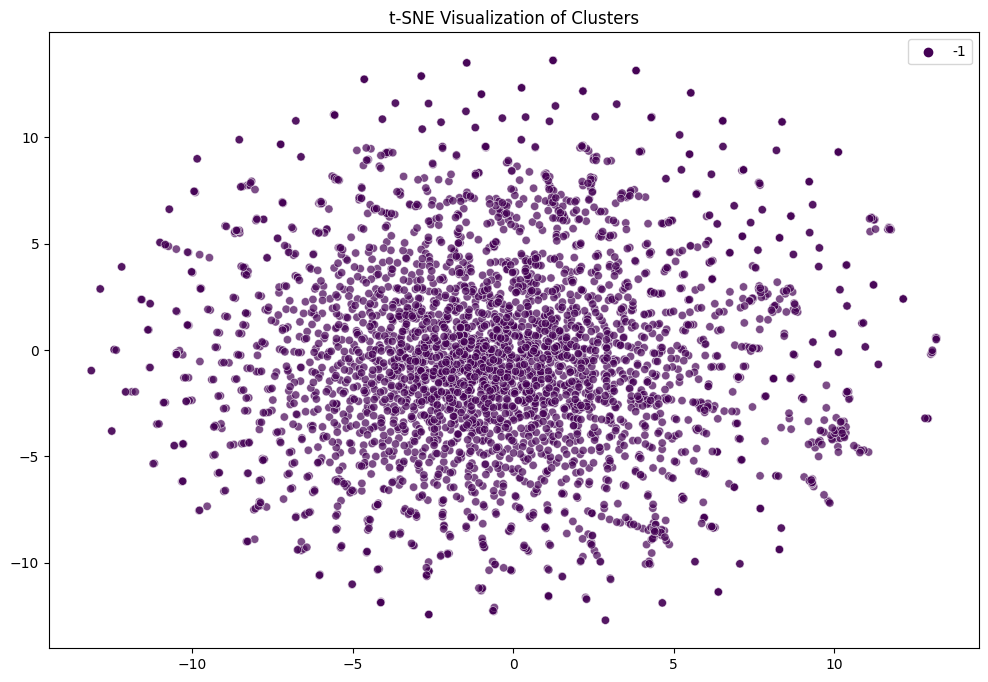

In [94]:
from sklearn.manifold import TSNE
import seaborn as sns
# Apply t-SNE for visualization
tsne = TSNE(n_components=2)
embedded_features = tsne.fit_transform(scaled_features)

# Visualize clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=embedded_features[:, 0], y=embedded_features[:, 1], hue=clusters, palette='viridis', legend='full', alpha=0.7)
plt.title('t-SNE Visualization of Clusters')
plt.show()

# EfficientNetB7



In [12]:
from tensorflow.keras.applications import EfficientNetB7
import seaborn as sns
import tensorflow as tf

# Load EfficientNetB7 pre-trained model
base_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(600, 600, 3))



258076736/258076736 [==============================] - 1s 0us/step


In [13]:
# Function to preprocess and extract features from images
def extract_features_EnetB7(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(600, 600))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    img_array = tf.expand_dims(img_array, 0)  # Add batch dimension
    features = base_model.predict(img_array)
    features = tf.keras.layers.GlobalAveragePooling2D()(features)  # Global Average Pooling
    return features.numpy()

In [14]:
features_array_EnetB7 = []
for img_file in tqdm(image_files, desc="Extracting features"):
    img_path = os.path.join(data_dir, img_file)
    features = extract_features_EnetB7(img_path)
    features_array_EnetB7.append(features)

# Extract features from images
np.save("/content/features_EnetB7.npy", features_array_EnetB7)


Extracting features:   0%|          | 0/3669 [00:00<?, ?it/s]

1/1 [==============================] - 15s 15s/step


Extracting features:   0%|          | 1/3669 [00:14<14:57:55, 14.69s/it]

1/1 [==============================] - 0s 90ms/step


Extracting features:   0%|          | 2/3669 [00:14<6:19:07,  6.20s/it] 

1/1 [==============================] - 0s 96ms/step


Extracting features:   0%|          | 3/3669 [00:15<3:34:24,  3.51s/it]

1/1 [==============================] - 0s 87ms/step


Extracting features:   0%|          | 4/3669 [00:15<2:16:33,  2.24s/it]

1/1 [==============================] - 0s 120ms/step


Extracting features:   0%|          | 5/3669 [00:15<1:34:10,  1.54s/it]

1/1 [==============================] - 0s 97ms/step


Extracting features:   0%|          | 6/3669 [00:16<1:08:06,  1.12s/it]

1/1 [==============================] - 0s 139ms/step


Extracting features:   0%|          | 7/3669 [00:16<52:46,  1.16it/s]  

1/1 [==============================] - 0s 110ms/step


Extracting features:   0%|          | 8/3669 [00:16<40:40,  1.50it/s]

1/1 [==============================] - 0s 131ms/step


Extracting features:   0%|          | 9/3669 [00:16<32:57,  1.85it/s]

1/1 [==============================] - 0s 120ms/step


Extracting features:   0%|          | 10/3669 [00:17<27:34,  2.21it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:   0%|          | 11/3669 [00:17<24:54,  2.45it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   0%|          | 12/3669 [00:17<21:52,  2.79it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:   0%|          | 13/3669 [00:18<19:55,  3.06it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   0%|          | 14/3669 [00:18<17:30,  3.48it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   0%|          | 15/3669 [00:18<15:08,  4.02it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   0%|          | 16/3669 [00:18<14:27,  4.21it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   0%|          | 17/3669 [00:18<13:59,  4.35it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   0%|          | 18/3669 [00:19<13:47,  4.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   1%|          | 19/3669 [00:19<12:30,  4.86it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   1%|          | 20/3669 [00:19<12:37,  4.82it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 21/3669 [00:19<11:41,  5.20it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 22/3669 [00:19<12:02,  5.04it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|          | 23/3669 [00:20<12:24,  4.90it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   1%|          | 24/3669 [00:20<11:34,  5.25it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   1%|          | 25/3669 [00:20<10:57,  5.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|          | 26/3669 [00:20<10:29,  5.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|          | 27/3669 [00:20<10:23,  5.84it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   1%|          | 28/3669 [00:20<10:06,  6.00it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   1%|          | 29/3669 [00:20<09:55,  6.11it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   1%|          | 30/3669 [00:21<09:54,  6.12it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 31/3669 [00:21<09:44,  6.22it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|          | 32/3669 [00:21<10:59,  5.51it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 33/3669 [00:21<10:29,  5.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|          | 34/3669 [00:21<10:07,  5.98it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 35/3669 [00:21<09:56,  6.09it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 36/3669 [00:22<09:55,  6.10it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   1%|          | 37/3669 [00:22<09:46,  6.19it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:   1%|          | 38/3669 [00:22<09:47,  6.18it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   1%|          | 39/3669 [00:22<09:42,  6.23it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   1%|          | 40/3669 [00:22<09:33,  6.32it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   1%|          | 41/3669 [00:22<10:41,  5.66it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   1%|          | 42/3669 [00:23<10:24,  5.81it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   1%|          | 43/3669 [00:23<11:06,  5.44it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|          | 44/3669 [00:23<10:33,  5.73it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   1%|          | 45/3669 [00:23<10:12,  5.92it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|▏         | 46/3669 [00:23<10:59,  5.49it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|▏         | 47/3669 [00:24<10:34,  5.71it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   1%|▏         | 48/3669 [00:24<11:13,  5.38it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|▏         | 49/3669 [00:24<10:42,  5.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|▏         | 50/3669 [00:24<10:23,  5.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|▏         | 51/3669 [00:24<11:05,  5.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   1%|▏         | 52/3669 [00:24<10:32,  5.72it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   1%|▏         | 53/3669 [00:25<10:14,  5.88it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|▏         | 54/3669 [00:25<11:01,  5.47it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   1%|▏         | 55/3669 [00:25<10:29,  5.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   2%|▏         | 56/3669 [00:25<10:06,  5.95it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   2%|▏         | 57/3669 [00:25<10:57,  5.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   2%|▏         | 58/3669 [00:26<11:29,  5.23it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   2%|▏         | 59/3669 [00:26<11:09,  5.39it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   2%|▏         | 60/3669 [00:26<11:41,  5.15it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   2%|▏         | 61/3669 [00:26<11:59,  5.01it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   2%|▏         | 62/3669 [00:26<11:11,  5.37it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   2%|▏         | 63/3669 [00:26<10:38,  5.65it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   2%|▏         | 64/3669 [00:27<10:23,  5.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   2%|▏         | 65/3669 [00:27<10:05,  5.96it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   2%|▏         | 66/3669 [00:27<09:52,  6.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   2%|▏         | 67/3669 [00:27<10:46,  5.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   2%|▏         | 68/3669 [00:27<10:24,  5.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   2%|▏         | 69/3669 [00:28<11:06,  5.40it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   2%|▏         | 70/3669 [00:28<10:41,  5.61it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   2%|▏         | 71/3669 [00:28<10:56,  5.48it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   2%|▏         | 72/3669 [00:28<12:03,  4.97it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   2%|▏         | 73/3669 [00:28<12:47,  4.68it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   2%|▏         | 74/3669 [00:29<13:27,  4.45it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   2%|▏         | 75/3669 [00:29<13:04,  4.58it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:   2%|▏         | 76/3669 [00:29<13:28,  4.44it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:   2%|▏         | 77/3669 [00:29<13:00,  4.60it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   2%|▏         | 78/3669 [00:29<13:34,  4.41it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   2%|▏         | 79/3669 [00:30<13:08,  4.56it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   2%|▏         | 80/3669 [00:30<12:43,  4.70it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   2%|▏         | 81/3669 [00:30<13:18,  4.49it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   2%|▏         | 82/3669 [00:30<13:51,  4.31it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   2%|▏         | 83/3669 [00:31<14:12,  4.20it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:   2%|▏         | 84/3669 [00:31<13:38,  4.38it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   2%|▏         | 85/3669 [00:31<13:58,  4.28it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   2%|▏         | 86/3669 [00:31<14:20,  4.16it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   2%|▏         | 87/3669 [00:32<13:34,  4.40it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   2%|▏         | 88/3669 [00:32<12:55,  4.62it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   2%|▏         | 89/3669 [00:32<12:24,  4.81it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   2%|▏         | 90/3669 [00:32<12:00,  4.97it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   2%|▏         | 91/3669 [00:32<11:44,  5.08it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   3%|▎         | 92/3669 [00:33<12:35,  4.74it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:   3%|▎         | 93/3669 [00:33<12:12,  4.88it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:   3%|▎         | 94/3669 [00:33<12:11,  4.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   3%|▎         | 95/3669 [00:33<12:26,  4.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   3%|▎         | 96/3669 [00:33<11:25,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   3%|▎         | 97/3669 [00:33<10:44,  5.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 98/3669 [00:34<11:22,  5.24it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 99/3669 [00:34<10:39,  5.58it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   3%|▎         | 100/3669 [00:34<11:21,  5.23it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 101/3669 [00:34<10:45,  5.53it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 102/3669 [00:34<11:26,  5.20it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 103/3669 [00:35<11:56,  4.98it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   3%|▎         | 104/3669 [00:35<12:05,  4.92it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   3%|▎         | 105/3669 [00:35<11:22,  5.22it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   3%|▎         | 106/3669 [00:35<11:43,  5.06it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   3%|▎         | 107/3669 [00:35<10:59,  5.40it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   3%|▎         | 108/3669 [00:36<11:28,  5.17it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 109/3669 [00:36<10:47,  5.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 110/3669 [00:36<10:23,  5.71it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   3%|▎         | 111/3669 [00:36<10:03,  5.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   3%|▎         | 112/3669 [00:36<09:48,  6.04it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   3%|▎         | 113/3669 [00:36<09:38,  6.15it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   3%|▎         | 114/3669 [00:37<09:34,  6.19it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   3%|▎         | 115/3669 [00:37<09:27,  6.26it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 116/3669 [00:37<09:22,  6.32it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:   3%|▎         | 117/3669 [00:37<09:26,  6.27it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 118/3669 [00:37<10:22,  5.70it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   3%|▎         | 119/3669 [00:37<11:00,  5.38it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 120/3669 [00:38<10:29,  5.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 121/3669 [00:38<10:11,  5.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   3%|▎         | 122/3669 [00:38<11:06,  5.32it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 123/3669 [00:38<15:15,  3.87it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   3%|▎         | 124/3669 [00:39<14:30,  4.07it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 125/3669 [00:39<13:59,  4.22it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:   3%|▎         | 126/3669 [00:39<12:36,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 127/3669 [00:39<12:36,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   3%|▎         | 128/3669 [00:39<11:36,  5.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   4%|▎         | 129/3669 [00:40<11:56,  4.94it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   4%|▎         | 130/3669 [00:40<12:17,  4.80it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   4%|▎         | 131/3669 [00:40<12:29,  4.72it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   4%|▎         | 132/3669 [00:40<11:36,  5.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   4%|▎         | 133/3669 [00:40<11:56,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   4%|▎         | 134/3669 [00:41<12:10,  4.84it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   4%|▎         | 135/3669 [00:41<11:17,  5.21it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   4%|▎         | 136/3669 [00:41<11:43,  5.02it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   4%|▎         | 137/3669 [00:41<12:01,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   4%|▍         | 138/3669 [00:41<12:10,  4.83it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   4%|▍         | 139/3669 [00:42<12:27,  4.73it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   4%|▍         | 140/3669 [00:42<11:31,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   4%|▍         | 141/3669 [00:42<10:50,  5.42it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   4%|▍         | 142/3669 [00:42<11:31,  5.10it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   4%|▍         | 143/3669 [00:42<10:52,  5.40it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   4%|▍         | 144/3669 [00:43<10:25,  5.64it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   4%|▍         | 145/3669 [00:43<10:07,  5.80it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   4%|▍         | 146/3669 [00:43<09:48,  5.99it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   4%|▍         | 147/3669 [00:43<09:51,  5.95it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   4%|▍         | 148/3669 [00:43<11:36,  5.05it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   4%|▍         | 149/3669 [00:44<12:34,  4.67it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   4%|▍         | 150/3669 [00:44<12:18,  4.76it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   4%|▍         | 151/3669 [00:44<12:57,  4.52it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   4%|▍         | 152/3669 [00:44<12:30,  4.69it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   4%|▍         | 153/3669 [00:44<12:56,  4.53it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   4%|▍         | 154/3669 [00:45<13:19,  4.40it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   4%|▍         | 155/3669 [00:45<13:46,  4.25it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   4%|▍         | 156/3669 [00:45<13:01,  4.50it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   4%|▍         | 157/3669 [00:45<12:43,  4.60it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   4%|▍         | 158/3669 [00:46<13:09,  4.45it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   4%|▍         | 159/3669 [00:46<13:33,  4.31it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   4%|▍         | 160/3669 [00:46<13:53,  4.21it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   4%|▍         | 161/3669 [00:46<14:00,  4.17it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   4%|▍         | 162/3669 [00:47<14:03,  4.16it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   4%|▍         | 163/3669 [00:47<14:09,  4.13it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   4%|▍         | 164/3669 [00:47<14:17,  4.09it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   4%|▍         | 165/3669 [00:47<14:24,  4.05it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:   5%|▍         | 166/3669 [00:47<13:42,  4.26it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:   5%|▍         | 167/3669 [00:48<13:00,  4.49it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   5%|▍         | 168/3669 [00:48<12:26,  4.69it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   5%|▍         | 169/3669 [00:48<11:59,  4.86it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   5%|▍         | 170/3669 [00:48<12:38,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▍         | 171/3669 [00:48<11:34,  5.04it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▍         | 172/3669 [00:49<10:50,  5.37it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▍         | 173/3669 [00:49<10:16,  5.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▍         | 174/3669 [00:49<10:57,  5.31it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▍         | 175/3669 [00:49<11:32,  5.04it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   5%|▍         | 176/3669 [00:49<11:55,  4.88it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▍         | 177/3669 [00:50<11:05,  5.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▍         | 178/3669 [00:50<10:33,  5.51it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:   5%|▍         | 179/3669 [00:50<11:07,  5.23it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▍         | 180/3669 [00:50<10:33,  5.51it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   5%|▍         | 181/3669 [00:50<11:05,  5.24it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▍         | 182/3669 [00:51<11:31,  5.05it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▍         | 183/3669 [00:51<10:49,  5.36it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▌         | 184/3669 [00:51<11:27,  5.07it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   5%|▌         | 185/3669 [00:51<10:46,  5.39it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   5%|▌         | 186/3669 [00:51<11:16,  5.15it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:   5%|▌         | 187/3669 [00:51<11:38,  4.99it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   5%|▌         | 188/3669 [00:52<10:59,  5.28it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   5%|▌         | 189/3669 [00:52<10:26,  5.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▌         | 190/3669 [00:52<10:05,  5.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   5%|▌         | 191/3669 [00:52<09:46,  5.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▌         | 192/3669 [00:52<10:35,  5.47it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   5%|▌         | 193/3669 [00:53<11:15,  5.15it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   5%|▌         | 194/3669 [00:53<10:35,  5.47it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   5%|▌         | 195/3669 [00:53<11:06,  5.21it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   5%|▌         | 196/3669 [00:53<10:32,  5.49it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   5%|▌         | 197/3669 [00:53<10:07,  5.72it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   5%|▌         | 198/3669 [00:53<10:00,  5.78it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   5%|▌         | 199/3669 [00:54<09:43,  5.95it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▌         | 200/3669 [00:54<09:32,  6.06it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   5%|▌         | 201/3669 [00:54<09:25,  6.13it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   6%|▌         | 202/3669 [00:54<10:30,  5.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   6%|▌         | 203/3669 [00:54<10:05,  5.73it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   6%|▌         | 204/3669 [00:54<09:53,  5.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 205/3669 [00:55<10:37,  5.43it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   6%|▌         | 206/3669 [00:55<11:06,  5.20it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 207/3669 [00:55<11:25,  5.05it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   6%|▌         | 208/3669 [00:55<10:40,  5.40it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 209/3669 [00:55<11:12,  5.14it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:   6%|▌         | 210/3669 [00:56<10:53,  5.29it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 211/3669 [00:56<11:23,  5.06it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   6%|▌         | 212/3669 [00:56<10:39,  5.40it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   6%|▌         | 213/3669 [00:56<10:16,  5.60it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   6%|▌         | 214/3669 [00:56<09:54,  5.81it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:   6%|▌         | 215/3669 [00:56<09:47,  5.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   6%|▌         | 216/3669 [00:57<09:31,  6.04it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 217/3669 [00:57<10:17,  5.59it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   6%|▌         | 218/3669 [00:57<10:52,  5.29it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   6%|▌         | 219/3669 [00:57<11:16,  5.10it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:   6%|▌         | 220/3669 [00:57<10:42,  5.37it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 221/3669 [00:58<11:12,  5.12it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 222/3669 [00:58<10:32,  5.45it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   6%|▌         | 223/3669 [00:58<10:05,  5.69it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   6%|▌         | 224/3669 [00:58<09:44,  5.89it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   6%|▌         | 225/3669 [00:58<09:32,  6.01it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   6%|▌         | 226/3669 [00:58<09:58,  5.75it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   6%|▌         | 227/3669 [00:59<11:18,  5.07it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   6%|▌         | 228/3669 [00:59<11:16,  5.08it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   6%|▌         | 229/3669 [00:59<11:14,  5.10it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   6%|▋         | 230/3669 [00:59<11:04,  5.18it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   6%|▋         | 231/3669 [00:59<11:01,  5.19it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   6%|▋         | 232/3669 [01:00<10:52,  5.26it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   6%|▋         | 233/3669 [01:00<10:46,  5.31it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   6%|▋         | 234/3669 [01:00<10:39,  5.37it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   6%|▋         | 235/3669 [01:00<10:40,  5.37it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   6%|▋         | 236/3669 [01:00<11:48,  4.84it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:   6%|▋         | 237/3669 [01:01<12:54,  4.43it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   6%|▋         | 238/3669 [01:01<13:24,  4.27it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   7%|▋         | 239/3669 [01:01<13:39,  4.19it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   7%|▋         | 240/3669 [01:02<13:52,  4.12it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:   7%|▋         | 241/3669 [01:02<13:22,  4.27it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:   7%|▋         | 242/3669 [01:02<12:42,  4.49it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   7%|▋         | 243/3669 [01:02<12:04,  4.73it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:   7%|▋         | 244/3669 [01:02<11:41,  4.89it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:   7%|▋         | 245/3669 [01:02<11:29,  4.97it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:   7%|▋         | 246/3669 [01:03<11:32,  4.94it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   7%|▋         | 247/3669 [01:03<12:22,  4.61it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   7%|▋         | 248/3669 [01:03<12:44,  4.47it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   7%|▋         | 249/3669 [01:03<13:02,  4.37it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:   7%|▋         | 250/3669 [01:04<13:21,  4.27it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   7%|▋         | 251/3669 [01:04<12:30,  4.55it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   7%|▋         | 252/3669 [01:04<11:26,  4.98it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   7%|▋         | 253/3669 [01:04<11:41,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   7%|▋         | 254/3669 [01:04<10:52,  5.23it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   7%|▋         | 255/3669 [01:05<11:22,  5.01it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:   7%|▋         | 256/3669 [01:05<11:46,  4.83it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   7%|▋         | 257/3669 [01:05<11:58,  4.75it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   7%|▋         | 258/3669 [01:05<12:02,  4.72it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   7%|▋         | 259/3669 [01:05<11:11,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   7%|▋         | 260/3669 [01:06<10:31,  5.40it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   7%|▋         | 261/3669 [01:06<10:07,  5.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   7%|▋         | 262/3669 [01:06<10:49,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   7%|▋         | 263/3669 [01:06<11:16,  5.04it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   7%|▋         | 264/3669 [01:06<11:39,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   7%|▋         | 265/3669 [01:07<11:48,  4.80it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   7%|▋         | 266/3669 [01:07<11:59,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   7%|▋         | 267/3669 [01:07<11:08,  5.09it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   7%|▋         | 268/3669 [01:07<10:26,  5.43it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   7%|▋         | 269/3669 [01:07<10:04,  5.62it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   7%|▋         | 270/3669 [01:08<10:52,  5.21it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   7%|▋         | 271/3669 [01:08<10:25,  5.43it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:   7%|▋         | 272/3669 [01:08<10:13,  5.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   7%|▋         | 273/3669 [01:08<10:57,  5.16it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   7%|▋         | 274/3669 [01:08<11:19,  5.00it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:   7%|▋         | 275/3669 [01:08<10:44,  5.27it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 276/3669 [01:09<10:09,  5.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 277/3669 [01:09<10:46,  5.24it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 278/3669 [01:09<10:11,  5.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   8%|▊         | 279/3669 [01:09<09:49,  5.75it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 280/3669 [01:09<09:32,  5.92it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   8%|▊         | 281/3669 [01:09<09:22,  6.02it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   8%|▊         | 282/3669 [01:10<10:18,  5.48it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:   8%|▊         | 283/3669 [01:10<10:49,  5.21it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 284/3669 [01:10<10:15,  5.50it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 285/3669 [01:10<09:51,  5.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 286/3669 [01:10<09:36,  5.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 287/3669 [01:11<09:27,  5.96it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 288/3669 [01:11<10:14,  5.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 289/3669 [01:11<10:48,  5.22it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 290/3669 [01:11<11:10,  5.04it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   8%|▊         | 291/3669 [01:11<10:35,  5.31it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   8%|▊         | 292/3669 [01:12<10:04,  5.59it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 293/3669 [01:12<10:44,  5.24it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   8%|▊         | 294/3669 [01:12<11:16,  4.99it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:   8%|▊         | 295/3669 [01:12<10:45,  5.23it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   8%|▊         | 296/3669 [01:12<10:11,  5.52it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   8%|▊         | 297/3669 [01:13<10:48,  5.20it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 298/3669 [01:13<10:16,  5.47it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 299/3669 [01:13<10:49,  5.19it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   8%|▊         | 300/3669 [01:13<10:25,  5.39it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 301/3669 [01:13<11:01,  5.09it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   8%|▊         | 302/3669 [01:13<10:22,  5.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   8%|▊         | 303/3669 [01:14<09:59,  5.61it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   8%|▊         | 304/3669 [01:14<10:35,  5.29it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   8%|▊         | 305/3669 [01:14<10:35,  5.29it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   8%|▊         | 306/3669 [01:14<10:41,  5.24it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   8%|▊         | 307/3669 [01:14<11:33,  4.85it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   8%|▊         | 308/3669 [01:15<12:16,  4.56it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   8%|▊         | 309/3669 [01:15<12:53,  4.34it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   8%|▊         | 310/3669 [01:15<13:36,  4.11it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:   8%|▊         | 311/3669 [01:15<12:50,  4.36it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:   9%|▊         | 312/3669 [01:16<12:08,  4.61it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:   9%|▊         | 313/3669 [01:16<11:44,  4.77it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   9%|▊         | 314/3669 [01:16<11:26,  4.88it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   9%|▊         | 315/3669 [01:16<11:11,  5.00it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:   9%|▊         | 316/3669 [01:16<11:00,  5.08it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:   9%|▊         | 317/3669 [01:17<12:02,  4.64it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   9%|▊         | 318/3669 [01:17<11:35,  4.81it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   9%|▊         | 319/3669 [01:17<12:19,  4.53it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   9%|▊         | 320/3669 [01:17<12:02,  4.64it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:   9%|▊         | 321/3669 [01:17<11:36,  4.80it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   9%|▉         | 322/3669 [01:18<12:13,  4.57it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   9%|▉         | 323/3669 [01:18<11:42,  4.76it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   9%|▉         | 324/3669 [01:18<11:21,  4.91it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:   9%|▉         | 325/3669 [01:18<11:09,  4.99it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   9%|▉         | 326/3669 [01:19<11:56,  4.66it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   9%|▉         | 327/3669 [01:19<12:31,  4.45it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:   9%|▉         | 328/3669 [01:19<13:05,  4.25it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:   9%|▉         | 329/3669 [01:19<12:32,  4.44it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   9%|▉         | 330/3669 [01:19<11:43,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 331/3669 [01:20<10:49,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   9%|▉         | 332/3669 [01:20<10:14,  5.43it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 333/3669 [01:20<10:52,  5.11it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   9%|▉         | 334/3669 [01:20<10:16,  5.41it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 335/3669 [01:20<10:48,  5.14it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   9%|▉         | 336/3669 [01:20<10:16,  5.41it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:   9%|▉         | 337/3669 [01:21<09:55,  5.60it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:   9%|▉         | 338/3669 [01:21<09:46,  5.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 339/3669 [01:21<10:22,  5.35it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   9%|▉         | 340/3669 [01:21<10:47,  5.14it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 341/3669 [01:21<10:25,  5.32it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 342/3669 [01:22<10:02,  5.52it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   9%|▉         | 343/3669 [01:22<10:39,  5.20it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:   9%|▉         | 344/3669 [01:22<10:09,  5.46it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:   9%|▉         | 345/3669 [01:22<09:54,  5.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:   9%|▉         | 346/3669 [01:22<10:36,  5.22it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:   9%|▉         | 347/3669 [01:23<10:05,  5.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:   9%|▉         | 348/3669 [01:23<10:43,  5.16it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|▉         | 349/3669 [01:23<10:06,  5.47it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|▉         | 350/3669 [01:23<10:36,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|▉         | 351/3669 [01:23<10:58,  5.04it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|▉         | 352/3669 [01:24<11:19,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|▉         | 353/3669 [01:24<11:27,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|▉         | 354/3669 [01:24<11:37,  4.75it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|▉         | 355/3669 [01:24<10:47,  5.12it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  10%|▉         | 356/3669 [01:24<11:05,  4.98it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  10%|▉         | 357/3669 [01:25<11:22,  4.85it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  10%|▉         | 358/3669 [01:25<11:31,  4.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|▉         | 359/3669 [01:25<11:32,  4.78it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  10%|▉         | 360/3669 [01:25<11:38,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|▉         | 361/3669 [01:25<11:45,  4.69it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  10%|▉         | 362/3669 [01:26<11:50,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|▉         | 363/3669 [01:26<11:53,  4.63it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|▉         | 364/3669 [01:26<11:04,  4.98it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  10%|▉         | 365/3669 [01:26<10:25,  5.29it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|▉         | 366/3669 [01:26<09:58,  5.52it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|█         | 367/3669 [01:27<10:37,  5.18it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|█         | 368/3669 [01:27<10:58,  5.01it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|█         | 369/3669 [01:27<11:14,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|█         | 370/3669 [01:27<11:23,  4.82it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|█         | 371/3669 [01:27<11:30,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|█         | 372/3669 [01:28<11:36,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|█         | 373/3669 [01:28<10:49,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|█         | 374/3669 [01:28<10:10,  5.40it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|█         | 375/3669 [01:28<09:41,  5.67it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  10%|█         | 376/3669 [01:28<10:23,  5.28it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  10%|█         | 377/3669 [01:29<10:12,  5.37it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|█         | 378/3669 [01:29<09:47,  5.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  10%|█         | 379/3669 [01:29<09:26,  5.81it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|█         | 380/3669 [01:29<09:17,  5.90it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  10%|█         | 381/3669 [01:29<09:05,  6.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  10%|█         | 382/3669 [01:29<09:02,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  10%|█         | 383/3669 [01:30<09:46,  5.60it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  10%|█         | 384/3669 [01:30<10:56,  5.00it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  10%|█         | 385/3669 [01:30<11:42,  4.68it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  11%|█         | 386/3669 [01:30<11:29,  4.76it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  11%|█         | 387/3669 [01:30<12:11,  4.48it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  11%|█         | 388/3669 [01:31<12:30,  4.37it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  11%|█         | 389/3669 [01:31<12:52,  4.25it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  11%|█         | 390/3669 [01:31<13:06,  4.17it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  11%|█         | 391/3669 [01:31<13:31,  4.04it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  11%|█         | 392/3669 [01:32<13:28,  4.05it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  11%|█         | 393/3669 [01:32<12:48,  4.27it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  11%|█         | 394/3669 [01:32<13:05,  4.17it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  11%|█         | 395/3669 [01:32<13:24,  4.07it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  11%|█         | 396/3669 [01:33<12:48,  4.26it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  11%|█         | 397/3669 [01:33<12:14,  4.45it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  11%|█         | 398/3669 [01:33<11:37,  4.69it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  11%|█         | 399/3669 [01:33<11:25,  4.77it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  11%|█         | 400/3669 [01:33<11:38,  4.68it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  11%|█         | 401/3669 [01:34<11:36,  4.69it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  11%|█         | 402/3669 [01:34<12:05,  4.50it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  11%|█         | 403/3669 [01:34<12:27,  4.37it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  11%|█         | 404/3669 [01:34<12:46,  4.26it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  11%|█         | 405/3669 [01:35<13:01,  4.18it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  11%|█         | 406/3669 [01:35<12:36,  4.32it/s]

1/1 [==============================] - 0s 211ms/step


Extracting features:  11%|█         | 407/3669 [01:35<15:49,  3.44it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  11%|█         | 408/3669 [01:36<17:13,  3.16it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  11%|█         | 409/3669 [01:36<15:50,  3.43it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  11%|█         | 410/3669 [01:36<13:40,  3.97it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  11%|█         | 411/3669 [01:36<13:00,  4.17it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  11%|█         | 412/3669 [01:36<11:43,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  11%|█▏        | 413/3669 [01:37<10:49,  5.01it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  11%|█▏        | 414/3669 [01:37<11:09,  4.86it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  11%|█▏        | 415/3669 [01:37<11:17,  4.81it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  11%|█▏        | 416/3669 [01:37<11:21,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  11%|█▏        | 417/3669 [01:37<10:32,  5.15it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  11%|█▏        | 418/3669 [01:38<10:03,  5.39it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  11%|█▏        | 419/3669 [01:38<10:32,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  11%|█▏        | 420/3669 [01:38<09:59,  5.42it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  11%|█▏        | 421/3669 [01:38<09:35,  5.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 422/3669 [01:38<09:16,  5.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 423/3669 [01:39<09:59,  5.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 424/3669 [01:39<09:40,  5.59it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 425/3669 [01:39<09:29,  5.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 426/3669 [01:39<10:17,  5.25it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 427/3669 [01:39<09:53,  5.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 428/3669 [01:39<10:20,  5.22it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 429/3669 [01:40<09:53,  5.46it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 430/3669 [01:40<09:31,  5.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 431/3669 [01:40<09:22,  5.76it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 432/3669 [01:40<10:06,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 433/3669 [01:40<09:41,  5.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 434/3669 [01:40<09:22,  5.75it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  12%|█▏        | 435/3669 [01:41<09:17,  5.80it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  12%|█▏        | 436/3669 [01:41<09:07,  5.91it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 437/3669 [01:41<09:00,  5.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 438/3669 [01:41<08:49,  6.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 439/3669 [01:41<09:36,  5.60it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  12%|█▏        | 440/3669 [01:42<09:22,  5.74it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  12%|█▏        | 441/3669 [01:42<09:11,  5.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 442/3669 [01:42<09:55,  5.42it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  12%|█▏        | 443/3669 [01:42<09:31,  5.65it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 444/3669 [01:42<09:20,  5.75it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 445/3669 [01:42<09:59,  5.38it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 446/3669 [01:43<10:24,  5.16it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 447/3669 [01:43<09:55,  5.42it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  12%|█▏        | 448/3669 [01:43<10:37,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 449/3669 [01:43<10:04,  5.33it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  12%|█▏        | 450/3669 [01:43<10:34,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 451/3669 [01:44<09:57,  5.39it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  12%|█▏        | 452/3669 [01:44<10:28,  5.12it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  12%|█▏        | 453/3669 [01:44<10:04,  5.32it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 454/3669 [01:44<09:33,  5.61it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  12%|█▏        | 455/3669 [01:44<10:11,  5.25it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  12%|█▏        | 456/3669 [01:45<10:35,  5.06it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  12%|█▏        | 457/3669 [01:45<10:53,  4.92it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  12%|█▏        | 458/3669 [01:45<10:48,  4.95it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  13%|█▎        | 459/3669 [01:45<11:35,  4.62it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 460/3669 [01:45<12:08,  4.40it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  13%|█▎        | 461/3669 [01:46<11:49,  4.52it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  13%|█▎        | 462/3669 [01:46<12:31,  4.27it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  13%|█▎        | 463/3669 [01:46<12:45,  4.19it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 464/3669 [01:46<12:03,  4.43it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 465/3669 [01:47<11:37,  4.59it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  13%|█▎        | 466/3669 [01:47<12:07,  4.40it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  13%|█▎        | 467/3669 [01:47<11:50,  4.51it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 468/3669 [01:47<12:28,  4.27it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  13%|█▎        | 469/3669 [01:48<11:58,  4.45it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 470/3669 [01:48<12:16,  4.34it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  13%|█▎        | 471/3669 [01:48<11:41,  4.56it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 472/3669 [01:48<11:28,  4.64it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 473/3669 [01:48<11:00,  4.84it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  13%|█▎        | 474/3669 [01:49<10:49,  4.92it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  13%|█▎        | 475/3669 [01:49<11:32,  4.61it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  13%|█▎        | 476/3669 [01:49<11:57,  4.45it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  13%|█▎        | 477/3669 [01:49<11:26,  4.65it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  13%|█▎        | 478/3669 [01:49<11:52,  4.48it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  13%|█▎        | 479/3669 [01:50<11:22,  4.67it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  13%|█▎        | 480/3669 [01:50<11:57,  4.44it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  13%|█▎        | 481/3669 [01:50<12:27,  4.26it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  13%|█▎        | 482/3669 [01:50<12:23,  4.29it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  13%|█▎        | 483/3669 [01:51<11:12,  4.74it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  13%|█▎        | 484/3669 [01:51<11:12,  4.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  13%|█▎        | 485/3669 [01:51<10:24,  5.10it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  13%|█▎        | 486/3669 [01:51<10:42,  4.96it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  13%|█▎        | 487/3669 [01:51<10:05,  5.26it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  13%|█▎        | 488/3669 [01:52<10:26,  5.08it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  13%|█▎        | 489/3669 [01:52<09:57,  5.33it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  13%|█▎        | 490/3669 [01:52<09:31,  5.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  13%|█▎        | 491/3669 [01:52<10:05,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  13%|█▎        | 492/3669 [01:52<09:41,  5.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  13%|█▎        | 493/3669 [01:52<10:13,  5.18it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  13%|█▎        | 494/3669 [01:53<10:35,  5.00it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  13%|█▎        | 495/3669 [01:53<09:57,  5.32it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▎        | 496/3669 [01:53<10:24,  5.08it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  14%|█▎        | 497/3669 [01:53<10:51,  4.87it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  14%|█▎        | 498/3669 [01:53<10:09,  5.20it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▎        | 499/3669 [01:54<10:36,  4.98it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▎        | 500/3669 [01:54<10:52,  4.86it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  14%|█▎        | 501/3669 [01:54<10:11,  5.18it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▎        | 502/3669 [01:54<09:48,  5.38it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  14%|█▎        | 503/3669 [01:54<09:25,  5.60it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  14%|█▎        | 504/3669 [01:55<09:10,  5.75it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  14%|█▍        | 505/3669 [01:55<09:53,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 506/3669 [01:55<10:24,  5.06it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  14%|█▍        | 507/3669 [01:55<10:47,  4.88it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 508/3669 [01:55<10:08,  5.20it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  14%|█▍        | 509/3669 [01:55<09:34,  5.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 510/3669 [01:56<10:06,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 511/3669 [01:56<10:28,  5.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 512/3669 [01:56<09:52,  5.33it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  14%|█▍        | 513/3669 [01:56<09:34,  5.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 514/3669 [01:56<09:13,  5.70it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  14%|█▍        | 515/3669 [01:57<09:49,  5.35it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 516/3669 [01:57<10:17,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 517/3669 [01:57<09:51,  5.33it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 518/3669 [01:57<09:24,  5.58it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 519/3669 [01:57<09:09,  5.73it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  14%|█▍        | 520/3669 [01:57<08:54,  5.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 521/3669 [01:58<09:40,  5.42it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  14%|█▍        | 522/3669 [01:58<10:11,  5.15it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  14%|█▍        | 523/3669 [01:58<10:31,  4.98it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 524/3669 [01:58<10:49,  4.84it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 525/3669 [01:59<10:54,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 526/3669 [01:59<11:02,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 527/3669 [01:59<11:01,  4.75it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  14%|█▍        | 528/3669 [01:59<11:07,  4.71it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  14%|█▍        | 529/3669 [01:59<10:18,  5.07it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  14%|█▍        | 530/3669 [02:00<09:45,  5.36it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  14%|█▍        | 531/3669 [02:00<09:21,  5.59it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  14%|█▍        | 532/3669 [02:00<09:53,  5.28it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  15%|█▍        | 533/3669 [02:00<09:30,  5.50it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  15%|█▍        | 534/3669 [02:00<10:00,  5.22it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  15%|█▍        | 535/3669 [02:00<10:06,  5.17it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  15%|█▍        | 536/3669 [02:01<10:53,  4.80it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  15%|█▍        | 537/3669 [02:01<11:34,  4.51it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  15%|█▍        | 538/3669 [02:01<11:56,  4.37it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  15%|█▍        | 539/3669 [02:01<11:30,  4.53it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  15%|█▍        | 540/3669 [02:02<11:03,  4.72it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  15%|█▍        | 541/3669 [02:02<10:56,  4.76it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  15%|█▍        | 542/3669 [02:02<10:47,  4.83it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  15%|█▍        | 543/3669 [02:02<11:22,  4.58it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  15%|█▍        | 544/3669 [02:02<11:23,  4.58it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  15%|█▍        | 545/3669 [02:03<11:43,  4.44it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  15%|█▍        | 546/3669 [02:03<12:11,  4.27it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  15%|█▍        | 547/3669 [02:03<12:30,  4.16it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  15%|█▍        | 548/3669 [02:03<12:01,  4.32it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  15%|█▍        | 549/3669 [02:04<12:17,  4.23it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  15%|█▍        | 550/3669 [02:04<12:27,  4.17it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  15%|█▌        | 551/3669 [02:04<12:34,  4.13it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  15%|█▌        | 552/3669 [02:04<12:39,  4.11it/s]

1/1 [==============================] - 0s 100ms/step


Extracting features:  15%|█▌        | 553/3669 [02:05<12:27,  4.17it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  15%|█▌        | 554/3669 [02:05<12:47,  4.06it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  15%|█▌        | 555/3669 [02:05<12:09,  4.27it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  15%|█▌        | 556/3669 [02:05<12:26,  4.17it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  15%|█▌        | 557/3669 [02:06<12:42,  4.08it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  15%|█▌        | 558/3669 [02:06<12:56,  4.01it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  15%|█▌        | 559/3669 [02:06<11:39,  4.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  15%|█▌        | 560/3669 [02:06<11:32,  4.49it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  15%|█▌        | 561/3669 [02:07<11:28,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  15%|█▌        | 562/3669 [02:07<11:28,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  15%|█▌        | 563/3669 [02:07<11:23,  4.54it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  15%|█▌        | 564/3669 [02:07<11:20,  4.56it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  15%|█▌        | 565/3669 [02:07<11:16,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  15%|█▌        | 566/3669 [02:08<11:16,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  15%|█▌        | 567/3669 [02:08<10:27,  4.95it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  15%|█▌        | 568/3669 [02:08<09:45,  5.30it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 569/3669 [02:08<10:10,  5.08it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  16%|█▌        | 570/3669 [02:08<09:37,  5.36it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  16%|█▌        | 571/3669 [02:08<09:22,  5.51it/s]

1/1 [==============================] - 0s 134ms/step


Extracting features:  16%|█▌        | 572/3669 [02:09<10:18,  5.01it/s]

1/1 [==============================] - 0s 180ms/step


Extracting features:  16%|█▌        | 573/3669 [02:09<14:38,  3.52it/s]

1/1 [==============================] - 0s 143ms/step


Extracting features:  16%|█▌        | 574/3669 [02:10<14:55,  3.45it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 575/3669 [02:10<13:50,  3.73it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  16%|█▌        | 576/3669 [02:10<13:05,  3.94it/s]

1/1 [==============================] - 0s 160ms/step


Extracting features:  16%|█▌        | 577/3669 [02:10<16:02,  3.21it/s]

1/1 [==============================] - 0s 136ms/step


Extracting features:  16%|█▌        | 578/3669 [02:11<17:11,  3.00it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  16%|█▌        | 579/3669 [02:11<14:28,  3.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 580/3669 [02:11<12:41,  4.06it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 581/3669 [02:11<11:17,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▌        | 582/3669 [02:11<11:14,  4.58it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  16%|█▌        | 583/3669 [02:12<11:09,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 584/3669 [02:12<10:19,  4.98it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 585/3669 [02:12<10:34,  4.86it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 586/3669 [02:12<09:50,  5.22it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  16%|█▌        | 587/3669 [02:12<09:19,  5.50it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  16%|█▌        | 588/3669 [02:13<09:58,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▌        | 589/3669 [02:13<10:22,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▌        | 590/3669 [02:13<09:45,  5.26it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▌        | 591/3669 [02:13<10:06,  5.07it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▌        | 592/3669 [02:13<10:21,  4.95it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  16%|█▌        | 593/3669 [02:14<10:38,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▌        | 594/3669 [02:14<10:50,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▌        | 595/3669 [02:14<10:05,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  16%|█▌        | 596/3669 [02:14<10:21,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▋        | 597/3669 [02:14<09:47,  5.23it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  16%|█▋        | 598/3669 [02:15<10:13,  5.01it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  16%|█▋        | 599/3669 [02:15<09:44,  5.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▋        | 600/3669 [02:15<09:14,  5.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▋        | 601/3669 [02:15<09:43,  5.26it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▋        | 602/3669 [02:15<09:17,  5.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  16%|█▋        | 603/3669 [02:16<09:48,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  16%|█▋        | 604/3669 [02:16<10:08,  5.04it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  16%|█▋        | 605/3669 [02:16<09:59,  5.11it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  17%|█▋        | 606/3669 [02:16<11:02,  4.62it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  17%|█▋        | 607/3669 [02:16<10:47,  4.73it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  17%|█▋        | 608/3669 [02:17<10:36,  4.81it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  17%|█▋        | 609/3669 [02:17<10:27,  4.88it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  17%|█▋        | 610/3669 [02:17<10:17,  4.95it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  17%|█▋        | 611/3669 [02:17<10:13,  4.99it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  17%|█▋        | 612/3669 [02:17<10:51,  4.70it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  17%|█▋        | 613/3669 [02:18<10:33,  4.82it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  17%|█▋        | 614/3669 [02:18<10:27,  4.87it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  17%|█▋        | 615/3669 [02:18<11:10,  4.55it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  17%|█▋        | 616/3669 [02:18<11:31,  4.41it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  17%|█▋        | 617/3669 [02:19<11:13,  4.53it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  17%|█▋        | 618/3669 [02:19<11:40,  4.36it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  17%|█▋        | 619/3669 [02:19<11:14,  4.52it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  17%|█▋        | 620/3669 [02:19<11:46,  4.32it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  17%|█▋        | 621/3669 [02:19<12:00,  4.23it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  17%|█▋        | 622/3669 [02:20<11:34,  4.39it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  17%|█▋        | 623/3669 [02:20<11:08,  4.56it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  17%|█▋        | 624/3669 [02:20<10:54,  4.65it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  17%|█▋        | 625/3669 [02:20<10:39,  4.76it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  17%|█▋        | 626/3669 [02:20<10:21,  4.89it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  17%|█▋        | 627/3669 [02:21<10:11,  4.98it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  17%|█▋        | 628/3669 [02:21<10:06,  5.02it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  17%|█▋        | 629/3669 [02:21<10:10,  4.98it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  17%|█▋        | 630/3669 [02:21<10:04,  5.02it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  17%|█▋        | 631/3669 [02:21<09:58,  5.08it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  17%|█▋        | 632/3669 [02:22<10:00,  5.06it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  17%|█▋        | 633/3669 [02:22<10:55,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  17%|█▋        | 634/3669 [02:22<10:15,  4.93it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  17%|█▋        | 635/3669 [02:22<09:46,  5.18it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  17%|█▋        | 636/3669 [02:22<09:19,  5.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  17%|█▋        | 637/3669 [02:23<09:47,  5.16it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  17%|█▋        | 638/3669 [02:23<09:16,  5.45it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  17%|█▋        | 639/3669 [02:23<09:44,  5.19it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  17%|█▋        | 640/3669 [02:23<09:11,  5.49it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  17%|█▋        | 641/3669 [02:23<09:45,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  17%|█▋        | 642/3669 [02:24<10:08,  4.97it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 643/3669 [02:24<09:29,  5.31it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 644/3669 [02:24<09:02,  5.58it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 645/3669 [02:24<08:48,  5.72it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 646/3669 [02:24<09:26,  5.34it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 647/3669 [02:24<09:02,  5.57it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 648/3669 [02:25<09:35,  5.25it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 649/3669 [02:25<10:01,  5.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 650/3669 [02:25<09:29,  5.30it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 651/3669 [02:25<09:58,  5.04it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 652/3669 [02:25<09:27,  5.31it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 653/3669 [02:26<09:52,  5.09it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  18%|█▊        | 654/3669 [02:26<09:25,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 655/3669 [02:26<09:51,  5.10it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 656/3669 [02:26<10:06,  4.97it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 657/3669 [02:26<09:30,  5.28it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 658/3669 [02:27<09:55,  5.06it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 659/3669 [02:27<10:10,  4.93it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 660/3669 [02:27<10:26,  4.80it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 661/3669 [02:27<10:29,  4.78it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  18%|█▊        | 662/3669 [02:27<09:49,  5.10it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 663/3669 [02:28<10:02,  4.99it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 664/3669 [02:28<09:25,  5.31it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 665/3669 [02:28<09:02,  5.54it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  18%|█▊        | 666/3669 [02:28<08:52,  5.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 667/3669 [02:28<09:27,  5.29it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 668/3669 [02:29<09:11,  5.44it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 669/3669 [02:29<09:03,  5.52it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  18%|█▊        | 670/3669 [02:29<09:36,  5.21it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  18%|█▊        | 671/3669 [02:29<09:15,  5.39it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  18%|█▊        | 672/3669 [02:29<09:43,  5.13it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  18%|█▊        | 673/3669 [02:30<09:15,  5.39it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  18%|█▊        | 674/3669 [02:30<09:45,  5.12it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 675/3669 [02:30<10:02,  4.97it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 676/3669 [02:30<09:27,  5.27it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  18%|█▊        | 677/3669 [02:30<09:56,  5.01it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  18%|█▊        | 678/3669 [02:31<10:16,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  19%|█▊        | 679/3669 [02:31<09:44,  5.11it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  19%|█▊        | 680/3669 [02:31<09:17,  5.36it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  19%|█▊        | 681/3669 [02:31<08:53,  5.60it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  19%|█▊        | 682/3669 [02:31<09:24,  5.29it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  19%|█▊        | 683/3669 [02:31<09:04,  5.48it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  19%|█▊        | 684/3669 [02:32<08:45,  5.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  19%|█▊        | 685/3669 [02:32<09:25,  5.28it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  19%|█▊        | 686/3669 [02:32<09:28,  5.24it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  19%|█▊        | 687/3669 [02:32<09:43,  5.11it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  19%|█▉        | 688/3669 [02:32<09:45,  5.09it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  19%|█▉        | 689/3669 [02:33<10:40,  4.65it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  19%|█▉        | 690/3669 [02:33<11:12,  4.43it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  19%|█▉        | 691/3669 [02:33<10:48,  4.59it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  19%|█▉        | 692/3669 [02:33<11:10,  4.44it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  19%|█▉        | 693/3669 [02:34<11:33,  4.29it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  19%|█▉        | 694/3669 [02:34<11:11,  4.43it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  19%|█▉        | 695/3669 [02:34<11:37,  4.27it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  19%|█▉        | 696/3669 [02:34<11:22,  4.36it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  19%|█▉        | 697/3669 [02:35<11:42,  4.23it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  19%|█▉        | 698/3669 [02:35<11:09,  4.44it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  19%|█▉        | 699/3669 [02:35<11:27,  4.32it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  19%|█▉        | 700/3669 [02:35<11:06,  4.46it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  19%|█▉        | 701/3669 [02:35<10:57,  4.51it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  19%|█▉        | 702/3669 [02:36<11:31,  4.29it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  19%|█▉        | 703/3669 [02:36<11:55,  4.14it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  19%|█▉        | 704/3669 [02:36<12:01,  4.11it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  19%|█▉        | 705/3669 [02:36<11:35,  4.26it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  19%|█▉        | 706/3669 [02:37<11:52,  4.16it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  19%|█▉        | 707/3669 [02:37<11:28,  4.30it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  19%|█▉        | 708/3669 [02:37<11:41,  4.22it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  19%|█▉        | 709/3669 [02:37<11:03,  4.46it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  19%|█▉        | 710/3669 [02:38<11:03,  4.46it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  19%|█▉        | 711/3669 [02:38<11:06,  4.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  19%|█▉        | 712/3669 [02:38<10:09,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  19%|█▉        | 713/3669 [02:38<09:26,  5.21it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  19%|█▉        | 714/3669 [02:38<09:52,  4.99it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  19%|█▉        | 715/3669 [02:39<10:01,  4.91it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  20%|█▉        | 716/3669 [02:39<09:25,  5.22it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|█▉        | 717/3669 [02:39<09:47,  5.03it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  20%|█▉        | 718/3669 [02:39<10:02,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|█▉        | 719/3669 [02:39<10:11,  4.82it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|█▉        | 720/3669 [02:40<10:20,  4.75it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|█▉        | 721/3669 [02:40<10:26,  4.71it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|█▉        | 722/3669 [02:40<09:46,  5.02it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|█▉        | 723/3669 [02:40<10:08,  4.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|█▉        | 724/3669 [02:40<09:26,  5.20it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  20%|█▉        | 725/3669 [02:41<09:46,  5.02it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  20%|█▉        | 726/3669 [02:41<09:16,  5.29it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|█▉        | 727/3669 [02:41<09:41,  5.06it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  20%|█▉        | 728/3669 [02:41<09:54,  4.95it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  20%|█▉        | 729/3669 [02:41<09:18,  5.26it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|█▉        | 730/3669 [02:41<09:45,  5.02it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|█▉        | 731/3669 [02:42<09:14,  5.30it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|█▉        | 732/3669 [02:42<08:54,  5.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|█▉        | 733/3669 [02:42<08:38,  5.66it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 734/3669 [02:42<09:14,  5.29it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|██        | 735/3669 [02:42<09:37,  5.08it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  20%|██        | 736/3669 [02:43<09:07,  5.35it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|██        | 737/3669 [02:43<08:43,  5.60it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|██        | 738/3669 [02:43<09:17,  5.26it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  20%|██        | 739/3669 [02:43<09:40,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 740/3669 [02:43<09:56,  4.91it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|██        | 741/3669 [02:44<10:11,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 742/3669 [02:44<09:34,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 743/3669 [02:44<09:04,  5.37it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|██        | 744/3669 [02:44<08:51,  5.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|██        | 745/3669 [02:44<09:19,  5.23it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 746/3669 [02:45<09:46,  4.98it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 747/3669 [02:45<09:18,  5.24it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  20%|██        | 748/3669 [02:45<08:54,  5.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  20%|██        | 749/3669 [02:45<09:26,  5.16it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  20%|██        | 750/3669 [02:45<09:05,  5.35it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|██        | 751/3669 [02:45<08:47,  5.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  20%|██        | 752/3669 [02:46<09:25,  5.16it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  21%|██        | 753/3669 [02:46<09:02,  5.37it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  21%|██        | 754/3669 [02:46<09:27,  5.13it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  21%|██        | 755/3669 [02:46<09:03,  5.36it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  21%|██        | 756/3669 [02:46<08:42,  5.57it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  21%|██        | 757/3669 [02:47<08:26,  5.75it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  21%|██        | 758/3669 [02:47<08:25,  5.76it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  21%|██        | 759/3669 [02:47<09:06,  5.32it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  21%|██        | 760/3669 [02:47<09:32,  5.08it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  21%|██        | 761/3669 [02:47<09:58,  4.86it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  21%|██        | 762/3669 [02:48<09:19,  5.20it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  21%|██        | 763/3669 [02:48<09:22,  5.17it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  21%|██        | 764/3669 [02:48<09:34,  5.06it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  21%|██        | 765/3669 [02:48<09:29,  5.10it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  21%|██        | 766/3669 [02:48<09:32,  5.07it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  21%|██        | 767/3669 [02:49<10:21,  4.67it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  21%|██        | 768/3669 [02:49<11:20,  4.26it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  21%|██        | 769/3669 [02:49<10:45,  4.49it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  21%|██        | 770/3669 [02:49<11:12,  4.31it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  21%|██        | 771/3669 [02:50<10:47,  4.48it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  21%|██        | 772/3669 [02:50<10:35,  4.56it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  21%|██        | 773/3669 [02:50<10:27,  4.62it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  21%|██        | 774/3669 [02:50<10:09,  4.75it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  21%|██        | 775/3669 [02:50<10:04,  4.79it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  21%|██        | 776/3669 [02:51<10:16,  4.69it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  21%|██        | 777/3669 [02:51<10:19,  4.67it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  21%|██        | 778/3669 [02:51<11:09,  4.32it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  21%|██        | 779/3669 [02:51<10:35,  4.55it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  21%|██▏       | 780/3669 [02:52<11:04,  4.35it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  21%|██▏       | 781/3669 [02:52<11:29,  4.19it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  21%|██▏       | 782/3669 [02:52<11:05,  4.34it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  21%|██▏       | 783/3669 [02:52<10:41,  4.50it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  21%|██▏       | 784/3669 [02:52<11:00,  4.37it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  21%|██▏       | 785/3669 [02:53<11:18,  4.25it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  21%|██▏       | 786/3669 [02:53<11:33,  4.16it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  21%|██▏       | 787/3669 [02:53<11:36,  4.14it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  21%|██▏       | 788/3669 [02:53<11:33,  4.16it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 789/3669 [02:54<10:25,  4.60it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 790/3669 [02:54<09:37,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 791/3669 [02:54<09:56,  4.83it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 792/3669 [02:54<10:04,  4.76it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  22%|██▏       | 793/3669 [02:54<10:08,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 794/3669 [02:55<10:13,  4.69it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  22%|██▏       | 795/3669 [02:55<09:37,  4.98it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  22%|██▏       | 796/3669 [02:55<09:47,  4.89it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  22%|██▏       | 797/3669 [02:55<09:10,  5.22it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 798/3669 [02:55<09:32,  5.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 799/3669 [02:56<09:50,  4.86it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  22%|██▏       | 800/3669 [02:56<09:17,  5.15it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  22%|██▏       | 801/3669 [02:56<09:40,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  22%|██▏       | 802/3669 [02:56<09:50,  4.85it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  22%|██▏       | 803/3669 [02:56<10:00,  4.77it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  22%|██▏       | 804/3669 [02:57<09:33,  4.99it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  22%|██▏       | 805/3669 [02:57<09:46,  4.88it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  22%|██▏       | 806/3669 [02:57<09:56,  4.80it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  22%|██▏       | 807/3669 [02:57<09:18,  5.13it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  22%|██▏       | 808/3669 [02:57<08:47,  5.42it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  22%|██▏       | 809/3669 [02:58<08:28,  5.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 810/3669 [02:58<08:57,  5.32it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  22%|██▏       | 811/3669 [02:58<08:40,  5.49it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 812/3669 [02:58<09:07,  5.22it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 813/3669 [02:58<08:50,  5.38it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 814/3669 [02:58<08:32,  5.57it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  22%|██▏       | 815/3669 [02:59<09:06,  5.23it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 816/3669 [02:59<08:36,  5.52it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  22%|██▏       | 817/3669 [02:59<08:19,  5.71it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 818/3669 [02:59<08:14,  5.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 819/3669 [02:59<08:48,  5.39it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 820/3669 [03:00<09:15,  5.13it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  22%|██▏       | 821/3669 [03:00<09:34,  4.96it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  22%|██▏       | 822/3669 [03:00<09:10,  5.17it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  22%|██▏       | 823/3669 [03:00<09:37,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 824/3669 [03:00<09:01,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  22%|██▏       | 825/3669 [03:01<09:19,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  23%|██▎       | 826/3669 [03:01<09:38,  4.92it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  23%|██▎       | 827/3669 [03:01<09:46,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  23%|██▎       | 828/3669 [03:01<09:16,  5.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  23%|██▎       | 829/3669 [03:01<08:45,  5.41it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  23%|██▎       | 830/3669 [03:01<08:24,  5.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  23%|██▎       | 831/3669 [03:02<08:19,  5.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  23%|██▎       | 832/3669 [03:02<08:07,  5.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  23%|██▎       | 833/3669 [03:02<08:03,  5.87it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  23%|██▎       | 834/3669 [03:02<08:42,  5.43it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  23%|██▎       | 835/3669 [03:02<09:07,  5.18it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  23%|██▎       | 836/3669 [03:03<09:25,  5.01it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  23%|██▎       | 837/3669 [03:03<09:37,  4.90it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  23%|██▎       | 838/3669 [03:03<09:50,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  23%|██▎       | 839/3669 [03:03<10:00,  4.71it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  23%|██▎       | 840/3669 [03:04<10:08,  4.65it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  23%|██▎       | 841/3669 [03:04<09:53,  4.77it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  23%|██▎       | 842/3669 [03:04<10:34,  4.46it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  23%|██▎       | 843/3669 [03:04<10:52,  4.33it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  23%|██▎       | 844/3669 [03:04<11:16,  4.18it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  23%|██▎       | 845/3669 [03:05<11:40,  4.03it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  23%|██▎       | 846/3669 [03:05<11:45,  4.00it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  23%|██▎       | 847/3669 [03:05<11:43,  4.01it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  23%|██▎       | 848/3669 [03:05<11:02,  4.26it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  23%|██▎       | 849/3669 [03:06<11:24,  4.12it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  23%|██▎       | 850/3669 [03:06<11:31,  4.07it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  23%|██▎       | 851/3669 [03:06<11:03,  4.25it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  23%|██▎       | 852/3669 [03:06<11:20,  4.14it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  23%|██▎       | 853/3669 [03:07<10:58,  4.27it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  23%|██▎       | 854/3669 [03:07<11:17,  4.16it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  23%|██▎       | 855/3669 [03:07<11:32,  4.06it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  23%|██▎       | 856/3669 [03:07<10:47,  4.34it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  23%|██▎       | 857/3669 [03:08<10:20,  4.53it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  23%|██▎       | 858/3669 [03:08<10:49,  4.33it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  23%|██▎       | 859/3669 [03:08<10:23,  4.51it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  23%|██▎       | 860/3669 [03:08<10:40,  4.38it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  23%|██▎       | 861/3669 [03:09<11:09,  4.20it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  23%|██▎       | 862/3669 [03:09<10:34,  4.42it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  24%|██▎       | 863/3669 [03:09<10:08,  4.61it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  24%|██▎       | 864/3669 [03:09<10:32,  4.43it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▎       | 865/3669 [03:09<10:05,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▎       | 866/3669 [03:10<09:27,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  24%|██▎       | 867/3669 [03:10<09:45,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▎       | 868/3669 [03:10<09:50,  4.74it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  24%|██▎       | 869/3669 [03:10<09:52,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▎       | 870/3669 [03:10<09:10,  5.08it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  24%|██▎       | 871/3669 [03:10<08:47,  5.31it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▍       | 872/3669 [03:11<09:12,  5.07it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  24%|██▍       | 873/3669 [03:11<08:47,  5.30it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 874/3669 [03:11<08:25,  5.53it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 875/3669 [03:11<08:11,  5.69it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 876/3669 [03:11<08:48,  5.28it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  24%|██▍       | 877/3669 [03:12<08:28,  5.49it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 878/3669 [03:12<08:10,  5.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 879/3669 [03:12<08:43,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 880/3669 [03:12<08:21,  5.57it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 881/3669 [03:12<08:04,  5.75it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  24%|██▍       | 882/3669 [03:13<08:41,  5.34it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 883/3669 [03:13<08:19,  5.58it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  24%|██▍       | 884/3669 [03:13<08:49,  5.26it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▍       | 885/3669 [03:13<09:15,  5.01it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  24%|██▍       | 886/3669 [03:13<09:30,  4.88it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  24%|██▍       | 887/3669 [03:14<09:39,  4.80it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  24%|██▍       | 888/3669 [03:14<09:05,  5.09it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  24%|██▍       | 889/3669 [03:14<08:41,  5.33it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 890/3669 [03:14<08:17,  5.58it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  24%|██▍       | 891/3669 [03:14<08:04,  5.74it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▍       | 892/3669 [03:14<08:36,  5.37it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 893/3669 [03:15<09:09,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 894/3669 [03:15<08:43,  5.30it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  24%|██▍       | 895/3669 [03:15<09:08,  5.06it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 896/3669 [03:15<09:24,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 897/3669 [03:15<09:31,  4.85it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  24%|██▍       | 898/3669 [03:16<08:58,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  25%|██▍       | 899/3669 [03:16<09:18,  4.96it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  25%|██▍       | 900/3669 [03:16<09:28,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  25%|██▍       | 901/3669 [03:16<08:55,  5.16it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  25%|██▍       | 902/3669 [03:16<08:30,  5.42it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  25%|██▍       | 903/3669 [03:17<08:16,  5.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  25%|██▍       | 904/3669 [03:17<08:47,  5.24it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  25%|██▍       | 905/3669 [03:17<08:25,  5.47it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  25%|██▍       | 906/3669 [03:17<08:52,  5.19it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  25%|██▍       | 907/3669 [03:17<08:29,  5.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  25%|██▍       | 908/3669 [03:18<08:55,  5.16it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  25%|██▍       | 909/3669 [03:18<08:28,  5.43it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  25%|██▍       | 910/3669 [03:18<08:55,  5.15it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  25%|██▍       | 911/3669 [03:18<09:14,  4.98it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  25%|██▍       | 912/3669 [03:18<09:34,  4.80it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  25%|██▍       | 913/3669 [03:19<08:58,  5.12it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  25%|██▍       | 914/3669 [03:19<09:22,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  25%|██▍       | 915/3669 [03:19<08:47,  5.22it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  25%|██▍       | 916/3669 [03:19<09:05,  5.05it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  25%|██▍       | 917/3669 [03:19<09:19,  4.92it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  25%|██▌       | 918/3669 [03:20<09:57,  4.60it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  25%|██▌       | 919/3669 [03:20<09:40,  4.73it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  25%|██▌       | 920/3669 [03:20<09:36,  4.77it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  25%|██▌       | 921/3669 [03:20<10:11,  4.49it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  25%|██▌       | 922/3669 [03:20<10:44,  4.26it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  25%|██▌       | 923/3669 [03:21<10:48,  4.24it/s]

1/1 [==============================] - 0s 119ms/step


Extracting features:  25%|██▌       | 924/3669 [03:21<11:00,  4.15it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  25%|██▌       | 925/3669 [03:21<11:34,  3.95it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  25%|██▌       | 926/3669 [03:21<11:09,  4.10it/s]

1/1 [==============================] - 0s 119ms/step


Extracting features:  25%|██▌       | 927/3669 [03:22<11:31,  3.96it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  25%|██▌       | 928/3669 [03:22<11:36,  3.94it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  25%|██▌       | 929/3669 [03:22<11:59,  3.81it/s]

1/1 [==============================] - 0s 125ms/step


Extracting features:  25%|██▌       | 930/3669 [03:23<12:26,  3.67it/s]

1/1 [==============================] - 0s 114ms/step


Extracting features:  25%|██▌       | 931/3669 [03:23<12:01,  3.79it/s]

1/1 [==============================] - 0s 134ms/step


Extracting features:  25%|██▌       | 932/3669 [03:23<11:54,  3.83it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  25%|██▌       | 933/3669 [03:23<11:45,  3.88it/s]

1/1 [==============================] - 0s 115ms/step


Extracting features:  25%|██▌       | 934/3669 [03:24<12:09,  3.75it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  25%|██▌       | 935/3669 [03:24<12:16,  3.71it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  26%|██▌       | 936/3669 [03:24<11:51,  3.84it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  26%|██▌       | 937/3669 [03:24<11:03,  4.12it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  26%|██▌       | 938/3669 [03:25<11:06,  4.10it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  26%|██▌       | 939/3669 [03:25<10:44,  4.24it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  26%|██▌       | 940/3669 [03:25<10:10,  4.47it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  26%|██▌       | 941/3669 [03:25<10:00,  4.55it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  26%|██▌       | 942/3669 [03:25<09:43,  4.68it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  26%|██▌       | 943/3669 [03:26<09:33,  4.75it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  26%|██▌       | 944/3669 [03:26<09:31,  4.77it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  26%|██▌       | 945/3669 [03:26<09:32,  4.76it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  26%|██▌       | 946/3669 [03:26<09:32,  4.76it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  26%|██▌       | 947/3669 [03:26<09:57,  4.55it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  26%|██▌       | 948/3669 [03:27<10:01,  4.53it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  26%|██▌       | 949/3669 [03:27<09:57,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▌       | 950/3669 [03:27<09:52,  4.59it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▌       | 951/3669 [03:27<09:48,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  26%|██▌       | 952/3669 [03:28<09:02,  5.01it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▌       | 953/3669 [03:28<09:18,  4.86it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  26%|██▌       | 954/3669 [03:28<08:41,  5.20it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  26%|██▌       | 955/3669 [03:28<08:59,  5.03it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  26%|██▌       | 956/3669 [03:28<08:30,  5.31it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  26%|██▌       | 957/3669 [03:29<08:56,  5.06it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  26%|██▌       | 958/3669 [03:29<08:28,  5.33it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  26%|██▌       | 959/3669 [03:29<08:52,  5.09it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  26%|██▌       | 960/3669 [03:29<09:08,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  26%|██▌       | 961/3669 [03:29<09:16,  4.86it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▌       | 962/3669 [03:30<09:27,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▌       | 963/3669 [03:30<08:52,  5.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▋       | 964/3669 [03:30<09:09,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▋       | 965/3669 [03:30<09:20,  4.82it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  26%|██▋       | 966/3669 [03:30<08:52,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  26%|██▋       | 967/3669 [03:30<08:27,  5.32it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  26%|██▋       | 968/3669 [03:31<08:09,  5.51it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▋       | 969/3669 [03:31<07:52,  5.71it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  26%|██▋       | 970/3669 [03:31<07:47,  5.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  26%|██▋       | 971/3669 [03:31<08:18,  5.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  26%|██▋       | 972/3669 [03:31<08:44,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  27%|██▋       | 973/3669 [03:32<09:05,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  27%|██▋       | 974/3669 [03:32<09:16,  4.84it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  27%|██▋       | 975/3669 [03:32<09:37,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 976/3669 [03:32<09:39,  4.65it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 977/3669 [03:33<09:43,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  27%|██▋       | 978/3669 [03:33<09:45,  4.59it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 979/3669 [03:33<09:48,  4.57it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  27%|██▋       | 980/3669 [03:33<09:44,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  27%|██▋       | 981/3669 [03:33<09:42,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 982/3669 [03:34<09:43,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  27%|██▋       | 983/3669 [03:34<09:42,  4.61it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  27%|██▋       | 984/3669 [03:34<09:49,  4.56it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  27%|██▋       | 985/3669 [03:34<09:46,  4.58it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  27%|██▋       | 986/3669 [03:34<09:48,  4.56it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 987/3669 [03:35<09:45,  4.58it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  27%|██▋       | 988/3669 [03:35<09:02,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  27%|██▋       | 989/3669 [03:35<09:12,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  27%|██▋       | 990/3669 [03:35<08:39,  5.16it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  27%|██▋       | 991/3669 [03:35<08:13,  5.43it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 992/3669 [03:36<07:55,  5.63it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  27%|██▋       | 993/3669 [03:36<08:30,  5.24it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 994/3669 [03:36<08:50,  5.04it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 995/3669 [03:36<08:35,  5.19it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  27%|██▋       | 996/3669 [03:36<08:57,  4.98it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  27%|██▋       | 997/3669 [03:37<09:31,  4.68it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  27%|██▋       | 998/3669 [03:37<09:26,  4.71it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  27%|██▋       | 999/3669 [03:37<09:52,  4.50it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  27%|██▋       | 1000/3669 [03:37<10:17,  4.32it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  27%|██▋       | 1001/3669 [03:38<09:51,  4.51it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  27%|██▋       | 1002/3669 [03:38<10:13,  4.35it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  27%|██▋       | 1003/3669 [03:38<10:36,  4.19it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  27%|██▋       | 1004/3669 [03:38<10:50,  4.10it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  27%|██▋       | 1005/3669 [03:39<10:49,  4.10it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  27%|██▋       | 1006/3669 [03:39<10:18,  4.31it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  27%|██▋       | 1007/3669 [03:39<10:32,  4.21it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  27%|██▋       | 1008/3669 [03:39<10:38,  4.17it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  28%|██▊       | 1009/3669 [03:40<10:45,  4.12it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  28%|██▊       | 1010/3669 [03:40<10:53,  4.07it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  28%|██▊       | 1011/3669 [03:40<10:26,  4.24it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  28%|██▊       | 1012/3669 [03:40<10:03,  4.40it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  28%|██▊       | 1013/3669 [03:40<09:36,  4.61it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  28%|██▊       | 1014/3669 [03:41<10:03,  4.40it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  28%|██▊       | 1015/3669 [03:41<09:49,  4.51it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  28%|██▊       | 1016/3669 [03:41<09:33,  4.63it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  28%|██▊       | 1017/3669 [03:41<09:58,  4.43it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  28%|██▊       | 1018/3669 [03:41<09:28,  4.66it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  28%|██▊       | 1019/3669 [03:42<09:50,  4.49it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  28%|██▊       | 1020/3669 [03:42<10:18,  4.28it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  28%|██▊       | 1021/3669 [03:42<10:28,  4.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1022/3669 [03:42<10:21,  4.26it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1023/3669 [03:43<10:07,  4.35it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  28%|██▊       | 1024/3669 [03:43<09:55,  4.45it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1025/3669 [03:43<09:06,  4.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1026/3669 [03:43<09:13,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  28%|██▊       | 1027/3669 [03:43<09:23,  4.69it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1028/3669 [03:44<08:43,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1029/3669 [03:44<08:18,  5.30it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1030/3669 [03:44<08:45,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  28%|██▊       | 1031/3669 [03:44<08:56,  4.91it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  28%|██▊       | 1032/3669 [03:44<09:12,  4.77it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  28%|██▊       | 1033/3669 [03:45<08:37,  5.09it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  28%|██▊       | 1034/3669 [03:45<08:54,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1035/3669 [03:45<09:11,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1036/3669 [03:45<09:17,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  28%|██▊       | 1037/3669 [03:46<09:24,  4.66it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  28%|██▊       | 1038/3669 [03:46<09:31,  4.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  28%|██▊       | 1039/3669 [03:46<09:36,  4.56it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  28%|██▊       | 1040/3669 [03:46<09:36,  4.56it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  28%|██▊       | 1041/3669 [03:46<09:33,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  28%|██▊       | 1042/3669 [03:47<08:48,  4.97it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  28%|██▊       | 1043/3669 [03:47<08:23,  5.22it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  28%|██▊       | 1044/3669 [03:47<08:41,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  28%|██▊       | 1045/3669 [03:47<08:13,  5.32it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  29%|██▊       | 1046/3669 [03:47<08:36,  5.07it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  29%|██▊       | 1047/3669 [03:48<09:14,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  29%|██▊       | 1048/3669 [03:48<09:20,  4.68it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  29%|██▊       | 1049/3669 [03:48<08:41,  5.02it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  29%|██▊       | 1050/3669 [03:48<08:51,  4.93it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  29%|██▊       | 1051/3669 [03:48<09:02,  4.83it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  29%|██▊       | 1052/3669 [03:49<08:26,  5.17it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  29%|██▊       | 1053/3669 [03:49<08:03,  5.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  29%|██▊       | 1054/3669 [03:49<07:45,  5.62it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  29%|██▉       | 1055/3669 [03:49<08:19,  5.23it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  29%|██▉       | 1056/3669 [03:49<08:48,  4.94it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  29%|██▉       | 1057/3669 [03:50<09:07,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  29%|██▉       | 1058/3669 [03:50<09:17,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  29%|██▉       | 1059/3669 [03:50<09:20,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  29%|██▉       | 1060/3669 [03:50<09:20,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  29%|██▉       | 1061/3669 [03:50<09:24,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  29%|██▉       | 1062/3669 [03:51<09:30,  4.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  29%|██▉       | 1063/3669 [03:51<09:30,  4.57it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  29%|██▉       | 1064/3669 [03:51<08:46,  4.95it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  29%|██▉       | 1065/3669 [03:51<08:20,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  29%|██▉       | 1066/3669 [03:51<07:54,  5.48it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  29%|██▉       | 1067/3669 [03:52<07:43,  5.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  29%|██▉       | 1068/3669 [03:52<08:15,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  29%|██▉       | 1069/3669 [03:52<08:33,  5.06it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  29%|██▉       | 1070/3669 [03:52<08:04,  5.36it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  29%|██▉       | 1071/3669 [03:52<07:45,  5.58it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  29%|██▉       | 1072/3669 [03:53<08:48,  4.92it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  29%|██▉       | 1073/3669 [03:53<09:22,  4.61it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  29%|██▉       | 1074/3669 [03:53<09:14,  4.68it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  29%|██▉       | 1075/3669 [03:53<09:47,  4.41it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  29%|██▉       | 1076/3669 [03:53<09:33,  4.52it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  29%|██▉       | 1077/3669 [03:54<10:11,  4.24it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  29%|██▉       | 1078/3669 [03:54<10:20,  4.17it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  29%|██▉       | 1079/3669 [03:54<10:24,  4.15it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  29%|██▉       | 1080/3669 [03:54<09:54,  4.36it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  29%|██▉       | 1081/3669 [03:55<09:42,  4.44it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  29%|██▉       | 1082/3669 [03:55<09:31,  4.53it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  30%|██▉       | 1083/3669 [03:55<10:03,  4.29it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  30%|██▉       | 1084/3669 [03:55<09:41,  4.44it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  30%|██▉       | 1085/3669 [03:56<09:18,  4.63it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  30%|██▉       | 1086/3669 [03:56<09:16,  4.64it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  30%|██▉       | 1087/3669 [03:56<09:10,  4.69it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  30%|██▉       | 1088/3669 [03:56<09:15,  4.64it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  30%|██▉       | 1089/3669 [03:56<09:45,  4.40it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  30%|██▉       | 1090/3669 [03:57<09:31,  4.52it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  30%|██▉       | 1091/3669 [03:57<09:29,  4.53it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  30%|██▉       | 1092/3669 [03:57<09:21,  4.59it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  30%|██▉       | 1093/3669 [03:57<09:46,  4.39it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  30%|██▉       | 1094/3669 [03:58<10:06,  4.25it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  30%|██▉       | 1095/3669 [03:58<09:38,  4.45it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  30%|██▉       | 1096/3669 [03:58<10:00,  4.29it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  30%|██▉       | 1097/3669 [03:58<10:23,  4.13it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  30%|██▉       | 1098/3669 [03:58<09:26,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  30%|██▉       | 1099/3669 [03:59<09:24,  4.55it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  30%|██▉       | 1100/3669 [03:59<08:47,  4.87it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  30%|███       | 1101/3669 [03:59<09:03,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  30%|███       | 1102/3669 [03:59<09:05,  4.71it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1103/3669 [03:59<09:09,  4.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  30%|███       | 1104/3669 [04:00<09:09,  4.67it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  30%|███       | 1105/3669 [04:00<08:35,  4.97it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  30%|███       | 1106/3669 [04:00<08:10,  5.22it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1107/3669 [04:00<07:48,  5.47it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1108/3669 [04:00<08:20,  5.12it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  30%|███       | 1109/3669 [04:01<08:39,  4.93it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  30%|███       | 1110/3669 [04:01<08:58,  4.75it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1111/3669 [04:01<09:04,  4.70it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1112/3669 [04:01<09:06,  4.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  30%|███       | 1113/3669 [04:02<09:10,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1114/3669 [04:02<08:31,  4.99it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  30%|███       | 1115/3669 [04:02<08:06,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  30%|███       | 1116/3669 [04:02<07:45,  5.48it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  30%|███       | 1117/3669 [04:02<08:10,  5.20it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  30%|███       | 1118/3669 [04:02<07:50,  5.42it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  30%|███       | 1119/3669 [04:03<08:23,  5.07it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1120/3669 [04:03<07:58,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1121/3669 [04:03<08:24,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1122/3669 [04:03<07:59,  5.31it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  31%|███       | 1123/3669 [04:03<08:25,  5.04it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███       | 1124/3669 [04:04<08:38,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1125/3669 [04:04<08:49,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1126/3669 [04:04<08:59,  4.71it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  31%|███       | 1127/3669 [04:04<09:04,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  31%|███       | 1128/3669 [04:04<08:31,  4.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███       | 1129/3669 [04:05<08:04,  5.24it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███       | 1130/3669 [04:05<08:24,  5.03it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1131/3669 [04:05<08:03,  5.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███       | 1132/3669 [04:05<08:21,  5.06it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  31%|███       | 1133/3669 [04:05<08:34,  4.93it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  31%|███       | 1134/3669 [04:06<08:10,  5.17it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  31%|███       | 1135/3669 [04:06<07:49,  5.39it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  31%|███       | 1136/3669 [04:06<08:16,  5.10it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  31%|███       | 1137/3669 [04:06<08:37,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███       | 1138/3669 [04:06<08:47,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1139/3669 [04:07<08:14,  5.12it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  31%|███       | 1140/3669 [04:07<08:35,  4.91it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  31%|███       | 1141/3669 [04:07<08:06,  5.19it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  31%|███       | 1142/3669 [04:07<07:47,  5.41it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███       | 1143/3669 [04:07<08:18,  5.07it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███       | 1144/3669 [04:08<08:33,  4.92it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  31%|███       | 1145/3669 [04:08<08:04,  5.21it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  31%|███       | 1146/3669 [04:08<07:50,  5.36it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  31%|███▏      | 1147/3669 [04:08<08:14,  5.10it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  31%|███▏      | 1148/3669 [04:08<07:51,  5.34it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  31%|███▏      | 1149/3669 [04:09<08:38,  4.86it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  31%|███▏      | 1150/3669 [04:09<08:37,  4.87it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  31%|███▏      | 1151/3669 [04:09<08:40,  4.83it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  31%|███▏      | 1152/3669 [04:09<08:49,  4.75it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  31%|███▏      | 1153/3669 [04:09<08:41,  4.82it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  31%|███▏      | 1154/3669 [04:10<09:19,  4.49it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  31%|███▏      | 1155/3669 [04:10<10:00,  4.19it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  32%|███▏      | 1156/3669 [04:10<10:26,  4.01it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  32%|███▏      | 1157/3669 [04:10<09:56,  4.21it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  32%|███▏      | 1158/3669 [04:11<09:41,  4.32it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  32%|███▏      | 1159/3669 [04:11<09:34,  4.37it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  32%|███▏      | 1160/3669 [04:11<09:46,  4.28it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  32%|███▏      | 1161/3669 [04:11<10:02,  4.16it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  32%|███▏      | 1162/3669 [04:12<09:34,  4.36it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  32%|███▏      | 1163/3669 [04:12<09:42,  4.30it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  32%|███▏      | 1164/3669 [04:12<10:03,  4.15it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  32%|███▏      | 1165/3669 [04:12<10:16,  4.06it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  32%|███▏      | 1166/3669 [04:13<10:19,  4.04it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  32%|███▏      | 1167/3669 [04:13<10:27,  3.99it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  32%|███▏      | 1168/3669 [04:13<10:26,  3.99it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  32%|███▏      | 1169/3669 [04:13<10:35,  3.94it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  32%|███▏      | 1170/3669 [04:14<10:25,  4.00it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  32%|███▏      | 1171/3669 [04:14<09:49,  4.24it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  32%|███▏      | 1172/3669 [04:14<10:03,  4.14it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  32%|███▏      | 1173/3669 [04:14<10:18,  4.04it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  32%|███▏      | 1174/3669 [04:15<09:55,  4.19it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  32%|███▏      | 1175/3669 [04:15<09:39,  4.31it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  32%|███▏      | 1176/3669 [04:15<09:25,  4.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  32%|███▏      | 1177/3669 [04:15<09:18,  4.46it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  32%|███▏      | 1178/3669 [04:15<08:36,  4.82it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  32%|███▏      | 1179/3669 [04:16<08:44,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  32%|███▏      | 1180/3669 [04:16<08:50,  4.69it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  32%|███▏      | 1181/3669 [04:16<08:53,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  32%|███▏      | 1182/3669 [04:16<08:16,  5.01it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  32%|███▏      | 1183/3669 [04:16<07:53,  5.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  32%|███▏      | 1184/3669 [04:17<07:33,  5.48it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  32%|███▏      | 1185/3669 [04:17<08:00,  5.17it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  32%|███▏      | 1186/3669 [04:17<07:37,  5.43it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  32%|███▏      | 1187/3669 [04:17<07:21,  5.62it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  32%|███▏      | 1188/3669 [04:17<07:50,  5.27it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  32%|███▏      | 1189/3669 [04:17<08:14,  5.01it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  32%|███▏      | 1190/3669 [04:18<08:36,  4.80it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  32%|███▏      | 1191/3669 [04:18<08:52,  4.65it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  32%|███▏      | 1192/3669 [04:18<08:59,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1193/3669 [04:18<08:21,  4.94it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  33%|███▎      | 1194/3669 [04:19<08:31,  4.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1195/3669 [04:19<08:00,  5.15it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1196/3669 [04:19<08:19,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1197/3669 [04:19<07:52,  5.23it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1198/3669 [04:19<08:13,  5.01it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1199/3669 [04:20<08:30,  4.84it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1200/3669 [04:20<08:01,  5.13it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1201/3669 [04:20<08:18,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1202/3669 [04:20<08:27,  4.86it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1203/3669 [04:20<08:37,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  33%|███▎      | 1204/3669 [04:21<08:41,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1205/3669 [04:21<08:06,  5.07it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1206/3669 [04:21<08:24,  4.88it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  33%|███▎      | 1207/3669 [04:21<07:55,  5.18it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1208/3669 [04:21<08:18,  4.93it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  33%|███▎      | 1209/3669 [04:22<07:57,  5.16it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  33%|███▎      | 1210/3669 [04:22<08:16,  4.95it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  33%|███▎      | 1211/3669 [04:22<08:36,  4.76it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1212/3669 [04:22<08:04,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1213/3669 [04:22<08:19,  4.92it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1214/3669 [04:23<08:32,  4.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1215/3669 [04:23<08:38,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1216/3669 [04:23<08:10,  5.00it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  33%|███▎      | 1217/3669 [04:23<08:25,  4.85it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1218/3669 [04:23<08:02,  5.08it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1219/3669 [04:24<07:37,  5.35it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1220/3669 [04:24<07:59,  5.11it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  33%|███▎      | 1221/3669 [04:24<08:15,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  33%|███▎      | 1222/3669 [04:24<08:28,  4.82it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  33%|███▎      | 1223/3669 [04:24<08:36,  4.74it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  33%|███▎      | 1224/3669 [04:25<08:29,  4.80it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  33%|███▎      | 1225/3669 [04:25<08:31,  4.78it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  33%|███▎      | 1226/3669 [04:25<09:00,  4.52it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  33%|███▎      | 1227/3669 [04:25<08:46,  4.64it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  33%|███▎      | 1228/3669 [04:26<09:09,  4.44it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  33%|███▎      | 1229/3669 [04:26<09:30,  4.27it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  34%|███▎      | 1230/3669 [04:26<09:00,  4.51it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  34%|███▎      | 1231/3669 [04:26<09:29,  4.28it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  34%|███▎      | 1232/3669 [04:26<09:44,  4.17it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  34%|███▎      | 1233/3669 [04:27<09:55,  4.09it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  34%|███▎      | 1234/3669 [04:27<10:07,  4.01it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  34%|███▎      | 1235/3669 [04:27<09:27,  4.29it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  34%|███▎      | 1236/3669 [04:27<09:13,  4.40it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  34%|███▎      | 1237/3669 [04:28<09:41,  4.18it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  34%|███▎      | 1238/3669 [04:28<09:47,  4.14it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  34%|███▍      | 1239/3669 [04:28<09:22,  4.32it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  34%|███▍      | 1240/3669 [04:28<09:41,  4.18it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  34%|███▍      | 1241/3669 [04:29<09:12,  4.39it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  34%|███▍      | 1242/3669 [04:29<09:28,  4.27it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  34%|███▍      | 1243/3669 [04:29<09:35,  4.21it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  34%|███▍      | 1244/3669 [04:29<09:21,  4.32it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  34%|███▍      | 1245/3669 [04:30<09:39,  4.18it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  34%|███▍      | 1246/3669 [04:30<09:45,  4.13it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  34%|███▍      | 1247/3669 [04:30<09:23,  4.30it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  34%|███▍      | 1248/3669 [04:30<08:55,  4.52it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  34%|███▍      | 1249/3669 [04:30<09:08,  4.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  34%|███▍      | 1250/3669 [04:31<09:04,  4.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  34%|███▍      | 1251/3669 [04:31<08:20,  4.83it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  34%|███▍      | 1252/3669 [04:31<08:29,  4.74it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  34%|███▍      | 1253/3669 [04:31<08:01,  5.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  34%|███▍      | 1254/3669 [04:31<07:37,  5.28it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  34%|███▍      | 1255/3669 [04:32<07:19,  5.50it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  34%|███▍      | 1256/3669 [04:32<07:09,  5.62it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  34%|███▍      | 1257/3669 [04:32<07:38,  5.27it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  34%|███▍      | 1258/3669 [04:32<07:56,  5.06it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  34%|███▍      | 1259/3669 [04:32<07:34,  5.30it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  34%|███▍      | 1260/3669 [04:33<07:55,  5.06it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  34%|███▍      | 1261/3669 [04:33<08:08,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  34%|███▍      | 1262/3669 [04:33<08:17,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  34%|███▍      | 1263/3669 [04:33<07:48,  5.13it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  34%|███▍      | 1264/3669 [04:33<07:26,  5.38it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  34%|███▍      | 1265/3669 [04:34<07:47,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▍      | 1266/3669 [04:34<07:26,  5.38it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▍      | 1267/3669 [04:34<07:51,  5.09it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  35%|███▍      | 1268/3669 [04:34<07:29,  5.34it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  35%|███▍      | 1269/3669 [04:34<07:52,  5.08it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  35%|███▍      | 1270/3669 [04:34<07:28,  5.34it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  35%|███▍      | 1271/3669 [04:35<07:53,  5.06it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  35%|███▍      | 1272/3669 [04:35<08:15,  4.84it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  35%|███▍      | 1273/3669 [04:35<07:48,  5.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▍      | 1274/3669 [04:35<08:01,  4.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▍      | 1275/3669 [04:36<08:15,  4.83it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▍      | 1276/3669 [04:36<08:25,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▍      | 1277/3669 [04:36<08:29,  4.70it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  35%|███▍      | 1278/3669 [04:36<08:31,  4.67it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  35%|███▍      | 1279/3669 [04:36<07:56,  5.01it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  35%|███▍      | 1280/3669 [04:37<08:12,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  35%|███▍      | 1281/3669 [04:37<08:26,  4.71it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  35%|███▍      | 1282/3669 [04:37<07:59,  4.98it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  35%|███▍      | 1283/3669 [04:37<07:35,  5.24it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▍      | 1284/3669 [04:37<07:18,  5.44it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▌      | 1285/3669 [04:38<07:40,  5.18it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▌      | 1286/3669 [04:38<07:20,  5.41it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  35%|███▌      | 1287/3669 [04:38<07:48,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▌      | 1288/3669 [04:38<08:04,  4.92it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▌      | 1289/3669 [04:38<08:15,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▌      | 1290/3669 [04:39<08:29,  4.67it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  35%|███▌      | 1291/3669 [04:39<08:01,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  35%|███▌      | 1292/3669 [04:39<08:16,  4.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▌      | 1293/3669 [04:39<07:42,  5.14it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  35%|███▌      | 1294/3669 [04:39<07:21,  5.38it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  35%|███▌      | 1295/3669 [04:39<07:04,  5.59it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  35%|███▌      | 1296/3669 [04:40<07:32,  5.25it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  35%|███▌      | 1297/3669 [04:40<07:53,  5.01it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  35%|███▌      | 1298/3669 [04:40<08:10,  4.84it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  35%|███▌      | 1299/3669 [04:40<08:20,  4.74it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  35%|███▌      | 1300/3669 [04:41<08:25,  4.68it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  35%|███▌      | 1301/3669 [04:41<08:54,  4.43it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  35%|███▌      | 1302/3669 [04:41<08:41,  4.54it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  36%|███▌      | 1303/3669 [04:41<08:37,  4.57it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  36%|███▌      | 1304/3669 [04:41<09:01,  4.37it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  36%|███▌      | 1305/3669 [04:42<08:43,  4.51it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  36%|███▌      | 1306/3669 [04:42<09:02,  4.36it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  36%|███▌      | 1307/3669 [04:42<08:48,  4.47it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  36%|███▌      | 1308/3669 [04:42<09:08,  4.30it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  36%|███▌      | 1309/3669 [04:43<08:55,  4.41it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  36%|███▌      | 1310/3669 [04:43<09:08,  4.30it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  36%|███▌      | 1311/3669 [04:43<08:54,  4.41it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  36%|███▌      | 1312/3669 [04:43<08:34,  4.59it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  36%|███▌      | 1313/3669 [04:43<08:27,  4.64it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  36%|███▌      | 1314/3669 [04:44<09:01,  4.35it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  36%|███▌      | 1315/3669 [04:44<08:40,  4.53it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  36%|███▌      | 1316/3669 [04:44<08:31,  4.60it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  36%|███▌      | 1317/3669 [04:44<09:01,  4.34it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  36%|███▌      | 1318/3669 [04:45<09:16,  4.23it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  36%|███▌      | 1319/3669 [04:45<08:52,  4.41it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  36%|███▌      | 1320/3669 [04:45<09:15,  4.23it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  36%|███▌      | 1321/3669 [04:45<09:29,  4.12it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  36%|███▌      | 1322/3669 [04:46<08:57,  4.37it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  36%|███▌      | 1323/3669 [04:46<09:06,  4.29it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  36%|███▌      | 1324/3669 [04:46<09:16,  4.21it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  36%|███▌      | 1325/3669 [04:46<09:25,  4.14it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  36%|███▌      | 1326/3669 [04:47<09:08,  4.27it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  36%|███▌      | 1327/3669 [04:47<13:50,  2.82it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  36%|███▌      | 1328/3669 [04:47<12:16,  3.18it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  36%|███▌      | 1329/3669 [04:48<11:18,  3.45it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  36%|███▌      | 1330/3669 [04:48<10:31,  3.70it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  36%|███▋      | 1331/3669 [04:48<09:20,  4.17it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  36%|███▋      | 1332/3669 [04:48<08:30,  4.58it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  36%|███▋      | 1333/3669 [04:48<07:56,  4.91it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  36%|███▋      | 1334/3669 [04:49<08:17,  4.70it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  36%|███▋      | 1335/3669 [04:49<08:23,  4.64it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  36%|███▋      | 1336/3669 [04:49<08:29,  4.58it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  36%|███▋      | 1337/3669 [04:49<08:31,  4.56it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  36%|███▋      | 1338/3669 [04:50<08:37,  4.50it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  36%|███▋      | 1339/3669 [04:50<08:01,  4.84it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  37%|███▋      | 1340/3669 [04:50<07:38,  5.08it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  37%|███▋      | 1341/3669 [04:50<07:21,  5.28it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  37%|███▋      | 1342/3669 [04:50<07:43,  5.02it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  37%|███▋      | 1343/3669 [04:50<08:05,  4.79it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  37%|███▋      | 1344/3669 [04:51<08:17,  4.67it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  37%|███▋      | 1345/3669 [04:51<08:28,  4.57it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  37%|███▋      | 1346/3669 [04:51<07:55,  4.88it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1347/3669 [04:51<07:32,  5.13it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  37%|███▋      | 1348/3669 [04:51<07:13,  5.35it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1349/3669 [04:52<07:39,  5.05it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  37%|███▋      | 1350/3669 [04:52<07:56,  4.87it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  37%|███▋      | 1351/3669 [04:52<07:31,  5.13it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  37%|███▋      | 1352/3669 [04:52<07:21,  5.24it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  37%|███▋      | 1353/3669 [04:52<07:11,  5.37it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  37%|███▋      | 1354/3669 [04:53<07:37,  5.06it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1355/3669 [04:53<07:56,  4.86it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1356/3669 [04:53<07:33,  5.10it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1357/3669 [04:53<07:13,  5.33it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  37%|███▋      | 1358/3669 [04:53<07:42,  5.00it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  37%|███▋      | 1359/3669 [04:54<07:24,  5.20it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1360/3669 [04:54<07:52,  4.89it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  37%|███▋      | 1361/3669 [04:54<07:28,  5.15it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1362/3669 [04:54<07:47,  4.93it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1363/3669 [04:54<08:06,  4.74it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  37%|███▋      | 1364/3669 [04:55<08:18,  4.62it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  37%|███▋      | 1365/3669 [04:55<08:28,  4.53it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1366/3669 [04:55<08:31,  4.50it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1367/3669 [04:55<08:32,  4.49it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  37%|███▋      | 1368/3669 [04:56<07:59,  4.80it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  37%|███▋      | 1369/3669 [04:56<07:40,  5.00it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  37%|███▋      | 1370/3669 [04:56<07:55,  4.83it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  37%|███▋      | 1371/3669 [04:56<08:08,  4.70it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  37%|███▋      | 1372/3669 [04:56<08:19,  4.60it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  37%|███▋      | 1373/3669 [04:57<08:28,  4.52it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  37%|███▋      | 1374/3669 [04:57<08:22,  4.57it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  37%|███▋      | 1375/3669 [04:57<08:17,  4.61it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  38%|███▊      | 1376/3669 [04:57<08:41,  4.39it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  38%|███▊      | 1377/3669 [04:58<09:07,  4.19it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  38%|███▊      | 1378/3669 [04:58<08:54,  4.29it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  38%|███▊      | 1379/3669 [04:58<08:37,  4.42it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  38%|███▊      | 1380/3669 [04:58<08:23,  4.55it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  38%|███▊      | 1381/3669 [04:58<08:06,  4.70it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  38%|███▊      | 1382/3669 [04:59<08:01,  4.75it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  38%|███▊      | 1383/3669 [04:59<07:59,  4.76it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  38%|███▊      | 1384/3669 [04:59<08:12,  4.64it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  38%|███▊      | 1385/3669 [04:59<08:37,  4.41it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  38%|███▊      | 1386/3669 [05:00<08:21,  4.56it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  38%|███▊      | 1387/3669 [05:00<08:38,  4.40it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  38%|███▊      | 1388/3669 [05:00<08:28,  4.49it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  38%|███▊      | 1389/3669 [05:00<08:17,  4.58it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  38%|███▊      | 1390/3669 [05:00<08:37,  4.40it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  38%|███▊      | 1391/3669 [05:01<09:00,  4.21it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  38%|███▊      | 1392/3669 [05:01<09:08,  4.15it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  38%|███▊      | 1393/3669 [05:01<09:00,  4.21it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  38%|███▊      | 1394/3669 [05:01<09:06,  4.16it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  38%|███▊      | 1395/3669 [05:02<09:20,  4.06it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  38%|███▊      | 1396/3669 [05:02<09:05,  4.16it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  38%|███▊      | 1397/3669 [05:02<08:46,  4.31it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  38%|███▊      | 1398/3669 [05:02<09:05,  4.16it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  38%|███▊      | 1399/3669 [05:03<08:40,  4.36it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  38%|███▊      | 1400/3669 [05:03<09:07,  4.14it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  38%|███▊      | 1401/3669 [05:03<08:48,  4.29it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  38%|███▊      | 1402/3669 [05:03<08:38,  4.38it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  38%|███▊      | 1403/3669 [05:03<08:32,  4.42it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  38%|███▊      | 1404/3669 [05:04<08:29,  4.44it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  38%|███▊      | 1405/3669 [05:04<07:59,  4.72it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  38%|███▊      | 1406/3669 [05:04<07:32,  5.00it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  38%|███▊      | 1407/3669 [05:04<07:44,  4.86it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  38%|███▊      | 1408/3669 [05:05<07:53,  4.77it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  38%|███▊      | 1409/3669 [05:05<08:05,  4.66it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  38%|███▊      | 1410/3669 [05:05<07:33,  4.98it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  38%|███▊      | 1411/3669 [05:05<07:12,  5.22it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  38%|███▊      | 1412/3669 [05:05<07:30,  5.01it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▊      | 1413/3669 [05:06<07:45,  4.85it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▊      | 1414/3669 [05:06<07:26,  5.05it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  39%|███▊      | 1415/3669 [05:06<07:09,  5.24it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  39%|███▊      | 1416/3669 [05:06<07:30,  5.00it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  39%|███▊      | 1417/3669 [05:06<07:41,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  39%|███▊      | 1418/3669 [05:06<07:16,  5.16it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  39%|███▊      | 1419/3669 [05:07<07:03,  5.31it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  39%|███▊      | 1420/3669 [05:07<06:59,  5.37it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  39%|███▊      | 1421/3669 [05:07<06:45,  5.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  39%|███▉      | 1422/3669 [05:07<07:13,  5.19it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1423/3669 [05:07<07:41,  4.87it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1424/3669 [05:08<07:16,  5.15it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  39%|███▉      | 1425/3669 [05:08<07:34,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  39%|███▉      | 1426/3669 [05:08<07:44,  4.83it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1427/3669 [05:08<07:16,  5.13it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1428/3669 [05:08<06:57,  5.37it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1429/3669 [05:09<07:20,  5.09it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1430/3669 [05:09<07:34,  4.93it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1431/3669 [05:09<07:44,  4.81it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  39%|███▉      | 1432/3669 [05:09<07:57,  4.69it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1433/3669 [05:09<08:01,  4.65it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1434/3669 [05:10<07:32,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1435/3669 [05:10<07:15,  5.13it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  39%|███▉      | 1436/3669 [05:10<07:02,  5.29it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  39%|███▉      | 1437/3669 [05:10<06:53,  5.40it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  39%|███▉      | 1438/3669 [05:10<07:16,  5.11it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  39%|███▉      | 1439/3669 [05:11<07:36,  4.89it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  39%|███▉      | 1440/3669 [05:11<07:56,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1441/3669 [05:11<08:05,  4.58it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1442/3669 [05:11<08:08,  4.56it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  39%|███▉      | 1443/3669 [05:12<08:08,  4.55it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1444/3669 [05:12<07:32,  4.92it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  39%|███▉      | 1445/3669 [05:12<07:10,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  39%|███▉      | 1446/3669 [05:12<06:52,  5.38it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  39%|███▉      | 1447/3669 [05:12<07:13,  5.13it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  39%|███▉      | 1448/3669 [05:12<06:52,  5.38it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  39%|███▉      | 1449/3669 [05:13<07:12,  5.14it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  40%|███▉      | 1450/3669 [05:13<07:32,  4.91it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  40%|███▉      | 1451/3669 [05:13<07:48,  4.74it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|███▉      | 1452/3669 [05:13<07:42,  4.80it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  40%|███▉      | 1453/3669 [05:13<07:32,  4.90it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  40%|███▉      | 1454/3669 [05:14<07:27,  4.95it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  40%|███▉      | 1455/3669 [05:14<07:30,  4.91it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|███▉      | 1456/3669 [05:14<07:29,  4.92it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|███▉      | 1457/3669 [05:14<07:22,  5.00it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  40%|███▉      | 1458/3669 [05:15<07:24,  4.97it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  40%|███▉      | 1459/3669 [05:15<07:23,  4.98it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  40%|███▉      | 1460/3669 [05:15<07:19,  5.03it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  40%|███▉      | 1461/3669 [05:15<07:30,  4.90it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  40%|███▉      | 1462/3669 [05:15<08:00,  4.60it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  40%|███▉      | 1463/3669 [05:16<07:53,  4.66it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  40%|███▉      | 1464/3669 [05:16<08:14,  4.46it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  40%|███▉      | 1465/3669 [05:16<08:04,  4.55it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  40%|███▉      | 1466/3669 [05:16<07:52,  4.66it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  40%|███▉      | 1467/3669 [05:16<08:14,  4.45it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|████      | 1468/3669 [05:17<08:07,  4.52it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  40%|████      | 1469/3669 [05:17<07:51,  4.67it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  40%|████      | 1470/3669 [05:17<08:09,  4.49it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  40%|████      | 1471/3669 [05:17<07:56,  4.62it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  40%|████      | 1472/3669 [05:18<07:44,  4.73it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  40%|████      | 1473/3669 [05:18<07:32,  4.86it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|████      | 1474/3669 [05:18<08:17,  4.42it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  40%|████      | 1475/3669 [05:18<08:02,  4.55it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  40%|████      | 1476/3669 [05:18<08:21,  4.37it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|████      | 1477/3669 [05:19<08:06,  4.50it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  40%|████      | 1478/3669 [05:19<08:31,  4.28it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  40%|████      | 1479/3669 [05:19<08:10,  4.47it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  40%|████      | 1480/3669 [05:19<07:59,  4.56it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  40%|████      | 1481/3669 [05:20<08:14,  4.43it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  40%|████      | 1482/3669 [05:20<08:24,  4.34it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  40%|████      | 1483/3669 [05:20<07:43,  4.71it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  40%|████      | 1484/3669 [05:20<07:53,  4.62it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  40%|████      | 1485/3669 [05:20<07:52,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1486/3669 [05:21<07:23,  4.92it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1487/3669 [05:21<06:59,  5.20it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1488/3669 [05:21<07:22,  4.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  41%|████      | 1489/3669 [05:21<06:58,  5.21it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  41%|████      | 1490/3669 [05:21<07:21,  4.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  41%|████      | 1491/3669 [05:22<07:32,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1492/3669 [05:22<07:38,  4.75it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  41%|████      | 1493/3669 [05:22<07:08,  5.08it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1494/3669 [05:22<07:24,  4.90it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  41%|████      | 1495/3669 [05:22<07:41,  4.71it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1496/3669 [05:23<07:47,  4.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1497/3669 [05:23<07:47,  4.64it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1498/3669 [05:23<07:15,  4.98it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1499/3669 [05:23<06:56,  5.21it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  41%|████      | 1500/3669 [05:23<07:17,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1501/3669 [05:24<07:28,  4.83it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  41%|████      | 1502/3669 [05:24<07:36,  4.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1503/3669 [05:24<07:43,  4.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1504/3669 [05:24<07:13,  4.99it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  41%|████      | 1505/3669 [05:25<07:35,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1506/3669 [05:25<07:39,  4.70it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1507/3669 [05:25<07:43,  4.66it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  41%|████      | 1508/3669 [05:25<07:45,  4.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1509/3669 [05:25<07:46,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1510/3669 [05:26<07:46,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1511/3669 [05:26<07:46,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  41%|████      | 1512/3669 [05:26<07:47,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████      | 1513/3669 [05:26<07:54,  4.54it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  41%|████▏     | 1514/3669 [05:26<07:57,  4.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████▏     | 1515/3669 [05:27<07:53,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████▏     | 1516/3669 [05:27<07:50,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████▏     | 1517/3669 [05:27<07:16,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████▏     | 1518/3669 [05:27<06:48,  5.27it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  41%|████▏     | 1519/3669 [05:27<07:02,  5.09it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  41%|████▏     | 1520/3669 [05:28<06:44,  5.31it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  41%|████▏     | 1521/3669 [05:28<06:27,  5.54it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  41%|████▏     | 1522/3669 [05:28<06:23,  5.61it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  42%|████▏     | 1523/3669 [05:28<06:47,  5.26it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  42%|████▏     | 1524/3669 [05:28<07:08,  5.01it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  42%|████▏     | 1525/3669 [05:29<07:20,  4.86it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  42%|████▏     | 1526/3669 [05:29<07:27,  4.79it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  42%|████▏     | 1527/3669 [05:29<07:36,  4.69it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  42%|████▏     | 1528/3669 [05:29<07:05,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  42%|████▏     | 1529/3669 [05:29<06:41,  5.32it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  42%|████▏     | 1530/3669 [05:30<06:30,  5.48it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  42%|████▏     | 1531/3669 [05:30<06:29,  5.48it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  42%|████▏     | 1532/3669 [05:30<07:19,  4.86it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  42%|████▏     | 1533/3669 [05:30<07:13,  4.93it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  42%|████▏     | 1534/3669 [05:30<07:39,  4.65it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  42%|████▏     | 1535/3669 [05:31<08:00,  4.44it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  42%|████▏     | 1536/3669 [05:31<08:21,  4.25it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  42%|████▏     | 1537/3669 [05:31<08:37,  4.12it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  42%|████▏     | 1538/3669 [05:31<08:20,  4.26it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  42%|████▏     | 1539/3669 [05:32<08:12,  4.32it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  42%|████▏     | 1540/3669 [05:32<08:06,  4.38it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  42%|████▏     | 1541/3669 [05:32<08:05,  4.38it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  42%|████▏     | 1542/3669 [05:32<08:32,  4.15it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  42%|████▏     | 1543/3669 [05:33<08:03,  4.40it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  42%|████▏     | 1544/3669 [05:33<07:49,  4.52it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  42%|████▏     | 1545/3669 [05:33<07:43,  4.58it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  42%|████▏     | 1546/3669 [05:33<07:26,  4.75it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  42%|████▏     | 1547/3669 [05:33<07:35,  4.65it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  42%|████▏     | 1548/3669 [05:34<07:28,  4.72it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  42%|████▏     | 1549/3669 [05:34<08:02,  4.39it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  42%|████▏     | 1550/3669 [05:34<08:20,  4.23it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  42%|████▏     | 1551/3669 [05:34<08:06,  4.36it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  42%|████▏     | 1552/3669 [05:35<08:22,  4.21it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  42%|████▏     | 1553/3669 [05:35<08:34,  4.12it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  42%|████▏     | 1554/3669 [05:35<08:02,  4.38it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  42%|████▏     | 1555/3669 [05:35<07:47,  4.52it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  42%|████▏     | 1556/3669 [05:35<07:38,  4.61it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  42%|████▏     | 1557/3669 [05:36<08:04,  4.36it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  42%|████▏     | 1558/3669 [05:36<08:33,  4.11it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  42%|████▏     | 1559/3669 [05:36<07:53,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1560/3669 [05:36<07:47,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  43%|████▎     | 1561/3669 [05:37<07:11,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1562/3669 [05:37<07:18,  4.80it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1563/3669 [05:37<06:49,  5.14it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1564/3669 [05:37<07:03,  4.97it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1565/3669 [05:37<07:13,  4.86it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1566/3669 [05:38<06:46,  5.18it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  43%|████▎     | 1567/3669 [05:38<07:09,  4.89it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  43%|████▎     | 1568/3669 [05:38<07:24,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  43%|████▎     | 1569/3669 [05:38<07:34,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1570/3669 [05:38<07:36,  4.60it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  43%|████▎     | 1571/3669 [05:39<07:06,  4.91it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1572/3669 [05:39<06:43,  5.19it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1573/3669 [05:39<06:57,  5.02it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1574/3669 [05:39<06:32,  5.34it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1575/3669 [05:39<06:52,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  43%|████▎     | 1576/3669 [05:40<06:38,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1577/3669 [05:40<06:54,  5.04it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1578/3669 [05:40<07:10,  4.85it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1579/3669 [05:40<07:17,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1580/3669 [05:40<07:21,  4.73it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1581/3669 [05:41<06:49,  5.10it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1582/3669 [05:41<07:02,  4.94it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1583/3669 [05:41<07:15,  4.79it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1584/3669 [05:41<07:21,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1585/3669 [05:41<07:28,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1586/3669 [05:42<06:53,  5.03it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1587/3669 [05:42<07:04,  4.91it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1588/3669 [05:42<07:16,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  43%|████▎     | 1589/3669 [05:42<07:30,  4.62it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  43%|████▎     | 1590/3669 [05:42<07:30,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1591/3669 [05:43<07:30,  4.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  43%|████▎     | 1592/3669 [05:43<07:35,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1593/3669 [05:43<07:36,  4.55it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  43%|████▎     | 1594/3669 [05:43<07:39,  4.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1595/3669 [05:44<07:04,  4.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  43%|████▎     | 1596/3669 [05:44<07:12,  4.80it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  44%|████▎     | 1597/3669 [05:44<07:17,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  44%|████▎     | 1598/3669 [05:44<06:46,  5.09it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  44%|████▎     | 1599/3669 [05:44<06:59,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  44%|████▎     | 1600/3669 [05:45<07:10,  4.81it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  44%|████▎     | 1601/3669 [05:45<06:45,  5.10it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  44%|████▎     | 1602/3669 [05:45<07:00,  4.92it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  44%|████▎     | 1603/3669 [05:45<07:12,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  44%|████▎     | 1604/3669 [05:45<07:18,  4.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  44%|████▎     | 1605/3669 [05:46<07:22,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  44%|████▍     | 1606/3669 [05:46<07:23,  4.66it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  44%|████▍     | 1607/3669 [05:46<07:31,  4.57it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  44%|████▍     | 1608/3669 [05:46<07:23,  4.64it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  44%|████▍     | 1609/3669 [05:47<07:23,  4.64it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  44%|████▍     | 1610/3669 [05:47<07:33,  4.54it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  44%|████▍     | 1611/3669 [05:47<08:00,  4.28it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  44%|████▍     | 1612/3669 [05:47<07:57,  4.30it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  44%|████▍     | 1613/3669 [05:47<08:18,  4.13it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  44%|████▍     | 1614/3669 [05:48<08:12,  4.17it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  44%|████▍     | 1615/3669 [05:48<07:59,  4.28it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  44%|████▍     | 1616/3669 [05:48<08:14,  4.15it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  44%|████▍     | 1617/3669 [05:48<07:52,  4.34it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  44%|████▍     | 1618/3669 [05:49<08:09,  4.19it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  44%|████▍     | 1619/3669 [05:49<08:24,  4.07it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  44%|████▍     | 1620/3669 [05:49<08:28,  4.03it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  44%|████▍     | 1621/3669 [05:49<08:36,  3.96it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  44%|████▍     | 1622/3669 [05:50<08:43,  3.91it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  44%|████▍     | 1623/3669 [05:50<08:10,  4.17it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  44%|████▍     | 1624/3669 [05:50<07:50,  4.34it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  44%|████▍     | 1625/3669 [05:50<07:35,  4.49it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  44%|████▍     | 1626/3669 [05:51<07:31,  4.53it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  44%|████▍     | 1627/3669 [05:51<07:22,  4.62it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  44%|████▍     | 1628/3669 [05:51<07:46,  4.38it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  44%|████▍     | 1629/3669 [05:51<07:36,  4.47it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  44%|████▍     | 1630/3669 [05:51<07:55,  4.29it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  44%|████▍     | 1631/3669 [05:52<07:50,  4.33it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  44%|████▍     | 1632/3669 [05:52<08:06,  4.19it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  45%|████▍     | 1633/3669 [05:52<07:49,  4.33it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  45%|████▍     | 1634/3669 [05:52<08:08,  4.17it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  45%|████▍     | 1635/3669 [05:53<08:01,  4.22it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  45%|████▍     | 1636/3669 [05:53<07:49,  4.33it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  45%|████▍     | 1637/3669 [05:53<07:39,  4.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▍     | 1638/3669 [05:53<07:04,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▍     | 1639/3669 [05:53<07:16,  4.65it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▍     | 1640/3669 [05:54<07:21,  4.60it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▍     | 1641/3669 [05:54<06:53,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▍     | 1642/3669 [05:54<07:02,  4.79it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  45%|████▍     | 1643/3669 [05:54<07:08,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▍     | 1644/3669 [05:55<07:12,  4.69it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  45%|████▍     | 1645/3669 [05:55<06:40,  5.05it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  45%|████▍     | 1646/3669 [05:55<06:53,  4.90it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▍     | 1647/3669 [05:55<07:01,  4.79it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  45%|████▍     | 1648/3669 [05:55<07:05,  4.74it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  45%|████▍     | 1649/3669 [05:56<06:43,  5.00it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  45%|████▍     | 1650/3669 [05:56<06:56,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  45%|████▍     | 1651/3669 [05:56<07:04,  4.75it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1652/3669 [05:56<06:35,  5.10it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  45%|████▌     | 1653/3669 [05:56<06:48,  4.94it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  45%|████▌     | 1654/3669 [05:57<06:25,  5.22it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1655/3669 [05:57<06:15,  5.36it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▌     | 1656/3669 [05:57<06:35,  5.09it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1657/3669 [05:57<06:48,  4.92it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1658/3669 [05:57<07:02,  4.76it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▌     | 1659/3669 [05:58<07:06,  4.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  45%|████▌     | 1660/3669 [05:58<07:10,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1661/3669 [05:58<07:13,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1662/3669 [05:58<06:41,  5.00it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  45%|████▌     | 1663/3669 [05:58<06:52,  4.86it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  45%|████▌     | 1664/3669 [05:59<06:30,  5.14it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  45%|████▌     | 1665/3669 [05:59<06:43,  4.96it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1666/3669 [05:59<06:22,  5.24it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  45%|████▌     | 1667/3669 [05:59<06:10,  5.41it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  45%|████▌     | 1668/3669 [05:59<06:27,  5.17it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  45%|████▌     | 1669/3669 [06:00<06:49,  4.88it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  46%|████▌     | 1670/3669 [06:00<06:59,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  46%|████▌     | 1671/3669 [06:00<07:03,  4.72it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  46%|████▌     | 1672/3669 [06:00<07:04,  4.70it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  46%|████▌     | 1673/3669 [06:00<07:05,  4.70it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  46%|████▌     | 1674/3669 [06:01<07:07,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  46%|████▌     | 1675/3669 [06:01<07:07,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  46%|████▌     | 1676/3669 [06:01<07:12,  4.61it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  46%|████▌     | 1677/3669 [06:01<06:41,  4.96it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  46%|████▌     | 1678/3669 [06:01<06:23,  5.19it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  46%|████▌     | 1679/3669 [06:02<06:39,  4.98it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  46%|████▌     | 1680/3669 [06:02<06:16,  5.29it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  46%|████▌     | 1681/3669 [06:02<06:02,  5.48it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  46%|████▌     | 1682/3669 [06:02<06:22,  5.20it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  46%|████▌     | 1683/3669 [06:02<06:36,  5.01it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  46%|████▌     | 1684/3669 [06:03<06:32,  5.05it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  46%|████▌     | 1685/3669 [06:03<07:18,  4.52it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  46%|████▌     | 1686/3669 [06:03<07:29,  4.41it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  46%|████▌     | 1687/3669 [06:03<07:19,  4.50it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  46%|████▌     | 1688/3669 [06:04<07:42,  4.28it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  46%|████▌     | 1689/3669 [06:04<07:59,  4.13it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  46%|████▌     | 1690/3669 [06:04<08:03,  4.09it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  46%|████▌     | 1691/3669 [06:04<08:05,  4.07it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  46%|████▌     | 1692/3669 [06:05<07:45,  4.25it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  46%|████▌     | 1693/3669 [06:05<08:07,  4.05it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  46%|████▌     | 1694/3669 [06:05<07:40,  4.29it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  46%|████▌     | 1695/3669 [06:05<07:27,  4.41it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  46%|████▌     | 1696/3669 [06:05<07:22,  4.46it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  46%|████▋     | 1697/3669 [06:06<07:49,  4.20it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  46%|████▋     | 1698/3669 [06:06<08:05,  4.06it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  46%|████▋     | 1699/3669 [06:06<08:06,  4.05it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  46%|████▋     | 1700/3669 [06:07<08:12,  4.00it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  46%|████▋     | 1701/3669 [06:07<08:21,  3.93it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  46%|████▋     | 1702/3669 [06:07<07:48,  4.20it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  46%|████▋     | 1703/3669 [06:07<07:41,  4.26it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  46%|████▋     | 1704/3669 [06:07<08:08,  4.02it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  46%|████▋     | 1705/3669 [06:08<07:42,  4.24it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  46%|████▋     | 1706/3669 [06:08<07:54,  4.14it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  47%|████▋     | 1707/3669 [06:08<07:59,  4.09it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  47%|████▋     | 1708/3669 [06:08<07:32,  4.33it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  47%|████▋     | 1709/3669 [06:09<07:18,  4.47it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  47%|████▋     | 1710/3669 [06:09<07:40,  4.26it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1711/3669 [06:09<07:33,  4.32it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  47%|████▋     | 1712/3669 [06:09<07:29,  4.36it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1713/3669 [06:10<07:22,  4.42it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1714/3669 [06:10<07:18,  4.45it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1715/3669 [06:10<07:15,  4.48it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  47%|████▋     | 1716/3669 [06:10<06:42,  4.86it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1717/3669 [06:10<06:47,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1718/3669 [06:11<06:51,  4.74it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1719/3669 [06:11<06:56,  4.68it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  47%|████▋     | 1720/3669 [06:11<07:04,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  47%|████▋     | 1721/3669 [06:11<07:11,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1722/3669 [06:11<07:09,  4.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1723/3669 [06:12<07:11,  4.51it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  47%|████▋     | 1724/3669 [06:12<07:17,  4.45it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1725/3669 [06:12<06:43,  4.82it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  47%|████▋     | 1726/3669 [06:12<06:50,  4.74it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  47%|████▋     | 1727/3669 [06:12<06:22,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1728/3669 [06:13<06:38,  4.87it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  47%|████▋     | 1729/3669 [06:13<06:16,  5.15it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1730/3669 [06:13<06:35,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1731/3669 [06:13<06:46,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1732/3669 [06:13<06:18,  5.12it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1733/3669 [06:14<06:04,  5.31it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  47%|████▋     | 1734/3669 [06:14<06:22,  5.06it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1735/3669 [06:14<06:36,  4.88it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1736/3669 [06:14<06:14,  5.16it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1737/3669 [06:14<06:26,  4.99it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  47%|████▋     | 1738/3669 [06:15<06:37,  4.86it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  47%|████▋     | 1739/3669 [06:15<06:16,  5.13it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1740/3669 [06:15<06:31,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1741/3669 [06:15<06:42,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  47%|████▋     | 1742/3669 [06:16<06:47,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1743/3669 [06:16<06:49,  4.70it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1744/3669 [06:16<06:53,  4.65it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  48%|████▊     | 1745/3669 [06:16<06:56,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  48%|████▊     | 1746/3669 [06:16<06:57,  4.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  48%|████▊     | 1747/3669 [06:17<06:56,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1748/3669 [06:17<06:59,  4.58it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  48%|████▊     | 1749/3669 [06:17<07:05,  4.51it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1750/3669 [06:17<07:03,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1751/3669 [06:17<06:31,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1752/3669 [06:18<06:08,  5.21it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  48%|████▊     | 1753/3669 [06:18<06:24,  4.98it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  48%|████▊     | 1754/3669 [06:18<06:41,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1755/3669 [06:18<06:44,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  48%|████▊     | 1756/3669 [06:18<06:51,  4.65it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  48%|████▊     | 1757/3669 [06:19<06:58,  4.57it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  48%|████▊     | 1758/3669 [06:19<07:01,  4.53it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  48%|████▊     | 1759/3669 [06:19<06:49,  4.67it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  48%|████▊     | 1760/3669 [06:19<07:06,  4.47it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  48%|████▊     | 1761/3669 [06:20<06:53,  4.61it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  48%|████▊     | 1762/3669 [06:20<06:49,  4.65it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  48%|████▊     | 1763/3669 [06:20<07:24,  4.29it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  48%|████▊     | 1764/3669 [06:20<07:12,  4.40it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  48%|████▊     | 1765/3669 [06:21<07:05,  4.47it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  48%|████▊     | 1766/3669 [06:21<07:00,  4.52it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  48%|████▊     | 1767/3669 [06:21<06:51,  4.62it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  48%|████▊     | 1768/3669 [06:21<06:49,  4.65it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  48%|████▊     | 1769/3669 [06:21<07:15,  4.36it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  48%|████▊     | 1770/3669 [06:22<07:32,  4.20it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  48%|████▊     | 1771/3669 [06:22<07:36,  4.16it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  48%|████▊     | 1772/3669 [06:22<07:23,  4.28it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  48%|████▊     | 1773/3669 [06:22<07:41,  4.11it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  48%|████▊     | 1774/3669 [06:23<07:28,  4.22it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  48%|████▊     | 1775/3669 [06:23<07:18,  4.32it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  48%|████▊     | 1776/3669 [06:23<07:32,  4.18it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  48%|████▊     | 1777/3669 [06:23<07:10,  4.40it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  48%|████▊     | 1778/3669 [06:23<06:53,  4.57it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  48%|████▊     | 1779/3669 [06:24<07:29,  4.20it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  49%|████▊     | 1780/3669 [06:24<07:07,  4.42it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  49%|████▊     | 1781/3669 [06:24<06:53,  4.57it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  49%|████▊     | 1782/3669 [06:24<07:08,  4.41it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  49%|████▊     | 1783/3669 [06:25<06:52,  4.58it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  49%|████▊     | 1784/3669 [06:25<06:50,  4.59it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  49%|████▊     | 1785/3669 [06:25<07:08,  4.40it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  49%|████▊     | 1786/3669 [06:25<07:32,  4.16it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  49%|████▊     | 1787/3669 [06:26<07:34,  4.14it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  49%|████▊     | 1788/3669 [06:26<07:13,  4.34it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  49%|████▉     | 1789/3669 [06:26<07:31,  4.16it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  49%|████▉     | 1790/3669 [06:26<07:23,  4.23it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  49%|████▉     | 1791/3669 [06:27<07:44,  4.04it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  49%|████▉     | 1792/3669 [06:27<07:36,  4.12it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  49%|████▉     | 1793/3669 [06:27<07:58,  3.92it/s]

1/1 [==============================] - 0s 100ms/step


Extracting features:  49%|████▉     | 1794/3669 [06:27<08:16,  3.77it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  49%|████▉     | 1795/3669 [06:28<07:47,  4.01it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  49%|████▉     | 1796/3669 [06:28<08:05,  3.86it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1797/3669 [06:28<07:40,  4.06it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1798/3669 [06:28<06:55,  4.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  49%|████▉     | 1799/3669 [06:28<06:56,  4.49it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  49%|████▉     | 1800/3669 [06:29<06:21,  4.90it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  49%|████▉     | 1801/3669 [06:29<05:57,  5.23it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1802/3669 [06:29<06:15,  4.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  49%|████▉     | 1803/3669 [06:29<06:24,  4.86it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  49%|████▉     | 1804/3669 [06:29<06:35,  4.72it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  49%|████▉     | 1805/3669 [06:30<06:08,  5.06it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1806/3669 [06:30<06:20,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  49%|████▉     | 1807/3669 [06:30<06:28,  4.79it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  49%|████▉     | 1808/3669 [06:30<06:04,  5.10it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  49%|████▉     | 1809/3669 [06:30<06:15,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1810/3669 [06:31<05:56,  5.22it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  49%|████▉     | 1811/3669 [06:31<05:46,  5.36it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1812/3669 [06:31<05:33,  5.57it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  49%|████▉     | 1813/3669 [06:31<05:33,  5.57it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  49%|████▉     | 1814/3669 [06:31<05:56,  5.20it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  49%|████▉     | 1815/3669 [06:32<06:12,  4.98it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  49%|████▉     | 1816/3669 [06:32<06:27,  4.78it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  50%|████▉     | 1817/3669 [06:32<06:32,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|████▉     | 1818/3669 [06:32<06:35,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  50%|████▉     | 1819/3669 [06:32<06:12,  4.97it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  50%|████▉     | 1820/3669 [06:33<06:27,  4.78it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  50%|████▉     | 1821/3669 [06:33<06:05,  5.06it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  50%|████▉     | 1822/3669 [06:33<06:18,  4.88it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|████▉     | 1823/3669 [06:33<05:57,  5.16it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  50%|████▉     | 1824/3669 [06:33<05:39,  5.43it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  50%|████▉     | 1825/3669 [06:34<06:05,  5.04it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  50%|████▉     | 1826/3669 [06:34<05:49,  5.27it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|████▉     | 1827/3669 [06:34<06:07,  5.02it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  50%|████▉     | 1828/3669 [06:34<06:17,  4.87it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|████▉     | 1829/3669 [06:34<06:01,  5.09it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|████▉     | 1830/3669 [06:35<06:17,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  50%|████▉     | 1831/3669 [06:35<06:27,  4.74it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  50%|████▉     | 1832/3669 [06:35<06:04,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  50%|████▉     | 1833/3669 [06:35<05:44,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|████▉     | 1834/3669 [06:35<05:34,  5.48it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  50%|█████     | 1835/3669 [06:36<05:59,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  50%|█████     | 1836/3669 [06:36<06:12,  4.93it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  50%|█████     | 1837/3669 [06:36<05:57,  5.12it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  50%|█████     | 1838/3669 [06:36<06:35,  4.62it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  50%|█████     | 1839/3669 [06:36<06:57,  4.38it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  50%|█████     | 1840/3669 [06:37<07:15,  4.20it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  50%|█████     | 1841/3669 [06:37<07:03,  4.32it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  50%|█████     | 1842/3669 [06:37<06:55,  4.40it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  50%|█████     | 1843/3669 [06:37<06:43,  4.52it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  50%|█████     | 1844/3669 [06:38<06:32,  4.65it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  50%|█████     | 1845/3669 [06:38<06:25,  4.73it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  50%|█████     | 1846/3669 [06:38<06:21,  4.78it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  50%|█████     | 1847/3669 [06:38<06:46,  4.48it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  50%|█████     | 1848/3669 [06:38<06:35,  4.60it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  50%|█████     | 1849/3669 [06:39<06:33,  4.62it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  50%|█████     | 1850/3669 [06:39<06:50,  4.43it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  50%|█████     | 1851/3669 [06:39<06:34,  4.61it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  50%|█████     | 1852/3669 [06:39<06:28,  4.68it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  51%|█████     | 1853/3669 [06:40<06:21,  4.76it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  51%|█████     | 1854/3669 [06:40<06:20,  4.77it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  51%|█████     | 1855/3669 [06:40<06:49,  4.43it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  51%|█████     | 1856/3669 [06:40<07:07,  4.25it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  51%|█████     | 1857/3669 [06:40<07:15,  4.16it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  51%|█████     | 1858/3669 [06:41<07:15,  4.16it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  51%|█████     | 1859/3669 [06:41<06:54,  4.36it/s]

1/1 [==============================] - 0s 123ms/step


Extracting features:  51%|█████     | 1860/3669 [06:41<07:06,  4.24it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  51%|█████     | 1861/3669 [06:41<06:58,  4.32it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  51%|█████     | 1862/3669 [06:42<06:48,  4.43it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  51%|█████     | 1863/3669 [06:42<07:09,  4.21it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  51%|█████     | 1864/3669 [06:42<06:50,  4.39it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  51%|█████     | 1865/3669 [06:42<07:07,  4.22it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  51%|█████     | 1866/3669 [06:43<07:15,  4.14it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  51%|█████     | 1867/3669 [06:43<07:06,  4.23it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  51%|█████     | 1868/3669 [06:43<06:55,  4.34it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  51%|█████     | 1869/3669 [06:43<06:20,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  51%|█████     | 1870/3669 [06:43<05:58,  5.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  51%|█████     | 1871/3669 [06:44<06:05,  4.91it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  51%|█████     | 1872/3669 [06:44<06:14,  4.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  51%|█████     | 1873/3669 [06:44<06:19,  4.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  51%|█████     | 1874/3669 [06:44<06:25,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  51%|█████     | 1875/3669 [06:44<06:27,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  51%|█████     | 1876/3669 [06:45<06:30,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  51%|█████     | 1877/3669 [06:45<06:33,  4.55it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  51%|█████     | 1878/3669 [06:45<06:32,  4.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  51%|█████     | 1879/3669 [06:45<06:31,  4.57it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  51%|█████     | 1880/3669 [06:46<06:02,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  51%|█████▏    | 1881/3669 [06:46<06:09,  4.83it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  51%|█████▏    | 1882/3669 [06:46<05:50,  5.10it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  51%|█████▏    | 1883/3669 [06:46<05:37,  5.30it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  51%|█████▏    | 1884/3669 [06:46<05:56,  5.01it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  51%|█████▏    | 1885/3669 [06:47<06:08,  4.84it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  51%|█████▏    | 1886/3669 [06:47<05:48,  5.12it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  51%|█████▏    | 1887/3669 [06:47<06:00,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  51%|█████▏    | 1888/3669 [06:47<06:09,  4.81it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  51%|█████▏    | 1889/3669 [06:47<06:15,  4.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1890/3669 [06:48<05:52,  5.04it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  52%|█████▏    | 1891/3669 [06:48<05:42,  5.19it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  52%|█████▏    | 1892/3669 [06:48<06:01,  4.92it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  52%|█████▏    | 1893/3669 [06:48<06:09,  4.81it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  52%|█████▏    | 1894/3669 [06:48<06:19,  4.68it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  52%|█████▏    | 1895/3669 [06:49<05:55,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1896/3669 [06:49<06:03,  4.88it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  52%|█████▏    | 1897/3669 [06:49<05:44,  5.15it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1898/3669 [06:49<05:30,  5.36it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  52%|█████▏    | 1899/3669 [06:49<05:18,  5.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1900/3669 [06:49<05:10,  5.70it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  52%|█████▏    | 1901/3669 [06:50<05:34,  5.28it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  52%|█████▏    | 1902/3669 [06:50<05:51,  5.03it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  52%|█████▏    | 1903/3669 [06:50<06:04,  4.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1904/3669 [06:50<05:45,  5.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1905/3669 [06:50<05:58,  4.92it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  52%|█████▏    | 1906/3669 [06:51<06:06,  4.81it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  52%|█████▏    | 1907/3669 [06:51<05:44,  5.11it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  52%|█████▏    | 1908/3669 [06:51<05:57,  4.92it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  52%|█████▏    | 1909/3669 [06:51<06:03,  4.84it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  52%|█████▏    | 1910/3669 [06:52<06:12,  4.73it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  52%|█████▏    | 1911/3669 [06:52<05:49,  5.03it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  52%|█████▏    | 1912/3669 [06:52<05:35,  5.24it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  52%|█████▏    | 1913/3669 [06:52<05:23,  5.42it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  52%|█████▏    | 1914/3669 [06:52<05:41,  5.13it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  52%|█████▏    | 1915/3669 [06:52<05:25,  5.39it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  52%|█████▏    | 1916/3669 [06:53<05:41,  5.13it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  52%|█████▏    | 1917/3669 [06:53<06:13,  4.69it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  52%|█████▏    | 1918/3669 [06:53<06:33,  4.45it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  52%|█████▏    | 1919/3669 [06:53<06:58,  4.18it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  52%|█████▏    | 1920/3669 [06:54<06:48,  4.28it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  52%|█████▏    | 1921/3669 [06:54<07:03,  4.13it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  52%|█████▏    | 1922/3669 [06:54<07:09,  4.07it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  52%|█████▏    | 1923/3669 [06:54<06:48,  4.27it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  52%|█████▏    | 1924/3669 [06:55<06:36,  4.41it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  52%|█████▏    | 1925/3669 [06:55<07:09,  4.06it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  52%|█████▏    | 1926/3669 [06:55<07:20,  3.96it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  53%|█████▎    | 1927/3669 [06:55<07:24,  3.92it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  53%|█████▎    | 1928/3669 [06:56<07:26,  3.90it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  53%|█████▎    | 1929/3669 [06:56<07:09,  4.05it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  53%|█████▎    | 1930/3669 [06:56<06:43,  4.31it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  53%|█████▎    | 1931/3669 [06:56<06:32,  4.43it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  53%|█████▎    | 1932/3669 [06:57<06:41,  4.33it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  53%|█████▎    | 1933/3669 [06:57<06:53,  4.20it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  53%|█████▎    | 1934/3669 [06:57<07:04,  4.09it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  53%|█████▎    | 1935/3669 [06:57<06:53,  4.19it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  53%|█████▎    | 1936/3669 [06:58<06:59,  4.13it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  53%|█████▎    | 1937/3669 [06:58<07:07,  4.05it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  53%|█████▎    | 1938/3669 [06:58<07:13,  3.99it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  53%|█████▎    | 1939/3669 [06:58<07:19,  3.93it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  53%|█████▎    | 1940/3669 [06:59<07:19,  3.93it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  53%|█████▎    | 1941/3669 [06:59<07:19,  3.93it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  53%|█████▎    | 1942/3669 [06:59<07:12,  3.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  53%|█████▎    | 1943/3669 [06:59<06:31,  4.41it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  53%|█████▎    | 1944/3669 [06:59<06:30,  4.42it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1945/3669 [07:00<06:26,  4.46it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  53%|█████▎    | 1946/3669 [07:00<06:25,  4.47it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  53%|█████▎    | 1947/3669 [07:00<06:24,  4.47it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  53%|█████▎    | 1948/3669 [07:00<06:23,  4.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  53%|█████▎    | 1949/3669 [07:01<06:19,  4.53it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1950/3669 [07:01<05:52,  4.87it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  53%|█████▎    | 1951/3669 [07:01<05:59,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  53%|█████▎    | 1952/3669 [07:01<06:03,  4.72it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  53%|█████▎    | 1953/3669 [07:01<05:41,  5.02it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  53%|█████▎    | 1954/3669 [07:01<05:25,  5.27it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  53%|█████▎    | 1955/3669 [07:02<05:43,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  53%|█████▎    | 1956/3669 [07:02<05:30,  5.18it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1957/3669 [07:02<05:45,  4.96it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  53%|█████▎    | 1958/3669 [07:02<05:56,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1959/3669 [07:03<05:36,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1960/3669 [07:03<05:21,  5.32it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  53%|█████▎    | 1961/3669 [07:03<05:09,  5.53it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  53%|█████▎    | 1962/3669 [07:03<05:27,  5.22it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▎    | 1963/3669 [07:03<05:40,  5.02it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  54%|█████▎    | 1964/3669 [07:03<05:28,  5.18it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  54%|█████▎    | 1965/3669 [07:04<05:44,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▎    | 1966/3669 [07:04<05:54,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▎    | 1967/3669 [07:04<05:58,  4.74it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  54%|█████▎    | 1968/3669 [07:04<06:03,  4.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▎    | 1969/3669 [07:05<05:43,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▎    | 1970/3669 [07:05<05:51,  4.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▎    | 1971/3669 [07:05<05:31,  5.12it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  54%|█████▎    | 1972/3669 [07:05<05:16,  5.36it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  54%|█████▍    | 1973/3669 [07:05<05:11,  5.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1974/3669 [07:05<05:07,  5.52it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  54%|█████▍    | 1975/3669 [07:06<05:32,  5.10it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  54%|█████▍    | 1976/3669 [07:06<05:43,  4.93it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  54%|█████▍    | 1977/3669 [07:06<05:51,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1978/3669 [07:06<05:31,  5.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1979/3669 [07:06<05:43,  4.92it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1980/3669 [07:07<05:26,  5.18it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1981/3669 [07:07<05:38,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1982/3669 [07:07<05:49,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  54%|█████▍    | 1983/3669 [07:07<05:30,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1984/3669 [07:07<05:43,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1985/3669 [07:08<05:25,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1986/3669 [07:08<05:12,  5.39it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  54%|█████▍    | 1987/3669 [07:08<05:34,  5.03it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1988/3669 [07:08<05:46,  4.85it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  54%|█████▍    | 1989/3669 [07:08<05:52,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  54%|█████▍    | 1990/3669 [07:09<05:31,  5.06it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  54%|█████▍    | 1991/3669 [07:09<05:19,  5.26it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  54%|█████▍    | 1992/3669 [07:09<05:09,  5.42it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  54%|█████▍    | 1993/3669 [07:09<05:18,  5.27it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  54%|█████▍    | 1994/3669 [07:09<05:33,  5.02it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  54%|█████▍    | 1995/3669 [07:10<06:04,  4.60it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  54%|█████▍    | 1996/3669 [07:10<06:28,  4.31it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  54%|█████▍    | 1997/3669 [07:10<06:22,  4.37it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  54%|█████▍    | 1998/3669 [07:10<06:16,  4.44it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  54%|█████▍    | 1999/3669 [07:11<06:13,  4.47it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  55%|█████▍    | 2000/3669 [07:11<06:05,  4.56it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  55%|█████▍    | 2001/3669 [07:11<06:27,  4.30it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  55%|█████▍    | 2002/3669 [07:11<06:20,  4.38it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  55%|█████▍    | 2003/3669 [07:12<06:48,  4.08it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  55%|█████▍    | 2004/3669 [07:12<07:02,  3.94it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  55%|█████▍    | 2005/3669 [07:12<07:08,  3.88it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  55%|█████▍    | 2006/3669 [07:12<06:39,  4.17it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  55%|█████▍    | 2007/3669 [07:13<06:50,  4.05it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  55%|█████▍    | 2008/3669 [07:13<06:57,  3.98it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  55%|█████▍    | 2009/3669 [07:13<06:35,  4.20it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  55%|█████▍    | 2010/3669 [07:13<06:37,  4.18it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  55%|█████▍    | 2011/3669 [07:14<06:44,  4.10it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  55%|█████▍    | 2012/3669 [07:14<06:27,  4.28it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  55%|█████▍    | 2013/3669 [07:14<06:39,  4.14it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  55%|█████▍    | 2014/3669 [07:14<06:29,  4.25it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  55%|█████▍    | 2015/3669 [07:14<06:39,  4.14it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  55%|█████▍    | 2016/3669 [07:15<06:21,  4.33it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  55%|█████▍    | 2017/3669 [07:15<06:10,  4.45it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  55%|█████▌    | 2018/3669 [07:15<06:27,  4.26it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  55%|█████▌    | 2019/3669 [07:15<06:16,  4.39it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  55%|█████▌    | 2020/3669 [07:16<06:14,  4.40it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  55%|█████▌    | 2021/3669 [07:16<06:33,  4.19it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  55%|█████▌    | 2022/3669 [07:16<06:43,  4.09it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  55%|█████▌    | 2023/3669 [07:16<06:29,  4.23it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  55%|█████▌    | 2024/3669 [07:17<06:21,  4.31it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  55%|█████▌    | 2025/3669 [07:17<05:48,  4.71it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  55%|█████▌    | 2026/3669 [07:17<05:55,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  55%|█████▌    | 2027/3669 [07:17<05:58,  4.58it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  55%|█████▌    | 2028/3669 [07:17<05:57,  4.59it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  55%|█████▌    | 2029/3669 [07:18<06:02,  4.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  55%|█████▌    | 2030/3669 [07:18<06:01,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  55%|█████▌    | 2031/3669 [07:18<06:02,  4.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  55%|█████▌    | 2032/3669 [07:18<06:01,  4.53it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  55%|█████▌    | 2033/3669 [07:19<06:00,  4.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  55%|█████▌    | 2034/3669 [07:19<05:59,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  55%|█████▌    | 2035/3669 [07:19<05:33,  4.90it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  55%|█████▌    | 2036/3669 [07:19<05:44,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2037/3669 [07:19<05:48,  4.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2038/3669 [07:20<05:51,  4.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2039/3669 [07:20<05:28,  4.96it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2040/3669 [07:20<05:12,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2041/3669 [07:20<05:01,  5.40it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  56%|█████▌    | 2042/3669 [07:20<04:53,  5.55it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  56%|█████▌    | 2043/3669 [07:20<05:10,  5.23it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2044/3669 [07:21<05:25,  4.99it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2045/3669 [07:21<05:13,  5.18it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2046/3669 [07:21<05:27,  4.95it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2047/3669 [07:21<05:35,  4.84it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2048/3669 [07:22<05:42,  4.74it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  56%|█████▌    | 2049/3669 [07:22<05:47,  4.66it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  56%|█████▌    | 2050/3669 [07:22<05:49,  4.63it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  56%|█████▌    | 2051/3669 [07:22<05:49,  4.63it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2052/3669 [07:22<05:50,  4.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  56%|█████▌    | 2053/3669 [07:23<05:29,  4.90it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2054/3669 [07:23<05:13,  5.15it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2055/3669 [07:23<05:01,  5.35it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▌    | 2056/3669 [07:23<05:21,  5.02it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  56%|█████▌    | 2057/3669 [07:23<05:30,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  56%|█████▌    | 2058/3669 [07:24<05:36,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2059/3669 [07:24<05:16,  5.08it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  56%|█████▌    | 2060/3669 [07:24<05:28,  4.89it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  56%|█████▌    | 2061/3669 [07:24<05:37,  4.76it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  56%|█████▌    | 2062/3669 [07:24<05:17,  5.07it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  56%|█████▌    | 2063/3669 [07:25<05:06,  5.24it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▋    | 2064/3669 [07:25<05:19,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▋    | 2065/3669 [07:25<05:04,  5.26it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  56%|█████▋    | 2066/3669 [07:25<05:22,  4.97it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  56%|█████▋    | 2067/3669 [07:25<05:05,  5.25it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  56%|█████▋    | 2068/3669 [07:26<05:17,  5.04it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  56%|█████▋    | 2069/3669 [07:26<05:30,  4.84it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  56%|█████▋    | 2070/3669 [07:26<05:39,  4.72it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  56%|█████▋    | 2071/3669 [07:26<05:36,  4.75it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  56%|█████▋    | 2072/3669 [07:26<05:35,  4.76it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  57%|█████▋    | 2073/3669 [07:27<05:35,  4.75it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  57%|█████▋    | 2074/3669 [07:27<05:57,  4.46it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  57%|█████▋    | 2075/3669 [07:27<06:17,  4.22it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  57%|█████▋    | 2076/3669 [07:27<06:03,  4.38it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  57%|█████▋    | 2077/3669 [07:28<06:16,  4.23it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  57%|█████▋    | 2078/3669 [07:28<05:54,  4.49it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  57%|█████▋    | 2079/3669 [07:28<06:11,  4.28it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  57%|█████▋    | 2080/3669 [07:28<06:02,  4.38it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  57%|█████▋    | 2081/3669 [07:29<06:22,  4.16it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  57%|█████▋    | 2082/3669 [07:29<06:43,  3.94it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  57%|█████▋    | 2083/3669 [07:29<06:14,  4.24it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  57%|█████▋    | 2084/3669 [07:29<06:16,  4.21it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  57%|█████▋    | 2085/3669 [07:30<06:30,  4.06it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  57%|█████▋    | 2086/3669 [07:30<06:40,  3.95it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  57%|█████▋    | 2087/3669 [07:30<06:24,  4.12it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  57%|█████▋    | 2088/3669 [07:30<06:31,  4.04it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  57%|█████▋    | 2089/3669 [07:31<06:33,  4.02it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  57%|█████▋    | 2090/3669 [07:31<06:15,  4.21it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  57%|█████▋    | 2091/3669 [07:31<06:13,  4.22it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  57%|█████▋    | 2092/3669 [07:31<06:04,  4.32it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  57%|█████▋    | 2093/3669 [07:31<06:29,  4.05it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  57%|█████▋    | 2094/3669 [07:32<06:30,  4.04it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  57%|█████▋    | 2095/3669 [07:32<06:33,  4.00it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  57%|█████▋    | 2096/3669 [07:32<06:33,  4.00it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  57%|█████▋    | 2097/3669 [07:32<06:36,  3.97it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  57%|█████▋    | 2098/3669 [07:33<06:10,  4.24it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  57%|█████▋    | 2099/3669 [07:33<06:08,  4.26it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  57%|█████▋    | 2100/3669 [07:33<06:02,  4.32it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  57%|█████▋    | 2101/3669 [07:33<05:33,  4.70it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  57%|█████▋    | 2102/3669 [07:34<05:44,  4.55it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  57%|█████▋    | 2103/3669 [07:34<05:43,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  57%|█████▋    | 2104/3669 [07:34<05:44,  4.55it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  57%|█████▋    | 2105/3669 [07:34<05:41,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  57%|█████▋    | 2106/3669 [07:34<05:41,  4.58it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  57%|█████▋    | 2107/3669 [07:35<05:40,  4.59it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  57%|█████▋    | 2108/3669 [07:35<05:19,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  57%|█████▋    | 2109/3669 [07:35<05:26,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2110/3669 [07:35<05:31,  4.71it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2111/3669 [07:35<05:33,  4.67it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  58%|█████▊    | 2112/3669 [07:36<05:11,  5.00it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2113/3669 [07:36<05:18,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2114/3669 [07:36<05:23,  4.81it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2115/3669 [07:36<05:04,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2116/3669 [07:36<04:50,  5.35it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2117/3669 [07:37<05:13,  4.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2118/3669 [07:37<05:20,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  58%|█████▊    | 2119/3669 [07:37<05:02,  5.12it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  58%|█████▊    | 2120/3669 [07:37<05:14,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2121/3669 [07:37<05:21,  4.81it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2122/3669 [07:38<05:25,  4.75it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  58%|█████▊    | 2123/3669 [07:38<05:28,  4.71it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2124/3669 [07:38<05:30,  4.67it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  58%|█████▊    | 2125/3669 [07:38<05:31,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2126/3669 [07:38<05:12,  4.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2127/3669 [07:39<04:56,  5.21it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  58%|█████▊    | 2128/3669 [07:39<05:08,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2129/3669 [07:39<05:16,  4.86it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  58%|█████▊    | 2130/3669 [07:39<05:21,  4.79it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  58%|█████▊    | 2131/3669 [07:40<05:27,  4.70it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2132/3669 [07:40<05:30,  4.65it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  58%|█████▊    | 2133/3669 [07:40<05:32,  4.62it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  58%|█████▊    | 2134/3669 [07:40<05:32,  4.61it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2135/3669 [07:40<05:34,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2136/3669 [07:41<05:12,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2137/3669 [07:41<05:20,  4.77it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2138/3669 [07:41<05:01,  5.07it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  58%|█████▊    | 2139/3669 [07:41<05:13,  4.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  58%|█████▊    | 2140/3669 [07:41<05:19,  4.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  58%|█████▊    | 2141/3669 [07:42<05:27,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  58%|█████▊    | 2142/3669 [07:42<05:32,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  58%|█████▊    | 2143/3669 [07:42<05:34,  4.56it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  58%|█████▊    | 2144/3669 [07:42<05:36,  4.53it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  58%|█████▊    | 2145/3669 [07:43<05:38,  4.51it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  58%|█████▊    | 2146/3669 [07:43<05:21,  4.73it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  59%|█████▊    | 2147/3669 [07:43<05:19,  4.77it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  59%|█████▊    | 2148/3669 [07:43<05:40,  4.46it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  59%|█████▊    | 2149/3669 [07:43<05:53,  4.30it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  59%|█████▊    | 2150/3669 [07:44<05:43,  4.42it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  59%|█████▊    | 2151/3669 [07:44<06:09,  4.11it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  59%|█████▊    | 2152/3669 [07:44<06:19,  4.00it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  59%|█████▊    | 2153/3669 [07:44<06:00,  4.21it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  59%|█████▊    | 2154/3669 [07:45<06:10,  4.09it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  59%|█████▊    | 2155/3669 [07:45<05:50,  4.32it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  59%|█████▉    | 2156/3669 [07:45<05:56,  4.25it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  59%|█████▉    | 2157/3669 [07:45<05:40,  4.44it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  59%|█████▉    | 2158/3669 [07:46<05:30,  4.58it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  59%|█████▉    | 2159/3669 [07:46<05:45,  4.37it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  59%|█████▉    | 2160/3669 [07:46<05:37,  4.47it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  59%|█████▉    | 2161/3669 [07:46<05:34,  4.51it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  59%|█████▉    | 2162/3669 [07:46<05:40,  4.43it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  59%|█████▉    | 2163/3669 [07:47<05:48,  4.32it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  59%|█████▉    | 2164/3669 [07:47<05:46,  4.35it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  59%|█████▉    | 2165/3669 [07:47<05:38,  4.44it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  59%|█████▉    | 2166/3669 [07:47<05:50,  4.29it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  59%|█████▉    | 2167/3669 [07:48<05:56,  4.21it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  59%|█████▉    | 2168/3669 [07:48<05:56,  4.21it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  59%|█████▉    | 2169/3669 [07:48<06:04,  4.12it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  59%|█████▉    | 2170/3669 [07:48<06:13,  4.02it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  59%|█████▉    | 2171/3669 [07:49<06:23,  3.90it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  59%|█████▉    | 2172/3669 [07:49<06:11,  4.03it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  59%|█████▉    | 2173/3669 [07:49<06:11,  4.02it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  59%|█████▉    | 2174/3669 [07:49<05:47,  4.30it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  59%|█████▉    | 2175/3669 [07:50<06:01,  4.13it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  59%|█████▉    | 2176/3669 [07:50<05:50,  4.26it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  59%|█████▉    | 2177/3669 [07:50<05:42,  4.35it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  59%|█████▉    | 2178/3669 [07:50<05:36,  4.43it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  59%|█████▉    | 2179/3669 [07:50<05:32,  4.48it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  59%|█████▉    | 2180/3669 [07:51<05:35,  4.44it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  59%|█████▉    | 2181/3669 [07:51<05:31,  4.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  59%|█████▉    | 2182/3669 [07:51<05:30,  4.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  59%|█████▉    | 2183/3669 [07:51<05:29,  4.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2184/3669 [07:52<05:28,  4.51it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|█████▉    | 2185/3669 [07:52<05:04,  4.88it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  60%|█████▉    | 2186/3669 [07:52<04:54,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  60%|█████▉    | 2187/3669 [07:52<05:05,  4.86it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|█████▉    | 2188/3669 [07:52<05:12,  4.75it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  60%|█████▉    | 2189/3669 [07:53<05:21,  4.61it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  60%|█████▉    | 2190/3669 [07:53<05:25,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2191/3669 [07:53<05:28,  4.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2192/3669 [07:53<05:07,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2193/3669 [07:53<05:11,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2194/3669 [07:54<05:14,  4.69it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  60%|█████▉    | 2195/3669 [07:54<05:16,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  60%|█████▉    | 2196/3669 [07:54<05:17,  4.64it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|█████▉    | 2197/3669 [07:54<04:58,  4.93it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|█████▉    | 2198/3669 [07:54<04:45,  5.15it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  60%|█████▉    | 2199/3669 [07:55<04:59,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2200/3669 [07:55<04:45,  5.14it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|█████▉    | 2201/3669 [07:55<04:35,  5.32it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  60%|██████    | 2202/3669 [07:55<04:50,  5.05it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  60%|██████    | 2203/3669 [07:55<04:37,  5.28it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2204/3669 [07:56<04:30,  5.42it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  60%|██████    | 2205/3669 [07:56<04:44,  5.14it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|██████    | 2206/3669 [07:56<04:34,  5.33it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  60%|██████    | 2207/3669 [07:56<04:51,  5.01it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2208/3669 [07:56<04:59,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  60%|██████    | 2209/3669 [07:57<05:09,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2210/3669 [07:57<05:11,  4.68it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  60%|██████    | 2211/3669 [07:57<04:57,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2212/3669 [07:57<05:04,  4.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  60%|██████    | 2213/3669 [07:57<04:46,  5.09it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|██████    | 2214/3669 [07:58<04:37,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2215/3669 [07:58<04:27,  5.43it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  60%|██████    | 2216/3669 [07:58<04:46,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  60%|██████    | 2217/3669 [07:58<04:56,  4.90it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2218/3669 [07:58<05:02,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  60%|██████    | 2219/3669 [07:59<04:45,  5.08it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  61%|██████    | 2220/3669 [07:59<04:54,  4.91it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  61%|██████    | 2221/3669 [07:59<04:41,  5.14it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  61%|██████    | 2222/3669 [07:59<04:53,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  61%|██████    | 2223/3669 [07:59<04:59,  4.82it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  61%|██████    | 2224/3669 [08:00<05:03,  4.76it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  61%|██████    | 2225/3669 [08:00<05:04,  4.74it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  61%|██████    | 2226/3669 [08:00<05:28,  4.39it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  61%|██████    | 2227/3669 [08:00<05:17,  4.55it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  61%|██████    | 2228/3669 [08:01<05:07,  4.69it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  61%|██████    | 2229/3669 [08:01<05:24,  4.44it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  61%|██████    | 2230/3669 [08:01<05:38,  4.26it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  61%|██████    | 2231/3669 [08:01<05:47,  4.14it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  61%|██████    | 2232/3669 [08:02<05:32,  4.32it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  61%|██████    | 2233/3669 [08:02<05:36,  4.27it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  61%|██████    | 2234/3669 [08:02<05:21,  4.47it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  61%|██████    | 2235/3669 [08:02<05:30,  4.34it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  61%|██████    | 2236/3669 [08:02<05:15,  4.54it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  61%|██████    | 2237/3669 [08:03<05:08,  4.64it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  61%|██████    | 2238/3669 [08:03<05:19,  4.47it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  61%|██████    | 2239/3669 [08:03<05:07,  4.64it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  61%|██████    | 2240/3669 [08:03<05:34,  4.27it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  61%|██████    | 2241/3669 [08:04<05:26,  4.38it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  61%|██████    | 2242/3669 [08:04<05:43,  4.16it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  61%|██████    | 2243/3669 [08:04<05:51,  4.05it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  61%|██████    | 2244/3669 [08:04<05:54,  4.02it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  61%|██████    | 2245/3669 [08:05<05:36,  4.23it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  61%|██████    | 2246/3669 [08:05<05:33,  4.27it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  61%|██████    | 2247/3669 [08:05<05:24,  4.38it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  61%|██████▏   | 2248/3669 [08:05<05:44,  4.12it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  61%|██████▏   | 2249/3669 [08:05<05:31,  4.28it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  61%|██████▏   | 2250/3669 [08:06<05:13,  4.53it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  61%|██████▏   | 2251/3669 [08:06<05:04,  4.65it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  61%|██████▏   | 2252/3669 [08:06<05:24,  4.37it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  61%|██████▏   | 2253/3669 [08:06<05:21,  4.40it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  61%|██████▏   | 2254/3669 [08:07<05:40,  4.15it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  61%|██████▏   | 2255/3669 [08:07<05:39,  4.16it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  61%|██████▏   | 2256/3669 [08:07<05:31,  4.26it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2257/3669 [08:07<05:23,  4.36it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2258/3669 [08:08<05:18,  4.43it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  62%|██████▏   | 2259/3669 [08:08<04:54,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2260/3669 [08:08<04:37,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2261/3669 [08:08<04:30,  5.21it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2262/3669 [08:08<04:43,  4.95it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2263/3669 [08:08<04:55,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2264/3669 [08:09<04:59,  4.69it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2265/3669 [08:09<05:03,  4.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2266/3669 [08:09<05:04,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2267/3669 [08:09<05:04,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2268/3669 [08:10<05:05,  4.59it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2269/3669 [08:10<05:06,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2270/3669 [08:10<05:09,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2271/3669 [08:10<05:09,  4.52it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  62%|██████▏   | 2272/3669 [08:10<05:07,  4.54it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  62%|██████▏   | 2273/3669 [08:11<05:08,  4.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2274/3669 [08:11<04:48,  4.84it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2275/3669 [08:11<04:55,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2276/3669 [08:11<04:57,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  62%|██████▏   | 2277/3669 [08:12<05:04,  4.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2278/3669 [08:12<05:05,  4.55it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  62%|██████▏   | 2279/3669 [08:12<05:15,  4.41it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  62%|██████▏   | 2280/3669 [08:12<05:13,  4.43it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  62%|██████▏   | 2281/3669 [08:12<04:51,  4.76it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2282/3669 [08:13<04:58,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2283/3669 [08:13<05:01,  4.59it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  62%|██████▏   | 2284/3669 [08:13<04:45,  4.86it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2285/3669 [08:13<04:29,  5.14it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2286/3669 [08:13<04:40,  4.93it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  62%|██████▏   | 2287/3669 [08:14<04:45,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  62%|██████▏   | 2288/3669 [08:14<04:34,  5.03it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2289/3669 [08:14<04:43,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2290/3669 [08:14<04:49,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  62%|██████▏   | 2291/3669 [08:14<04:32,  5.05it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  62%|██████▏   | 2292/3669 [08:15<04:43,  4.85it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  62%|██████▏   | 2293/3669 [08:15<04:28,  5.13it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  63%|██████▎   | 2294/3669 [08:15<04:38,  4.93it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  63%|██████▎   | 2295/3669 [08:15<04:23,  5.22it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  63%|██████▎   | 2296/3669 [08:15<04:33,  5.01it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  63%|██████▎   | 2297/3669 [08:16<04:46,  4.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  63%|██████▎   | 2298/3669 [08:16<04:29,  5.09it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  63%|██████▎   | 2299/3669 [08:16<04:39,  4.90it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  63%|██████▎   | 2300/3669 [08:16<04:46,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  63%|██████▎   | 2301/3669 [08:16<04:28,  5.10it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  63%|██████▎   | 2302/3669 [08:17<04:41,  4.86it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  63%|██████▎   | 2303/3669 [08:17<04:57,  4.59it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  63%|██████▎   | 2304/3669 [08:17<05:10,  4.40it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  63%|██████▎   | 2305/3669 [08:17<04:59,  4.55it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  63%|██████▎   | 2306/3669 [08:18<05:17,  4.30it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  63%|██████▎   | 2307/3669 [08:18<05:35,  4.06it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  63%|██████▎   | 2308/3669 [08:18<05:19,  4.26it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  63%|██████▎   | 2309/3669 [08:18<05:28,  4.15it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  63%|██████▎   | 2310/3669 [08:19<05:14,  4.32it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  63%|██████▎   | 2311/3669 [08:19<05:12,  4.34it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  63%|██████▎   | 2312/3669 [08:19<05:19,  4.25it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  63%|██████▎   | 2313/3669 [08:19<05:26,  4.16it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  63%|██████▎   | 2314/3669 [08:20<05:30,  4.10it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  63%|██████▎   | 2315/3669 [08:20<05:19,  4.23it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  63%|██████▎   | 2316/3669 [08:20<05:28,  4.11it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  63%|██████▎   | 2317/3669 [08:20<05:12,  4.32it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  63%|██████▎   | 2318/3669 [08:20<05:13,  4.31it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  63%|██████▎   | 2319/3669 [08:21<05:19,  4.23it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  63%|██████▎   | 2320/3669 [08:21<05:28,  4.10it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  63%|██████▎   | 2321/3669 [08:21<05:30,  4.07it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  63%|██████▎   | 2322/3669 [08:21<05:32,  4.05it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  63%|██████▎   | 2323/3669 [08:22<05:20,  4.19it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  63%|██████▎   | 2324/3669 [08:22<05:24,  4.15it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  63%|██████▎   | 2325/3669 [08:22<05:35,  4.00it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  63%|██████▎   | 2326/3669 [08:22<05:16,  4.25it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  63%|██████▎   | 2327/3669 [08:23<05:32,  4.03it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  63%|██████▎   | 2328/3669 [08:23<05:21,  4.17it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  63%|██████▎   | 2329/3669 [08:23<05:07,  4.36it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  64%|██████▎   | 2330/3669 [08:23<04:55,  4.53it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  64%|██████▎   | 2331/3669 [08:24<04:54,  4.55it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  64%|██████▎   | 2332/3669 [08:24<04:51,  4.58it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▎   | 2333/3669 [08:24<04:59,  4.46it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  64%|██████▎   | 2334/3669 [08:24<04:58,  4.47it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▎   | 2335/3669 [08:24<04:56,  4.50it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▎   | 2336/3669 [08:25<04:55,  4.51it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▎   | 2337/3669 [08:25<04:34,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▎   | 2338/3669 [08:25<04:45,  4.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2339/3669 [08:25<04:46,  4.65it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  64%|██████▍   | 2340/3669 [08:25<04:47,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2341/3669 [08:26<04:30,  4.91it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  64%|██████▍   | 2342/3669 [08:26<04:21,  5.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2343/3669 [08:26<04:34,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2344/3669 [08:26<04:40,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2345/3669 [08:27<04:43,  4.67it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  64%|██████▍   | 2346/3669 [08:27<04:47,  4.60it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2347/3669 [08:27<04:48,  4.58it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  64%|██████▍   | 2348/3669 [08:27<04:27,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2349/3669 [08:27<04:35,  4.79it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2350/3669 [08:28<04:41,  4.69it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2351/3669 [08:28<04:46,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2352/3669 [08:28<04:47,  4.58it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  64%|██████▍   | 2353/3669 [08:28<04:49,  4.55it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2354/3669 [08:28<04:49,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▍   | 2355/3669 [08:29<04:48,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2356/3669 [08:29<04:47,  4.57it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  64%|██████▍   | 2357/3669 [08:29<04:31,  4.84it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▍   | 2358/3669 [08:29<04:36,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▍   | 2359/3669 [08:29<04:20,  5.03it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2360/3669 [08:30<04:10,  5.22it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▍   | 2361/3669 [08:30<04:21,  5.00it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2362/3669 [08:30<04:29,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2363/3669 [08:30<04:33,  4.78it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  64%|██████▍   | 2364/3669 [08:30<04:17,  5.06it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  64%|██████▍   | 2365/3669 [08:31<04:26,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  64%|██████▍   | 2366/3669 [08:31<04:11,  5.19it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  65%|██████▍   | 2367/3669 [08:31<04:21,  4.98it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  65%|██████▍   | 2368/3669 [08:31<04:28,  4.85it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  65%|██████▍   | 2369/3669 [08:32<04:34,  4.73it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  65%|██████▍   | 2370/3669 [08:32<04:38,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  65%|██████▍   | 2371/3669 [08:32<04:41,  4.62it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  65%|██████▍   | 2372/3669 [08:32<04:45,  4.55it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  65%|██████▍   | 2373/3669 [08:32<04:28,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  65%|██████▍   | 2374/3669 [08:33<04:36,  4.68it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  65%|██████▍   | 2375/3669 [08:33<04:37,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  65%|██████▍   | 2376/3669 [08:33<04:39,  4.63it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  65%|██████▍   | 2377/3669 [08:33<04:49,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  65%|██████▍   | 2378/3669 [08:33<04:31,  4.75it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  65%|██████▍   | 2379/3669 [08:34<04:17,  5.02it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  65%|██████▍   | 2380/3669 [08:34<04:31,  4.75it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  65%|██████▍   | 2381/3669 [08:34<04:27,  4.82it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  65%|██████▍   | 2382/3669 [08:34<04:30,  4.76it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  65%|██████▍   | 2383/3669 [08:35<04:51,  4.42it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  65%|██████▍   | 2384/3669 [08:35<04:42,  4.55it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  65%|██████▌   | 2385/3669 [08:35<04:47,  4.46it/s]

1/1 [==============================] - 0s 118ms/step


Extracting features:  65%|██████▌   | 2386/3669 [08:35<04:50,  4.42it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  65%|██████▌   | 2387/3669 [08:35<05:01,  4.25it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  65%|██████▌   | 2388/3669 [08:36<04:52,  4.38it/s]

1/1 [==============================] - 0s 120ms/step


Extracting features:  65%|██████▌   | 2389/3669 [08:36<05:23,  3.96it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  65%|██████▌   | 2390/3669 [08:36<05:10,  4.12it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  65%|██████▌   | 2391/3669 [08:36<05:19,  4.00it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  65%|██████▌   | 2392/3669 [08:37<05:20,  3.98it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  65%|██████▌   | 2393/3669 [08:37<05:07,  4.15it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  65%|██████▌   | 2394/3669 [08:37<05:14,  4.06it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  65%|██████▌   | 2395/3669 [08:37<05:29,  3.87it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  65%|██████▌   | 2396/3669 [08:38<05:31,  3.84it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  65%|██████▌   | 2397/3669 [08:38<05:12,  4.07it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  65%|██████▌   | 2398/3669 [08:38<05:03,  4.19it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  65%|██████▌   | 2399/3669 [08:38<05:13,  4.05it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  65%|██████▌   | 2400/3669 [08:39<05:19,  3.97it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  65%|██████▌   | 2401/3669 [08:39<05:24,  3.90it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  65%|██████▌   | 2402/3669 [08:39<05:26,  3.88it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  65%|██████▌   | 2403/3669 [08:39<05:17,  3.99it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  66%|██████▌   | 2404/3669 [08:40<05:24,  3.89it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  66%|██████▌   | 2405/3669 [08:40<05:09,  4.09it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  66%|██████▌   | 2406/3669 [08:40<04:52,  4.32it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  66%|██████▌   | 2407/3669 [08:40<04:46,  4.41it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  66%|██████▌   | 2408/3669 [08:41<04:57,  4.23it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▌   | 2409/3669 [08:41<04:51,  4.33it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  66%|██████▌   | 2410/3669 [08:41<04:46,  4.39it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▌   | 2411/3669 [08:41<04:43,  4.43it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  66%|██████▌   | 2412/3669 [08:42<04:41,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▌   | 2413/3669 [08:42<04:20,  4.82it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  66%|██████▌   | 2414/3669 [08:42<04:28,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2415/3669 [08:42<04:31,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  66%|██████▌   | 2416/3669 [08:42<04:31,  4.61it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  66%|██████▌   | 2417/3669 [08:43<04:43,  4.42it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2418/3669 [08:43<04:25,  4.71it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2419/3669 [08:43<04:09,  5.01it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▌   | 2420/3669 [08:43<04:18,  4.84it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2421/3669 [08:43<04:22,  4.75it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  66%|██████▌   | 2422/3669 [08:44<04:12,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▌   | 2423/3669 [08:44<04:20,  4.77it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  66%|██████▌   | 2424/3669 [08:44<04:25,  4.70it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▌   | 2425/3669 [08:44<04:27,  4.64it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2426/3669 [08:44<04:28,  4.64it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2427/3669 [08:45<04:31,  4.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  66%|██████▌   | 2428/3669 [08:45<04:14,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  66%|██████▌   | 2429/3669 [08:45<04:18,  4.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  66%|██████▌   | 2430/3669 [08:45<04:02,  5.10it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  66%|██████▋   | 2431/3669 [08:45<03:52,  5.31it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  66%|██████▋   | 2432/3669 [08:46<04:12,  4.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▋   | 2433/3669 [08:46<04:18,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  66%|██████▋   | 2434/3669 [08:46<04:03,  5.08it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  66%|██████▋   | 2435/3669 [08:46<03:51,  5.32it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  66%|██████▋   | 2436/3669 [08:46<03:43,  5.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▋   | 2437/3669 [08:47<03:39,  5.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  66%|██████▋   | 2438/3669 [08:47<03:36,  5.69it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  66%|██████▋   | 2439/3669 [08:47<03:51,  5.30it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2440/3669 [08:47<04:03,  5.04it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2441/3669 [08:47<04:15,  4.81it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2442/3669 [08:48<04:19,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  67%|██████▋   | 2443/3669 [08:48<04:25,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  67%|██████▋   | 2444/3669 [08:48<04:27,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  67%|██████▋   | 2445/3669 [08:48<04:26,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  67%|██████▋   | 2446/3669 [08:48<04:07,  4.95it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  67%|██████▋   | 2447/3669 [08:49<03:58,  5.12it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  67%|██████▋   | 2448/3669 [08:49<04:09,  4.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  67%|██████▋   | 2449/3669 [08:49<04:15,  4.77it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  67%|██████▋   | 2450/3669 [08:49<04:01,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  67%|██████▋   | 2451/3669 [08:49<04:10,  4.86it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2452/3669 [08:50<04:15,  4.75it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  67%|██████▋   | 2453/3669 [08:50<04:18,  4.70it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  67%|██████▋   | 2454/3669 [08:50<04:19,  4.68it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  67%|██████▋   | 2455/3669 [08:50<04:20,  4.66it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  67%|██████▋   | 2456/3669 [08:51<04:22,  4.63it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  67%|██████▋   | 2457/3669 [08:51<04:19,  4.68it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  67%|██████▋   | 2458/3669 [08:51<04:41,  4.29it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  67%|██████▋   | 2459/3669 [08:51<04:34,  4.42it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  67%|██████▋   | 2460/3669 [08:52<04:43,  4.27it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  67%|██████▋   | 2461/3669 [08:52<04:39,  4.32it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  67%|██████▋   | 2462/3669 [08:52<04:51,  4.13it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  67%|██████▋   | 2463/3669 [08:52<04:58,  4.05it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  67%|██████▋   | 2464/3669 [08:52<04:45,  4.22it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  67%|██████▋   | 2465/3669 [08:53<04:53,  4.10it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  67%|██████▋   | 2466/3669 [08:53<05:04,  3.95it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  67%|██████▋   | 2467/3669 [08:53<04:50,  4.14it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  67%|██████▋   | 2468/3669 [08:53<04:49,  4.15it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  67%|██████▋   | 2469/3669 [08:54<04:55,  4.06it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  67%|██████▋   | 2470/3669 [08:54<04:46,  4.19it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  67%|██████▋   | 2471/3669 [08:54<04:48,  4.15it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  67%|██████▋   | 2472/3669 [08:54<04:53,  4.08it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  67%|██████▋   | 2473/3669 [08:55<04:43,  4.22it/s]

1/1 [==============================] - 0s 125ms/step


Extracting features:  67%|██████▋   | 2474/3669 [08:55<04:59,  3.99it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  67%|██████▋   | 2475/3669 [08:55<04:42,  4.22it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  67%|██████▋   | 2476/3669 [08:55<04:51,  4.10it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  68%|██████▊   | 2477/3669 [08:56<05:00,  3.97it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  68%|██████▊   | 2478/3669 [08:56<04:45,  4.18it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  68%|██████▊   | 2479/3669 [08:56<04:51,  4.08it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  68%|██████▊   | 2480/3669 [08:56<04:52,  4.06it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  68%|██████▊   | 2481/3669 [08:57<04:40,  4.23it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  68%|██████▊   | 2482/3669 [08:57<04:26,  4.46it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  68%|██████▊   | 2483/3669 [08:57<04:23,  4.50it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  68%|██████▊   | 2484/3669 [08:57<04:41,  4.20it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  68%|██████▊   | 2485/3669 [08:58<04:28,  4.41it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  68%|██████▊   | 2486/3669 [08:58<04:30,  4.37it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2487/3669 [08:58<04:28,  4.40it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2488/3669 [08:58<04:26,  4.43it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2489/3669 [08:58<04:24,  4.45it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  68%|██████▊   | 2490/3669 [08:59<04:05,  4.81it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2491/3669 [08:59<03:55,  5.00it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  68%|██████▊   | 2492/3669 [08:59<03:46,  5.19it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  68%|██████▊   | 2493/3669 [08:59<04:00,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2494/3669 [08:59<04:06,  4.77it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  68%|██████▊   | 2495/3669 [09:00<03:53,  5.03it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  68%|██████▊   | 2496/3669 [09:00<03:43,  5.24it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  68%|██████▊   | 2497/3669 [09:00<03:56,  4.95it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  68%|██████▊   | 2498/3669 [09:00<03:48,  5.12it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  68%|██████▊   | 2499/3669 [09:00<03:56,  4.94it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2500/3669 [09:01<03:47,  5.14it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2501/3669 [09:01<03:56,  4.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2502/3669 [09:01<03:45,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2503/3669 [09:01<03:40,  5.29it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2504/3669 [09:01<03:52,  5.01it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2505/3669 [09:02<04:02,  4.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  68%|██████▊   | 2506/3669 [09:02<04:06,  4.72it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  68%|██████▊   | 2507/3669 [09:02<04:08,  4.68it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  68%|██████▊   | 2508/3669 [09:02<04:12,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2509/3669 [09:02<04:12,  4.59it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2510/3669 [09:03<04:15,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2511/3669 [09:03<04:15,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  68%|██████▊   | 2512/3669 [09:03<03:58,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  68%|██████▊   | 2513/3669 [09:03<04:06,  4.69it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  69%|██████▊   | 2514/3669 [09:04<04:11,  4.60it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  69%|██████▊   | 2515/3669 [09:04<04:13,  4.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  69%|██████▊   | 2516/3669 [09:04<04:13,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  69%|██████▊   | 2517/3669 [09:04<03:57,  4.86it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  69%|██████▊   | 2518/3669 [09:04<04:02,  4.74it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  69%|██████▊   | 2519/3669 [09:05<04:06,  4.67it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  69%|██████▊   | 2520/3669 [09:05<04:08,  4.61it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  69%|██████▊   | 2521/3669 [09:05<04:10,  4.59it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  69%|██████▊   | 2522/3669 [09:05<04:11,  4.56it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  69%|██████▉   | 2523/3669 [09:05<04:12,  4.53it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  69%|██████▉   | 2524/3669 [09:06<04:16,  4.47it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  69%|██████▉   | 2525/3669 [09:06<04:15,  4.48it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  69%|██████▉   | 2526/3669 [09:06<03:57,  4.81it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  69%|██████▉   | 2527/3669 [09:06<04:04,  4.66it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  69%|██████▉   | 2528/3669 [09:06<03:50,  4.95it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  69%|██████▉   | 2529/3669 [09:07<03:57,  4.81it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  69%|██████▉   | 2530/3669 [09:07<04:03,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  69%|██████▉   | 2531/3669 [09:07<03:49,  4.97it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  69%|██████▉   | 2532/3669 [09:07<04:01,  4.72it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  69%|██████▉   | 2533/3669 [09:08<07:21,  2.58it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  69%|██████▉   | 2534/3669 [09:08<06:29,  2.91it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  69%|██████▉   | 2535/3669 [09:09<05:58,  3.16it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  69%|██████▉   | 2536/3669 [09:09<05:23,  3.50it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  69%|██████▉   | 2537/3669 [09:09<05:22,  3.51it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  69%|██████▉   | 2538/3669 [09:09<04:57,  3.80it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  69%|██████▉   | 2539/3669 [09:10<04:56,  3.81it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  69%|██████▉   | 2540/3669 [09:10<04:48,  3.91it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  69%|██████▉   | 2541/3669 [09:10<04:50,  3.88it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  69%|██████▉   | 2542/3669 [09:10<04:53,  3.84it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  69%|██████▉   | 2543/3669 [09:11<04:42,  3.98it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  69%|██████▉   | 2544/3669 [09:11<04:41,  4.00it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  69%|██████▉   | 2545/3669 [09:11<04:25,  4.24it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  69%|██████▉   | 2546/3669 [09:11<04:30,  4.15it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  69%|██████▉   | 2547/3669 [09:12<04:40,  4.00it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  69%|██████▉   | 2548/3669 [09:12<04:26,  4.21it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  69%|██████▉   | 2549/3669 [09:12<04:45,  3.92it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  70%|██████▉   | 2550/3669 [09:12<04:51,  3.84it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  70%|██████▉   | 2551/3669 [09:13<04:58,  3.75it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  70%|██████▉   | 2552/3669 [09:13<04:45,  3.91it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  70%|██████▉   | 2553/3669 [09:13<04:34,  4.06it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  70%|██████▉   | 2554/3669 [09:13<04:45,  3.90it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  70%|██████▉   | 2555/3669 [09:14<04:36,  4.02it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  70%|██████▉   | 2556/3669 [09:14<04:43,  3.93it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  70%|██████▉   | 2557/3669 [09:14<04:43,  3.93it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  70%|██████▉   | 2558/3669 [09:14<04:36,  4.02it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  70%|██████▉   | 2559/3669 [09:15<04:30,  4.11it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|██████▉   | 2560/3669 [09:15<04:08,  4.47it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  70%|██████▉   | 2561/3669 [09:15<04:10,  4.41it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  70%|██████▉   | 2562/3669 [09:15<04:10,  4.42it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|██████▉   | 2563/3669 [09:15<04:09,  4.43it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  70%|██████▉   | 2564/3669 [09:16<04:13,  4.35it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|██████▉   | 2565/3669 [09:16<03:55,  4.68it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  70%|██████▉   | 2566/3669 [09:16<04:04,  4.52it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  70%|██████▉   | 2567/3669 [09:16<04:08,  4.43it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  70%|██████▉   | 2568/3669 [09:17<03:51,  4.76it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  70%|███████   | 2569/3669 [09:17<04:01,  4.55it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  70%|███████   | 2570/3669 [09:17<03:49,  4.79it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|███████   | 2571/3669 [09:17<03:41,  4.95it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  70%|███████   | 2572/3669 [09:17<03:52,  4.72it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|███████   | 2573/3669 [09:18<03:45,  4.86it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|███████   | 2574/3669 [09:18<03:42,  4.93it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  70%|███████   | 2575/3669 [09:18<03:55,  4.64it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  70%|███████   | 2576/3669 [09:18<03:59,  4.57it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|███████   | 2577/3669 [09:18<04:02,  4.51it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  70%|███████   | 2578/3669 [09:19<03:51,  4.72it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|███████   | 2579/3669 [09:19<03:58,  4.56it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  70%|███████   | 2580/3669 [09:19<04:02,  4.50it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  70%|███████   | 2581/3669 [09:19<04:03,  4.47it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  70%|███████   | 2582/3669 [09:20<04:04,  4.45it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  70%|███████   | 2583/3669 [09:20<04:07,  4.39it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  70%|███████   | 2584/3669 [09:20<04:10,  4.33it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  70%|███████   | 2585/3669 [09:20<03:52,  4.65it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  70%|███████   | 2586/3669 [09:20<03:43,  4.85it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  71%|███████   | 2587/3669 [09:21<03:33,  5.06it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  71%|███████   | 2588/3669 [09:21<03:31,  5.12it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  71%|███████   | 2589/3669 [09:21<03:40,  4.89it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  71%|███████   | 2590/3669 [09:21<03:50,  4.67it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  71%|███████   | 2591/3669 [09:21<03:38,  4.92it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  71%|███████   | 2592/3669 [09:22<03:52,  4.64it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  71%|███████   | 2593/3669 [09:22<04:06,  4.37it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  71%|███████   | 2594/3669 [09:22<04:06,  4.36it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  71%|███████   | 2595/3669 [09:22<04:05,  4.37it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  71%|███████   | 2596/3669 [09:23<04:03,  4.40it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  71%|███████   | 2597/3669 [09:23<03:46,  4.73it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  71%|███████   | 2598/3669 [09:23<03:39,  4.89it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  71%|███████   | 2599/3669 [09:23<03:44,  4.76it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  71%|███████   | 2600/3669 [09:23<03:51,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  71%|███████   | 2601/3669 [09:24<03:54,  4.56it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  71%|███████   | 2602/3669 [09:24<03:59,  4.45it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  71%|███████   | 2603/3669 [09:24<03:59,  4.45it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  71%|███████   | 2604/3669 [09:24<04:08,  4.29it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  71%|███████   | 2605/3669 [09:25<04:17,  4.13it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  71%|███████   | 2606/3669 [09:25<04:22,  4.05it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  71%|███████   | 2607/3669 [09:25<04:19,  4.10it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  71%|███████   | 2608/3669 [09:25<04:18,  4.11it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  71%|███████   | 2609/3669 [09:26<04:26,  3.98it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  71%|███████   | 2610/3669 [09:26<04:30,  3.92it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  71%|███████   | 2611/3669 [09:26<04:41,  3.76it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  71%|███████   | 2612/3669 [09:26<04:37,  3.81it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  71%|███████   | 2613/3669 [09:27<04:35,  3.83it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  71%|███████   | 2614/3669 [09:27<04:25,  3.98it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  71%|███████▏  | 2615/3669 [09:27<04:14,  4.14it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  71%|███████▏  | 2616/3669 [09:27<04:21,  4.02it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  71%|███████▏  | 2617/3669 [09:28<04:23,  3.99it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  71%|███████▏  | 2618/3669 [09:28<04:16,  4.10it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  71%|███████▏  | 2619/3669 [09:28<04:07,  4.23it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  71%|███████▏  | 2620/3669 [09:28<04:22,  4.00it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  71%|███████▏  | 2621/3669 [09:29<04:08,  4.21it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  71%|███████▏  | 2622/3669 [09:29<04:15,  4.10it/s]

1/1 [==============================] - 0s 109ms/step


Extracting features:  71%|███████▏  | 2623/3669 [09:29<04:17,  4.07it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  72%|███████▏  | 2624/3669 [09:29<04:20,  4.01it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  72%|███████▏  | 2625/3669 [09:30<04:18,  4.04it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  72%|███████▏  | 2626/3669 [09:30<04:16,  4.07it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  72%|███████▏  | 2627/3669 [09:30<04:10,  4.16it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  72%|███████▏  | 2628/3669 [09:30<04:03,  4.27it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  72%|███████▏  | 2629/3669 [09:31<04:15,  4.07it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  72%|███████▏  | 2630/3669 [09:31<04:03,  4.28it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  72%|███████▏  | 2631/3669 [09:31<04:15,  4.07it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  72%|███████▏  | 2632/3669 [09:31<04:07,  4.18it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  72%|███████▏  | 2633/3669 [09:32<04:03,  4.25it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  72%|███████▏  | 2634/3669 [09:32<04:00,  4.30it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  72%|███████▏  | 2635/3669 [09:32<03:57,  4.36it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  72%|███████▏  | 2636/3669 [09:32<03:57,  4.34it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  72%|███████▏  | 2637/3669 [09:32<03:40,  4.68it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  72%|███████▏  | 2638/3669 [09:33<03:33,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  72%|███████▏  | 2639/3669 [09:33<03:40,  4.66it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  72%|███████▏  | 2640/3669 [09:33<03:27,  4.96it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  72%|███████▏  | 2641/3669 [09:33<03:23,  5.06it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  72%|███████▏  | 2642/3669 [09:33<03:31,  4.85it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  72%|███████▏  | 2643/3669 [09:34<03:20,  5.11it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  72%|███████▏  | 2644/3669 [09:34<03:29,  4.89it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  72%|███████▏  | 2645/3669 [09:34<03:39,  4.67it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  72%|███████▏  | 2646/3669 [09:34<03:45,  4.55it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  72%|███████▏  | 2647/3669 [09:34<03:47,  4.48it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  72%|███████▏  | 2648/3669 [09:35<03:48,  4.47it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  72%|███████▏  | 2649/3669 [09:35<03:47,  4.47it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  72%|███████▏  | 2650/3669 [09:35<03:32,  4.80it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  72%|███████▏  | 2651/3669 [09:35<03:40,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  72%|███████▏  | 2652/3669 [09:36<03:42,  4.57it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  72%|███████▏  | 2653/3669 [09:36<03:46,  4.48it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  72%|███████▏  | 2654/3669 [09:36<03:43,  4.53it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  72%|███████▏  | 2655/3669 [09:36<04:06,  4.11it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  72%|███████▏  | 2656/3669 [09:37<04:22,  3.87it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  72%|███████▏  | 2657/3669 [09:37<04:16,  3.95it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  72%|███████▏  | 2658/3669 [09:37<04:28,  3.77it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  72%|███████▏  | 2659/3669 [09:37<04:33,  3.69it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  72%|███████▏  | 2660/3669 [09:38<04:29,  3.75it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  73%|███████▎  | 2661/3669 [09:38<04:14,  3.96it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  73%|███████▎  | 2662/3669 [09:38<04:21,  3.85it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  73%|███████▎  | 2663/3669 [09:38<03:56,  4.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  73%|███████▎  | 2664/3669 [09:39<03:52,  4.32it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  73%|███████▎  | 2665/3669 [09:39<03:51,  4.34it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  73%|███████▎  | 2666/3669 [09:39<03:48,  4.38it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  73%|███████▎  | 2667/3669 [09:39<03:32,  4.72it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  73%|███████▎  | 2668/3669 [09:39<03:24,  4.91it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  73%|███████▎  | 2669/3669 [09:40<03:31,  4.72it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  73%|███████▎  | 2670/3669 [09:40<03:19,  5.01it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  73%|███████▎  | 2671/3669 [09:40<03:27,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  73%|███████▎  | 2672/3669 [09:40<03:15,  5.11it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  73%|███████▎  | 2673/3669 [09:40<03:25,  4.85it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  73%|███████▎  | 2674/3669 [09:41<03:32,  4.69it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  73%|███████▎  | 2675/3669 [09:41<03:19,  4.98it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  73%|███████▎  | 2676/3669 [09:41<03:13,  5.14it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  73%|███████▎  | 2677/3669 [09:41<03:17,  5.03it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  73%|███████▎  | 2678/3669 [09:41<03:25,  4.82it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  73%|███████▎  | 2679/3669 [09:42<03:44,  4.41it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  73%|███████▎  | 2680/3669 [09:42<03:40,  4.49it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  73%|███████▎  | 2681/3669 [09:42<03:46,  4.37it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  73%|███████▎  | 2682/3669 [09:42<03:49,  4.30it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  73%|███████▎  | 2683/3669 [09:43<03:49,  4.31it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  73%|███████▎  | 2684/3669 [09:43<03:54,  4.20it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  73%|███████▎  | 2685/3669 [09:43<04:02,  4.07it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  73%|███████▎  | 2686/3669 [09:43<04:10,  3.92it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  73%|███████▎  | 2687/3669 [09:44<03:56,  4.15it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  73%|███████▎  | 2688/3669 [09:44<04:07,  3.97it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  73%|███████▎  | 2689/3669 [09:44<03:55,  4.16it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  73%|███████▎  | 2690/3669 [09:44<03:46,  4.33it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  73%|███████▎  | 2691/3669 [09:45<03:48,  4.28it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  73%|███████▎  | 2692/3669 [09:45<03:55,  4.14it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  73%|███████▎  | 2693/3669 [09:45<03:46,  4.32it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  73%|███████▎  | 2694/3669 [09:45<03:52,  4.20it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  73%|███████▎  | 2695/3669 [09:45<03:41,  4.40it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  73%|███████▎  | 2696/3669 [09:46<03:38,  4.45it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  74%|███████▎  | 2697/3669 [09:46<03:47,  4.28it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  74%|███████▎  | 2698/3669 [09:46<03:51,  4.20it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  74%|███████▎  | 2699/3669 [09:46<03:41,  4.37it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  74%|███████▎  | 2700/3669 [09:47<03:46,  4.28it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  74%|███████▎  | 2701/3669 [09:47<03:57,  4.08it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  74%|███████▎  | 2702/3669 [09:47<04:03,  3.96it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  74%|███████▎  | 2703/3669 [09:47<04:04,  3.95it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  74%|███████▎  | 2704/3669 [09:48<04:12,  3.82it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  74%|███████▎  | 2705/3669 [09:48<04:15,  3.78it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  74%|███████▍  | 2706/3669 [09:48<03:55,  4.09it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  74%|███████▍  | 2707/3669 [09:48<03:50,  4.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  74%|███████▍  | 2708/3669 [09:49<03:46,  4.25it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2709/3669 [09:49<03:27,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  74%|███████▍  | 2710/3669 [09:49<03:17,  4.85it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  74%|███████▍  | 2711/3669 [09:49<03:26,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  74%|███████▍  | 2712/3669 [09:49<03:14,  4.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2713/3669 [09:50<03:06,  5.13it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  74%|███████▍  | 2714/3669 [09:50<03:19,  4.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2715/3669 [09:50<03:22,  4.70it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  74%|███████▍  | 2716/3669 [09:50<03:25,  4.64it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  74%|███████▍  | 2717/3669 [09:50<03:11,  4.98it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  74%|███████▍  | 2718/3669 [09:51<03:17,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2719/3669 [09:51<03:22,  4.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  74%|███████▍  | 2720/3669 [09:51<03:10,  4.99it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2721/3669 [09:51<03:18,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2722/3669 [09:52<03:21,  4.69it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  74%|███████▍  | 2723/3669 [09:52<03:27,  4.57it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  74%|███████▍  | 2724/3669 [09:52<03:13,  4.89it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2725/3669 [09:52<03:18,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2726/3669 [09:52<03:22,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2727/3669 [09:53<03:23,  4.62it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  74%|███████▍  | 2728/3669 [09:53<03:25,  4.58it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2729/3669 [09:53<03:26,  4.56it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  74%|███████▍  | 2730/3669 [09:53<03:25,  4.57it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  74%|███████▍  | 2731/3669 [09:53<03:24,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  74%|███████▍  | 2732/3669 [09:54<03:10,  4.92it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  74%|███████▍  | 2733/3669 [09:54<03:16,  4.76it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  75%|███████▍  | 2734/3669 [09:54<03:04,  5.07it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  75%|███████▍  | 2735/3669 [09:54<03:12,  4.85it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  75%|███████▍  | 2736/3669 [09:54<03:01,  5.13it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  75%|███████▍  | 2737/3669 [09:55<03:13,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  75%|███████▍  | 2738/3669 [09:55<03:02,  5.09it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  75%|███████▍  | 2739/3669 [09:55<03:10,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  75%|███████▍  | 2740/3669 [09:55<03:14,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  75%|███████▍  | 2741/3669 [09:55<03:17,  4.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  75%|███████▍  | 2742/3669 [09:56<03:19,  4.65it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  75%|███████▍  | 2743/3669 [09:56<03:22,  4.57it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  75%|███████▍  | 2744/3669 [09:56<03:22,  4.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  75%|███████▍  | 2745/3669 [09:56<03:08,  4.89it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  75%|███████▍  | 2746/3669 [09:57<03:00,  5.11it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  75%|███████▍  | 2747/3669 [09:57<02:55,  5.26it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  75%|███████▍  | 2748/3669 [09:57<03:06,  4.94it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  75%|███████▍  | 2749/3669 [09:57<03:11,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  75%|███████▍  | 2750/3669 [09:57<03:01,  5.06it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  75%|███████▍  | 2751/3669 [09:58<02:58,  5.13it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  75%|███████▌  | 2752/3669 [09:58<03:07,  4.89it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  75%|███████▌  | 2753/3669 [09:58<03:12,  4.77it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  75%|███████▌  | 2754/3669 [09:58<03:14,  4.69it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  75%|███████▌  | 2755/3669 [09:58<03:14,  4.70it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  75%|███████▌  | 2756/3669 [09:59<03:10,  4.80it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  75%|███████▌  | 2757/3669 [09:59<03:30,  4.34it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  75%|███████▌  | 2758/3669 [09:59<03:23,  4.47it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  75%|███████▌  | 2759/3669 [09:59<03:31,  4.30it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  75%|███████▌  | 2760/3669 [10:00<03:39,  4.15it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  75%|███████▌  | 2761/3669 [10:00<03:31,  4.30it/s]

1/1 [==============================] - 0s 104ms/step


Extracting features:  75%|███████▌  | 2762/3669 [10:00<03:42,  4.08it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  75%|███████▌  | 2763/3669 [10:00<03:43,  4.06it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  75%|███████▌  | 2764/3669 [10:01<03:50,  3.92it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  75%|███████▌  | 2765/3669 [10:01<03:40,  4.10it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  75%|███████▌  | 2766/3669 [10:01<03:33,  4.24it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  75%|███████▌  | 2767/3669 [10:01<03:36,  4.18it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  75%|███████▌  | 2768/3669 [10:01<03:28,  4.32it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  75%|███████▌  | 2769/3669 [10:02<03:24,  4.39it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  75%|███████▌  | 2770/3669 [10:02<03:31,  4.26it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  76%|███████▌  | 2771/3669 [10:02<03:28,  4.31it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  76%|███████▌  | 2772/3669 [10:02<03:35,  4.17it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  76%|███████▌  | 2773/3669 [10:03<03:28,  4.30it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  76%|███████▌  | 2774/3669 [10:03<03:26,  4.33it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  76%|███████▌  | 2775/3669 [10:03<03:43,  3.99it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  76%|███████▌  | 2776/3669 [10:03<03:34,  4.17it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  76%|███████▌  | 2777/3669 [10:04<03:29,  4.26it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  76%|███████▌  | 2778/3669 [10:04<03:33,  4.17it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  76%|███████▌  | 2779/3669 [10:04<03:25,  4.33it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  76%|███████▌  | 2780/3669 [10:04<03:33,  4.17it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  76%|███████▌  | 2781/3669 [10:05<03:33,  4.17it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  76%|███████▌  | 2782/3669 [10:05<03:26,  4.31it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  76%|███████▌  | 2783/3669 [10:05<03:19,  4.45it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  76%|███████▌  | 2784/3669 [10:05<03:18,  4.45it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  76%|███████▌  | 2785/3669 [10:05<03:27,  4.26it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  76%|███████▌  | 2786/3669 [10:06<03:31,  4.17it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  76%|███████▌  | 2787/3669 [10:06<03:26,  4.27it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2788/3669 [10:06<03:10,  4.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2789/3669 [10:06<03:13,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2790/3669 [10:07<03:00,  4.87it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2791/3669 [10:07<03:08,  4.66it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  76%|███████▌  | 2792/3669 [10:07<02:56,  4.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  76%|███████▌  | 2793/3669 [10:07<03:02,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▌  | 2794/3669 [10:07<03:08,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  76%|███████▌  | 2795/3669 [10:08<03:09,  4.61it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  76%|███████▌  | 2796/3669 [10:08<03:10,  4.58it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  76%|███████▌  | 2797/3669 [10:08<03:10,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▋  | 2798/3669 [10:08<03:11,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  76%|███████▋  | 2799/3669 [10:08<02:58,  4.88it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▋  | 2800/3669 [10:09<03:05,  4.68it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  76%|███████▋  | 2801/3669 [10:09<02:54,  4.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  76%|███████▋  | 2802/3669 [10:09<03:02,  4.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▋  | 2803/3669 [10:09<03:05,  4.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  76%|███████▋  | 2804/3669 [10:09<02:54,  4.96it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  76%|███████▋  | 2805/3669 [10:10<02:47,  5.15it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  76%|███████▋  | 2806/3669 [10:10<02:42,  5.31it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2807/3669 [10:10<02:52,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2808/3669 [10:10<02:44,  5.24it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  77%|███████▋  | 2809/3669 [10:10<02:57,  4.85it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  77%|███████▋  | 2810/3669 [10:11<03:02,  4.70it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  77%|███████▋  | 2811/3669 [10:11<03:04,  4.65it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  77%|███████▋  | 2812/3669 [10:11<03:06,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2813/3669 [10:11<03:06,  4.59it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2814/3669 [10:12<03:05,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2815/3669 [10:12<02:53,  4.92it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2816/3669 [10:12<02:58,  4.78it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2817/3669 [10:12<02:48,  5.05it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2818/3669 [10:12<02:57,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2819/3669 [10:13<02:59,  4.73it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  77%|███████▋  | 2820/3669 [10:13<03:02,  4.66it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2821/3669 [10:13<03:04,  4.60it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  77%|███████▋  | 2822/3669 [10:13<03:05,  4.56it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  77%|███████▋  | 2823/3669 [10:13<02:53,  4.88it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  77%|███████▋  | 2824/3669 [10:14<02:52,  4.91it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  77%|███████▋  | 2825/3669 [10:14<02:58,  4.74it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  77%|███████▋  | 2826/3669 [10:14<02:59,  4.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2827/3669 [10:14<03:02,  4.61it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  77%|███████▋  | 2828/3669 [10:14<02:52,  4.87it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2829/3669 [10:15<02:57,  4.72it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  77%|███████▋  | 2830/3669 [10:15<03:00,  4.64it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  77%|███████▋  | 2831/3669 [10:15<03:01,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  77%|███████▋  | 2832/3669 [10:15<02:50,  4.92it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  77%|███████▋  | 2833/3669 [10:16<02:43,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  77%|███████▋  | 2834/3669 [10:16<02:39,  5.22it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  77%|███████▋  | 2835/3669 [10:16<02:58,  4.68it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  77%|███████▋  | 2836/3669 [10:16<03:11,  4.35it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  77%|███████▋  | 2837/3669 [10:16<03:07,  4.44it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  77%|███████▋  | 2838/3669 [10:17<03:14,  4.28it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  77%|███████▋  | 2839/3669 [10:17<03:19,  4.17it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  77%|███████▋  | 2840/3669 [10:17<03:20,  4.14it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  77%|███████▋  | 2841/3669 [10:17<03:22,  4.08it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  77%|███████▋  | 2842/3669 [10:18<03:16,  4.20it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  77%|███████▋  | 2843/3669 [10:18<03:17,  4.18it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  78%|███████▊  | 2844/3669 [10:18<03:24,  4.04it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  78%|███████▊  | 2845/3669 [10:18<03:30,  3.92it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  78%|███████▊  | 2846/3669 [10:19<03:32,  3.87it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  78%|███████▊  | 2847/3669 [10:19<03:36,  3.80it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  78%|███████▊  | 2848/3669 [10:19<03:21,  4.08it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  78%|███████▊  | 2849/3669 [10:19<03:24,  4.01it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  78%|███████▊  | 2850/3669 [10:20<03:30,  3.90it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  78%|███████▊  | 2851/3669 [10:20<03:32,  3.86it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  78%|███████▊  | 2852/3669 [10:20<03:17,  4.13it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  78%|███████▊  | 2853/3669 [10:20<03:24,  3.98it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  78%|███████▊  | 2854/3669 [10:21<03:29,  3.90it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  78%|███████▊  | 2855/3669 [10:21<03:20,  4.07it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  78%|███████▊  | 2856/3669 [10:21<03:19,  4.07it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  78%|███████▊  | 2857/3669 [10:21<03:10,  4.26it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  78%|███████▊  | 2858/3669 [10:22<03:13,  4.20it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  78%|███████▊  | 2859/3669 [10:22<03:11,  4.24it/s]

1/1 [==============================] - 0s 111ms/step


Extracting features:  78%|███████▊  | 2860/3669 [10:22<03:22,  4.00it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  78%|███████▊  | 2861/3669 [10:22<03:15,  4.14it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  78%|███████▊  | 2862/3669 [10:23<03:17,  4.09it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  78%|███████▊  | 2863/3669 [10:23<03:12,  4.18it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  78%|███████▊  | 2864/3669 [10:23<03:09,  4.24it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  78%|███████▊  | 2865/3669 [10:23<03:06,  4.31it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  78%|███████▊  | 2866/3669 [10:23<02:50,  4.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  78%|███████▊  | 2867/3669 [10:24<02:41,  4.97it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  78%|███████▊  | 2868/3669 [10:24<02:38,  5.05it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  78%|███████▊  | 2869/3669 [10:24<02:31,  5.27it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  78%|███████▊  | 2870/3669 [10:24<02:40,  4.99it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  78%|███████▊  | 2871/3669 [10:24<02:31,  5.28it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  78%|███████▊  | 2872/3669 [10:25<02:41,  4.95it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  78%|███████▊  | 2873/3669 [10:25<02:46,  4.78it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  78%|███████▊  | 2874/3669 [10:25<02:48,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  78%|███████▊  | 2875/3669 [10:25<02:49,  4.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  78%|███████▊  | 2876/3669 [10:25<02:39,  4.98it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  78%|███████▊  | 2877/3669 [10:26<02:44,  4.82it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  78%|███████▊  | 2878/3669 [10:26<02:49,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  78%|███████▊  | 2879/3669 [10:26<02:50,  4.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  78%|███████▊  | 2880/3669 [10:26<02:51,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▊  | 2881/3669 [10:27<02:52,  4.56it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▊  | 2882/3669 [10:27<02:41,  4.88it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  79%|███████▊  | 2883/3669 [10:27<02:37,  4.99it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▊  | 2884/3669 [10:27<02:44,  4.77it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  79%|███████▊  | 2885/3669 [10:27<02:46,  4.71it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  79%|███████▊  | 2886/3669 [10:28<02:51,  4.58it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  79%|███████▊  | 2887/3669 [10:28<02:51,  4.57it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▊  | 2888/3669 [10:28<02:51,  4.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▊  | 2889/3669 [10:28<02:51,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  79%|███████▉  | 2890/3669 [10:29<02:52,  4.52it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2891/3669 [10:29<02:52,  4.51it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  79%|███████▉  | 2892/3669 [10:29<02:53,  4.48it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2893/3669 [10:29<02:40,  4.82it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▉  | 2894/3669 [10:29<02:33,  5.04it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2895/3669 [10:30<02:41,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▉  | 2896/3669 [10:30<02:43,  4.72it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  79%|███████▉  | 2897/3669 [10:30<02:48,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  79%|███████▉  | 2898/3669 [10:30<02:49,  4.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▉  | 2899/3669 [10:30<02:39,  4.84it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  79%|███████▉  | 2900/3669 [10:31<02:43,  4.71it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2901/3669 [10:31<02:45,  4.64it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  79%|███████▉  | 2902/3669 [10:31<02:49,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  79%|███████▉  | 2903/3669 [10:31<02:49,  4.53it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▉  | 2904/3669 [10:32<02:49,  4.51it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  79%|███████▉  | 2905/3669 [10:32<02:39,  4.78it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  79%|███████▉  | 2906/3669 [10:32<02:44,  4.64it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2907/3669 [10:32<02:45,  4.60it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  79%|███████▉  | 2908/3669 [10:32<02:47,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2909/3669 [10:33<02:49,  4.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  79%|███████▉  | 2910/3669 [10:33<02:37,  4.81it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  79%|███████▉  | 2911/3669 [10:33<02:40,  4.72it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  79%|███████▉  | 2912/3669 [10:33<02:52,  4.38it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  79%|███████▉  | 2913/3669 [10:34<02:59,  4.22it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  79%|███████▉  | 2914/3669 [10:34<03:03,  4.12it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  79%|███████▉  | 2915/3669 [10:34<03:00,  4.18it/s]

1/1 [==============================] - 0s 122ms/step


Extracting features:  79%|███████▉  | 2916/3669 [10:34<03:01,  4.16it/s]

1/1 [==============================] - 0s 100ms/step


Extracting features:  80%|███████▉  | 2917/3669 [10:35<03:00,  4.16it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  80%|███████▉  | 2918/3669 [10:35<03:07,  4.01it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  80%|███████▉  | 2919/3669 [10:35<02:58,  4.20it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  80%|███████▉  | 2920/3669 [10:35<02:51,  4.38it/s]

1/1 [==============================] - 0s 113ms/step


Extracting features:  80%|███████▉  | 2921/3669 [10:35<02:57,  4.22it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  80%|███████▉  | 2922/3669 [10:36<03:02,  4.10it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  80%|███████▉  | 2923/3669 [10:36<03:09,  3.93it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  80%|███████▉  | 2924/3669 [10:36<03:14,  3.83it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  80%|███████▉  | 2925/3669 [10:37<03:09,  3.92it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  80%|███████▉  | 2926/3669 [10:37<03:01,  4.09it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  80%|███████▉  | 2927/3669 [10:37<03:07,  3.96it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  80%|███████▉  | 2928/3669 [10:37<02:59,  4.12it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  80%|███████▉  | 2929/3669 [10:37<03:04,  4.00it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  80%|███████▉  | 2930/3669 [10:38<02:56,  4.18it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  80%|███████▉  | 2931/3669 [10:38<02:49,  4.36it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  80%|███████▉  | 2932/3669 [10:38<02:43,  4.52it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  80%|███████▉  | 2933/3669 [10:38<02:43,  4.50it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  80%|███████▉  | 2934/3669 [10:39<02:52,  4.25it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  80%|███████▉  | 2935/3669 [10:39<02:58,  4.12it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  80%|████████  | 2936/3669 [10:39<03:00,  4.05it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  80%|████████  | 2937/3669 [10:39<03:04,  3.97it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  80%|████████  | 2938/3669 [10:40<02:59,  4.08it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  80%|████████  | 2939/3669 [10:40<02:52,  4.24it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  80%|████████  | 2940/3669 [10:40<02:44,  4.43it/s]

1/1 [==============================] - 0s 109ms/step


Extracting features:  80%|████████  | 2941/3669 [10:40<02:56,  4.12it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  80%|████████  | 2942/3669 [10:41<02:51,  4.23it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  80%|████████  | 2943/3669 [10:41<02:47,  4.33it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  80%|████████  | 2944/3669 [10:41<02:46,  4.35it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  80%|████████  | 2945/3669 [10:41<02:33,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  80%|████████  | 2946/3669 [10:41<02:36,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  80%|████████  | 2947/3669 [10:42<02:37,  4.60it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  80%|████████  | 2948/3669 [10:42<02:37,  4.59it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  80%|████████  | 2949/3669 [10:42<02:37,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  80%|████████  | 2950/3669 [10:42<02:26,  4.91it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  80%|████████  | 2951/3669 [10:42<02:20,  5.11it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  80%|████████  | 2952/3669 [10:43<02:26,  4.88it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  80%|████████  | 2953/3669 [10:43<02:31,  4.74it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████  | 2954/3669 [10:43<02:32,  4.67it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  81%|████████  | 2955/3669 [10:43<02:34,  4.63it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  81%|████████  | 2956/3669 [10:43<02:26,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  81%|████████  | 2957/3669 [10:44<02:20,  5.07it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  81%|████████  | 2958/3669 [10:44<02:18,  5.14it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  81%|████████  | 2959/3669 [10:44<02:28,  4.80it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  81%|████████  | 2960/3669 [10:44<02:32,  4.66it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  81%|████████  | 2961/3669 [10:44<02:23,  4.93it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  81%|████████  | 2962/3669 [10:45<02:30,  4.69it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  81%|████████  | 2963/3669 [10:45<02:32,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████  | 2964/3669 [10:45<02:23,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████  | 2965/3669 [10:45<02:18,  5.09it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████  | 2966/3669 [10:45<02:13,  5.25it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████  | 2967/3669 [10:46<02:23,  4.91it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  81%|████████  | 2968/3669 [10:46<02:16,  5.12it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  81%|████████  | 2969/3669 [10:46<02:24,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████  | 2970/3669 [10:46<02:26,  4.76it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  81%|████████  | 2971/3669 [10:47<02:31,  4.59it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  81%|████████  | 2972/3669 [10:47<02:32,  4.58it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  81%|████████  | 2973/3669 [10:47<02:33,  4.55it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  81%|████████  | 2974/3669 [10:47<02:23,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  81%|████████  | 2975/3669 [10:47<02:17,  5.04it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  81%|████████  | 2976/3669 [10:48<02:13,  5.17it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████  | 2977/3669 [10:48<02:21,  4.88it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  81%|████████  | 2978/3669 [10:48<02:25,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████  | 2979/3669 [10:48<02:19,  4.96it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████  | 2980/3669 [10:48<02:15,  5.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████  | 2981/3669 [10:49<02:21,  4.88it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████▏ | 2982/3669 [10:49<02:24,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████▏ | 2983/3669 [10:49<02:27,  4.66it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████▏ | 2984/3669 [10:49<02:18,  4.94it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  81%|████████▏ | 2985/3669 [10:49<02:24,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████▏ | 2986/3669 [10:50<02:18,  4.92it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  81%|████████▏ | 2987/3669 [10:50<02:14,  5.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  81%|████████▏ | 2988/3669 [10:50<02:10,  5.23it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  81%|████████▏ | 2989/3669 [10:50<02:18,  4.92it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  81%|████████▏ | 2990/3669 [10:50<02:22,  4.75it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  82%|████████▏ | 2991/3669 [10:51<02:28,  4.56it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  82%|████████▏ | 2992/3669 [10:51<02:27,  4.60it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  82%|████████▏ | 2993/3669 [10:51<02:27,  4.58it/s]

1/1 [==============================] - 0s 125ms/step


Extracting features:  82%|████████▏ | 2994/3669 [10:51<02:37,  4.29it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  82%|████████▏ | 2995/3669 [10:52<02:39,  4.23it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  82%|████████▏ | 2996/3669 [10:52<02:41,  4.17it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  82%|████████▏ | 2997/3669 [10:52<02:44,  4.09it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  82%|████████▏ | 2998/3669 [10:52<02:43,  4.11it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  82%|████████▏ | 2999/3669 [10:53<02:43,  4.09it/s]

1/1 [==============================] - 0s 116ms/step


Extracting features:  82%|████████▏ | 3000/3669 [10:53<02:47,  3.99it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  82%|████████▏ | 3001/3669 [10:53<02:48,  3.97it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  82%|████████▏ | 3002/3669 [10:53<02:52,  3.87it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  82%|████████▏ | 3003/3669 [10:54<02:41,  4.12it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  82%|████████▏ | 3004/3669 [10:54<02:44,  4.03it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  82%|████████▏ | 3005/3669 [10:54<02:37,  4.21it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  82%|████████▏ | 3006/3669 [10:54<02:40,  4.12it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  82%|████████▏ | 3007/3669 [10:55<02:37,  4.19it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  82%|████████▏ | 3008/3669 [10:55<02:34,  4.27it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  82%|████████▏ | 3009/3669 [10:55<02:41,  4.08it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  82%|████████▏ | 3010/3669 [10:55<02:43,  4.02it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  82%|████████▏ | 3011/3669 [10:56<02:35,  4.22it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  82%|████████▏ | 3012/3669 [10:56<02:33,  4.29it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  82%|████████▏ | 3013/3669 [10:56<02:40,  4.09it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  82%|████████▏ | 3014/3669 [10:56<02:31,  4.31it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  82%|████████▏ | 3015/3669 [10:56<02:34,  4.23it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  82%|████████▏ | 3016/3669 [10:57<02:32,  4.29it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  82%|████████▏ | 3017/3669 [10:57<02:41,  4.04it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  82%|████████▏ | 3018/3669 [10:57<02:41,  4.02it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  82%|████████▏ | 3019/3669 [10:57<02:44,  3.96it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  82%|████████▏ | 3020/3669 [10:58<02:44,  3.94it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  82%|████████▏ | 3021/3669 [10:58<02:30,  4.30it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  82%|████████▏ | 3022/3669 [10:58<02:28,  4.34it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  82%|████████▏ | 3023/3669 [10:58<02:17,  4.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  82%|████████▏ | 3024/3669 [10:59<02:19,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  82%|████████▏ | 3025/3669 [10:59<02:21,  4.54it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  82%|████████▏ | 3026/3669 [10:59<02:24,  4.46it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  83%|████████▎ | 3027/3669 [10:59<02:13,  4.80it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  83%|████████▎ | 3028/3669 [10:59<02:17,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3029/3669 [11:00<02:18,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3030/3669 [11:00<02:19,  4.59it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  83%|████████▎ | 3031/3669 [11:00<02:11,  4.84it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3032/3669 [11:00<02:15,  4.69it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  83%|████████▎ | 3033/3669 [11:00<02:07,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3034/3669 [11:01<02:03,  5.14it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  83%|████████▎ | 3035/3669 [11:01<02:00,  5.27it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  83%|████████▎ | 3036/3669 [11:01<02:08,  4.91it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3037/3669 [11:01<02:02,  5.15it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3038/3669 [11:01<01:59,  5.28it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  83%|████████▎ | 3039/3669 [11:02<02:07,  4.96it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3040/3669 [11:02<02:00,  5.20it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3041/3669 [11:02<02:07,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3042/3669 [11:02<02:10,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3043/3669 [11:02<02:05,  4.99it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3044/3669 [11:03<02:10,  4.78it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3045/3669 [11:03<02:12,  4.72it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3046/3669 [11:03<02:03,  5.03it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  83%|████████▎ | 3047/3669 [11:03<02:09,  4.81it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3048/3669 [11:03<02:11,  4.72it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3049/3669 [11:04<02:12,  4.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3050/3669 [11:04<02:14,  4.61it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  83%|████████▎ | 3051/3669 [11:04<02:15,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3052/3669 [11:04<02:17,  4.48it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  83%|████████▎ | 3053/3669 [11:05<02:08,  4.81it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  83%|████████▎ | 3054/3669 [11:05<02:12,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3055/3669 [11:05<02:04,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3056/3669 [11:05<02:10,  4.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3057/3669 [11:05<02:11,  4.66it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  83%|████████▎ | 3058/3669 [11:06<02:03,  4.96it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  83%|████████▎ | 3059/3669 [11:06<01:58,  5.17it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  83%|████████▎ | 3060/3669 [11:06<01:56,  5.23it/s]

1/1 [==============================] - 0s 73ms/step


Extracting features:  83%|████████▎ | 3061/3669 [11:06<01:57,  5.16it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  83%|████████▎ | 3062/3669 [11:06<02:04,  4.86it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  83%|████████▎ | 3063/3669 [11:07<01:58,  5.10it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  84%|████████▎ | 3064/3669 [11:07<02:04,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  84%|████████▎ | 3065/3669 [11:07<02:06,  4.77it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  84%|████████▎ | 3066/3669 [11:07<02:09,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  84%|████████▎ | 3067/3669 [11:07<02:10,  4.60it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  84%|████████▎ | 3068/3669 [11:08<02:12,  4.54it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  84%|████████▎ | 3069/3669 [11:08<02:20,  4.28it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  84%|████████▎ | 3070/3669 [11:08<02:24,  4.15it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  84%|████████▎ | 3071/3669 [11:08<02:22,  4.20it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  84%|████████▎ | 3072/3669 [11:09<02:26,  4.07it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  84%|████████▍ | 3073/3669 [11:09<02:20,  4.23it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  84%|████████▍ | 3074/3669 [11:09<02:21,  4.19it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  84%|████████▍ | 3075/3669 [11:09<02:23,  4.14it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  84%|████████▍ | 3076/3669 [11:10<02:26,  4.04it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  84%|████████▍ | 3077/3669 [11:10<02:19,  4.24it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  84%|████████▍ | 3078/3669 [11:10<02:22,  4.16it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  84%|████████▍ | 3079/3669 [11:10<02:29,  3.94it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  84%|████████▍ | 3080/3669 [11:11<02:31,  3.90it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  84%|████████▍ | 3081/3669 [11:11<02:24,  4.06it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  84%|████████▍ | 3082/3669 [11:11<02:28,  3.96it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  84%|████████▍ | 3083/3669 [11:11<02:32,  3.85it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  84%|████████▍ | 3084/3669 [11:12<02:24,  4.05it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  84%|████████▍ | 3085/3669 [11:12<02:26,  3.98it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  84%|████████▍ | 3086/3669 [11:12<02:23,  4.07it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  84%|████████▍ | 3087/3669 [11:12<02:26,  3.96it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  84%|████████▍ | 3088/3669 [11:13<02:19,  4.16it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  84%|████████▍ | 3089/3669 [11:13<02:17,  4.23it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  84%|████████▍ | 3090/3669 [11:13<02:22,  4.07it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  84%|████████▍ | 3091/3669 [11:13<02:25,  3.96it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  84%|████████▍ | 3092/3669 [11:14<02:18,  4.17it/s]

1/1 [==============================] - 0s 111ms/step


Extracting features:  84%|████████▍ | 3093/3669 [11:14<02:16,  4.23it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  84%|████████▍ | 3094/3669 [11:14<02:22,  4.03it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  84%|████████▍ | 3095/3669 [11:14<02:28,  3.86it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  84%|████████▍ | 3096/3669 [11:15<02:34,  3.71it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  84%|████████▍ | 3097/3669 [11:15<02:35,  3.68it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  84%|████████▍ | 3098/3669 [11:15<02:27,  3.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  84%|████████▍ | 3099/3669 [11:15<02:20,  4.05it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  84%|████████▍ | 3100/3669 [11:16<02:07,  4.45it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3101/3669 [11:16<02:07,  4.47it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▍ | 3102/3669 [11:16<01:57,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▍ | 3103/3669 [11:16<01:52,  5.02it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▍ | 3104/3669 [11:16<01:47,  5.23it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  85%|████████▍ | 3105/3669 [11:17<01:54,  4.93it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▍ | 3106/3669 [11:17<01:57,  4.78it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3107/3669 [11:17<01:59,  4.69it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▍ | 3108/3669 [11:17<02:00,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▍ | 3109/3669 [11:17<02:02,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3110/3669 [11:18<02:03,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3111/3669 [11:18<02:03,  4.52it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▍ | 3112/3669 [11:18<02:04,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3113/3669 [11:18<02:03,  4.49it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  85%|████████▍ | 3114/3669 [11:19<01:55,  4.82it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▍ | 3115/3669 [11:19<02:00,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▍ | 3116/3669 [11:19<01:52,  4.92it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  85%|████████▍ | 3117/3669 [11:19<01:57,  4.71it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  85%|████████▍ | 3118/3669 [11:19<01:59,  4.63it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  85%|████████▌ | 3119/3669 [11:20<02:01,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▌ | 3120/3669 [11:20<01:52,  4.88it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  85%|████████▌ | 3121/3669 [11:20<01:56,  4.71it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▌ | 3122/3669 [11:20<01:48,  5.02it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▌ | 3123/3669 [11:20<01:45,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▌ | 3124/3669 [11:21<01:43,  5.26it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▌ | 3125/3669 [11:21<01:50,  4.91it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▌ | 3126/3669 [11:21<01:53,  4.78it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▌ | 3127/3669 [11:21<01:56,  4.66it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▌ | 3128/3669 [11:21<01:56,  4.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  85%|████████▌ | 3129/3669 [11:22<02:00,  4.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▌ | 3130/3669 [11:22<01:59,  4.50it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  85%|████████▌ | 3131/3669 [11:22<01:52,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▌ | 3132/3669 [11:22<01:55,  4.66it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  85%|████████▌ | 3133/3669 [11:23<01:50,  4.87it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  85%|████████▌ | 3134/3669 [11:23<01:55,  4.63it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▌ | 3135/3669 [11:23<01:57,  4.55it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  85%|████████▌ | 3136/3669 [11:23<01:57,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  86%|████████▌ | 3137/3669 [11:23<01:57,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  86%|████████▌ | 3138/3669 [11:24<01:56,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  86%|████████▌ | 3139/3669 [11:24<01:56,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  86%|████████▌ | 3140/3669 [11:24<01:57,  4.52it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  86%|████████▌ | 3141/3669 [11:24<01:57,  4.51it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  86%|████████▌ | 3142/3669 [11:25<01:58,  4.43it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  86%|████████▌ | 3143/3669 [11:25<01:59,  4.41it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  86%|████████▌ | 3144/3669 [11:25<01:51,  4.71it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  86%|████████▌ | 3145/3669 [11:25<01:54,  4.58it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  86%|████████▌ | 3146/3669 [11:25<02:01,  4.29it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  86%|████████▌ | 3147/3669 [11:26<01:56,  4.47it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  86%|████████▌ | 3148/3669 [11:26<01:54,  4.56it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  86%|████████▌ | 3149/3669 [11:26<01:52,  4.64it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  86%|████████▌ | 3150/3669 [11:26<01:53,  4.57it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  86%|████████▌ | 3151/3669 [11:27<01:56,  4.46it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  86%|████████▌ | 3152/3669 [11:27<02:05,  4.11it/s]

1/1 [==============================] - 0s 104ms/step


Extracting features:  86%|████████▌ | 3153/3669 [11:27<02:03,  4.18it/s]

1/1 [==============================] - 0s 104ms/step


Extracting features:  86%|████████▌ | 3154/3669 [11:27<02:08,  4.00it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  86%|████████▌ | 3155/3669 [11:28<02:03,  4.16it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  86%|████████▌ | 3156/3669 [11:28<01:57,  4.38it/s]

1/1 [==============================] - 0s 100ms/step


Extracting features:  86%|████████▌ | 3157/3669 [11:28<01:56,  4.40it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  86%|████████▌ | 3158/3669 [11:28<01:55,  4.43it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  86%|████████▌ | 3159/3669 [11:28<02:03,  4.14it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  86%|████████▌ | 3160/3669 [11:29<02:02,  4.15it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  86%|████████▌ | 3161/3669 [11:29<02:08,  3.94it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  86%|████████▌ | 3162/3669 [11:29<02:02,  4.15it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  86%|████████▌ | 3163/3669 [11:29<02:04,  4.07it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  86%|████████▌ | 3164/3669 [11:30<02:06,  3.98it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  86%|████████▋ | 3165/3669 [11:30<02:01,  4.16it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  86%|████████▋ | 3166/3669 [11:30<02:04,  4.05it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  86%|████████▋ | 3167/3669 [11:30<01:56,  4.30it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  86%|████████▋ | 3168/3669 [11:31<01:58,  4.22it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  86%|████████▋ | 3169/3669 [11:31<01:57,  4.26it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  86%|████████▋ | 3170/3669 [11:31<02:00,  4.13it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  86%|████████▋ | 3171/3669 [11:31<01:57,  4.23it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  86%|████████▋ | 3172/3669 [11:32<02:01,  4.08it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  86%|████████▋ | 3173/3669 [11:32<01:55,  4.30it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  87%|████████▋ | 3174/3669 [11:32<01:54,  4.31it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  87%|████████▋ | 3175/3669 [11:32<01:59,  4.13it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  87%|████████▋ | 3176/3669 [11:33<01:54,  4.31it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  87%|████████▋ | 3177/3669 [11:33<01:53,  4.32it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  87%|████████▋ | 3178/3669 [11:33<02:02,  4.00it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3179/3669 [11:33<01:50,  4.44it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  87%|████████▋ | 3180/3669 [11:33<01:51,  4.40it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3181/3669 [11:34<01:49,  4.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3182/3669 [11:34<01:49,  4.45it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  87%|████████▋ | 3183/3669 [11:34<01:40,  4.81it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  87%|████████▋ | 3184/3669 [11:34<01:44,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  87%|████████▋ | 3185/3669 [11:35<01:45,  4.60it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3186/3669 [11:35<01:38,  4.89it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  87%|████████▋ | 3187/3669 [11:35<01:43,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  87%|████████▋ | 3188/3669 [11:35<01:36,  4.96it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3189/3669 [11:35<01:40,  4.78it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  87%|████████▋ | 3190/3669 [11:36<01:41,  4.70it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  87%|████████▋ | 3191/3669 [11:36<01:42,  4.65it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3192/3669 [11:36<01:36,  4.95it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  87%|████████▋ | 3193/3669 [11:36<01:40,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  87%|████████▋ | 3194/3669 [11:36<01:41,  4.67it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  87%|████████▋ | 3195/3669 [11:37<01:42,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3196/3669 [11:37<01:43,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3197/3669 [11:37<01:37,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3198/3669 [11:37<01:42,  4.58it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3199/3669 [11:37<01:43,  4.56it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  87%|████████▋ | 3200/3669 [11:38<01:35,  4.89it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  87%|████████▋ | 3201/3669 [11:38<01:39,  4.72it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  87%|████████▋ | 3202/3669 [11:38<01:42,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3203/3669 [11:38<01:42,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3204/3669 [11:39<01:42,  4.53it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  87%|████████▋ | 3205/3669 [11:39<01:43,  4.48it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  87%|████████▋ | 3206/3669 [11:39<01:43,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3207/3669 [11:39<01:43,  4.46it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  87%|████████▋ | 3208/3669 [11:39<01:36,  4.80it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  87%|████████▋ | 3209/3669 [11:40<01:38,  4.65it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  87%|████████▋ | 3210/3669 [11:40<01:39,  4.61it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  88%|████████▊ | 3211/3669 [11:40<01:40,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  88%|████████▊ | 3212/3669 [11:40<01:42,  4.47it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3213/3669 [11:41<01:41,  4.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3214/3669 [11:41<01:41,  4.46it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  88%|████████▊ | 3215/3669 [11:41<01:34,  4.80it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  88%|████████▊ | 3216/3669 [11:41<01:30,  5.02it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  88%|████████▊ | 3217/3669 [11:41<01:36,  4.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3218/3669 [11:42<01:37,  4.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  88%|████████▊ | 3219/3669 [11:42<01:37,  4.60it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3220/3669 [11:42<01:31,  4.91it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3221/3669 [11:42<01:34,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3222/3669 [11:42<01:35,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  88%|████████▊ | 3223/3669 [11:43<01:37,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  88%|████████▊ | 3224/3669 [11:43<01:37,  4.55it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  88%|████████▊ | 3225/3669 [11:43<01:36,  4.62it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  88%|████████▊ | 3226/3669 [11:43<01:42,  4.32it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  88%|████████▊ | 3227/3669 [11:44<01:46,  4.16it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  88%|████████▊ | 3228/3669 [11:44<01:48,  4.06it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  88%|████████▊ | 3229/3669 [11:44<01:50,  4.00it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  88%|████████▊ | 3230/3669 [11:44<01:54,  3.83it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  88%|████████▊ | 3231/3669 [11:45<01:51,  3.93it/s]

1/1 [==============================] - 0s 112ms/step


Extracting features:  88%|████████▊ | 3232/3669 [11:45<01:57,  3.73it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  88%|████████▊ | 3233/3669 [11:45<01:51,  3.92it/s]

1/1 [==============================] - 0s 104ms/step


Extracting features:  88%|████████▊ | 3234/3669 [11:45<01:48,  4.03it/s]

1/1 [==============================] - 0s 112ms/step


Extracting features:  88%|████████▊ | 3235/3669 [11:46<01:49,  3.97it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  88%|████████▊ | 3236/3669 [11:46<01:51,  3.88it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  88%|████████▊ | 3237/3669 [11:46<01:45,  4.09it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  88%|████████▊ | 3238/3669 [11:46<01:45,  4.09it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  88%|████████▊ | 3239/3669 [11:47<01:41,  4.23it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  88%|████████▊ | 3240/3669 [11:47<01:43,  4.14it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  88%|████████▊ | 3241/3669 [11:47<01:47,  3.98it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  88%|████████▊ | 3242/3669 [11:47<01:47,  3.97it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  88%|████████▊ | 3243/3669 [11:48<01:46,  4.00it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  88%|████████▊ | 3244/3669 [11:48<01:40,  4.24it/s]

1/1 [==============================] - 0s 112ms/step


Extracting features:  88%|████████▊ | 3245/3669 [11:48<01:44,  4.06it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  88%|████████▊ | 3246/3669 [11:48<01:45,  4.00it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  88%|████████▊ | 3247/3669 [11:49<01:41,  4.17it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  89%|████████▊ | 3248/3669 [11:49<01:41,  4.13it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  89%|████████▊ | 3249/3669 [11:49<01:43,  4.05it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  89%|████████▊ | 3250/3669 [11:49<01:39,  4.21it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  89%|████████▊ | 3251/3669 [11:50<01:44,  4.00it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  89%|████████▊ | 3252/3669 [11:50<01:40,  4.15it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  89%|████████▊ | 3253/3669 [11:50<01:41,  4.08it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  89%|████████▊ | 3254/3669 [11:50<01:45,  3.95it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▊ | 3255/3669 [11:51<01:41,  4.06it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  89%|████████▊ | 3256/3669 [11:51<01:38,  4.18it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  89%|████████▉ | 3257/3669 [11:51<01:36,  4.28it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3258/3669 [11:51<01:28,  4.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3259/3669 [11:51<01:24,  4.83it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  89%|████████▉ | 3260/3669 [11:52<01:22,  4.94it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  89%|████████▉ | 3261/3669 [11:52<01:26,  4.73it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3262/3669 [11:52<01:27,  4.65it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  89%|████████▉ | 3263/3669 [11:52<01:28,  4.60it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  89%|████████▉ | 3264/3669 [11:52<01:22,  4.90it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  89%|████████▉ | 3265/3669 [11:53<01:19,  5.06it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  89%|████████▉ | 3266/3669 [11:53<01:23,  4.80it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3267/3669 [11:53<01:25,  4.68it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3268/3669 [11:53<01:27,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3269/3669 [11:53<01:22,  4.87it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  89%|████████▉ | 3270/3669 [11:54<01:18,  5.07it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  89%|████████▉ | 3271/3669 [11:54<01:23,  4.79it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  89%|████████▉ | 3272/3669 [11:54<01:24,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  89%|████████▉ | 3273/3669 [11:54<01:25,  4.63it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  89%|████████▉ | 3274/3669 [11:55<01:25,  4.60it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  89%|████████▉ | 3275/3669 [11:55<01:22,  4.78it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  89%|████████▉ | 3276/3669 [11:55<01:19,  4.92it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  89%|████████▉ | 3277/3669 [11:55<01:25,  4.59it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  89%|████████▉ | 3278/3669 [11:55<01:19,  4.90it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features:  89%|████████▉ | 3279/3669 [11:56<01:19,  4.93it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  89%|████████▉ | 3280/3669 [11:56<01:22,  4.69it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  89%|████████▉ | 3281/3669 [11:56<01:18,  4.96it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  89%|████████▉ | 3282/3669 [11:56<01:21,  4.77it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  89%|████████▉ | 3283/3669 [11:56<01:16,  5.08it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  90%|████████▉ | 3284/3669 [11:57<01:13,  5.26it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  90%|████████▉ | 3285/3669 [11:57<01:17,  4.96it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  90%|████████▉ | 3286/3669 [11:57<01:20,  4.76it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  90%|████████▉ | 3287/3669 [11:57<01:22,  4.65it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  90%|████████▉ | 3288/3669 [11:57<01:16,  4.97it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  90%|████████▉ | 3289/3669 [11:58<01:19,  4.75it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  90%|████████▉ | 3290/3669 [11:58<01:16,  4.98it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  90%|████████▉ | 3291/3669 [11:58<01:21,  4.65it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  90%|████████▉ | 3292/3669 [11:58<01:16,  4.93it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  90%|████████▉ | 3293/3669 [11:58<01:19,  4.71it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  90%|████████▉ | 3294/3669 [11:59<01:20,  4.64it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  90%|████████▉ | 3295/3669 [11:59<01:22,  4.51it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  90%|████████▉ | 3296/3669 [11:59<01:23,  4.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  90%|████████▉ | 3297/3669 [11:59<01:17,  4.81it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  90%|████████▉ | 3298/3669 [12:00<01:20,  4.63it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  90%|████████▉ | 3299/3669 [12:00<01:20,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  90%|████████▉ | 3300/3669 [12:00<01:14,  4.95it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  90%|████████▉ | 3301/3669 [12:00<01:17,  4.76it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  90%|████████▉ | 3302/3669 [12:00<01:19,  4.63it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  90%|█████████ | 3303/3669 [12:01<01:19,  4.62it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  90%|█████████ | 3304/3669 [12:01<01:20,  4.53it/s]

1/1 [==============================] - 0s 104ms/step


Extracting features:  90%|█████████ | 3305/3669 [12:01<01:25,  4.25it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  90%|█████████ | 3306/3669 [12:01<01:27,  4.14it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  90%|█████████ | 3307/3669 [12:02<01:27,  4.15it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  90%|█████████ | 3308/3669 [12:02<01:29,  4.04it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  90%|█████████ | 3309/3669 [12:02<01:25,  4.20it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  90%|█████████ | 3310/3669 [12:02<01:30,  3.99it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  90%|█████████ | 3311/3669 [12:03<01:30,  3.98it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  90%|█████████ | 3312/3669 [12:03<01:30,  3.94it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  90%|█████████ | 3313/3669 [12:03<01:26,  4.09it/s]

1/1 [==============================] - 0s 111ms/step


Extracting features:  90%|█████████ | 3314/3669 [12:03<01:26,  4.12it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  90%|█████████ | 3315/3669 [12:04<01:27,  4.04it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  90%|█████████ | 3316/3669 [12:04<01:27,  4.05it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  90%|█████████ | 3317/3669 [12:04<01:25,  4.13it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  90%|█████████ | 3318/3669 [12:04<01:26,  4.04it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  90%|█████████ | 3319/3669 [12:05<01:28,  3.97it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  90%|█████████ | 3320/3669 [12:05<01:27,  3.98it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  91%|█████████ | 3321/3669 [12:05<01:25,  4.07it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  91%|█████████ | 3322/3669 [12:05<01:22,  4.19it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  91%|█████████ | 3323/3669 [12:06<01:26,  4.01it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  91%|█████████ | 3324/3669 [12:06<01:22,  4.17it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  91%|█████████ | 3325/3669 [12:06<01:19,  4.34it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  91%|█████████ | 3326/3669 [12:06<01:17,  4.45it/s]

1/1 [==============================] - 0s 109ms/step


Extracting features:  91%|█████████ | 3327/3669 [12:06<01:19,  4.29it/s]

1/1 [==============================] - 0s 121ms/step


Extracting features:  91%|█████████ | 3328/3669 [12:07<01:25,  3.99it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  91%|█████████ | 3329/3669 [12:07<01:23,  4.06it/s]

1/1 [==============================] - 0s 85ms/step


Extracting features:  91%|█████████ | 3330/3669 [12:07<01:26,  3.94it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  91%|█████████ | 3331/3669 [12:08<01:28,  3.82it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  91%|█████████ | 3332/3669 [12:08<01:22,  4.10it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  91%|█████████ | 3333/3669 [12:08<01:24,  3.97it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  91%|█████████ | 3334/3669 [12:08<01:17,  4.34it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  91%|█████████ | 3335/3669 [12:08<01:17,  4.31it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  91%|█████████ | 3336/3669 [12:09<01:16,  4.35it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  91%|█████████ | 3337/3669 [12:09<01:11,  4.67it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  91%|█████████ | 3338/3669 [12:09<01:12,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  91%|█████████ | 3339/3669 [12:09<01:14,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  91%|█████████ | 3340/3669 [12:10<01:14,  4.42it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  91%|█████████ | 3341/3669 [12:10<01:09,  4.73it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  91%|█████████ | 3342/3669 [12:10<01:11,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  91%|█████████ | 3343/3669 [12:10<01:07,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  91%|█████████ | 3344/3669 [12:10<01:10,  4.63it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  91%|█████████ | 3345/3669 [12:11<01:06,  4.90it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  91%|█████████ | 3346/3669 [12:11<01:08,  4.72it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  91%|█████████ | 3347/3669 [12:11<01:04,  4.99it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  91%|█████████▏| 3348/3669 [12:11<01:07,  4.75it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  91%|█████████▏| 3349/3669 [12:11<01:09,  4.58it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  91%|█████████▏| 3350/3669 [12:12<01:10,  4.56it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  91%|█████████▏| 3351/3669 [12:12<01:05,  4.85it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  91%|█████████▏| 3352/3669 [12:12<01:08,  4.66it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  91%|█████████▏| 3353/3669 [12:12<01:08,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  91%|█████████▏| 3354/3669 [12:13<01:08,  4.58it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  91%|█████████▏| 3355/3669 [12:13<01:03,  4.93it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  91%|█████████▏| 3356/3669 [12:13<01:01,  5.11it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  91%|█████████▏| 3357/3669 [12:13<01:04,  4.82it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  92%|█████████▏| 3358/3669 [12:13<01:06,  4.70it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  92%|█████████▏| 3359/3669 [12:13<01:02,  4.97it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  92%|█████████▏| 3360/3669 [12:14<01:00,  5.13it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  92%|█████████▏| 3361/3669 [12:14<00:59,  5.21it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  92%|█████████▏| 3362/3669 [12:14<01:03,  4.85it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  92%|█████████▏| 3363/3669 [12:14<01:04,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  92%|█████████▏| 3364/3669 [12:15<01:05,  4.64it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  92%|█████████▏| 3365/3669 [12:15<01:06,  4.56it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  92%|█████████▏| 3366/3669 [12:15<01:06,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  92%|█████████▏| 3367/3669 [12:15<01:07,  4.49it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  92%|█████████▏| 3368/3669 [12:15<01:03,  4.72it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  92%|█████████▏| 3369/3669 [12:16<01:05,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  92%|█████████▏| 3370/3669 [12:16<01:05,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  92%|█████████▏| 3371/3669 [12:16<01:06,  4.50it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  92%|█████████▏| 3372/3669 [12:16<01:01,  4.82it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  92%|█████████▏| 3373/3669 [12:16<00:59,  4.99it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  92%|█████████▏| 3374/3669 [12:17<00:57,  5.12it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  92%|█████████▏| 3375/3669 [12:17<00:56,  5.21it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  92%|█████████▏| 3376/3669 [12:17<01:01,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  92%|█████████▏| 3377/3669 [12:17<01:02,  4.70it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  92%|█████████▏| 3378/3669 [12:18<01:03,  4.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  92%|█████████▏| 3379/3669 [12:18<01:03,  4.54it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  92%|█████████▏| 3380/3669 [12:18<01:03,  4.52it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  92%|█████████▏| 3381/3669 [12:18<01:08,  4.23it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  92%|█████████▏| 3382/3669 [12:19<01:11,  4.00it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  92%|█████████▏| 3383/3669 [12:19<01:08,  4.15it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  92%|█████████▏| 3384/3669 [12:19<01:11,  3.97it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  92%|█████████▏| 3385/3669 [12:19<01:08,  4.16it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  92%|█████████▏| 3386/3669 [12:19<01:08,  4.13it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  92%|█████████▏| 3387/3669 [12:20<01:09,  4.06it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  92%|█████████▏| 3388/3669 [12:20<01:10,  3.99it/s]

1/1 [==============================] - 0s 89ms/step


Extracting features:  92%|█████████▏| 3389/3669 [12:20<01:11,  3.91it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  92%|█████████▏| 3390/3669 [12:20<01:08,  4.09it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  92%|█████████▏| 3391/3669 [12:21<01:07,  4.14it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  92%|█████████▏| 3392/3669 [12:21<01:08,  4.02it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  92%|█████████▏| 3393/3669 [12:21<01:10,  3.93it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  93%|█████████▎| 3394/3669 [12:22<01:12,  3.80it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  93%|█████████▎| 3395/3669 [12:22<01:12,  3.77it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  93%|█████████▎| 3396/3669 [12:22<01:09,  3.95it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  93%|█████████▎| 3397/3669 [12:22<01:05,  4.12it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  93%|█████████▎| 3398/3669 [12:22<01:05,  4.13it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  93%|█████████▎| 3399/3669 [12:23<01:05,  4.15it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  93%|█████████▎| 3400/3669 [12:23<01:06,  4.02it/s]

1/1 [==============================] - 0s 105ms/step


Extracting features:  93%|█████████▎| 3401/3669 [12:23<01:08,  3.91it/s]

1/1 [==============================] - 0s 97ms/step


Extracting features:  93%|█████████▎| 3402/3669 [12:24<01:09,  3.85it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  93%|█████████▎| 3403/3669 [12:24<01:10,  3.78it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  93%|█████████▎| 3404/3669 [12:24<01:05,  4.04it/s]

1/1 [==============================] - 0s 113ms/step


Extracting features:  93%|█████████▎| 3405/3669 [12:24<01:05,  4.05it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  93%|█████████▎| 3406/3669 [12:24<01:02,  4.24it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  93%|█████████▎| 3407/3669 [12:25<01:02,  4.21it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  93%|█████████▎| 3408/3669 [12:25<01:04,  4.05it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  93%|█████████▎| 3409/3669 [12:25<01:05,  3.99it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  93%|█████████▎| 3410/3669 [12:25<01:01,  4.18it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  93%|█████████▎| 3411/3669 [12:26<00:58,  4.44it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  93%|█████████▎| 3412/3669 [12:26<00:55,  4.66it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  93%|█████████▎| 3413/3669 [12:26<00:52,  4.83it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  93%|█████████▎| 3414/3669 [12:26<00:51,  4.98it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  93%|█████████▎| 3415/3669 [12:26<00:49,  5.15it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  93%|█████████▎| 3416/3669 [12:27<00:52,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  93%|█████████▎| 3417/3669 [12:27<00:53,  4.71it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  93%|█████████▎| 3418/3669 [12:27<00:50,  4.98it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  93%|█████████▎| 3419/3669 [12:27<00:52,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  93%|█████████▎| 3420/3669 [12:27<00:53,  4.68it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  93%|█████████▎| 3421/3669 [12:28<00:53,  4.59it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  93%|█████████▎| 3422/3669 [12:28<00:54,  4.51it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  93%|█████████▎| 3423/3669 [12:28<00:51,  4.74it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  93%|█████████▎| 3424/3669 [12:28<00:53,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  93%|█████████▎| 3425/3669 [12:29<00:53,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  93%|█████████▎| 3426/3669 [12:29<00:53,  4.57it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  93%|█████████▎| 3427/3669 [12:29<00:50,  4.83it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  93%|█████████▎| 3428/3669 [12:29<00:51,  4.66it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  93%|█████████▎| 3429/3669 [12:29<00:52,  4.61it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  93%|█████████▎| 3430/3669 [12:30<00:52,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▎| 3431/3669 [12:30<00:52,  4.52it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▎| 3432/3669 [12:30<00:48,  4.86it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  94%|█████████▎| 3433/3669 [12:30<00:46,  5.06it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  94%|█████████▎| 3434/3669 [12:30<00:45,  5.16it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  94%|█████████▎| 3435/3669 [12:31<00:48,  4.84it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  94%|█████████▎| 3436/3669 [12:31<00:49,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▎| 3437/3669 [12:31<00:47,  4.94it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  94%|█████████▎| 3438/3669 [12:31<00:48,  4.73it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▎| 3439/3669 [12:32<00:49,  4.61it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  94%|█████████▍| 3440/3669 [12:32<00:50,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▍| 3441/3669 [12:32<00:46,  4.86it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  94%|█████████▍| 3442/3669 [12:32<00:50,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▍| 3443/3669 [12:32<00:46,  4.81it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  94%|█████████▍| 3444/3669 [12:33<00:45,  4.97it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▍| 3445/3669 [12:33<00:47,  4.74it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▍| 3446/3669 [12:33<00:47,  4.65it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▍| 3447/3669 [12:33<00:48,  4.57it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  94%|█████████▍| 3448/3669 [12:33<00:46,  4.80it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  94%|█████████▍| 3449/3669 [12:34<00:47,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▍| 3450/3669 [12:34<00:44,  4.92it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  94%|█████████▍| 3451/3669 [12:34<00:46,  4.69it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▍| 3452/3669 [12:34<00:47,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  94%|█████████▍| 3453/3669 [12:34<00:47,  4.54it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  94%|█████████▍| 3454/3669 [12:35<00:47,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  94%|█████████▍| 3455/3669 [12:35<00:47,  4.48it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  94%|█████████▍| 3456/3669 [12:35<00:48,  4.44it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  94%|█████████▍| 3457/3669 [12:35<00:48,  4.41it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  94%|█████████▍| 3458/3669 [12:36<00:48,  4.35it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  94%|█████████▍| 3459/3669 [12:36<00:49,  4.25it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  94%|█████████▍| 3460/3669 [12:36<00:49,  4.20it/s]

1/1 [==============================] - 0s 108ms/step


Extracting features:  94%|█████████▍| 3461/3669 [12:36<00:50,  4.15it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  94%|█████████▍| 3462/3669 [12:37<00:50,  4.10it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  94%|█████████▍| 3463/3669 [12:37<00:52,  3.93it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  94%|█████████▍| 3464/3669 [12:37<00:49,  4.13it/s]

1/1 [==============================] - 0s 119ms/step


Extracting features:  94%|█████████▍| 3465/3669 [12:37<00:50,  4.06it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  94%|█████████▍| 3466/3669 [12:38<00:51,  3.92it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  94%|█████████▍| 3467/3669 [12:38<00:52,  3.86it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  95%|█████████▍| 3468/3669 [12:38<00:50,  4.01it/s]

1/1 [==============================] - 0s 102ms/step


Extracting features:  95%|█████████▍| 3469/3669 [12:38<00:49,  4.05it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  95%|█████████▍| 3470/3669 [12:39<00:46,  4.28it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  95%|█████████▍| 3471/3669 [12:39<00:47,  4.13it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  95%|█████████▍| 3472/3669 [12:39<00:47,  4.14it/s]

1/1 [==============================] - 0s 110ms/step


Extracting features:  95%|█████████▍| 3473/3669 [12:39<00:46,  4.25it/s]

1/1 [==============================] - 0s 127ms/step


Extracting features:  95%|█████████▍| 3474/3669 [12:40<00:46,  4.20it/s]

1/1 [==============================] - 0s 144ms/step


Extracting features:  95%|█████████▍| 3475/3669 [12:40<00:49,  3.93it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  95%|█████████▍| 3476/3669 [12:40<00:50,  3.82it/s]

1/1 [==============================] - 0s 140ms/step


Extracting features:  95%|█████████▍| 3477/3669 [12:40<00:51,  3.74it/s]

1/1 [==============================] - 0s 145ms/step


Extracting features:  95%|█████████▍| 3478/3669 [12:41<00:51,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


Extracting features:  95%|█████████▍| 3479/3669 [12:41<00:50,  3.78it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  95%|█████████▍| 3480/3669 [12:41<00:47,  3.97it/s]

1/1 [==============================] - 0s 109ms/step


Extracting features:  95%|█████████▍| 3481/3669 [12:41<00:48,  3.85it/s]

1/1 [==============================] - 0s 117ms/step


Extracting features:  95%|█████████▍| 3482/3669 [12:42<00:46,  3.99it/s]

1/1 [==============================] - 0s 145ms/step


Extracting features:  95%|█████████▍| 3483/3669 [12:42<00:47,  3.90it/s]

1/1 [==============================] - 0s 110ms/step


Extracting features:  95%|█████████▍| 3484/3669 [12:42<00:47,  3.93it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  95%|█████████▍| 3485/3669 [12:42<00:44,  4.14it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  95%|█████████▌| 3486/3669 [12:43<00:43,  4.16it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  95%|█████████▌| 3487/3669 [12:43<00:43,  4.20it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  95%|█████████▌| 3488/3669 [12:43<00:41,  4.35it/s]

1/1 [==============================] - 0s 130ms/step


Extracting features:  95%|█████████▌| 3489/3669 [12:43<00:44,  4.03it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  95%|█████████▌| 3490/3669 [12:44<00:45,  3.97it/s]

1/1 [==============================] - 0s 115ms/step


Extracting features:  95%|█████████▌| 3491/3669 [12:44<00:46,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


Extracting features:  95%|█████████▌| 3492/3669 [12:44<00:45,  3.89it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  95%|█████████▌| 3493/3669 [12:44<00:44,  3.94it/s]

1/1 [==============================] - 0s 116ms/step


Extracting features:  95%|█████████▌| 3494/3669 [12:45<00:43,  4.00it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  95%|█████████▌| 3495/3669 [12:45<00:43,  3.99it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  95%|█████████▌| 3496/3669 [12:45<00:41,  4.20it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  95%|█████████▌| 3497/3669 [12:45<00:41,  4.16it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  95%|█████████▌| 3498/3669 [12:46<00:40,  4.25it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  95%|█████████▌| 3499/3669 [12:46<00:36,  4.62it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  95%|█████████▌| 3500/3669 [12:46<00:37,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  95%|█████████▌| 3501/3669 [12:46<00:34,  4.83it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  95%|█████████▌| 3502/3669 [12:46<00:33,  4.97it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  95%|█████████▌| 3503/3669 [12:47<00:32,  5.14it/s]

1/1 [==============================] - 0s 74ms/step


Extracting features:  96%|█████████▌| 3504/3669 [12:47<00:32,  5.15it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  96%|█████████▌| 3505/3669 [12:47<00:31,  5.24it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  96%|█████████▌| 3506/3669 [12:47<00:33,  4.88it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▌| 3507/3669 [12:47<00:34,  4.75it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  96%|█████████▌| 3508/3669 [12:48<00:34,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▌| 3509/3669 [12:48<00:35,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  96%|█████████▌| 3510/3669 [12:48<00:35,  4.46it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  96%|█████████▌| 3511/3669 [12:48<00:35,  4.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  96%|█████████▌| 3512/3669 [12:48<00:33,  4.75it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  96%|█████████▌| 3513/3669 [12:49<00:34,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  96%|█████████▌| 3514/3669 [12:49<00:34,  4.54it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  96%|█████████▌| 3515/3669 [12:49<00:34,  4.50it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  96%|█████████▌| 3516/3669 [12:49<00:34,  4.49it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▌| 3517/3669 [12:50<00:34,  4.47it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  96%|█████████▌| 3518/3669 [12:50<00:31,  4.74it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  96%|█████████▌| 3519/3669 [12:50<00:33,  4.51it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  96%|█████████▌| 3520/3669 [12:50<00:31,  4.79it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  96%|█████████▌| 3521/3669 [12:50<00:29,  4.98it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  96%|█████████▌| 3522/3669 [12:51<00:31,  4.72it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  96%|█████████▌| 3523/3669 [12:51<00:29,  4.97it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  96%|█████████▌| 3524/3669 [12:51<00:30,  4.70it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▌| 3525/3669 [12:51<00:28,  4.99it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  96%|█████████▌| 3526/3669 [12:51<00:28,  5.09it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  96%|█████████▌| 3527/3669 [12:52<00:27,  5.15it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  96%|█████████▌| 3528/3669 [12:52<00:29,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▌| 3529/3669 [12:52<00:27,  5.05it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  96%|█████████▌| 3530/3669 [12:52<00:29,  4.76it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features:  96%|█████████▌| 3531/3669 [12:52<00:29,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▋| 3532/3669 [12:53<00:27,  4.97it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  96%|█████████▋| 3533/3669 [12:53<00:28,  4.70it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  96%|█████████▋| 3534/3669 [12:53<00:29,  4.65it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  96%|█████████▋| 3535/3669 [12:53<00:29,  4.59it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  96%|█████████▋| 3536/3669 [12:54<00:29,  4.53it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  96%|█████████▋| 3537/3669 [12:54<00:29,  4.49it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  96%|█████████▋| 3538/3669 [12:54<00:29,  4.48it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  96%|█████████▋| 3539/3669 [12:54<00:27,  4.79it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  96%|█████████▋| 3540/3669 [12:54<00:26,  4.96it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  97%|█████████▋| 3541/3669 [12:55<00:26,  4.74it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  97%|█████████▋| 3542/3669 [12:55<00:27,  4.63it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  97%|█████████▋| 3543/3669 [12:55<00:28,  4.49it/s]

1/1 [==============================] - 0s 117ms/step


Extracting features:  97%|█████████▋| 3544/3669 [12:55<00:27,  4.59it/s]

1/1 [==============================] - 0s 107ms/step


Extracting features:  97%|█████████▋| 3545/3669 [12:56<00:27,  4.44it/s]

1/1 [==============================] - 0s 114ms/step


Extracting features:  97%|█████████▋| 3546/3669 [12:56<00:28,  4.32it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  97%|█████████▋| 3547/3669 [12:56<00:29,  4.12it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  97%|█████████▋| 3548/3669 [12:56<00:28,  4.24it/s]

1/1 [==============================] - 0s 101ms/step


Extracting features:  97%|█████████▋| 3549/3669 [12:56<00:28,  4.24it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  97%|█████████▋| 3550/3669 [12:57<00:28,  4.16it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  97%|█████████▋| 3551/3669 [12:57<00:27,  4.27it/s]

1/1 [==============================] - 0s 87ms/step


Extracting features:  97%|█████████▋| 3552/3669 [12:57<00:26,  4.36it/s]

1/1 [==============================] - 0s 120ms/step


Extracting features:  97%|█████████▋| 3553/3669 [12:57<00:26,  4.32it/s]

1/1 [==============================] - 0s 111ms/step


Extracting features:  97%|█████████▋| 3554/3669 [12:58<00:28,  4.05it/s]

1/1 [==============================] - 0s 136ms/step


Extracting features:  97%|█████████▋| 3555/3669 [12:58<00:28,  3.99it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  97%|█████████▋| 3556/3669 [12:58<00:28,  3.95it/s]

1/1 [==============================] - 0s 127ms/step


Extracting features:  97%|█████████▋| 3557/3669 [12:59<00:29,  3.77it/s]

1/1 [==============================] - 0s 82ms/step


Extracting features:  97%|█████████▋| 3558/3669 [12:59<00:27,  3.98it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  97%|█████████▋| 3559/3669 [12:59<00:27,  3.95it/s]

1/1 [==============================] - 0s 84ms/step


Extracting features:  97%|█████████▋| 3560/3669 [12:59<00:27,  3.93it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  97%|█████████▋| 3561/3669 [13:00<00:28,  3.85it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  97%|█████████▋| 3562/3669 [13:00<00:26,  4.11it/s]

1/1 [==============================] - 0s 110ms/step


Extracting features:  97%|█████████▋| 3563/3669 [13:00<00:26,  3.93it/s]

1/1 [==============================] - 0s 119ms/step


Extracting features:  97%|█████████▋| 3564/3669 [13:00<00:26,  3.89it/s]

1/1 [==============================] - 0s 117ms/step


Extracting features:  97%|█████████▋| 3565/3669 [13:00<00:25,  4.07it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  97%|█████████▋| 3566/3669 [13:01<00:25,  3.98it/s]

1/1 [==============================] - 0s 92ms/step


Extracting features:  97%|█████████▋| 3567/3669 [13:01<00:26,  3.79it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  97%|█████████▋| 3568/3669 [13:01<00:26,  3.77it/s]

1/1 [==============================] - 0s 88ms/step


Extracting features:  97%|█████████▋| 3569/3669 [13:02<00:25,  3.96it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  97%|█████████▋| 3570/3669 [13:02<00:25,  3.83it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  97%|█████████▋| 3571/3669 [13:02<00:25,  3.80it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  97%|█████████▋| 3572/3669 [13:02<00:25,  3.79it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  97%|█████████▋| 3573/3669 [13:03<00:22,  4.19it/s]

1/1 [==============================] - 0s 72ms/step


Extracting features:  97%|█████████▋| 3574/3669 [13:03<00:21,  4.48it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features:  97%|█████████▋| 3575/3669 [13:03<00:21,  4.41it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  97%|█████████▋| 3576/3669 [13:03<00:21,  4.42it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features:  97%|█████████▋| 3577/3669 [13:03<00:19,  4.76it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  98%|█████████▊| 3578/3669 [13:04<00:18,  4.97it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  98%|█████████▊| 3579/3669 [13:04<00:19,  4.68it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3580/3669 [13:04<00:18,  4.93it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  98%|█████████▊| 3581/3669 [13:04<00:18,  4.72it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3582/3669 [13:04<00:18,  4.62it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3583/3669 [13:05<00:18,  4.57it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3584/3669 [13:05<00:18,  4.54it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3585/3669 [13:05<00:17,  4.86it/s]

1/1 [==============================] - 0s 70ms/step


Extracting features:  98%|█████████▊| 3586/3669 [13:05<00:17,  4.67it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3587/3669 [13:05<00:16,  4.92it/s]

1/1 [==============================] - 0s 79ms/step


Extracting features:  98%|█████████▊| 3588/3669 [13:06<00:17,  4.60it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  98%|█████████▊| 3589/3669 [13:06<00:17,  4.51it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3590/3669 [13:06<00:17,  4.50it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  98%|█████████▊| 3591/3669 [13:06<00:17,  4.42it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3592/3669 [13:07<00:17,  4.45it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3593/3669 [13:07<00:17,  4.46it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  98%|█████████▊| 3594/3669 [13:07<00:16,  4.45it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  98%|█████████▊| 3595/3669 [13:07<00:15,  4.76it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  98%|█████████▊| 3596/3669 [13:07<00:15,  4.56it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  98%|█████████▊| 3597/3669 [13:08<00:15,  4.55it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3598/3669 [13:08<00:15,  4.54it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3599/3669 [13:08<00:15,  4.53it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3600/3669 [13:08<00:15,  4.47it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3601/3669 [13:09<00:15,  4.45it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  98%|█████████▊| 3602/3669 [13:09<00:14,  4.48it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  98%|█████████▊| 3603/3669 [13:09<00:13,  4.78it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3604/3669 [13:09<00:13,  4.66it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features:  98%|█████████▊| 3605/3669 [13:09<00:13,  4.61it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3606/3669 [13:10<00:13,  4.57it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3607/3669 [13:10<00:13,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3608/3669 [13:10<00:12,  4.88it/s]

1/1 [==============================] - 0s 63ms/step


Extracting features:  98%|█████████▊| 3609/3669 [13:10<00:12,  4.99it/s]

1/1 [==============================] - 0s 75ms/step


Extracting features:  98%|█████████▊| 3610/3669 [13:10<00:11,  5.07it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features:  98%|█████████▊| 3611/3669 [13:11<00:12,  4.76it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  98%|█████████▊| 3612/3669 [13:11<00:11,  5.05it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features:  98%|█████████▊| 3613/3669 [13:11<00:11,  4.76it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  99%|█████████▊| 3614/3669 [13:11<00:11,  4.67it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  99%|█████████▊| 3615/3669 [13:12<00:11,  4.53it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features:  99%|█████████▊| 3616/3669 [13:12<00:10,  4.85it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features:  99%|█████████▊| 3617/3669 [13:12<00:11,  4.62it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features:  99%|█████████▊| 3618/3669 [13:12<00:11,  4.52it/s]

1/1 [==============================] - 0s 78ms/step


Extracting features:  99%|█████████▊| 3619/3669 [13:12<00:11,  4.32it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  99%|█████████▊| 3620/3669 [13:13<00:11,  4.11it/s]

1/1 [==============================] - 0s 86ms/step


Extracting features:  99%|█████████▊| 3621/3669 [13:13<00:11,  4.07it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  99%|█████████▊| 3622/3669 [13:13<00:11,  3.99it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  99%|█████████▊| 3623/3669 [13:13<00:10,  4.19it/s]

1/1 [==============================] - 0s 90ms/step


Extracting features:  99%|█████████▉| 3624/3669 [13:14<00:11,  4.05it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  99%|█████████▉| 3625/3669 [13:14<00:11,  3.87it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  99%|█████████▉| 3626/3669 [13:14<00:11,  3.88it/s]

1/1 [==============================] - 0s 83ms/step


Extracting features:  99%|█████████▉| 3627/3669 [13:14<00:10,  4.10it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  99%|█████████▉| 3628/3669 [13:15<00:09,  4.15it/s]

1/1 [==============================] - 0s 110ms/step


Extracting features:  99%|█████████▉| 3629/3669 [13:15<00:09,  4.21it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  99%|█████████▉| 3630/3669 [13:15<00:09,  4.01it/s]

1/1 [==============================] - 0s 120ms/step


Extracting features:  99%|█████████▉| 3631/3669 [13:15<00:09,  3.95it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  99%|█████████▉| 3632/3669 [13:16<00:09,  4.08it/s]

1/1 [==============================] - 0s 93ms/step


Extracting features:  99%|█████████▉| 3633/3669 [13:16<00:08,  4.16it/s]

1/1 [==============================] - 0s 100ms/step


Extracting features:  99%|█████████▉| 3634/3669 [13:16<00:08,  4.19it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  99%|█████████▉| 3635/3669 [13:16<00:08,  3.89it/s]

1/1 [==============================] - 0s 98ms/step


Extracting features:  99%|█████████▉| 3636/3669 [13:17<00:08,  3.74it/s]

1/1 [==============================] - 0s 99ms/step


Extracting features:  99%|█████████▉| 3637/3669 [13:17<00:08,  3.82it/s]

1/1 [==============================] - 0s 129ms/step


Extracting features:  99%|█████████▉| 3638/3669 [13:17<00:08,  3.68it/s]

1/1 [==============================] - 0s 81ms/step


Extracting features:  99%|█████████▉| 3639/3669 [13:18<00:08,  3.72it/s]

1/1 [==============================] - 0s 95ms/step


Extracting features:  99%|█████████▉| 3640/3669 [13:18<00:07,  3.82it/s]

1/1 [==============================] - 0s 77ms/step


Extracting features:  99%|█████████▉| 3641/3669 [13:18<00:07,  3.97it/s]

1/1 [==============================] - 0s 94ms/step


Extracting features:  99%|█████████▉| 3642/3669 [13:18<00:06,  4.06it/s]

1/1 [==============================] - 0s 96ms/step


Extracting features:  99%|█████████▉| 3643/3669 [13:18<00:06,  4.10it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  99%|█████████▉| 3644/3669 [13:19<00:06,  4.02it/s]

1/1 [==============================] - 0s 120ms/step


Extracting features:  99%|█████████▉| 3645/3669 [13:19<00:06,  3.88it/s]

1/1 [==============================] - 0s 91ms/step


Extracting features:  99%|█████████▉| 3646/3669 [13:19<00:05,  4.01it/s]

1/1 [==============================] - 0s 106ms/step


Extracting features:  99%|█████████▉| 3647/3669 [13:19<00:05,  4.15it/s]

1/1 [==============================] - 0s 103ms/step


Extracting features:  99%|█████████▉| 3648/3669 [13:20<00:05,  4.07it/s]

1/1 [==============================] - 0s 80ms/step


Extracting features:  99%|█████████▉| 3649/3669 [13:20<00:05,  3.95it/s]

1/1 [==============================] - 0s 76ms/step


Extracting features:  99%|█████████▉| 3650/3669 [13:20<00:04,  3.91it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features: 100%|█████████▉| 3651/3669 [13:20<00:04,  4.08it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features: 100%|█████████▉| 3652/3669 [13:21<00:03,  4.46it/s]

1/1 [==============================] - 0s 68ms/step


Extracting features: 100%|█████████▉| 3653/3669 [13:21<00:03,  4.39it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features: 100%|█████████▉| 3654/3669 [13:21<00:03,  4.71it/s]

1/1 [==============================] - 0s 64ms/step


Extracting features: 100%|█████████▉| 3655/3669 [13:21<00:03,  4.55it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features: 100%|█████████▉| 3656/3669 [13:21<00:02,  4.80it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features: 100%|█████████▉| 3657/3669 [13:22<00:02,  4.62it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features: 100%|█████████▉| 3658/3669 [13:22<00:02,  4.50it/s]

1/1 [==============================] - 0s 61ms/step


Extracting features: 100%|█████████▉| 3659/3669 [13:22<00:02,  4.48it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features: 100%|█████████▉| 3660/3669 [13:22<00:02,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features: 100%|█████████▉| 3661/3669 [13:23<00:01,  4.45it/s]

1/1 [==============================] - 0s 60ms/step


Extracting features: 100%|█████████▉| 3662/3669 [13:23<00:01,  4.78it/s]

1/1 [==============================] - 0s 65ms/step


Extracting features: 100%|█████████▉| 3663/3669 [13:23<00:01,  4.50it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features: 100%|█████████▉| 3664/3669 [13:23<00:01,  4.49it/s]

1/1 [==============================] - 0s 62ms/step


Extracting features: 100%|█████████▉| 3665/3669 [13:23<00:00,  4.81it/s]

1/1 [==============================] - 0s 69ms/step


Extracting features: 100%|█████████▉| 3666/3669 [13:24<00:00,  4.93it/s]

1/1 [==============================] - 0s 66ms/step


Extracting features: 100%|█████████▉| 3667/3669 [13:24<00:00,  5.07it/s]

1/1 [==============================] - 0s 71ms/step


Extracting features: 100%|█████████▉| 3668/3669 [13:24<00:00,  5.10it/s]

1/1 [==============================] - 0s 67ms/step


Extracting features: 100%|██████████| 3669/3669 [13:24<00:00,  4.56it/s]


In [16]:
features_enetB7=np.load("/content/features_EnetB7.npy")
print("Before Reshape:",features_enetB7.shape)
features_enetB7 = features_enetB7.reshape(-1,features_enetB7.shape[2])
print("After Reshape:",features_enetB7.shape)

Before Reshape: (3669, 1, 2560)
After Reshape: (3669, 2560)


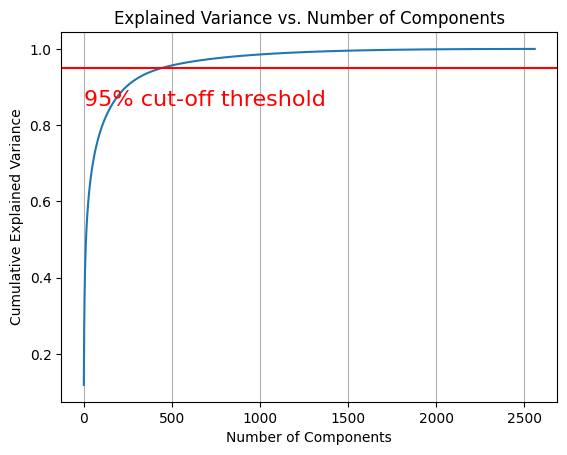

In [33]:
pca_eNetB7 = PCA()  # Adjust the number of components as needed
pca_eNetB7.fit(features_enetB7)
PlotPCAVariance(pca_eNetB7)

In [34]:
pca = PCA(n_components=400)  # Adjust the number of components as needed
reduced_features = pca.fit_transform(features_enetB7)

For n_clusters=3, the silhouette score is 0.10047484189271927
For n_clusters=4, the silhouette score is 0.1012100949883461
For n_clusters=5, the silhouette score is 0.09471560269594193
For n_clusters=6, the silhouette score is 0.09243490546941757
For n_clusters=7, the silhouette score is 0.10209650546312332
Best number of clusters: 7 with silhouette score: 0.10209650546312332


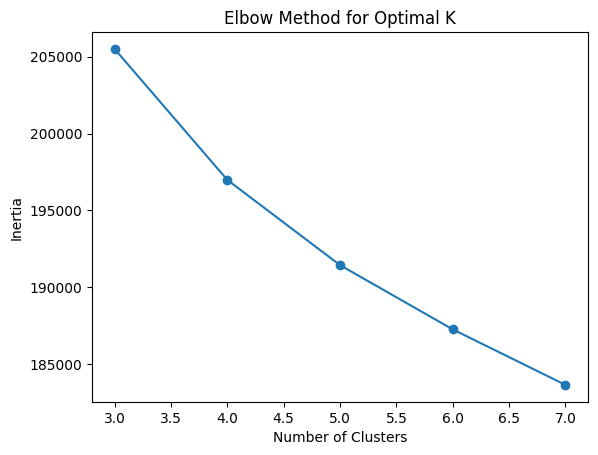

[205506.921875, 196988.5, 191444.125, 187264.28125, 183652.171875]
Optimal number of clusters: 7
Cluster 2: 1132 images
Cluster 6: 505 images
Cluster 7: 263 images
Cluster 5: 577 images
Cluster 1: 589 images
Cluster 3: 369 images
Cluster 4: 234 images


array([1, 5, 6, ..., 3, 1, 1], dtype=int32)

In [17]:
best_n_clusters,distortions = find_Keams_Cluster(features_enetB7)
PlotElowCurve(distortions,best_n_clusters)
Get_ClusterItems(features_enetB7,best_n_clusters)

For n_clusters=3, the silhouette score is 0.10760191082954407
For n_clusters=4, the silhouette score is 0.1098114475607872
For n_clusters=5, the silhouette score is 0.1049935445189476
For n_clusters=6, the silhouette score is 0.10129179060459137
For n_clusters=7, the silhouette score is 0.10622776299715042
Best number of clusters: 4 with silhouette score: 0.1098114475607872


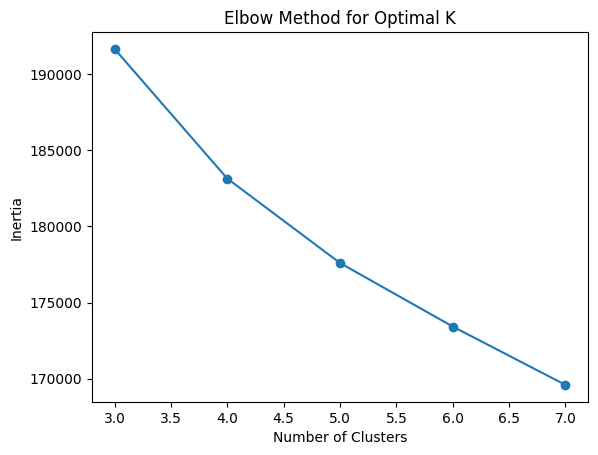

[191658.578125, 183143.890625, 177598.875, 173425.9375, 169592.328125]
Optimal number of clusters: 4
Cluster 3: 1251 images
Cluster 2: 895 images
Cluster 4: 640 images
Cluster 1: 883 images


array([2, 1, 3, ..., 1, 2, 2], dtype=int32)

In [35]:
best_n_clusters,distortions = find_Keams_Cluster(reduced_features)
PlotElowCurve(distortions,best_n_clusters)
Get_ClusterItems(reduced_features,best_n_clusters)